# **0. Load Preliminary Functions**

# a. Import Libraries and Functions

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision import datasets
from torchvision import transforms
from torch.autograd import Variable

import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

import pickle
import itertools
import math

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

%matplotlib inline

# b. MNIST Data Loader

In [ ]:
tensor_transform = transforms.Compose([
    transforms.ToTensor(),
		transforms.Normalize(mean=(0.5, ), std=(0.5, ))
])

batch_size = 128
train_dataset = datasets.MNIST(root = "./data",
									train = True,
									download = True,
									transform = tensor_transform)
test_dataset = datasets.MNIST(root = "./data",
									train = False,
									download = True,
									transform = tensor_transform)

train_loader = torch.utils.data.DataLoader(dataset = train_dataset,
							   batch_size = batch_size,
								 shuffle = True)
test_loader = torch.utils.data.DataLoader(dataset = test_dataset,
							   batch_size = batch_size,
								 shuffle = False)


100%|██████████| 9.91M/9.91M [00:00<00:00, 19.9MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 482kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 4.49MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 13.5MB/s]


# **1. Unconditional GAN**


# a. Training Function for Discriminator

In [ ]:
criterion = nn.BCELoss()

def train_discriminator(discriminator, d_optimizer, images, real_labels, fake_images, fake_labels, with_condition, cls_labels):
    discriminator.zero_grad()
    if with_condition:
      outputs = discriminator(images, cls_labels)
    else:
      outputs = discriminator(images)
    real_loss = criterion(outputs, real_labels.view(-1, 1))
    real_score = outputs

    if with_condition:
      outputs = discriminator(fake_images, cls_labels)
    else:
      outputs = discriminator(fake_images)

    fake_loss = criterion(outputs, fake_labels.view(-1, 1))
    fake_score = outputs

    d_loss = real_loss + fake_loss
    d_loss.backward()
    d_optimizer.step()
    return d_loss, real_score, fake_score, fake_loss

# b. Training Function for Generator

In [ ]:
def train_generator(generator, g_optimizer, discriminator_outputs, real_labels, with_condition):
    generator.zero_grad()
    g_loss = criterion(discriminator_outputs, real_labels.view(-1, 1))
    g_loss_fake = criterion(discriminator_outputs, 1 - real_labels.view(-1, 1))
    g_loss.backward()
    g_optimizer.step()
    return g_loss, g_loss_fake

# c. Monitors for Images and Losses


In [ ]:
def monitor_images(generator, test_noise, with_condition):
    num_test_samples = test_noise.shape[0]
    size_figure_grid = int(math.sqrt(num_test_samples))
    fig, ax = plt.subplots(size_figure_grid, size_figure_grid, figsize=(6, 6))
    for i, j in itertools.product(range(size_figure_grid), range(size_figure_grid)):
        ax[i,j].get_xaxis().set_visible(False)
        ax[i,j].get_yaxis().set_visible(False)

    if with_condition:
      cls_labels = torch.randint(0, 10, (num_test_samples,)).to(device)
      test_images = generator(test_noise, label = cls_labels)
    else:
      test_images = generator(test_noise)

    for k in range(num_test_samples):
        i = k//4
        j = k%4
        ax[i,j].cla()
        ax[i,j].imshow(test_images[k,:].data.cpu().numpy().reshape(28, 28), cmap='Greys')
        if with_condition:
            ax[i, j].set_title(f'Class: {cls_labels[k].item()}', fontsize=10)
    plt.show()


def monitor_losses(d_losses, d_losses_fake, g_losses, g_losses_fake):
    def moving_average(x, win=100):
        return np.convolve(x, np.ones(win), 'same') / np.convolve(np.ones_like(x), np.ones(win), 'same')

    plt.figure(figsize=(10, 5))
    iters = np.arange(len(d_losses))
    epochs = iters * batch_size / 60000
    plt.plot(epochs, moving_average(d_losses), label='d_loss')
    plt.plot(epochs, moving_average(g_losses), label='g_loss')
    plt.plot(epochs, moving_average(d_losses_fake), label='d_loss_fake')
    plt.plot(epochs, moving_average(g_losses_fake), label='g_loss_fake')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()


# c. Model for Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, channels=[512, 256, 128], with_condition=False):
        super().__init__()
        self.with_condition = with_condition
        self.model = None

        ##################
        ### Problem 1: Implement Discriminator
        ##################
        self.model = [
            nn.Linear(784, channels[0]),
            nn.LeakyReLU(),
            nn.Dropout(0.2),
        ]
        for i in range(len(channels) - 1):
            self.model += [
                nn.Linear(channels[i], channels[i + 1]),
                nn.LeakyReLU(),
                nn.Dropout(0.2),
            ]
        self.model += [nn.Linear(channels[-1], 1), nn.Sigmoid()]
        self.model = nn.Sequential(*self.model)

    def forward(self, x, label=None):
        x = x.view(x.size(0), 784)
        if self.with_condition:
            assert label is not None
            ##################
            ### Problem 3: Implement Conditional GAN
            ##################
        out = self.model(x)
        out = out.view(out.size(0), -1)
        return out


with torch.no_grad():
    discriminator = Discriminator(with_condition=False).to(device)
    for iter, (images, labels) in enumerate(test_loader):
        images = images.to(device)  # (128, 1, 28, 8)
        labels = labels.to(device)  # (128,)
        print(discriminator(images, labels).shape)
        break

torch.Size([128, 1])


# e. Model for Generator


In [ ]:
class Generator(nn.Module):
    def __init__(self, dim_z=100, channels=[128, 256, 512], with_condition=False):
        super().__init__()
        self.dim_z = dim_z
        self.with_condition = with_condition

        self.model = None
        ##################
        ### Problem 1: Implement Generator
        ##################
        self.model = [nn.Linear(dim_z, channels[0]), nn.LeakyReLU()]
        for i in range(len(channels) - 1):
            self.model += [nn.Linear(channels[i], channels[i + 1]), nn.LeakyReLU()]
        self.model += [nn.Linear(channels[-1], 784), nn.Tanh()]
        self.model = nn.Sequential(*self.model)

    def forward(self, x, label=None):
        x = x.view(x.size(0), self.dim_z)

        if self.with_condition:
            assert label is not None
            ##################
            ### Problem 3: Implement Conditional GAN
            ##################

        out = self.model(x)
        return out


with torch.no_grad():
    generator = Generator(with_condition=False).to(device)
    noise = Variable(torch.randn(batch_size, generator.dim_z)).to(device)
    print(generator(noise).shape)

torch.Size([128, 784])


# d. Training

In [ ]:
num_batches = len(train_loader)
from google.colab import files

def train_main_loop(generator, discriminator, d_optimizer, g_optimizer, test_noise,
                    num_epochs, d_freq, with_condition):
  d_losses = []
  g_losses = []
  d_losses_fake = []
  g_losses_fake = []
  dim_z = generator.dim_z
  for epoch in range(num_epochs):
      for n, (images, cls_labels) in enumerate(train_loader):
          images = Variable(images.to(device)) # (batch_size, 1, 28, 28)
          real_labels = Variable(torch.ones(images.size(0)).to(device)) # (batch_size, )
          cls_labels = cls_labels.to(device) # (batch_size, )

          # Sample from generator
          noise = Variable(torch.randn(images.size(0), dim_z).to(device)) # (batch_size, dim_z)
          fake_images = generator(noise, label=cls_labels if with_condition else None) # (batch_size, 784)
          fake_labels = Variable(torch.zeros(images.size(0)).to(device)) # (batch_size, )

          # Train the discriminator
          d_loss, real_score, fake_score, d_loss_fake = train_discriminator(discriminator, d_optimizer, images, real_labels, fake_images, fake_labels, with_condition, cls_labels=cls_labels)

          if n % d_freq == 0:
            noise = Variable(torch.randn(images.size(0), dim_z).to(device)) # (batch_size, dim_z)

            # Sample again from the generator and get output from discriminator
            fake_images = generator(noise, label=cls_labels if with_condition else None)
            outputs = discriminator(fake_images, label=cls_labels if with_condition else None)

            # Train the generator
            g_loss, g_loss_fake = train_generator(generator, g_optimizer, outputs, real_labels, with_condition)



          d_losses.append(d_loss.data.detach().cpu().numpy())
          g_losses.append(g_loss.data.detach().cpu().numpy())
          d_losses_fake.append(d_loss_fake.data.detach().cpu().numpy())
          g_losses_fake.append(g_loss_fake.data.detach().cpu().numpy())

          if (n+1) % 100 == 0:
              print('Epoch [%d/%d], Step[%d/%d], d_loss: %.4f, d_loss_fake: %.4f, g_loss: %.4f, g_loss_fake: %.4f, '
                    'D(x): %.2f, D(G(z)): %.2f'
                    %(epoch + 1, num_epochs, n+1, num_batches, d_loss.data, d_loss_fake.data, g_loss.data, g_loss_fake.data,
                      real_score.data.mean(), fake_score.data.mean()))
      if (epoch+1) % 40 == 0:
        path = f'GAN_disc_epoch={epoch+1}.pt'
        torch.save(discriminator.state_dict(), path)
        files.download(path)

        path = f'GAN_gen_epoch={epoch+1}.pt'
        torch.save(generator.state_dict(), path)
        files.download(path)

      monitor_images(generator, test_noise, with_condition=with_condition)
      monitor_losses(d_losses, d_losses_fake, g_losses, g_losses_fake)
  return d_losses, d_losses_fake, g_losses, g_losses_fake

In [ ]:
# set number of epochs and initialize figure counter
dim_z = 100

num_test_samples = 16
test_noise = Variable(torch.randn(num_test_samples, dim_z).to(device))
d_freq = 1

with_condition = False

discriminator = Discriminator(with_condition=with_condition).to(device)
generator = Generator(with_condition=with_condition).to(device)

lr = 0.0002
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr)



Epoch [1/160], Step[100/469], d_loss: 0.9134, d_loss_fake: 0.3862, g_loss: 1.5028, g_loss_fake: 0.3795, D(x): 0.68, D(G(z)): 0.27
Epoch [1/160], Step[200/469], d_loss: 0.8756, d_loss_fake: 0.3862, g_loss: 1.5511, g_loss_fake: 0.3366, D(x): 0.71, D(G(z)): 0.28
Epoch [1/160], Step[300/469], d_loss: 0.9759, d_loss_fake: 0.4113, g_loss: 1.5603, g_loss_fake: 0.3392, D(x): 0.65, D(G(z)): 0.29
Epoch [1/160], Step[400/469], d_loss: 0.9381, d_loss_fake: 0.4226, g_loss: 1.2380, g_loss_fake: 0.5180, D(x): 0.68, D(G(z)): 0.31


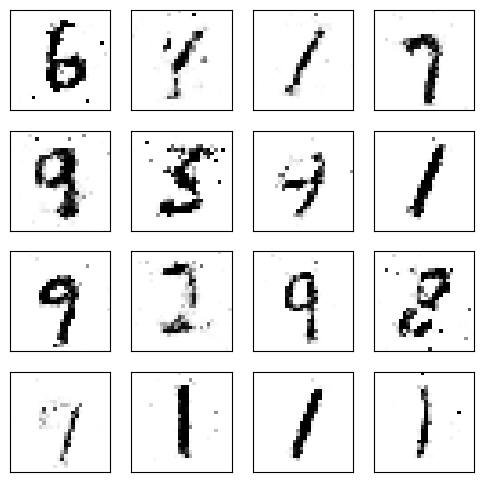

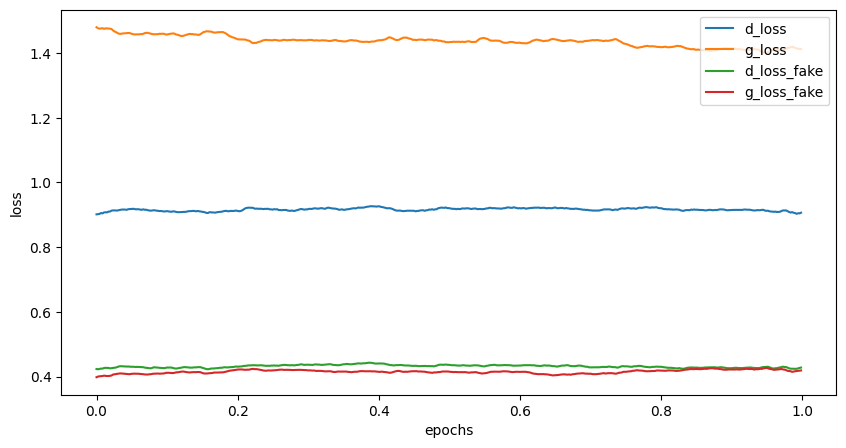

Epoch [2/160], Step[100/469], d_loss: 0.8766, d_loss_fake: 0.3745, g_loss: 1.3854, g_loss_fake: 0.4851, D(x): 0.70, D(G(z)): 0.28
Epoch [2/160], Step[200/469], d_loss: 0.8529, d_loss_fake: 0.3929, g_loss: 1.3781, g_loss_fake: 0.4228, D(x): 0.71, D(G(z)): 0.28
Epoch [2/160], Step[300/469], d_loss: 0.9669, d_loss_fake: 0.5038, g_loss: 1.2822, g_loss_fake: 0.5241, D(x): 0.69, D(G(z)): 0.35
Epoch [2/160], Step[400/469], d_loss: 0.9909, d_loss_fake: 0.4096, g_loss: 1.4602, g_loss_fake: 0.3879, D(x): 0.64, D(G(z)): 0.28


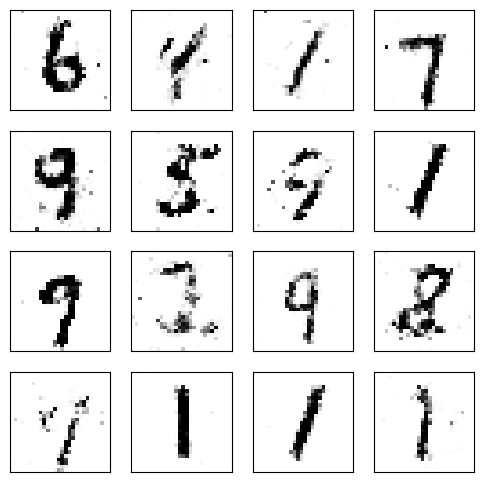

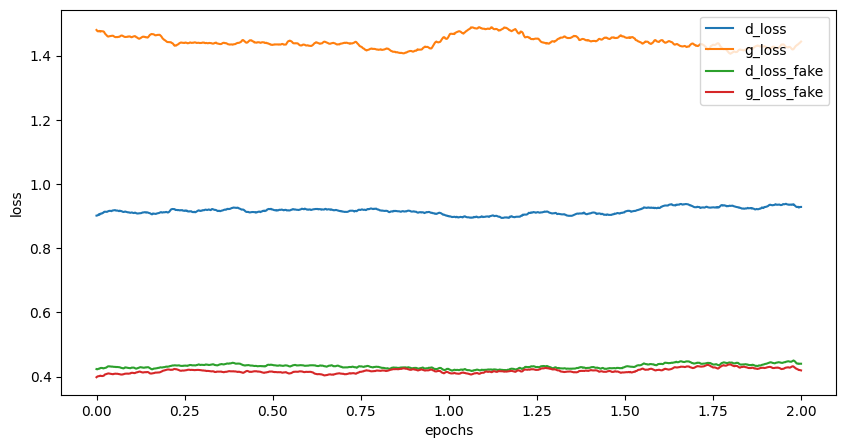

Epoch [3/160], Step[100/469], d_loss: 0.9833, d_loss_fake: 0.4301, g_loss: 1.6342, g_loss_fake: 0.3391, D(x): 0.66, D(G(z)): 0.29
Epoch [3/160], Step[200/469], d_loss: 0.8918, d_loss_fake: 0.3893, g_loss: 1.4484, g_loss_fake: 0.4322, D(x): 0.68, D(G(z)): 0.28
Epoch [3/160], Step[300/469], d_loss: 0.9201, d_loss_fake: 0.4578, g_loss: 1.2176, g_loss_fake: 0.5229, D(x): 0.70, D(G(z)): 0.32
Epoch [3/160], Step[400/469], d_loss: 1.0247, d_loss_fake: 0.6314, g_loss: 1.2387, g_loss_fake: 0.5426, D(x): 0.74, D(G(z)): 0.37


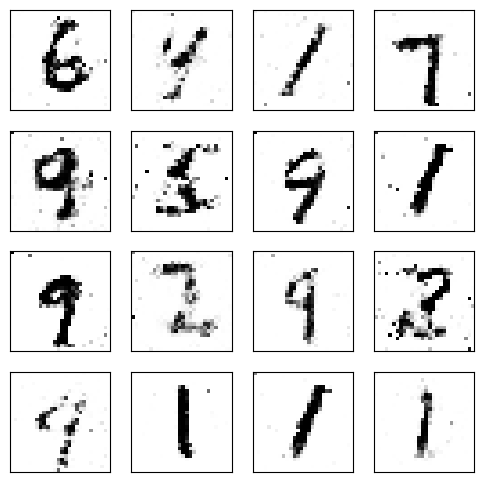

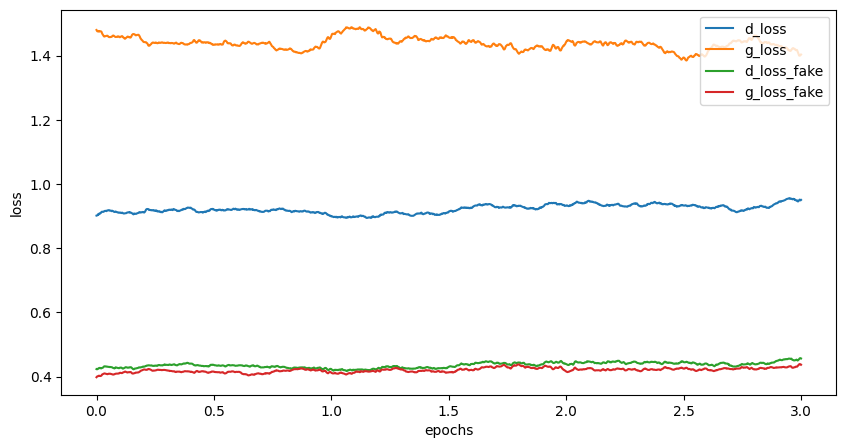

Epoch [4/160], Step[100/469], d_loss: 0.8632, d_loss_fake: 0.4067, g_loss: 1.4295, g_loss_fake: 0.3892, D(x): 0.70, D(G(z)): 0.30
Epoch [4/160], Step[200/469], d_loss: 0.8551, d_loss_fake: 0.4238, g_loss: 1.3972, g_loss_fake: 0.4123, D(x): 0.71, D(G(z)): 0.29
Epoch [4/160], Step[300/469], d_loss: 0.9889, d_loss_fake: 0.4403, g_loss: 1.2836, g_loss_fake: 0.5286, D(x): 0.66, D(G(z)): 0.30
Epoch [4/160], Step[400/469], d_loss: 0.9096, d_loss_fake: 0.4409, g_loss: 1.4351, g_loss_fake: 0.4199, D(x): 0.70, D(G(z)): 0.32


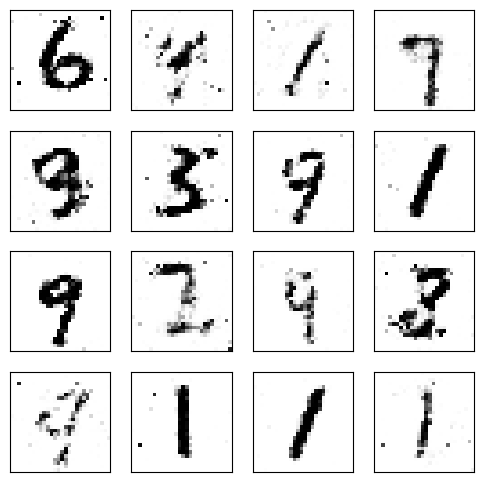

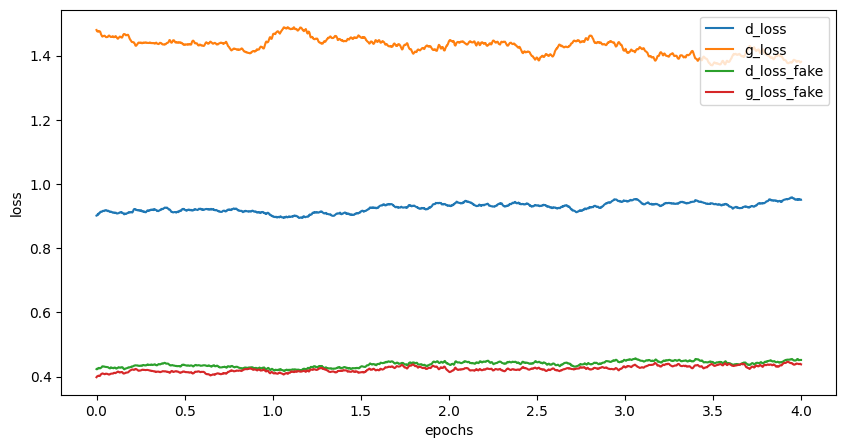

Epoch [5/160], Step[100/469], d_loss: 0.9665, d_loss_fake: 0.5187, g_loss: 1.3217, g_loss_fake: 0.4428, D(x): 0.72, D(G(z)): 0.34
Epoch [5/160], Step[200/469], d_loss: 0.8960, d_loss_fake: 0.4120, g_loss: 1.3221, g_loss_fake: 0.4320, D(x): 0.69, D(G(z)): 0.31
Epoch [5/160], Step[300/469], d_loss: 0.8815, d_loss_fake: 0.4305, g_loss: 1.4254, g_loss_fake: 0.3722, D(x): 0.70, D(G(z)): 0.30
Epoch [5/160], Step[400/469], d_loss: 0.9039, d_loss_fake: 0.4029, g_loss: 1.4685, g_loss_fake: 0.4818, D(x): 0.69, D(G(z)): 0.29


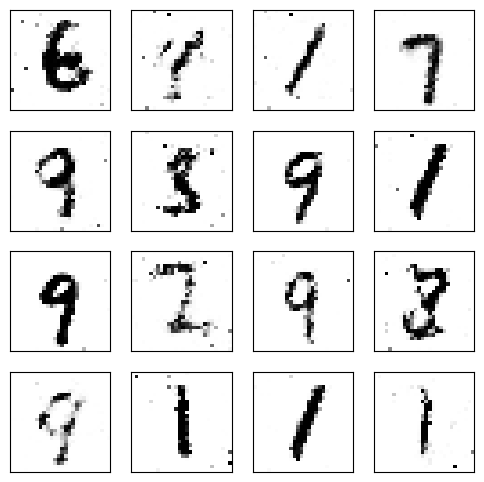

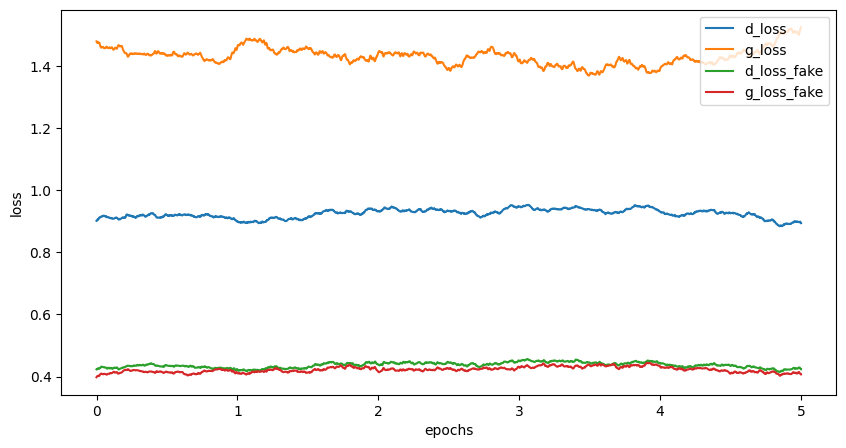

Epoch [6/160], Step[100/469], d_loss: 0.8953, d_loss_fake: 0.3502, g_loss: 1.4574, g_loss_fake: 0.3972, D(x): 0.66, D(G(z)): 0.26
Epoch [6/160], Step[200/469], d_loss: 0.9859, d_loss_fake: 0.4866, g_loss: 1.3528, g_loss_fake: 0.4702, D(x): 0.69, D(G(z)): 0.33
Epoch [6/160], Step[300/469], d_loss: 0.8546, d_loss_fake: 0.3911, g_loss: 1.3355, g_loss_fake: 0.4882, D(x): 0.71, D(G(z)): 0.29
Epoch [6/160], Step[400/469], d_loss: 0.9645, d_loss_fake: 0.4247, g_loss: 1.3850, g_loss_fake: 0.4823, D(x): 0.67, D(G(z)): 0.30


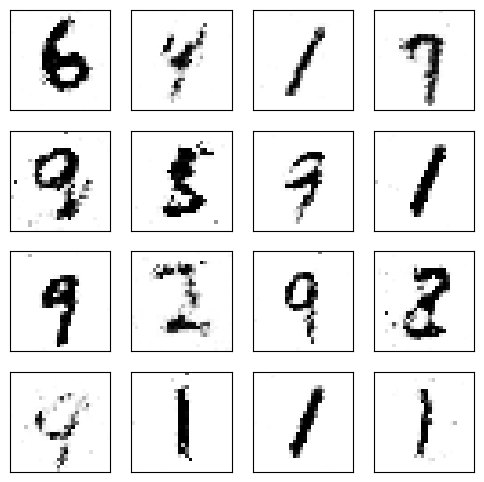

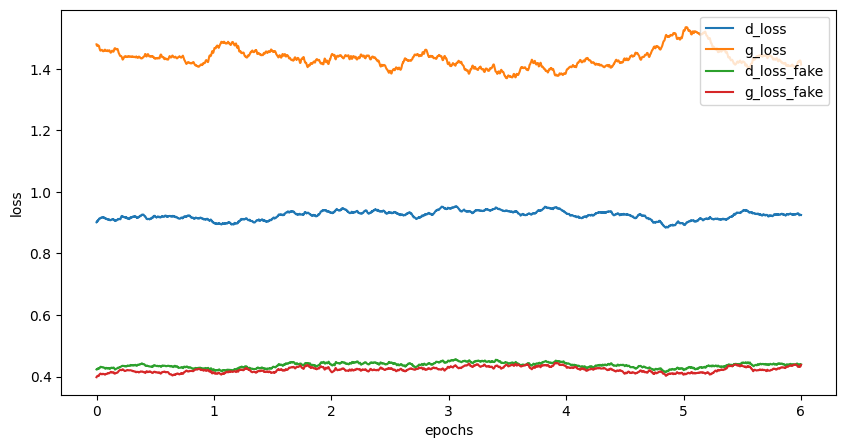

Epoch [7/160], Step[100/469], d_loss: 0.9773, d_loss_fake: 0.4153, g_loss: 1.5311, g_loss_fake: 0.3541, D(x): 0.65, D(G(z)): 0.30
Epoch [7/160], Step[200/469], d_loss: 0.9339, d_loss_fake: 0.4641, g_loss: 1.3617, g_loss_fake: 0.4523, D(x): 0.70, D(G(z)): 0.33
Epoch [7/160], Step[300/469], d_loss: 1.0103, d_loss_fake: 0.6097, g_loss: 1.1249, g_loss_fake: 0.5839, D(x): 0.73, D(G(z)): 0.40
Epoch [7/160], Step[400/469], d_loss: 0.8784, d_loss_fake: 0.3861, g_loss: 1.6284, g_loss_fake: 0.3605, D(x): 0.69, D(G(z)): 0.28


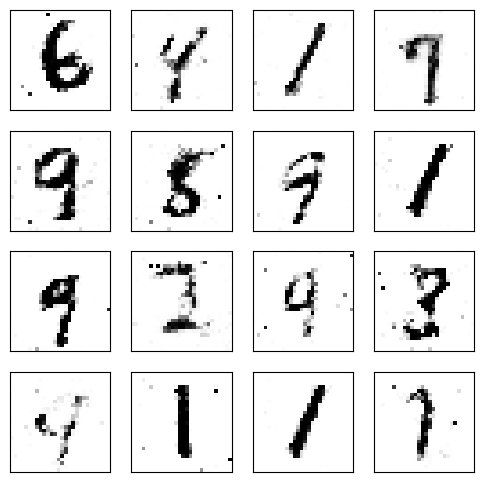

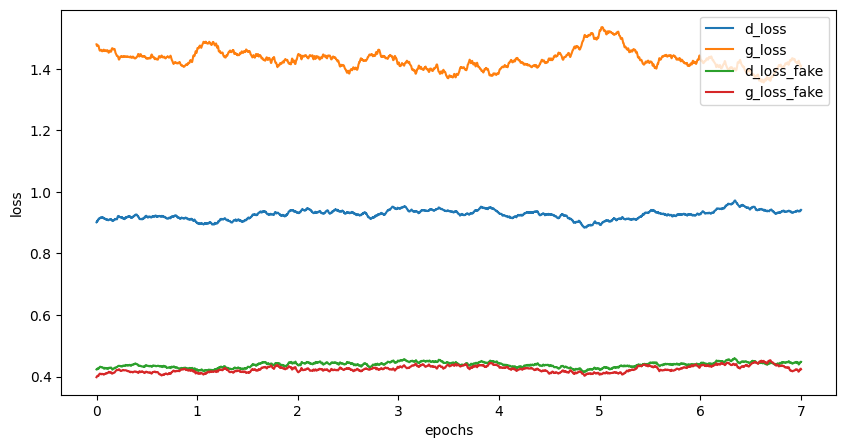

Epoch [8/160], Step[100/469], d_loss: 0.8416, d_loss_fake: 0.4421, g_loss: 1.2247, g_loss_fake: 0.5069, D(x): 0.73, D(G(z)): 0.32
Epoch [8/160], Step[200/469], d_loss: 0.9142, d_loss_fake: 0.4670, g_loss: 1.3505, g_loss_fake: 0.4647, D(x): 0.70, D(G(z)): 0.31
Epoch [8/160], Step[300/469], d_loss: 0.8505, d_loss_fake: 0.4111, g_loss: 1.3701, g_loss_fake: 0.4448, D(x): 0.71, D(G(z)): 0.31
Epoch [8/160], Step[400/469], d_loss: 0.9854, d_loss_fake: 0.5154, g_loss: 1.3463, g_loss_fake: 0.4297, D(x): 0.69, D(G(z)): 0.34


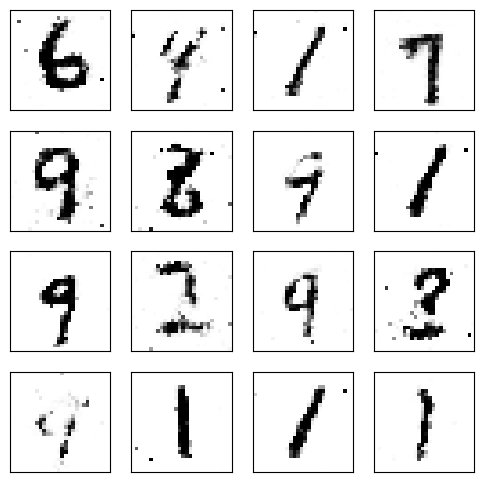

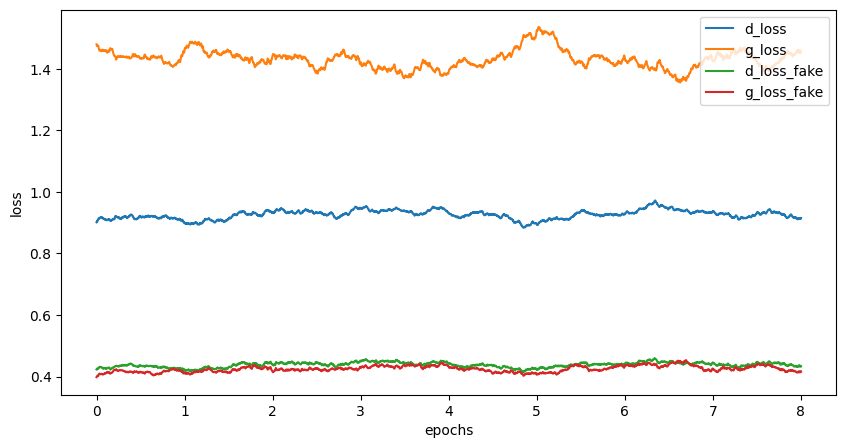

Epoch [9/160], Step[100/469], d_loss: 0.9456, d_loss_fake: 0.3928, g_loss: 1.3070, g_loss_fake: 0.4772, D(x): 0.67, D(G(z)): 0.29
Epoch [9/160], Step[200/469], d_loss: 0.8210, d_loss_fake: 0.3474, g_loss: 1.4279, g_loss_fake: 0.4484, D(x): 0.69, D(G(z)): 0.26
Epoch [9/160], Step[300/469], d_loss: 0.9832, d_loss_fake: 0.3864, g_loss: 1.4628, g_loss_fake: 0.4245, D(x): 0.65, D(G(z)): 0.28
Epoch [9/160], Step[400/469], d_loss: 0.9376, d_loss_fake: 0.3990, g_loss: 1.5499, g_loss_fake: 0.4066, D(x): 0.67, D(G(z)): 0.28


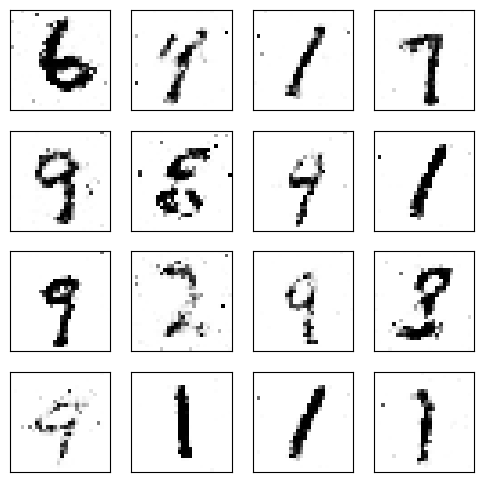

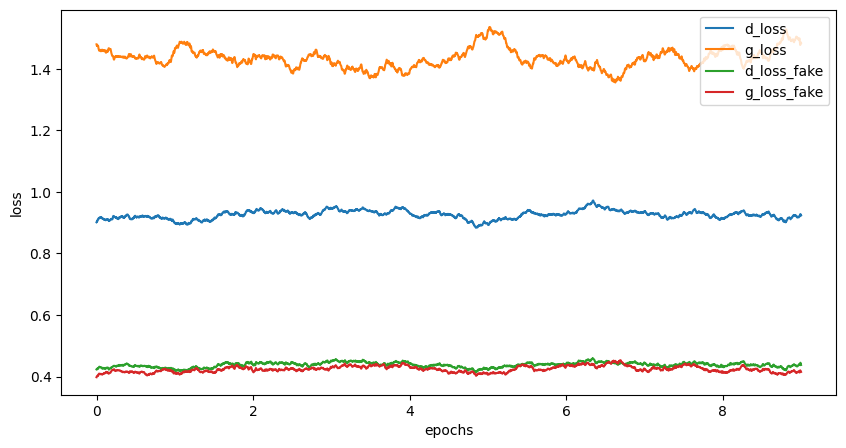

Epoch [10/160], Step[100/469], d_loss: 0.8855, d_loss_fake: 0.4363, g_loss: 1.4166, g_loss_fake: 0.4754, D(x): 0.73, D(G(z)): 0.29
Epoch [10/160], Step[200/469], d_loss: 0.8804, d_loss_fake: 0.4175, g_loss: 1.5616, g_loss_fake: 0.3821, D(x): 0.71, D(G(z)): 0.30
Epoch [10/160], Step[300/469], d_loss: 1.0739, d_loss_fake: 0.4692, g_loss: 1.5396, g_loss_fake: 0.3834, D(x): 0.65, D(G(z)): 0.30
Epoch [10/160], Step[400/469], d_loss: 0.8572, d_loss_fake: 0.3314, g_loss: 1.5751, g_loss_fake: 0.3598, D(x): 0.69, D(G(z)): 0.25


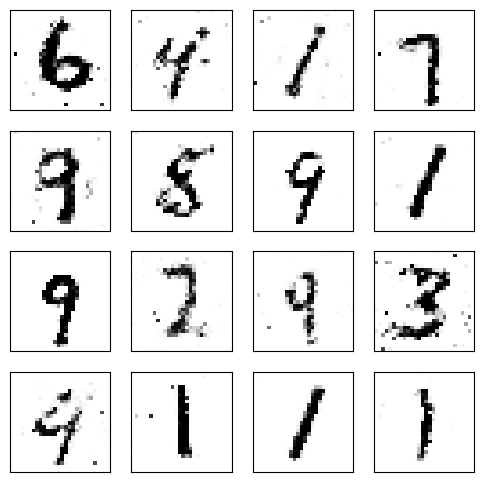

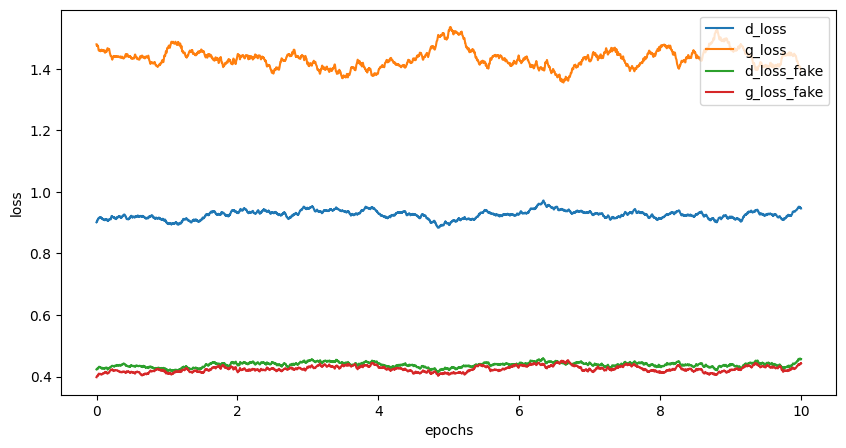

Epoch [11/160], Step[100/469], d_loss: 1.0690, d_loss_fake: 0.6044, g_loss: 1.3751, g_loss_fake: 0.4456, D(x): 0.70, D(G(z)): 0.38
Epoch [11/160], Step[200/469], d_loss: 0.8855, d_loss_fake: 0.3889, g_loss: 1.5462, g_loss_fake: 0.3862, D(x): 0.70, D(G(z)): 0.27
Epoch [11/160], Step[300/469], d_loss: 0.9856, d_loss_fake: 0.5040, g_loss: 1.3766, g_loss_fake: 0.4157, D(x): 0.69, D(G(z)): 0.34
Epoch [11/160], Step[400/469], d_loss: 0.9597, d_loss_fake: 0.4504, g_loss: 1.3618, g_loss_fake: 0.4318, D(x): 0.69, D(G(z)): 0.28


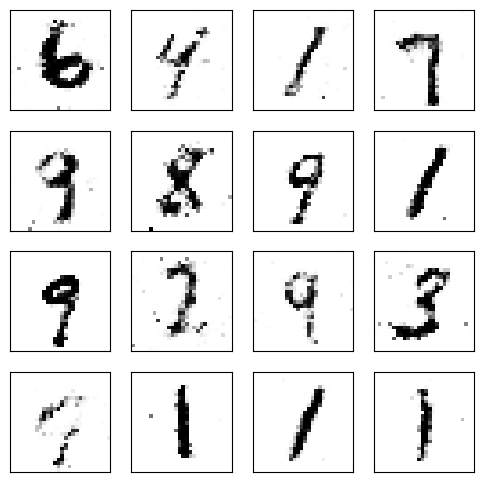

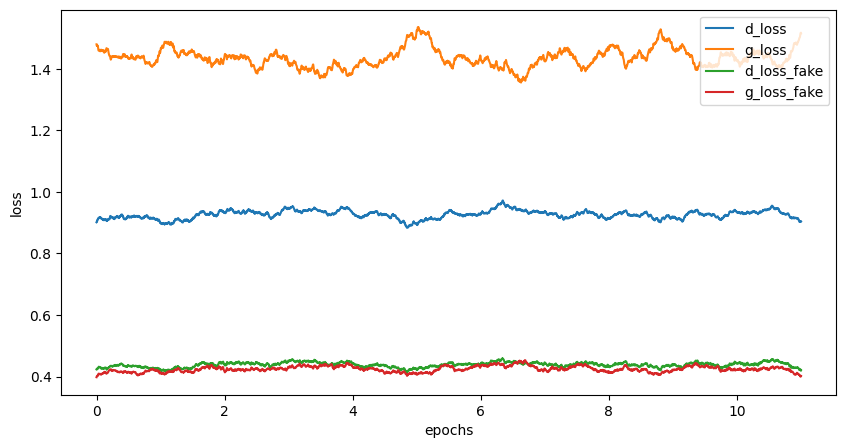

Epoch [12/160], Step[100/469], d_loss: 1.0533, d_loss_fake: 0.5588, g_loss: 1.3940, g_loss_fake: 0.4486, D(x): 0.70, D(G(z)): 0.37
Epoch [12/160], Step[200/469], d_loss: 0.9754, d_loss_fake: 0.4935, g_loss: 1.5046, g_loss_fake: 0.3814, D(x): 0.69, D(G(z)): 0.34
Epoch [12/160], Step[300/469], d_loss: 0.9706, d_loss_fake: 0.5360, g_loss: 1.2320, g_loss_fake: 0.5140, D(x): 0.71, D(G(z)): 0.36
Epoch [12/160], Step[400/469], d_loss: 0.8683, d_loss_fake: 0.4985, g_loss: 1.4848, g_loss_fake: 0.3666, D(x): 0.75, D(G(z)): 0.34


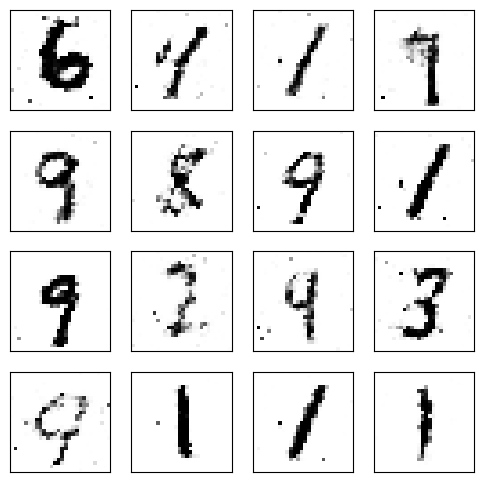

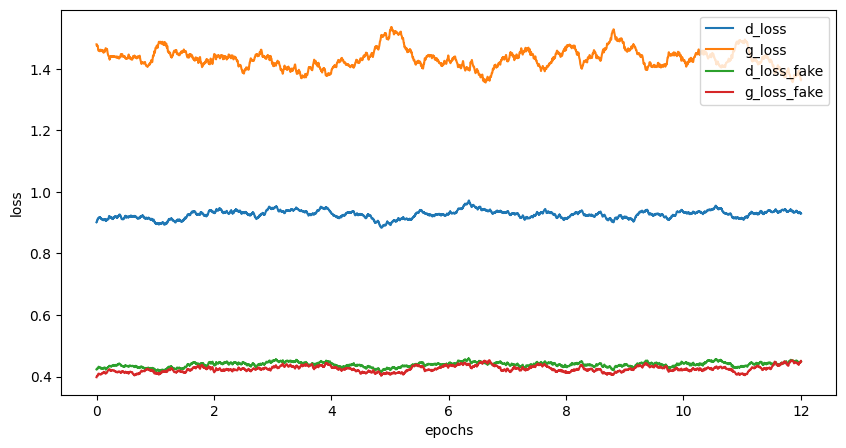

Epoch [13/160], Step[100/469], d_loss: 0.8678, d_loss_fake: 0.4023, g_loss: 1.5314, g_loss_fake: 0.4098, D(x): 0.71, D(G(z)): 0.29
Epoch [13/160], Step[200/469], d_loss: 0.8414, d_loss_fake: 0.4022, g_loss: 1.3733, g_loss_fake: 0.4288, D(x): 0.71, D(G(z)): 0.30
Epoch [13/160], Step[300/469], d_loss: 0.9014, d_loss_fake: 0.3843, g_loss: 1.5171, g_loss_fake: 0.4406, D(x): 0.69, D(G(z)): 0.28
Epoch [13/160], Step[400/469], d_loss: 0.9472, d_loss_fake: 0.4728, g_loss: 1.2439, g_loss_fake: 0.5248, D(x): 0.69, D(G(z)): 0.34


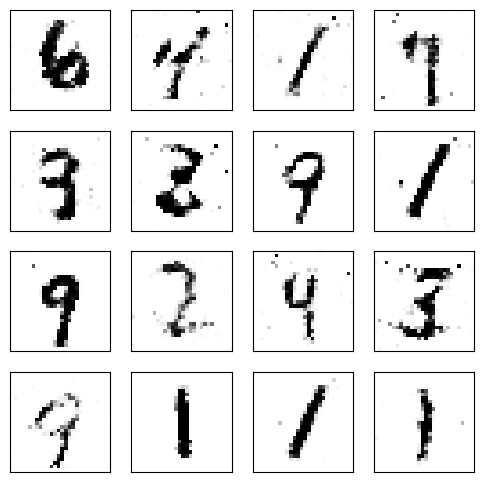

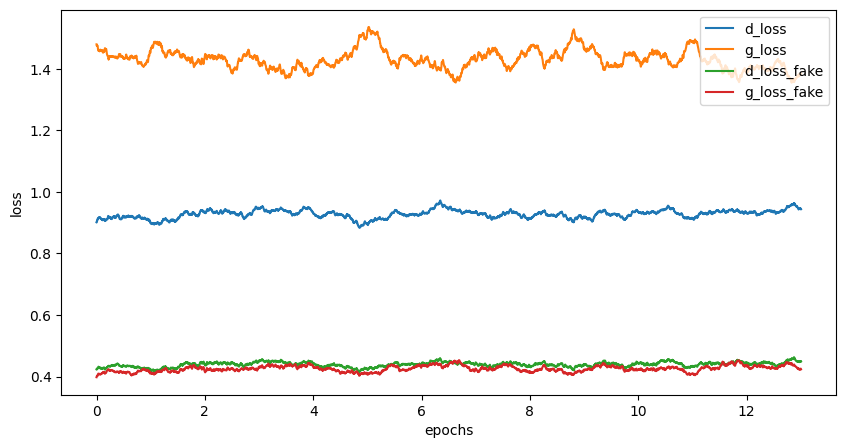

Epoch [14/160], Step[100/469], d_loss: 1.0217, d_loss_fake: 0.4407, g_loss: 1.5045, g_loss_fake: 0.3861, D(x): 0.66, D(G(z)): 0.30
Epoch [14/160], Step[200/469], d_loss: 0.8891, d_loss_fake: 0.4707, g_loss: 1.4193, g_loss_fake: 0.4682, D(x): 0.73, D(G(z)): 0.33
Epoch [14/160], Step[300/469], d_loss: 1.0246, d_loss_fake: 0.4810, g_loss: 1.3488, g_loss_fake: 0.4481, D(x): 0.67, D(G(z)): 0.32
Epoch [14/160], Step[400/469], d_loss: 0.9521, d_loss_fake: 0.4284, g_loss: 1.4090, g_loss_fake: 0.3864, D(x): 0.68, D(G(z)): 0.29


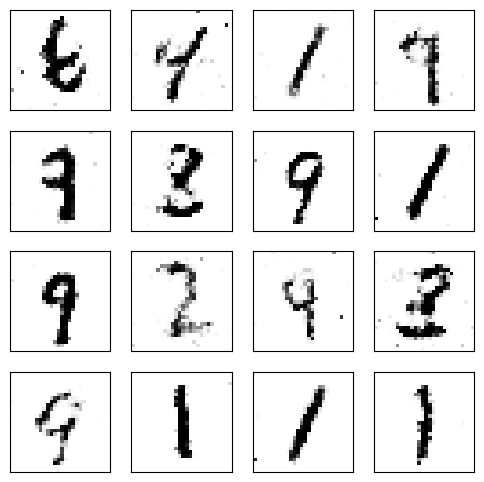

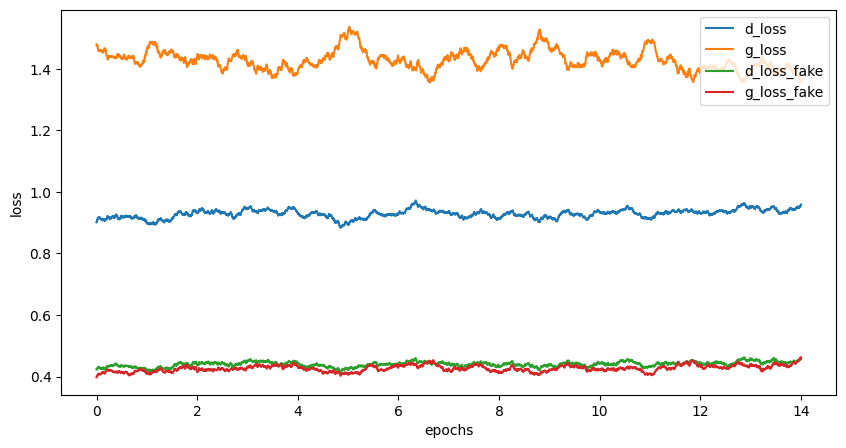

Epoch [15/160], Step[100/469], d_loss: 1.0066, d_loss_fake: 0.4461, g_loss: 1.5640, g_loss_fake: 0.4068, D(x): 0.66, D(G(z)): 0.29
Epoch [15/160], Step[200/469], d_loss: 0.8315, d_loss_fake: 0.3414, g_loss: 1.4288, g_loss_fake: 0.4236, D(x): 0.69, D(G(z)): 0.26
Epoch [15/160], Step[300/469], d_loss: 1.0628, d_loss_fake: 0.5818, g_loss: 1.4556, g_loss_fake: 0.4161, D(x): 0.69, D(G(z)): 0.36
Epoch [15/160], Step[400/469], d_loss: 0.9785, d_loss_fake: 0.3969, g_loss: 1.3774, g_loss_fake: 0.4387, D(x): 0.64, D(G(z)): 0.29


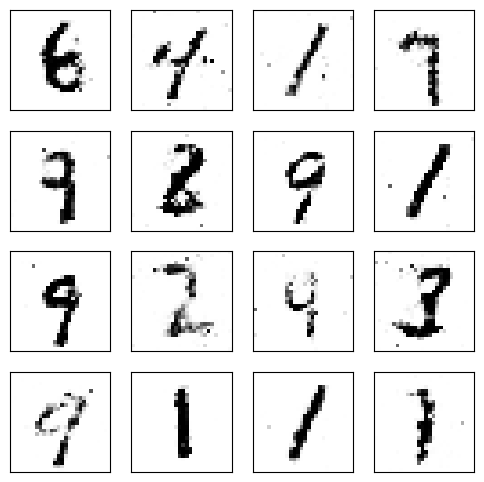

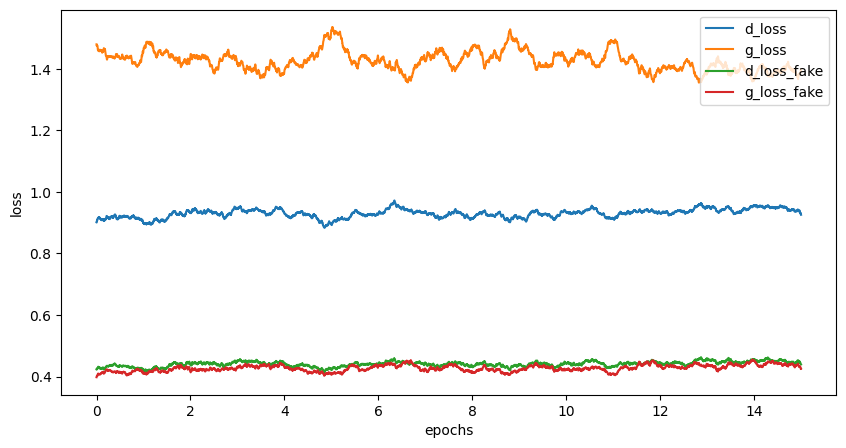

Epoch [16/160], Step[100/469], d_loss: 0.9028, d_loss_fake: 0.4901, g_loss: 1.3936, g_loss_fake: 0.4464, D(x): 0.73, D(G(z)): 0.35
Epoch [16/160], Step[200/469], d_loss: 0.8565, d_loss_fake: 0.4356, g_loss: 1.4206, g_loss_fake: 0.4217, D(x): 0.73, D(G(z)): 0.31
Epoch [16/160], Step[300/469], d_loss: 0.8865, d_loss_fake: 0.3333, g_loss: 1.4727, g_loss_fake: 0.3718, D(x): 0.67, D(G(z)): 0.26
Epoch [16/160], Step[400/469], d_loss: 0.9170, d_loss_fake: 0.5159, g_loss: 1.4116, g_loss_fake: 0.5331, D(x): 0.74, D(G(z)): 0.34


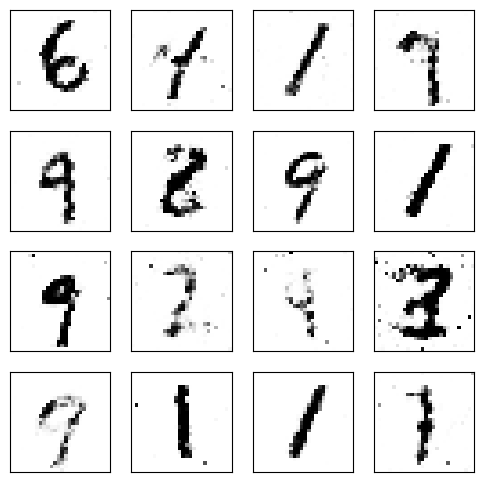

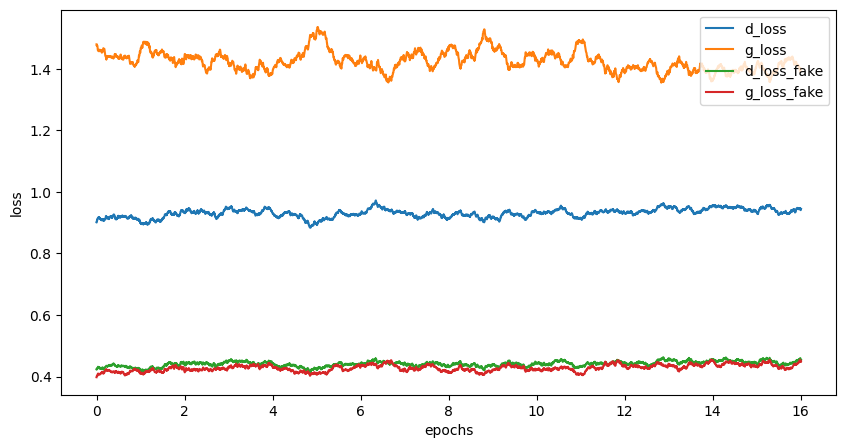

Epoch [17/160], Step[100/469], d_loss: 0.9297, d_loss_fake: 0.3990, g_loss: 1.3575, g_loss_fake: 0.4905, D(x): 0.67, D(G(z)): 0.29
Epoch [17/160], Step[200/469], d_loss: 0.7982, d_loss_fake: 0.3521, g_loss: 1.4366, g_loss_fake: 0.4736, D(x): 0.72, D(G(z)): 0.27
Epoch [17/160], Step[300/469], d_loss: 0.9841, d_loss_fake: 0.4147, g_loss: 1.3575, g_loss_fake: 0.4737, D(x): 0.67, D(G(z)): 0.28
Epoch [17/160], Step[400/469], d_loss: 0.8615, d_loss_fake: 0.4088, g_loss: 1.4145, g_loss_fake: 0.4177, D(x): 0.70, D(G(z)): 0.30


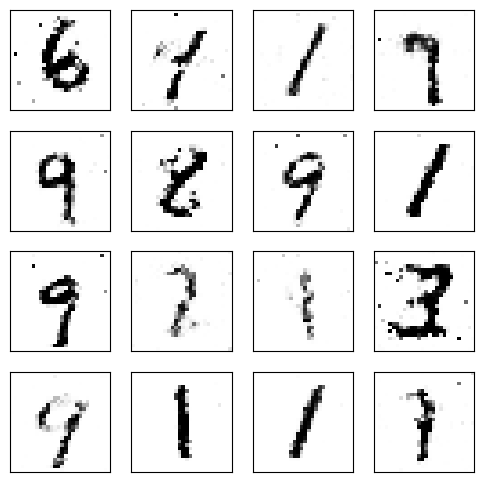

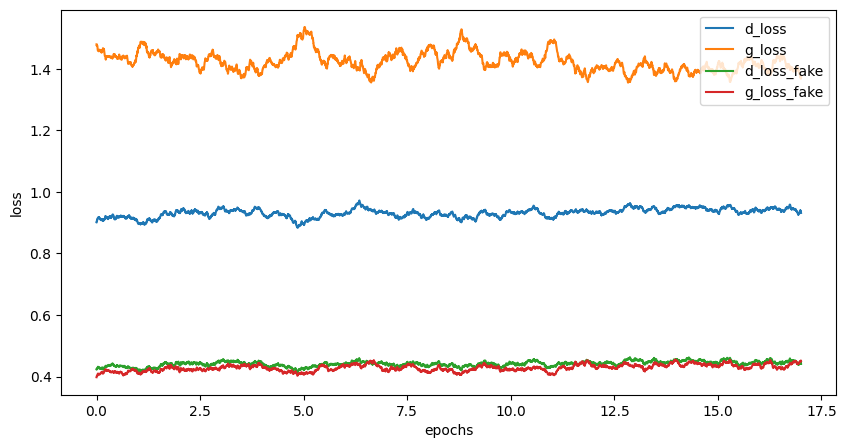

Epoch [18/160], Step[100/469], d_loss: 0.9194, d_loss_fake: 0.4091, g_loss: 1.6949, g_loss_fake: 0.3462, D(x): 0.69, D(G(z)): 0.29
Epoch [18/160], Step[200/469], d_loss: 1.0100, d_loss_fake: 0.4788, g_loss: 1.4001, g_loss_fake: 0.4708, D(x): 0.66, D(G(z)): 0.31
Epoch [18/160], Step[300/469], d_loss: 0.9409, d_loss_fake: 0.5137, g_loss: 1.3681, g_loss_fake: 0.4556, D(x): 0.72, D(G(z)): 0.34
Epoch [18/160], Step[400/469], d_loss: 0.7338, d_loss_fake: 0.4016, g_loss: 1.5089, g_loss_fake: 0.3852, D(x): 0.77, D(G(z)): 0.29


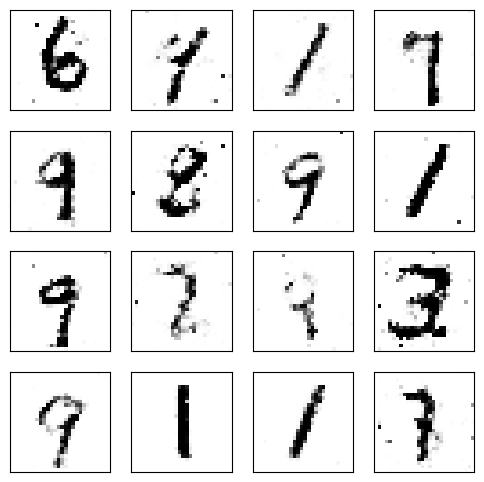

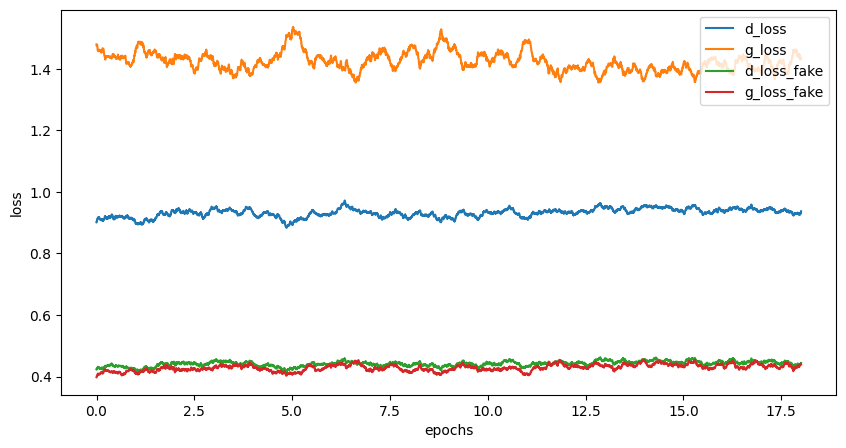

Epoch [19/160], Step[100/469], d_loss: 0.9418, d_loss_fake: 0.3827, g_loss: 1.5072, g_loss_fake: 0.4217, D(x): 0.65, D(G(z)): 0.28
Epoch [19/160], Step[200/469], d_loss: 0.9668, d_loss_fake: 0.5058, g_loss: 1.3353, g_loss_fake: 0.4393, D(x): 0.70, D(G(z)): 0.33
Epoch [19/160], Step[300/469], d_loss: 1.1050, d_loss_fake: 0.5032, g_loss: 1.2523, g_loss_fake: 0.4843, D(x): 0.63, D(G(z)): 0.35
Epoch [19/160], Step[400/469], d_loss: 0.9181, d_loss_fake: 0.3878, g_loss: 1.4347, g_loss_fake: 0.4070, D(x): 0.68, D(G(z)): 0.29


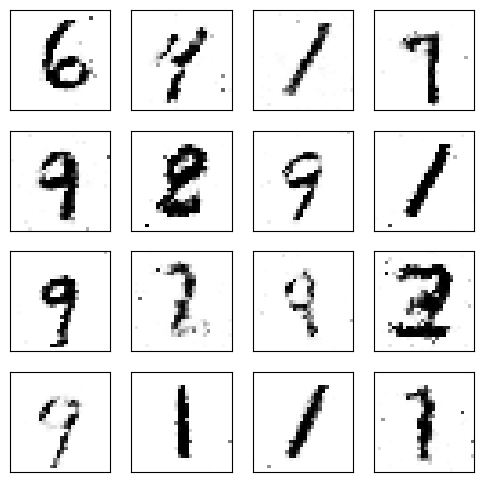

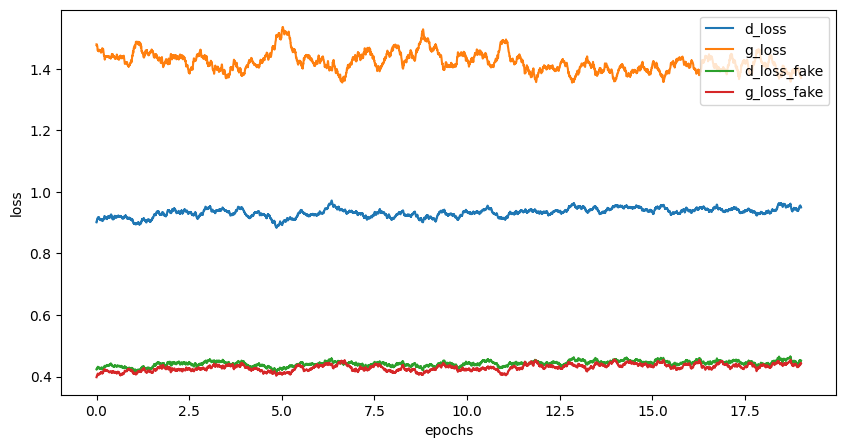

Epoch [20/160], Step[100/469], d_loss: 0.9706, d_loss_fake: 0.4443, g_loss: 1.3577, g_loss_fake: 0.4194, D(x): 0.67, D(G(z)): 0.31
Epoch [20/160], Step[200/469], d_loss: 0.8826, d_loss_fake: 0.4012, g_loss: 1.6150, g_loss_fake: 0.3673, D(x): 0.70, D(G(z)): 0.28
Epoch [20/160], Step[300/469], d_loss: 0.9434, d_loss_fake: 0.5178, g_loss: 1.3226, g_loss_fake: 0.4528, D(x): 0.73, D(G(z)): 0.33
Epoch [20/160], Step[400/469], d_loss: 1.0106, d_loss_fake: 0.4809, g_loss: 1.3480, g_loss_fake: 0.4525, D(x): 0.68, D(G(z)): 0.33


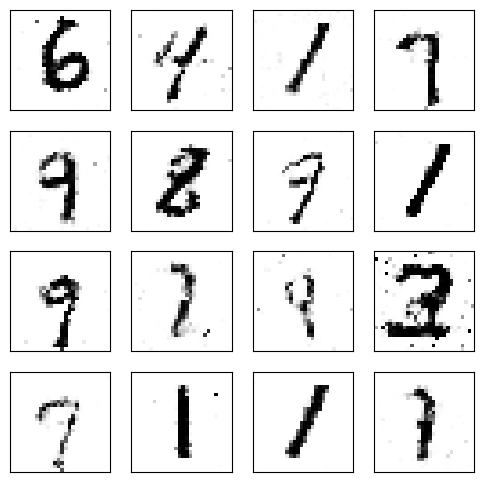

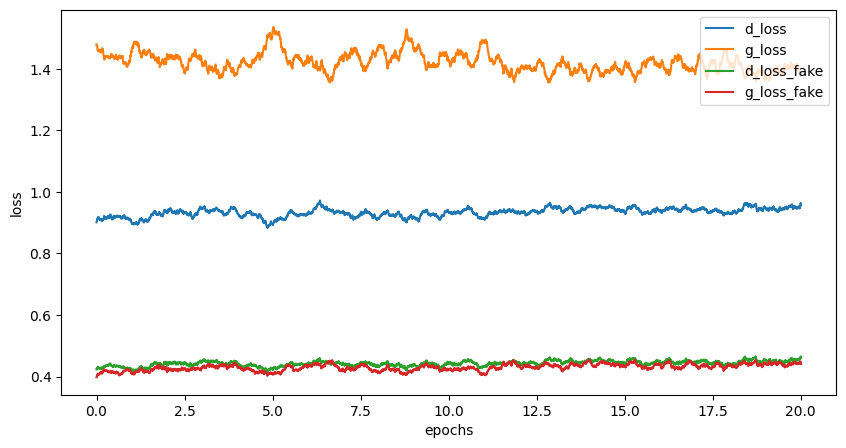

Epoch [21/160], Step[100/469], d_loss: 0.9061, d_loss_fake: 0.4552, g_loss: 1.4904, g_loss_fake: 0.4006, D(x): 0.71, D(G(z)): 0.32
Epoch [21/160], Step[200/469], d_loss: 0.9266, d_loss_fake: 0.4339, g_loss: 1.2838, g_loss_fake: 0.4632, D(x): 0.68, D(G(z)): 0.30
Epoch [21/160], Step[300/469], d_loss: 0.9785, d_loss_fake: 0.4300, g_loss: 1.4207, g_loss_fake: 0.3887, D(x): 0.67, D(G(z)): 0.31
Epoch [21/160], Step[400/469], d_loss: 1.0404, d_loss_fake: 0.5322, g_loss: 1.4896, g_loss_fake: 0.3888, D(x): 0.69, D(G(z)): 0.34


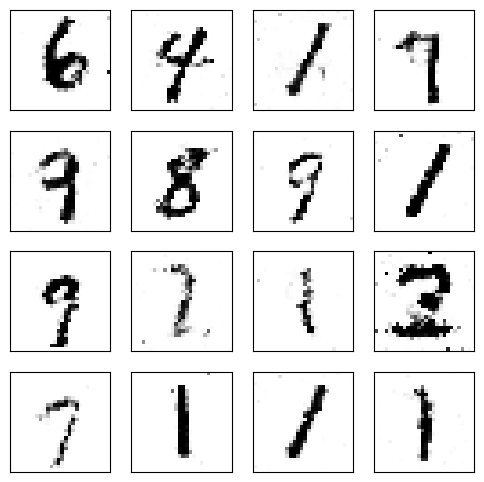

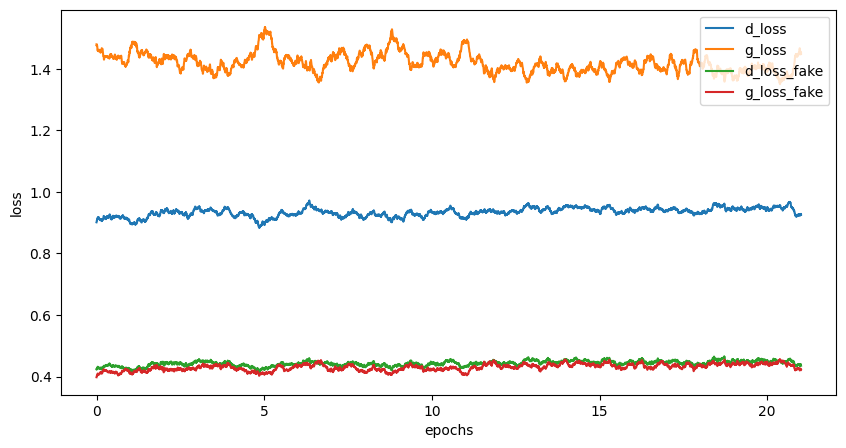

Epoch [22/160], Step[100/469], d_loss: 0.9796, d_loss_fake: 0.5513, g_loss: 1.3065, g_loss_fake: 0.5330, D(x): 0.72, D(G(z)): 0.36
Epoch [22/160], Step[200/469], d_loss: 1.0191, d_loss_fake: 0.5080, g_loss: 1.3049, g_loss_fake: 0.4717, D(x): 0.69, D(G(z)): 0.33
Epoch [22/160], Step[300/469], d_loss: 1.0342, d_loss_fake: 0.5245, g_loss: 1.4044, g_loss_fake: 0.4315, D(x): 0.68, D(G(z)): 0.34
Epoch [22/160], Step[400/469], d_loss: 0.9335, d_loss_fake: 0.4123, g_loss: 1.3026, g_loss_fake: 0.4783, D(x): 0.67, D(G(z)): 0.30


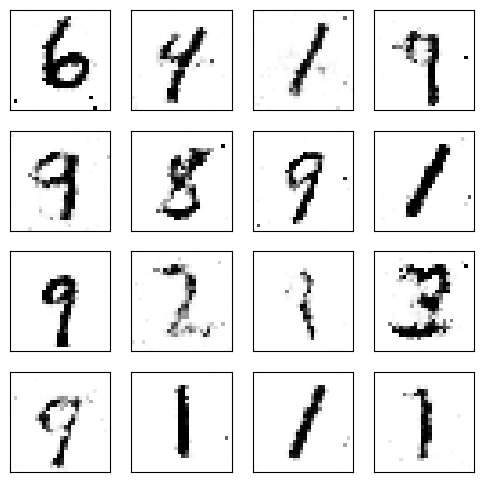

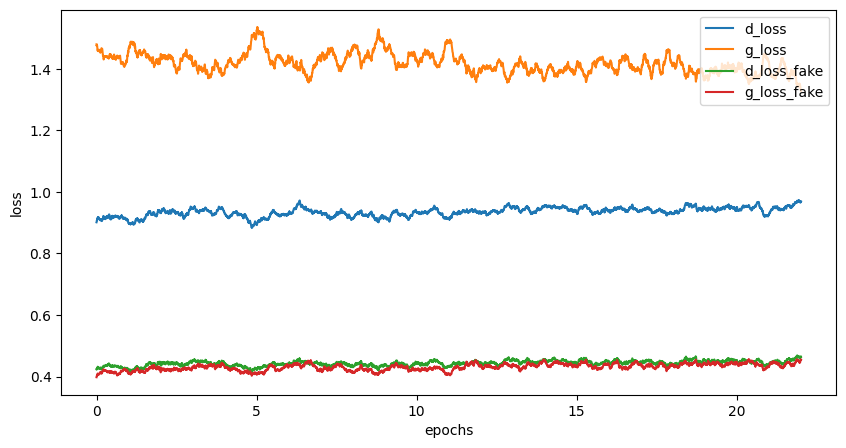

Epoch [23/160], Step[100/469], d_loss: 0.9086, d_loss_fake: 0.4090, g_loss: 1.2421, g_loss_fake: 0.5081, D(x): 0.70, D(G(z)): 0.31
Epoch [23/160], Step[200/469], d_loss: 0.8807, d_loss_fake: 0.4453, g_loss: 1.5012, g_loss_fake: 0.3702, D(x): 0.72, D(G(z)): 0.30
Epoch [23/160], Step[300/469], d_loss: 1.0045, d_loss_fake: 0.5067, g_loss: 1.2737, g_loss_fake: 0.5778, D(x): 0.68, D(G(z)): 0.33
Epoch [23/160], Step[400/469], d_loss: 1.0037, d_loss_fake: 0.5602, g_loss: 1.1392, g_loss_fake: 0.5646, D(x): 0.71, D(G(z)): 0.37


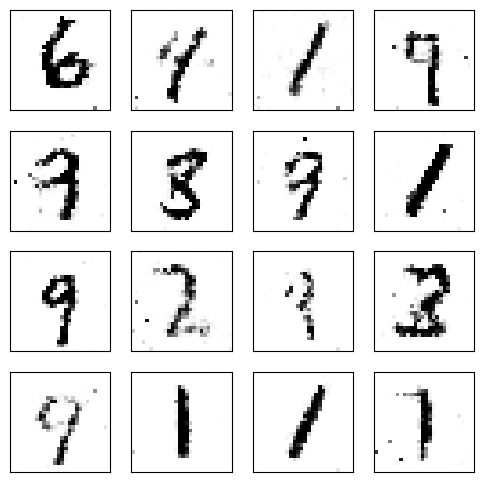

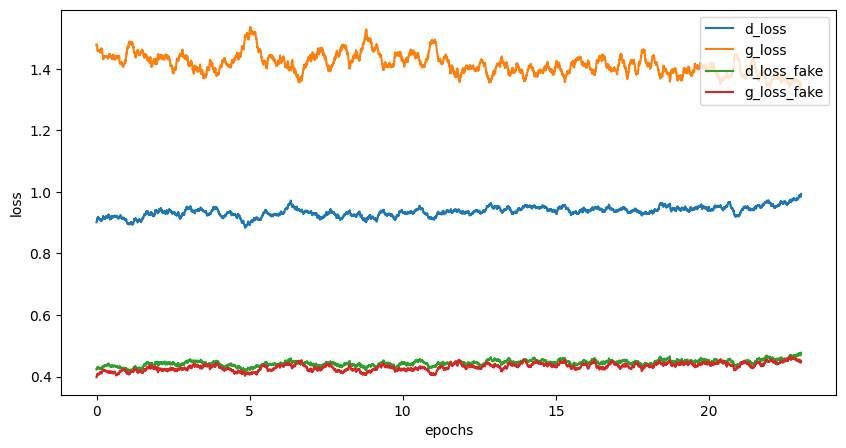

Epoch [24/160], Step[100/469], d_loss: 0.9062, d_loss_fake: 0.4642, g_loss: 1.4782, g_loss_fake: 0.3631, D(x): 0.71, D(G(z)): 0.34
Epoch [24/160], Step[200/469], d_loss: 1.0422, d_loss_fake: 0.4718, g_loss: 1.5032, g_loss_fake: 0.3822, D(x): 0.65, D(G(z)): 0.33
Epoch [24/160], Step[300/469], d_loss: 0.9885, d_loss_fake: 0.4830, g_loss: 1.2956, g_loss_fake: 0.4824, D(x): 0.68, D(G(z)): 0.32
Epoch [24/160], Step[400/469], d_loss: 0.9010, d_loss_fake: 0.4379, g_loss: 1.6851, g_loss_fake: 0.3358, D(x): 0.70, D(G(z)): 0.31


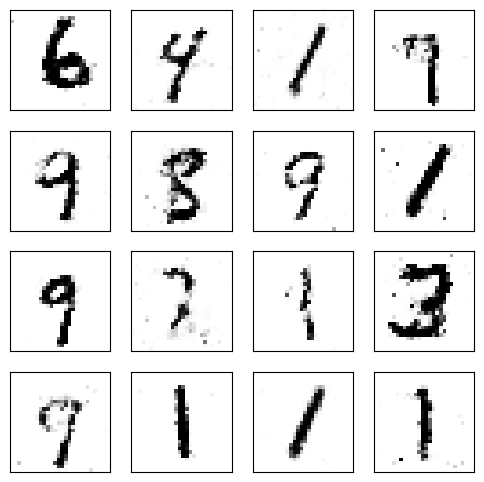

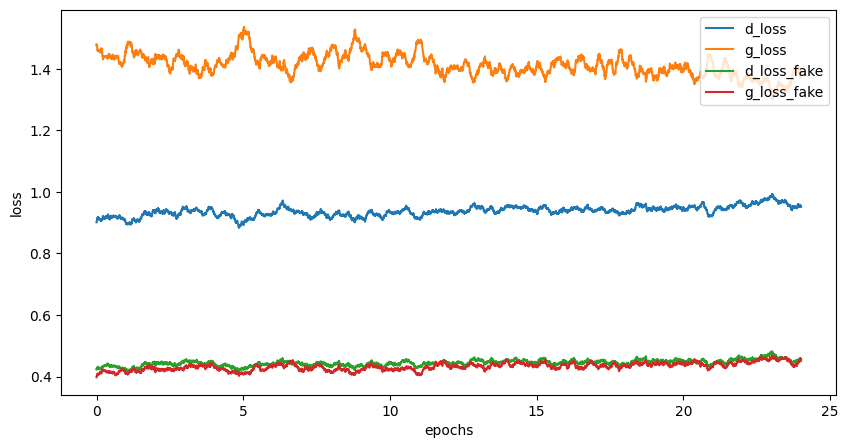

Epoch [25/160], Step[100/469], d_loss: 0.9432, d_loss_fake: 0.4380, g_loss: 1.3186, g_loss_fake: 0.4565, D(x): 0.67, D(G(z)): 0.32
Epoch [25/160], Step[200/469], d_loss: 0.9829, d_loss_fake: 0.4518, g_loss: 1.3383, g_loss_fake: 0.3985, D(x): 0.66, D(G(z)): 0.31
Epoch [25/160], Step[300/469], d_loss: 0.8941, d_loss_fake: 0.4123, g_loss: 1.4640, g_loss_fake: 0.4268, D(x): 0.69, D(G(z)): 0.31
Epoch [25/160], Step[400/469], d_loss: 0.9276, d_loss_fake: 0.4046, g_loss: 1.3697, g_loss_fake: 0.3951, D(x): 0.67, D(G(z)): 0.29


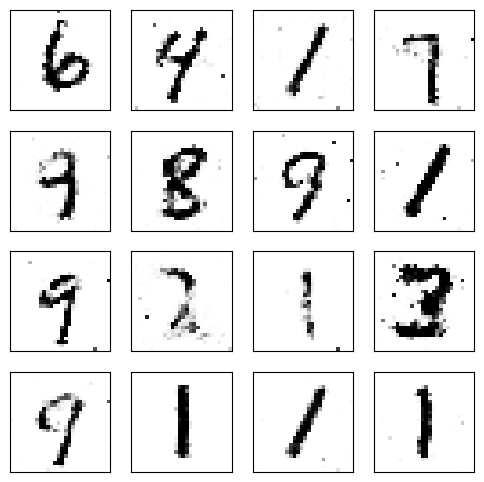

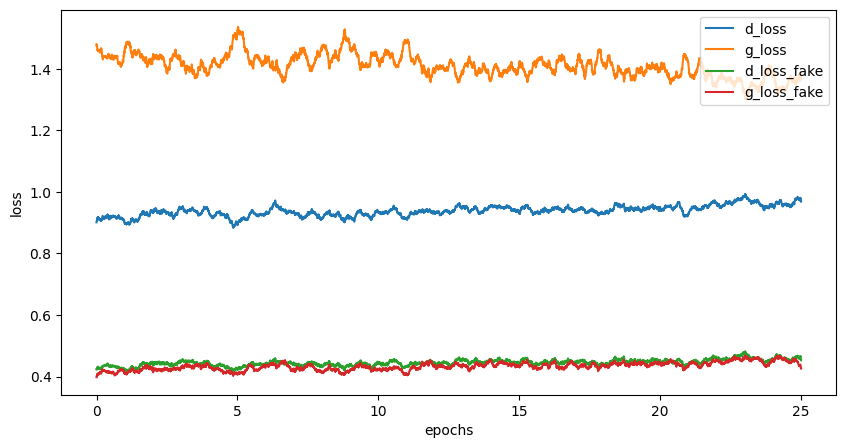

Epoch [26/160], Step[100/469], d_loss: 0.9624, d_loss_fake: 0.4550, g_loss: 1.2666, g_loss_fake: 0.5023, D(x): 0.69, D(G(z)): 0.33
Epoch [26/160], Step[200/469], d_loss: 1.0353, d_loss_fake: 0.4542, g_loss: 1.4209, g_loss_fake: 0.4294, D(x): 0.64, D(G(z)): 0.32
Epoch [26/160], Step[300/469], d_loss: 0.9117, d_loss_fake: 0.4475, g_loss: 1.5374, g_loss_fake: 0.3656, D(x): 0.70, D(G(z)): 0.32
Epoch [26/160], Step[400/469], d_loss: 0.9283, d_loss_fake: 0.4276, g_loss: 1.1715, g_loss_fake: 0.5368, D(x): 0.70, D(G(z)): 0.30


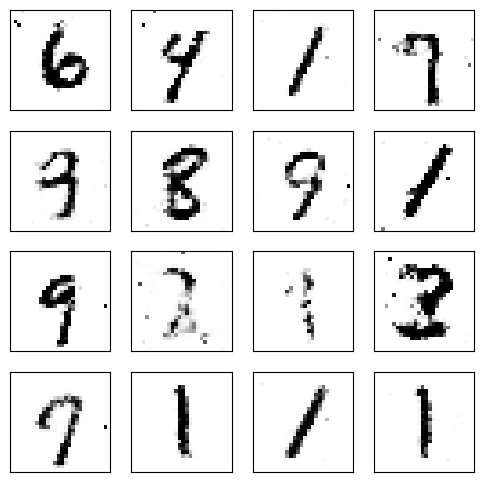

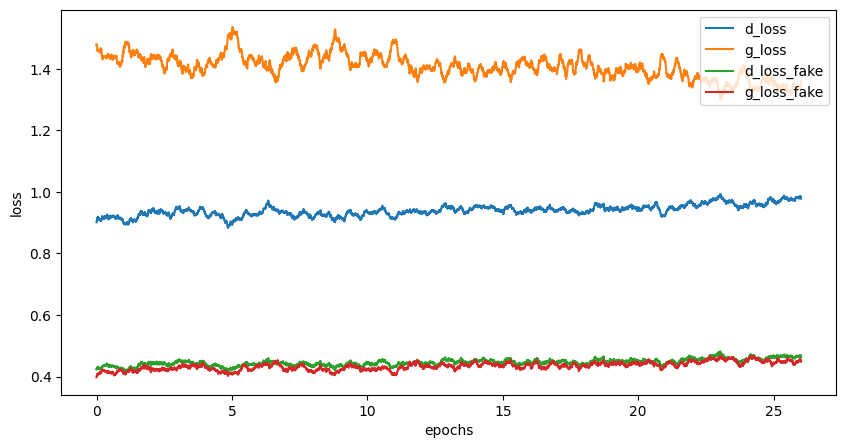

Epoch [27/160], Step[100/469], d_loss: 0.9227, d_loss_fake: 0.4844, g_loss: 1.3553, g_loss_fake: 0.4459, D(x): 0.71, D(G(z)): 0.33
Epoch [27/160], Step[200/469], d_loss: 0.9827, d_loss_fake: 0.4809, g_loss: 1.4381, g_loss_fake: 0.3924, D(x): 0.69, D(G(z)): 0.33
Epoch [27/160], Step[300/469], d_loss: 0.9529, d_loss_fake: 0.4643, g_loss: 1.4320, g_loss_fake: 0.4348, D(x): 0.69, D(G(z)): 0.32
Epoch [27/160], Step[400/469], d_loss: 1.0073, d_loss_fake: 0.5551, g_loss: 1.4122, g_loss_fake: 0.4287, D(x): 0.70, D(G(z)): 0.37


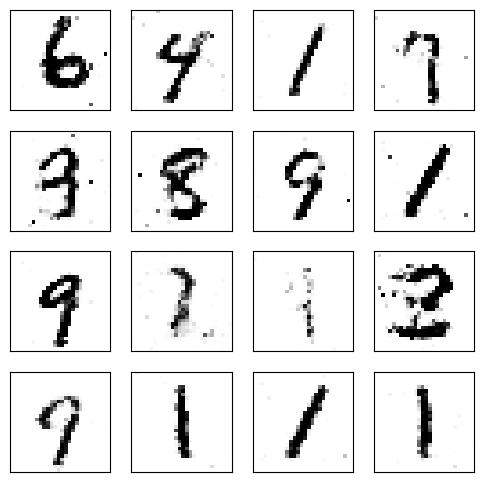

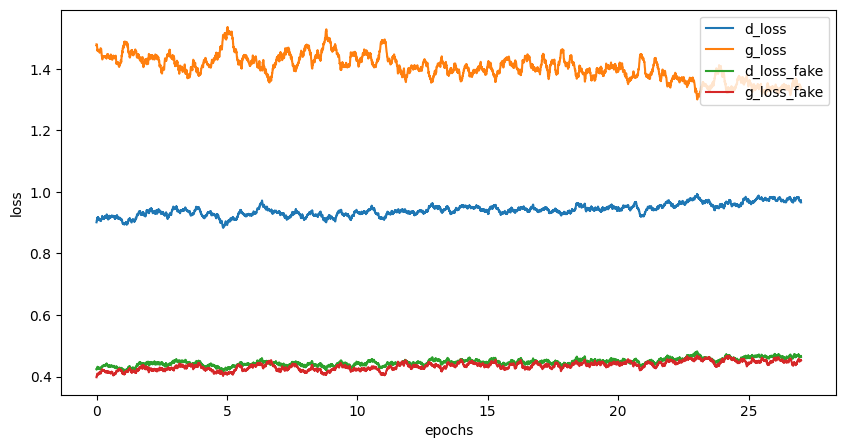

Epoch [28/160], Step[100/469], d_loss: 1.0361, d_loss_fake: 0.5103, g_loss: 1.5165, g_loss_fake: 0.3804, D(x): 0.67, D(G(z)): 0.35
Epoch [28/160], Step[200/469], d_loss: 1.0250, d_loss_fake: 0.4848, g_loss: 1.3122, g_loss_fake: 0.5478, D(x): 0.65, D(G(z)): 0.33
Epoch [28/160], Step[300/469], d_loss: 0.9799, d_loss_fake: 0.4460, g_loss: 1.2652, g_loss_fake: 0.4895, D(x): 0.66, D(G(z)): 0.31
Epoch [28/160], Step[400/469], d_loss: 0.9859, d_loss_fake: 0.4388, g_loss: 1.3938, g_loss_fake: 0.4174, D(x): 0.66, D(G(z)): 0.32


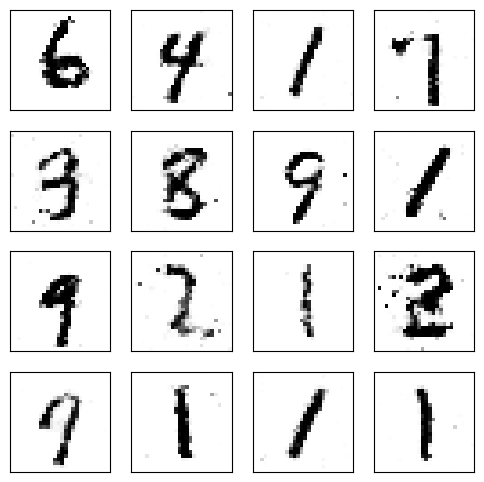

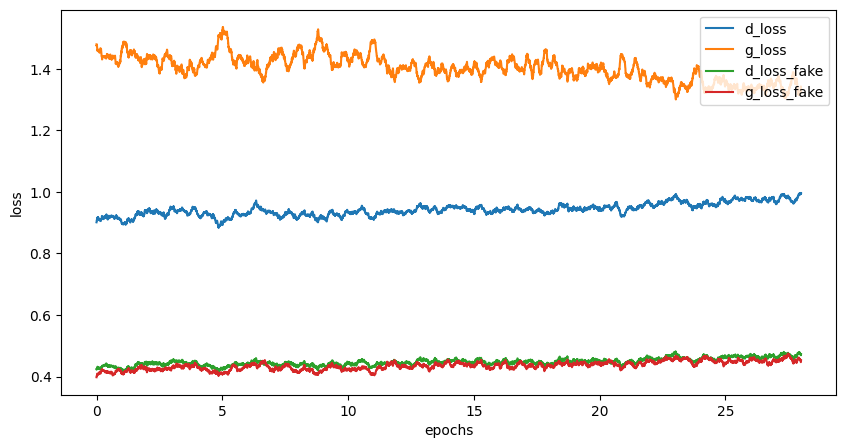

Epoch [29/160], Step[100/469], d_loss: 1.0047, d_loss_fake: 0.5571, g_loss: 1.2517, g_loss_fake: 0.5378, D(x): 0.71, D(G(z)): 0.37
Epoch [29/160], Step[200/469], d_loss: 1.0561, d_loss_fake: 0.5126, g_loss: 1.3333, g_loss_fake: 0.4361, D(x): 0.65, D(G(z)): 0.35
Epoch [29/160], Step[300/469], d_loss: 0.9252, d_loss_fake: 0.4975, g_loss: 1.2689, g_loss_fake: 0.4739, D(x): 0.73, D(G(z)): 0.35
Epoch [29/160], Step[400/469], d_loss: 0.8822, d_loss_fake: 0.4984, g_loss: 1.1801, g_loss_fake: 0.5279, D(x): 0.74, D(G(z)): 0.34


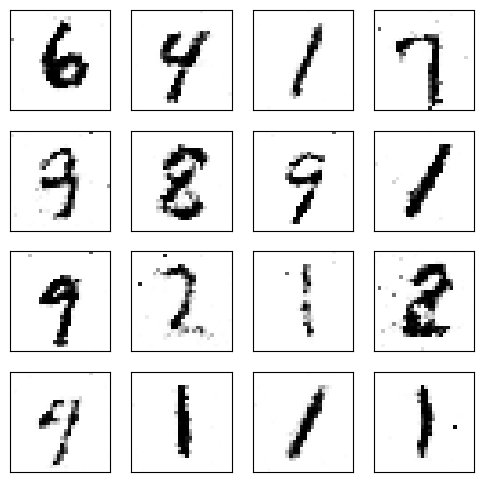

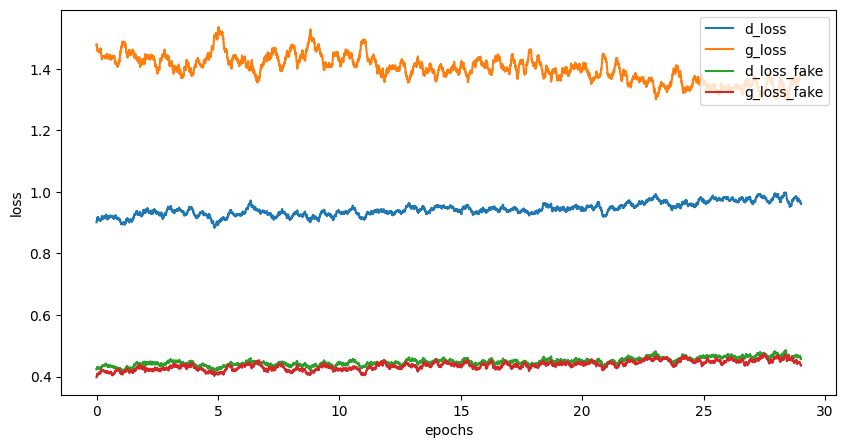

Epoch [30/160], Step[100/469], d_loss: 0.9321, d_loss_fake: 0.4291, g_loss: 1.3004, g_loss_fake: 0.5352, D(x): 0.68, D(G(z)): 0.31
Epoch [30/160], Step[200/469], d_loss: 1.0374, d_loss_fake: 0.4918, g_loss: 1.4285, g_loss_fake: 0.4200, D(x): 0.66, D(G(z)): 0.33
Epoch [30/160], Step[300/469], d_loss: 1.0396, d_loss_fake: 0.5725, g_loss: 1.2551, g_loss_fake: 0.5296, D(x): 0.69, D(G(z)): 0.37
Epoch [30/160], Step[400/469], d_loss: 1.0300, d_loss_fake: 0.5409, g_loss: 1.3430, g_loss_fake: 0.4480, D(x): 0.68, D(G(z)): 0.36


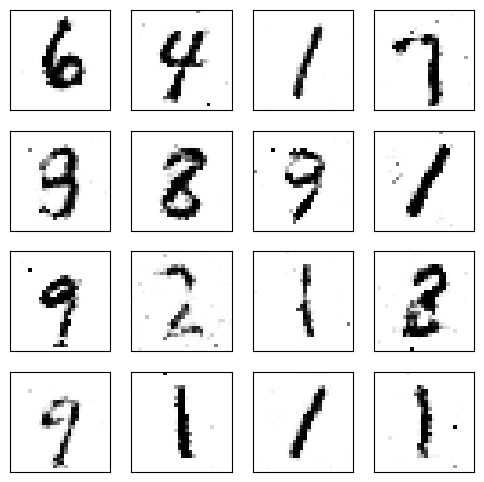

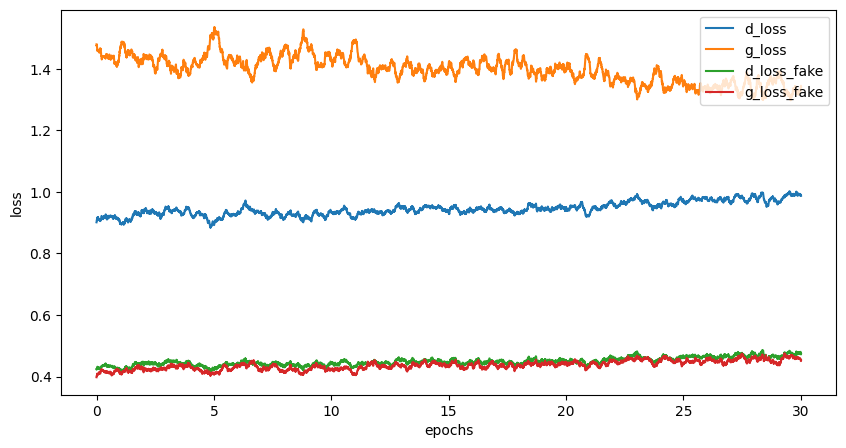

Epoch [31/160], Step[100/469], d_loss: 1.1186, d_loss_fake: 0.5163, g_loss: 1.1640, g_loss_fake: 0.5631, D(x): 0.64, D(G(z)): 0.34
Epoch [31/160], Step[200/469], d_loss: 1.0760, d_loss_fake: 0.5274, g_loss: 1.3304, g_loss_fake: 0.4288, D(x): 0.64, D(G(z)): 0.35
Epoch [31/160], Step[300/469], d_loss: 1.0419, d_loss_fake: 0.4164, g_loss: 1.3392, g_loss_fake: 0.4278, D(x): 0.61, D(G(z)): 0.30
Epoch [31/160], Step[400/469], d_loss: 0.9376, d_loss_fake: 0.3986, g_loss: 1.3581, g_loss_fake: 0.4092, D(x): 0.68, D(G(z)): 0.29


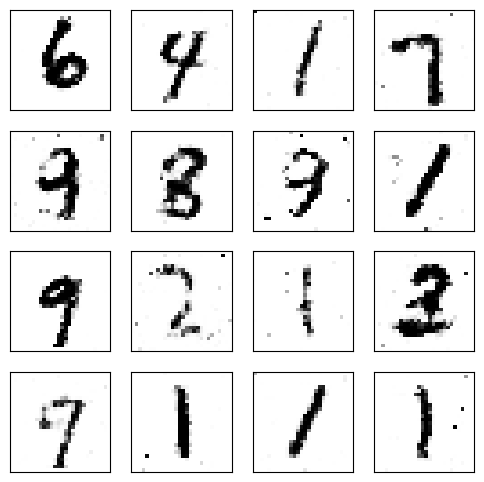

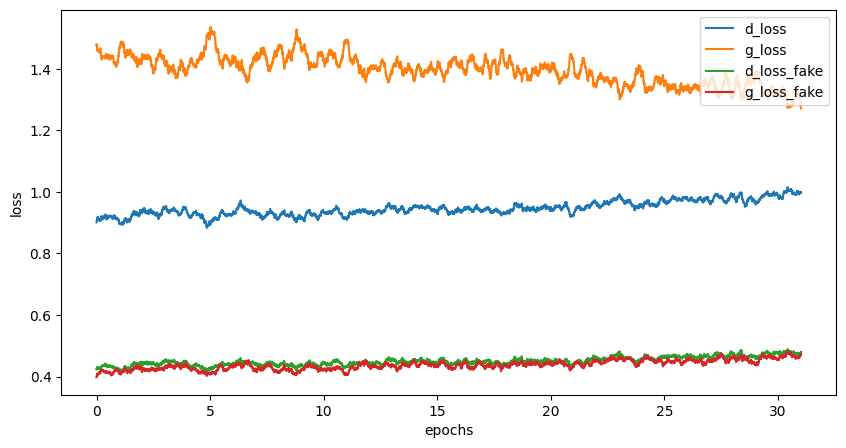

Epoch [32/160], Step[100/469], d_loss: 1.0307, d_loss_fake: 0.5033, g_loss: 1.2465, g_loss_fake: 0.4635, D(x): 0.67, D(G(z)): 0.34
Epoch [32/160], Step[200/469], d_loss: 0.8207, d_loss_fake: 0.3887, g_loss: 1.3846, g_loss_fake: 0.3925, D(x): 0.71, D(G(z)): 0.29
Epoch [32/160], Step[300/469], d_loss: 1.0665, d_loss_fake: 0.5554, g_loss: 1.2423, g_loss_fake: 0.4971, D(x): 0.67, D(G(z)): 0.37
Epoch [32/160], Step[400/469], d_loss: 0.9948, d_loss_fake: 0.5477, g_loss: 1.2900, g_loss_fake: 0.4638, D(x): 0.71, D(G(z)): 0.36


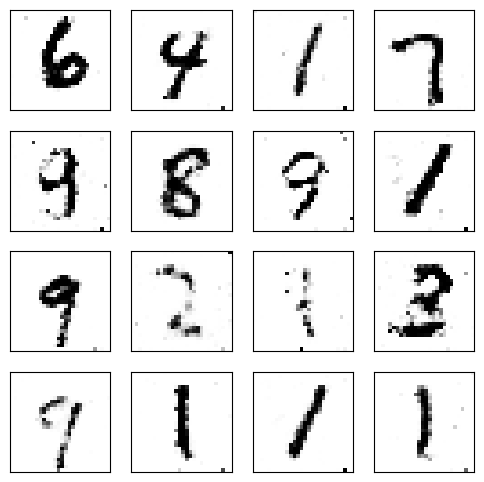

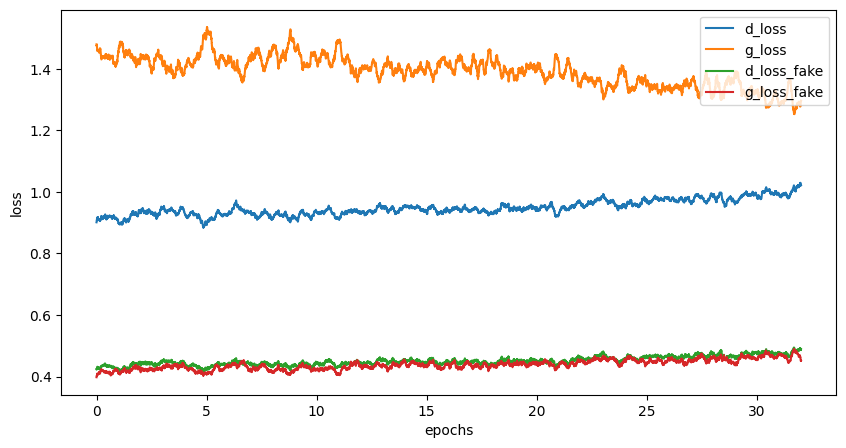

Epoch [33/160], Step[100/469], d_loss: 0.9430, d_loss_fake: 0.4300, g_loss: 1.3990, g_loss_fake: 0.4302, D(x): 0.67, D(G(z)): 0.31
Epoch [33/160], Step[200/469], d_loss: 1.0380, d_loss_fake: 0.4897, g_loss: 1.3014, g_loss_fake: 0.4734, D(x): 0.65, D(G(z)): 0.35
Epoch [33/160], Step[300/469], d_loss: 1.1278, d_loss_fake: 0.4939, g_loss: 1.2682, g_loss_fake: 0.4922, D(x): 0.62, D(G(z)): 0.34
Epoch [33/160], Step[400/469], d_loss: 1.0144, d_loss_fake: 0.4814, g_loss: 1.4578, g_loss_fake: 0.3832, D(x): 0.66, D(G(z)): 0.32


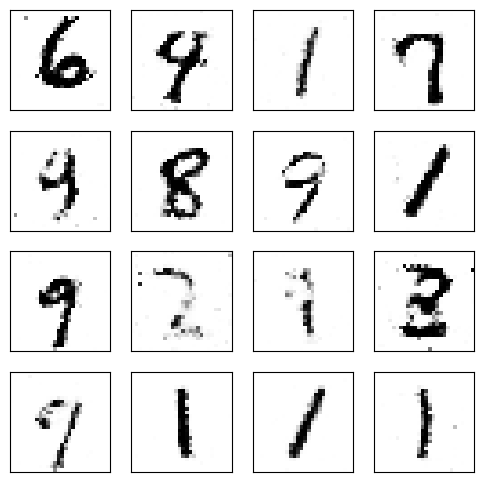

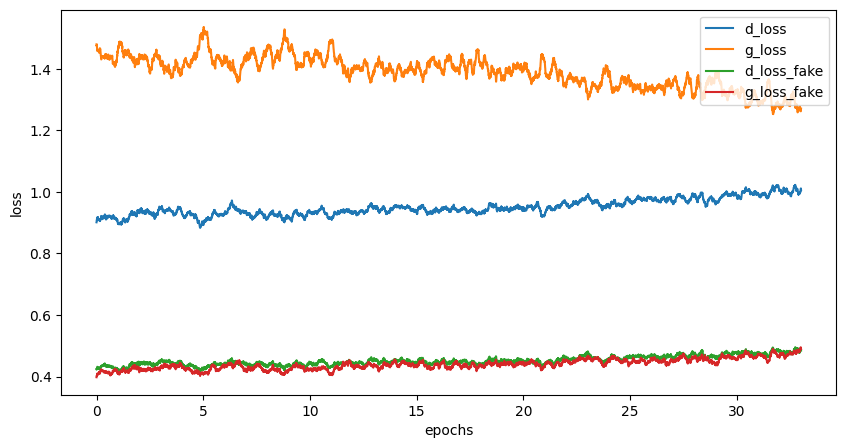

Epoch [34/160], Step[100/469], d_loss: 0.9026, d_loss_fake: 0.4867, g_loss: 1.4429, g_loss_fake: 0.4110, D(x): 0.73, D(G(z)): 0.34
Epoch [34/160], Step[200/469], d_loss: 1.0124, d_loss_fake: 0.4541, g_loss: 1.4051, g_loss_fake: 0.4633, D(x): 0.65, D(G(z)): 0.32
Epoch [34/160], Step[300/469], d_loss: 0.9322, d_loss_fake: 0.4289, g_loss: 1.3144, g_loss_fake: 0.4323, D(x): 0.67, D(G(z)): 0.32
Epoch [34/160], Step[400/469], d_loss: 0.9394, d_loss_fake: 0.4073, g_loss: 1.4521, g_loss_fake: 0.4543, D(x): 0.67, D(G(z)): 0.30


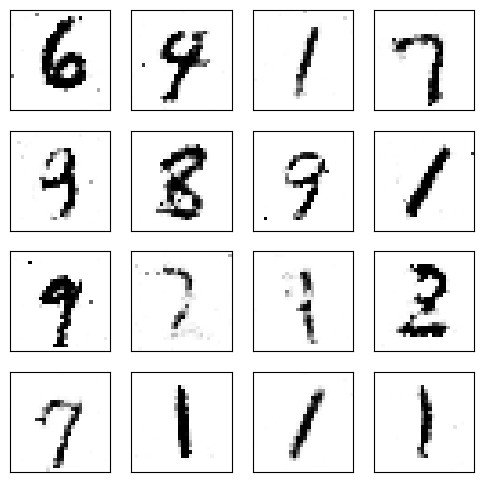

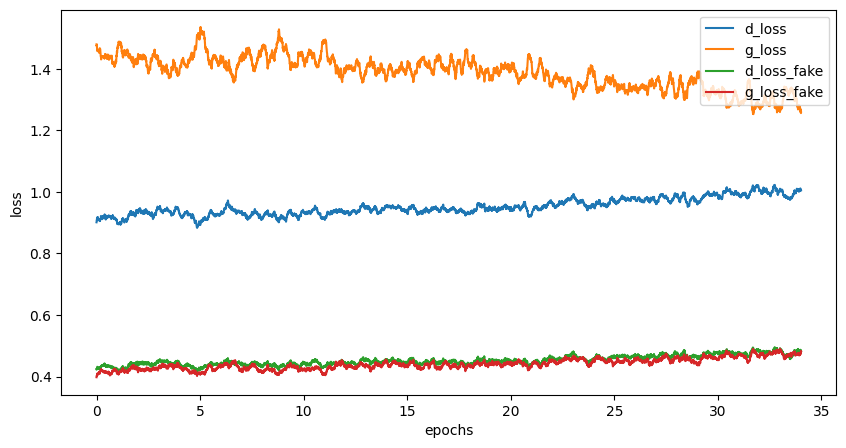

Epoch [35/160], Step[100/469], d_loss: 0.9870, d_loss_fake: 0.4363, g_loss: 1.3156, g_loss_fake: 0.4221, D(x): 0.65, D(G(z)): 0.31
Epoch [35/160], Step[200/469], d_loss: 1.0097, d_loss_fake: 0.4253, g_loss: 1.2945, g_loss_fake: 0.4638, D(x): 0.63, D(G(z)): 0.31
Epoch [35/160], Step[300/469], d_loss: 0.9050, d_loss_fake: 0.3611, g_loss: 1.1533, g_loss_fake: 0.5348, D(x): 0.65, D(G(z)): 0.28
Epoch [35/160], Step[400/469], d_loss: 1.0800, d_loss_fake: 0.5901, g_loss: 1.2933, g_loss_fake: 0.4735, D(x): 0.69, D(G(z)): 0.39


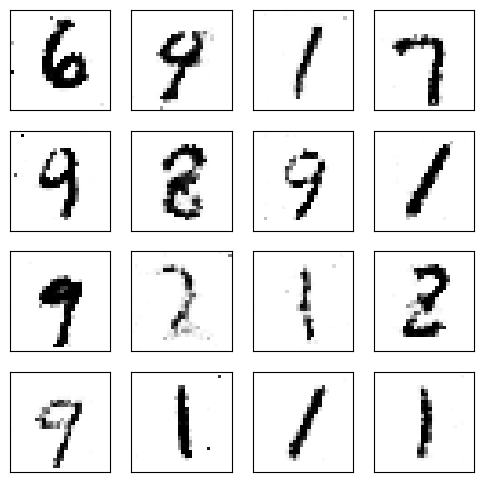

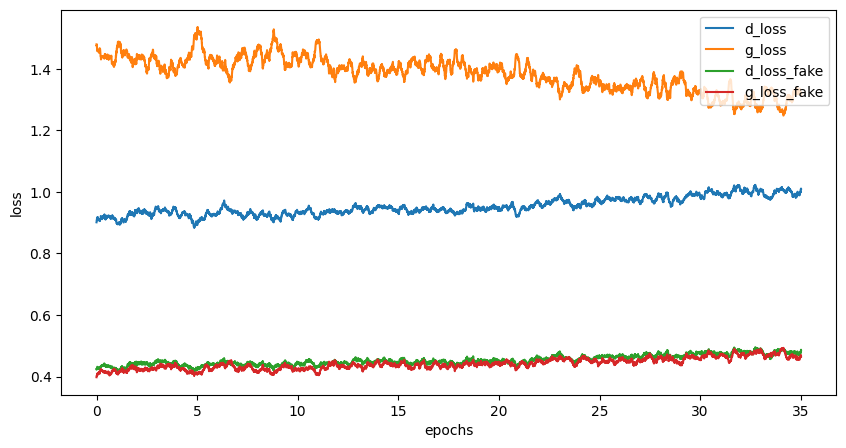

Epoch [36/160], Step[100/469], d_loss: 0.9701, d_loss_fake: 0.4029, g_loss: 1.3316, g_loss_fake: 0.4190, D(x): 0.65, D(G(z)): 0.31
Epoch [36/160], Step[200/469], d_loss: 1.0553, d_loss_fake: 0.5046, g_loss: 1.2957, g_loss_fake: 0.4742, D(x): 0.65, D(G(z)): 0.34
Epoch [36/160], Step[300/469], d_loss: 1.0125, d_loss_fake: 0.4960, g_loss: 1.3528, g_loss_fake: 0.4345, D(x): 0.65, D(G(z)): 0.35
Epoch [36/160], Step[400/469], d_loss: 0.9618, d_loss_fake: 0.4593, g_loss: 1.4113, g_loss_fake: 0.4053, D(x): 0.68, D(G(z)): 0.31


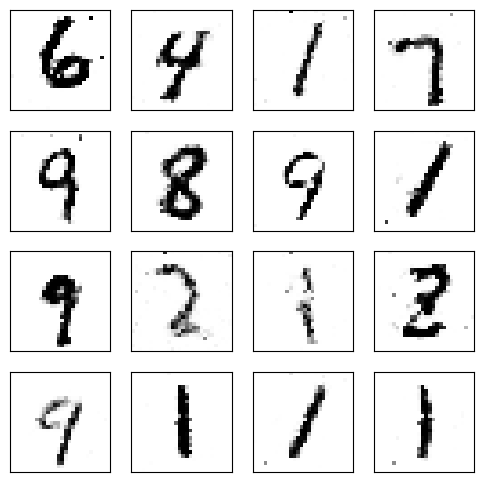

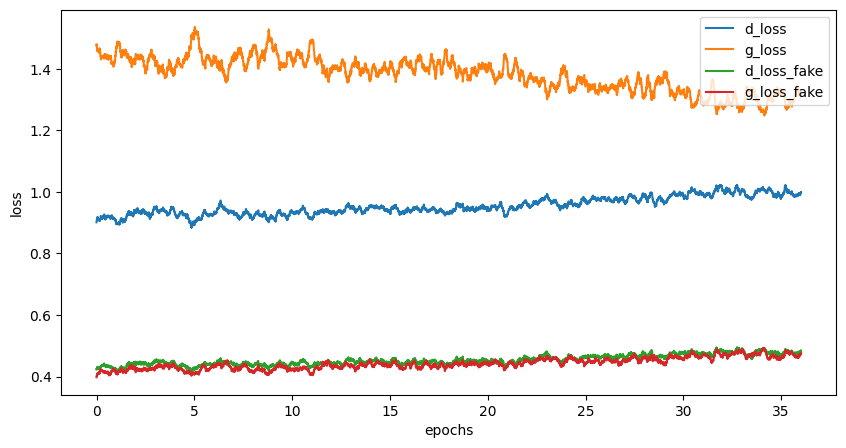

Epoch [37/160], Step[100/469], d_loss: 0.9998, d_loss_fake: 0.5057, g_loss: 1.1454, g_loss_fake: 0.5161, D(x): 0.68, D(G(z)): 0.36
Epoch [37/160], Step[200/469], d_loss: 0.9854, d_loss_fake: 0.4529, g_loss: 1.2342, g_loss_fake: 0.4800, D(x): 0.65, D(G(z)): 0.32
Epoch [37/160], Step[300/469], d_loss: 1.0199, d_loss_fake: 0.3838, g_loss: 1.3330, g_loss_fake: 0.4095, D(x): 0.61, D(G(z)): 0.30
Epoch [37/160], Step[400/469], d_loss: 0.9797, d_loss_fake: 0.4297, g_loss: 1.3812, g_loss_fake: 0.4785, D(x): 0.65, D(G(z)): 0.30


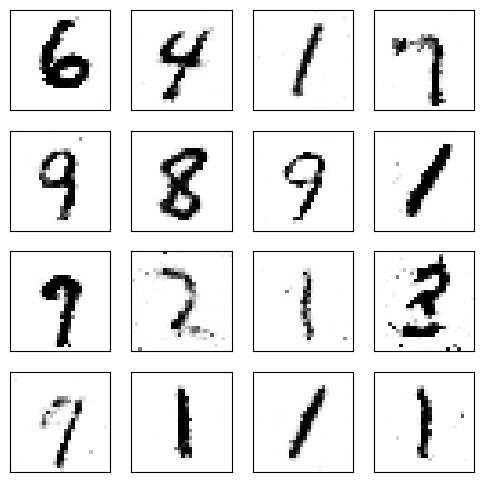

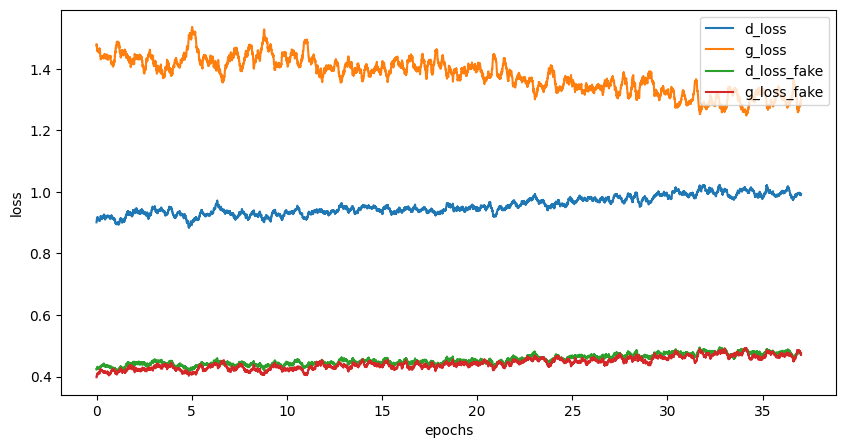

Epoch [38/160], Step[100/469], d_loss: 0.9190, d_loss_fake: 0.4757, g_loss: 1.3837, g_loss_fake: 0.4473, D(x): 0.71, D(G(z)): 0.33
Epoch [38/160], Step[200/469], d_loss: 0.9270, d_loss_fake: 0.4242, g_loss: 1.3171, g_loss_fake: 0.4520, D(x): 0.69, D(G(z)): 0.31
Epoch [38/160], Step[300/469], d_loss: 0.9083, d_loss_fake: 0.4958, g_loss: 1.2948, g_loss_fake: 0.5069, D(x): 0.72, D(G(z)): 0.33
Epoch [38/160], Step[400/469], d_loss: 1.0920, d_loss_fake: 0.6276, g_loss: 1.2923, g_loss_fake: 0.4821, D(x): 0.69, D(G(z)): 0.41


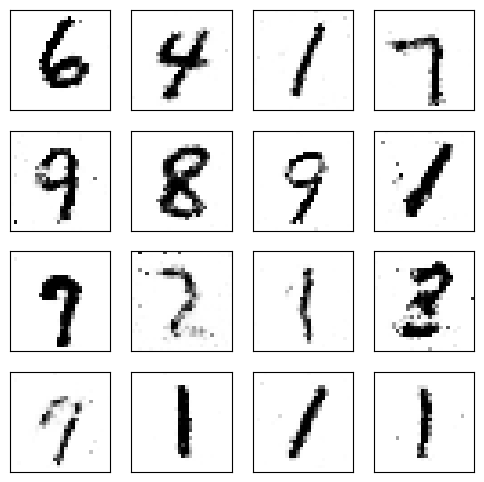

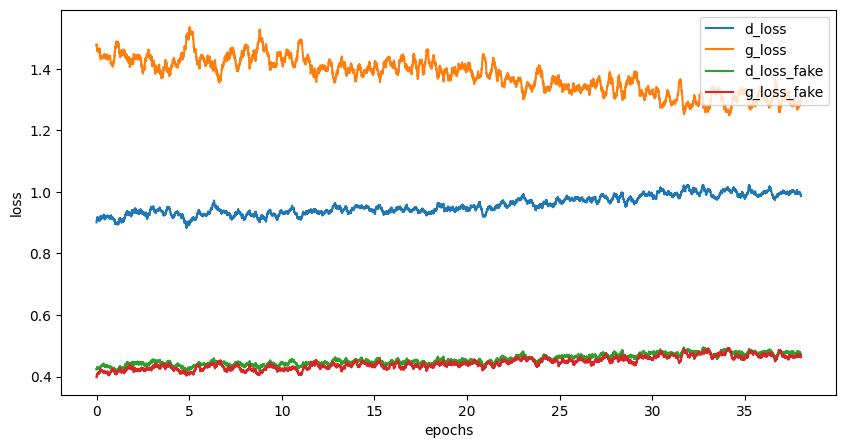

Epoch [39/160], Step[100/469], d_loss: 0.9004, d_loss_fake: 0.4358, g_loss: 1.2068, g_loss_fake: 0.4658, D(x): 0.69, D(G(z)): 0.31
Epoch [39/160], Step[200/469], d_loss: 1.0097, d_loss_fake: 0.5676, g_loss: 1.1183, g_loss_fake: 0.5868, D(x): 0.70, D(G(z)): 0.37
Epoch [39/160], Step[300/469], d_loss: 0.9368, d_loss_fake: 0.4900, g_loss: 1.2483, g_loss_fake: 0.4965, D(x): 0.70, D(G(z)): 0.34
Epoch [39/160], Step[400/469], d_loss: 1.0016, d_loss_fake: 0.5191, g_loss: 1.2484, g_loss_fake: 0.4934, D(x): 0.68, D(G(z)): 0.34


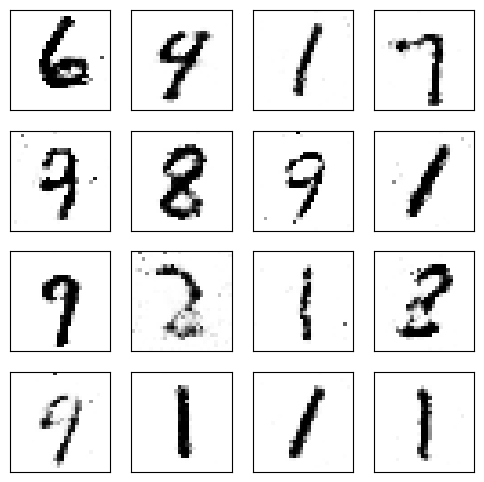

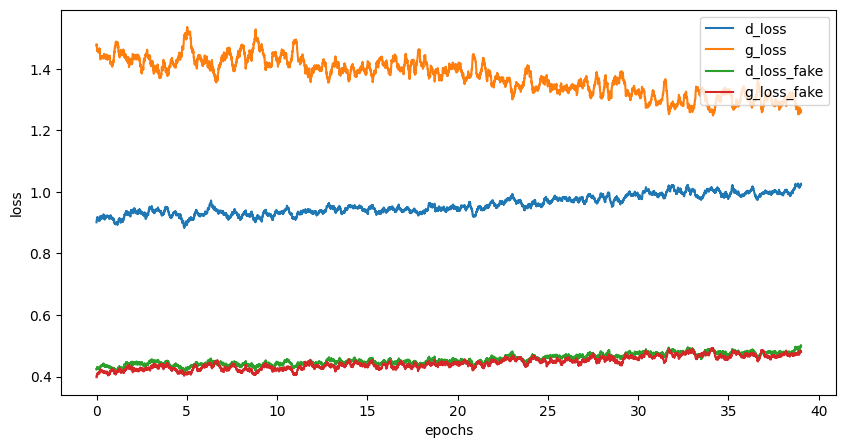

Epoch [40/160], Step[100/469], d_loss: 1.0840, d_loss_fake: 0.4950, g_loss: 1.2728, g_loss_fake: 0.4735, D(x): 0.63, D(G(z)): 0.35
Epoch [40/160], Step[200/469], d_loss: 0.9361, d_loss_fake: 0.4049, g_loss: 1.2817, g_loss_fake: 0.4908, D(x): 0.65, D(G(z)): 0.30
Epoch [40/160], Step[300/469], d_loss: 1.0217, d_loss_fake: 0.4855, g_loss: 1.3642, g_loss_fake: 0.4562, D(x): 0.67, D(G(z)): 0.32
Epoch [40/160], Step[400/469], d_loss: 1.0567, d_loss_fake: 0.5012, g_loss: 1.3903, g_loss_fake: 0.4202, D(x): 0.65, D(G(z)): 0.35


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

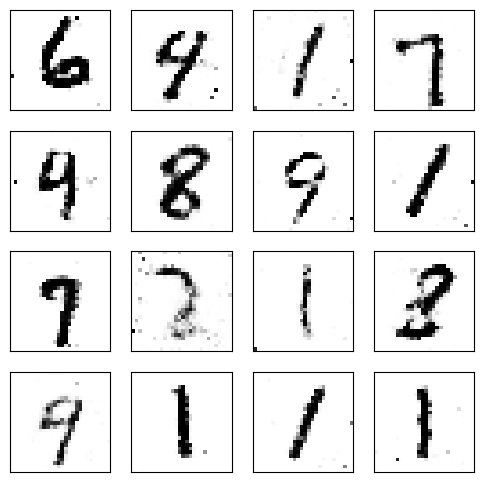

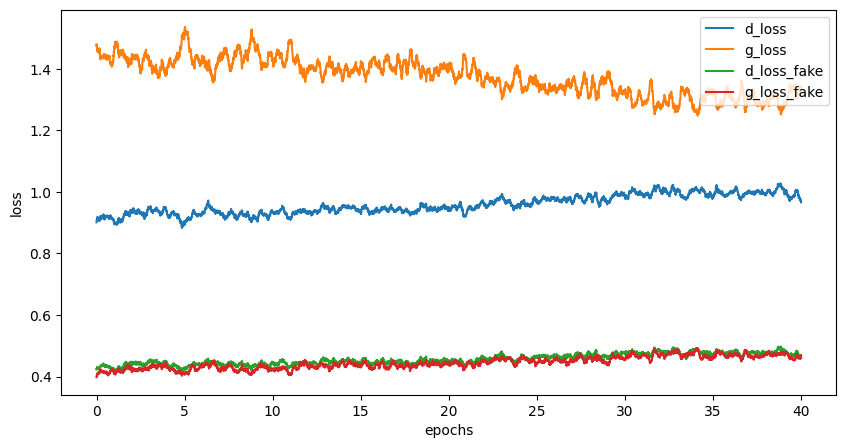

Epoch [41/160], Step[100/469], d_loss: 0.9123, d_loss_fake: 0.4219, g_loss: 1.3209, g_loss_fake: 0.4300, D(x): 0.68, D(G(z)): 0.31
Epoch [41/160], Step[200/469], d_loss: 0.8881, d_loss_fake: 0.4817, g_loss: 1.1311, g_loss_fake: 0.5828, D(x): 0.73, D(G(z)): 0.33
Epoch [41/160], Step[300/469], d_loss: 0.9955, d_loss_fake: 0.4026, g_loss: 1.2511, g_loss_fake: 0.4508, D(x): 0.63, D(G(z)): 0.30
Epoch [41/160], Step[400/469], d_loss: 0.9609, d_loss_fake: 0.5145, g_loss: 1.2661, g_loss_fake: 0.4817, D(x): 0.70, D(G(z)): 0.35


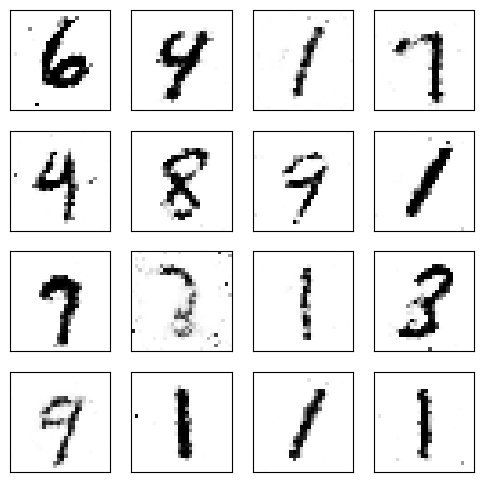

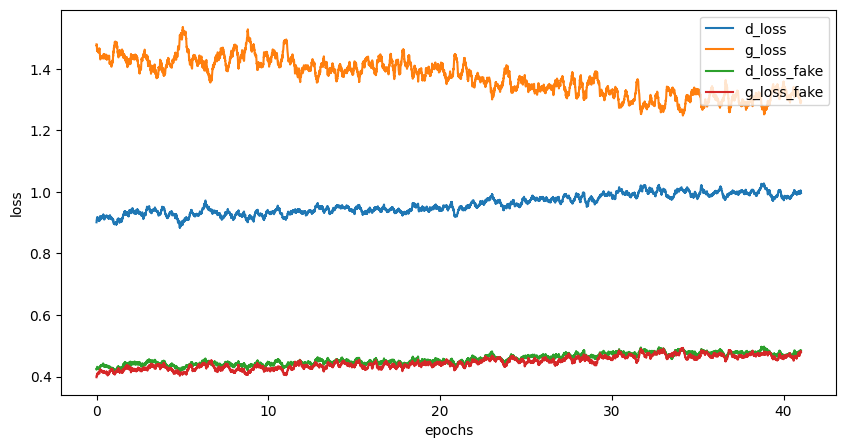

Epoch [42/160], Step[100/469], d_loss: 0.9306, d_loss_fake: 0.4739, g_loss: 1.0524, g_loss_fake: 0.5771, D(x): 0.69, D(G(z)): 0.34
Epoch [42/160], Step[200/469], d_loss: 0.9350, d_loss_fake: 0.4631, g_loss: 1.2301, g_loss_fake: 0.5041, D(x): 0.69, D(G(z)): 0.33
Epoch [42/160], Step[300/469], d_loss: 1.1357, d_loss_fake: 0.4356, g_loss: 1.2106, g_loss_fake: 0.4583, D(x): 0.58, D(G(z)): 0.32
Epoch [42/160], Step[400/469], d_loss: 1.0287, d_loss_fake: 0.5859, g_loss: 1.2736, g_loss_fake: 0.4738, D(x): 0.70, D(G(z)): 0.38


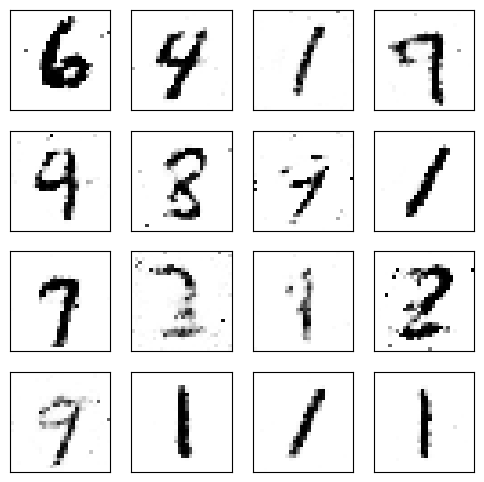

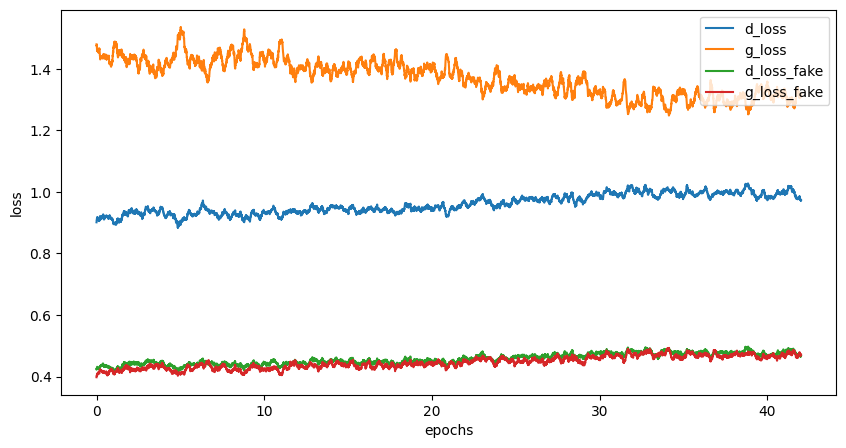

Epoch [43/160], Step[100/469], d_loss: 0.9911, d_loss_fake: 0.5288, g_loss: 1.2947, g_loss_fake: 0.4615, D(x): 0.70, D(G(z)): 0.36
Epoch [43/160], Step[200/469], d_loss: 0.9339, d_loss_fake: 0.5035, g_loss: 1.0869, g_loss_fake: 0.5744, D(x): 0.71, D(G(z)): 0.36
Epoch [43/160], Step[300/469], d_loss: 1.0989, d_loss_fake: 0.6252, g_loss: 1.1842, g_loss_fake: 0.5436, D(x): 0.70, D(G(z)): 0.40
Epoch [43/160], Step[400/469], d_loss: 1.0630, d_loss_fake: 0.5068, g_loss: 1.1773, g_loss_fake: 0.5347, D(x): 0.65, D(G(z)): 0.34


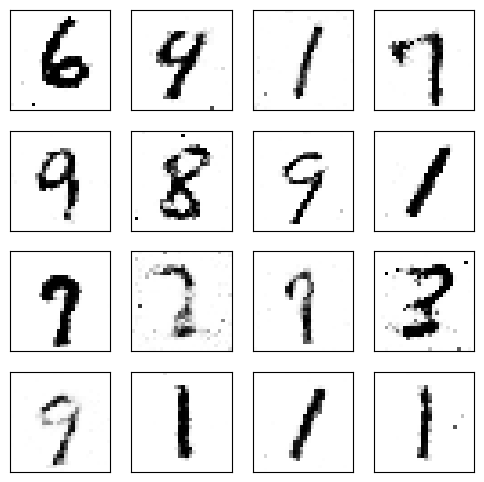

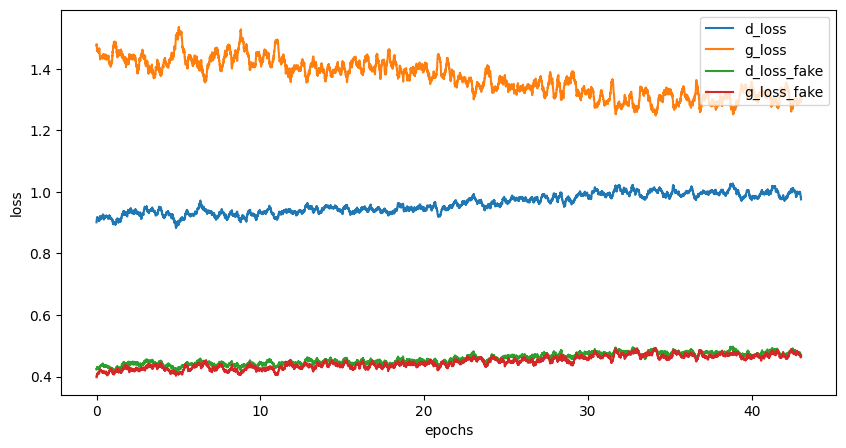

Epoch [44/160], Step[100/469], d_loss: 1.0169, d_loss_fake: 0.5202, g_loss: 1.3824, g_loss_fake: 0.4099, D(x): 0.67, D(G(z)): 0.34
Epoch [44/160], Step[200/469], d_loss: 1.0702, d_loss_fake: 0.5619, g_loss: 1.3715, g_loss_fake: 0.4543, D(x): 0.66, D(G(z)): 0.38
Epoch [44/160], Step[300/469], d_loss: 1.0629, d_loss_fake: 0.5094, g_loss: 1.2147, g_loss_fake: 0.5132, D(x): 0.65, D(G(z)): 0.35
Epoch [44/160], Step[400/469], d_loss: 1.0540, d_loss_fake: 0.5006, g_loss: 1.3624, g_loss_fake: 0.5117, D(x): 0.65, D(G(z)): 0.35


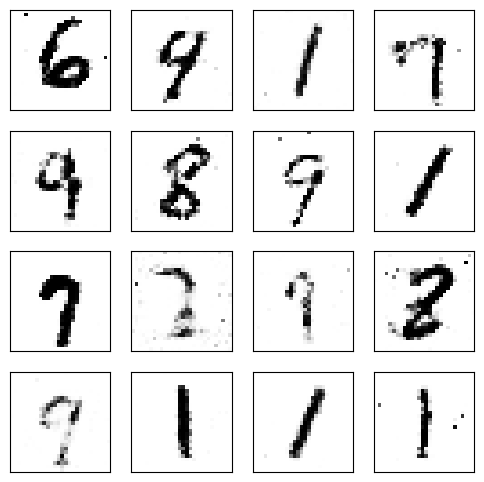

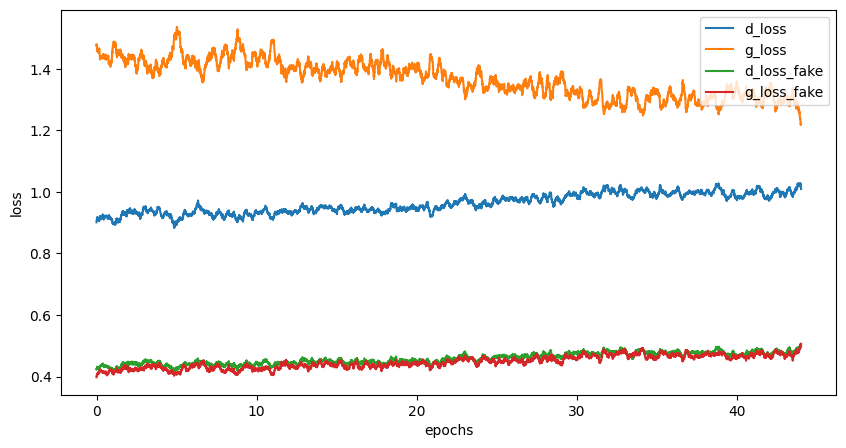

Epoch [45/160], Step[100/469], d_loss: 1.0420, d_loss_fake: 0.5653, g_loss: 1.2439, g_loss_fake: 0.4826, D(x): 0.68, D(G(z)): 0.38
Epoch [45/160], Step[200/469], d_loss: 1.0246, d_loss_fake: 0.5765, g_loss: 1.0523, g_loss_fake: 0.6007, D(x): 0.70, D(G(z)): 0.37
Epoch [45/160], Step[300/469], d_loss: 0.9895, d_loss_fake: 0.4621, g_loss: 1.3756, g_loss_fake: 0.3898, D(x): 0.65, D(G(z)): 0.33
Epoch [45/160], Step[400/469], d_loss: 1.0943, d_loss_fake: 0.5706, g_loss: 1.2868, g_loss_fake: 0.5091, D(x): 0.65, D(G(z)): 0.37


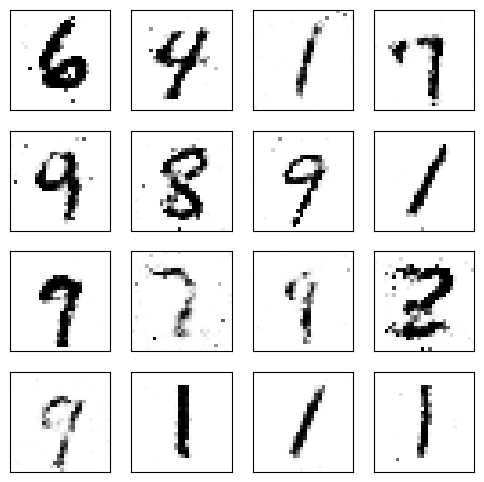

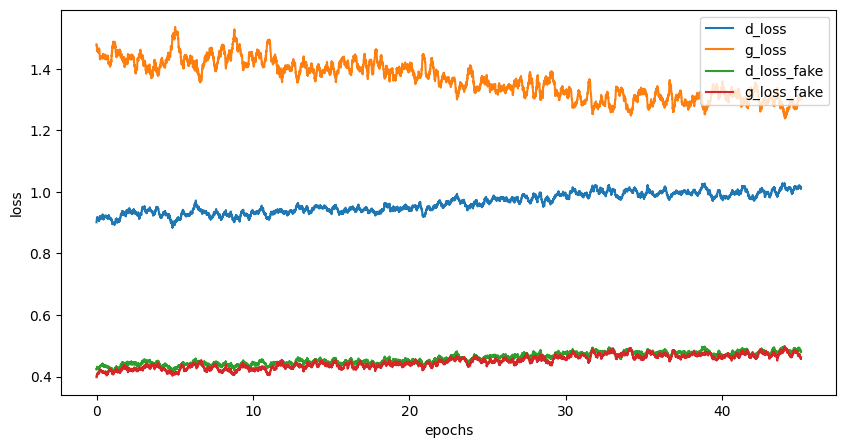

Epoch [46/160], Step[100/469], d_loss: 0.9619, d_loss_fake: 0.4438, g_loss: 1.3387, g_loss_fake: 0.4182, D(x): 0.67, D(G(z)): 0.32
Epoch [46/160], Step[200/469], d_loss: 0.8801, d_loss_fake: 0.4268, g_loss: 1.2549, g_loss_fake: 0.4304, D(x): 0.70, D(G(z)): 0.31
Epoch [46/160], Step[300/469], d_loss: 1.0747, d_loss_fake: 0.4631, g_loss: 1.3390, g_loss_fake: 0.4602, D(x): 0.63, D(G(z)): 0.33
Epoch [46/160], Step[400/469], d_loss: 0.9934, d_loss_fake: 0.4639, g_loss: 1.2237, g_loss_fake: 0.5567, D(x): 0.66, D(G(z)): 0.34


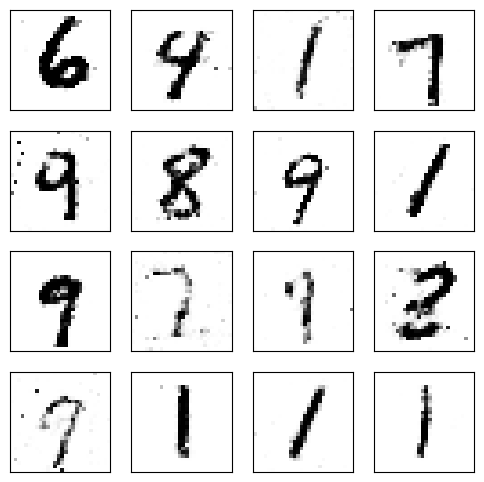

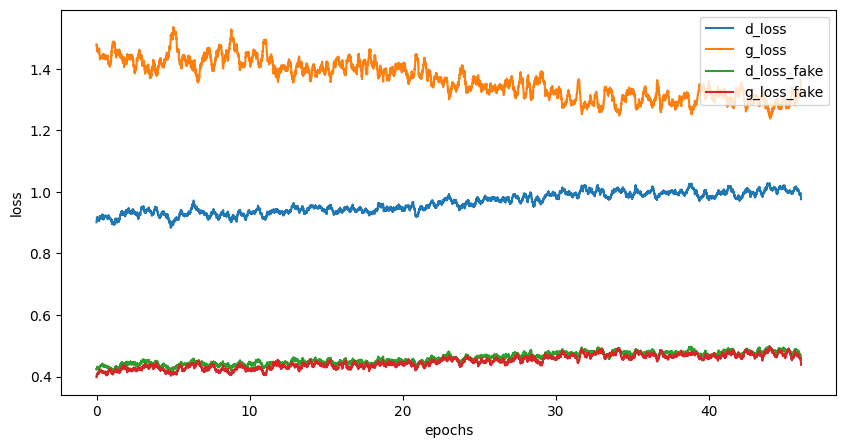

Epoch [47/160], Step[100/469], d_loss: 1.0326, d_loss_fake: 0.6008, g_loss: 1.1421, g_loss_fake: 0.5354, D(x): 0.71, D(G(z)): 0.39
Epoch [47/160], Step[200/469], d_loss: 0.9488, d_loss_fake: 0.3958, g_loss: 1.2197, g_loss_fake: 0.4826, D(x): 0.67, D(G(z)): 0.29
Epoch [47/160], Step[300/469], d_loss: 0.9480, d_loss_fake: 0.4191, g_loss: 1.2009, g_loss_fake: 0.5322, D(x): 0.65, D(G(z)): 0.31
Epoch [47/160], Step[400/469], d_loss: 1.0723, d_loss_fake: 0.4675, g_loss: 1.4363, g_loss_fake: 0.4566, D(x): 0.63, D(G(z)): 0.33


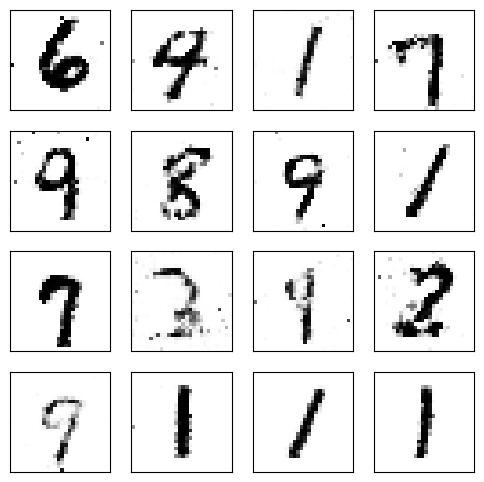

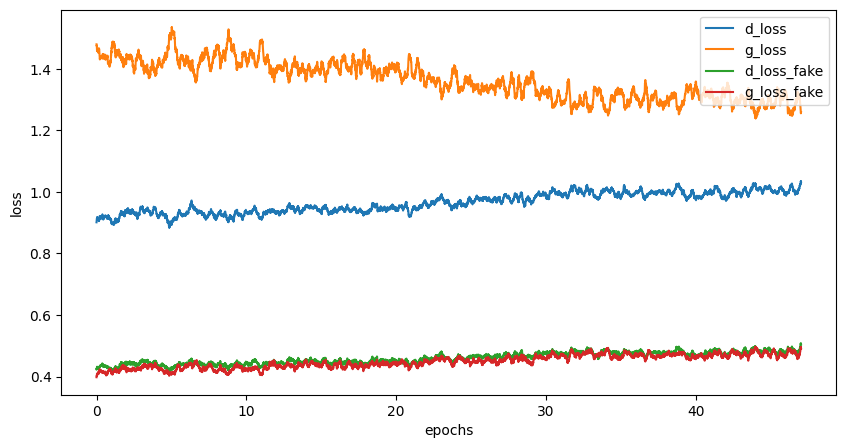

Epoch [48/160], Step[100/469], d_loss: 1.0902, d_loss_fake: 0.4918, g_loss: 1.2593, g_loss_fake: 0.4798, D(x): 0.62, D(G(z)): 0.34
Epoch [48/160], Step[200/469], d_loss: 0.8987, d_loss_fake: 0.4432, g_loss: 1.2260, g_loss_fake: 0.4796, D(x): 0.68, D(G(z)): 0.32
Epoch [48/160], Step[300/469], d_loss: 0.9663, d_loss_fake: 0.4305, g_loss: 1.5250, g_loss_fake: 0.3792, D(x): 0.66, D(G(z)): 0.30
Epoch [48/160], Step[400/469], d_loss: 0.9223, d_loss_fake: 0.4120, g_loss: 1.2681, g_loss_fake: 0.4893, D(x): 0.67, D(G(z)): 0.31


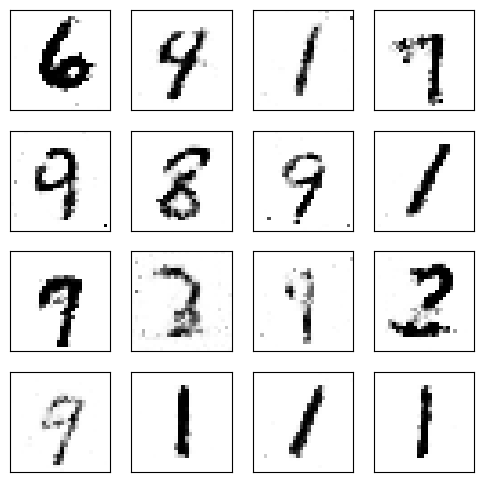

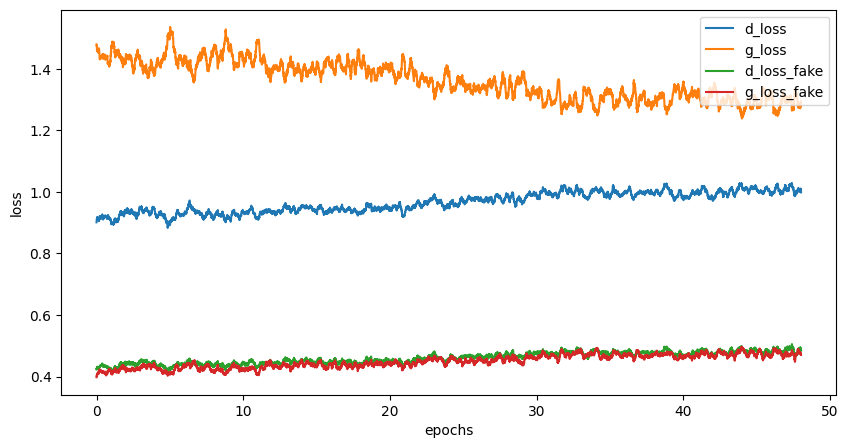

Epoch [49/160], Step[100/469], d_loss: 0.9723, d_loss_fake: 0.4060, g_loss: 1.3392, g_loss_fake: 0.4565, D(x): 0.65, D(G(z)): 0.29
Epoch [49/160], Step[200/469], d_loss: 1.0673, d_loss_fake: 0.5160, g_loss: 1.0562, g_loss_fake: 0.5997, D(x): 0.65, D(G(z)): 0.34
Epoch [49/160], Step[300/469], d_loss: 1.0685, d_loss_fake: 0.5213, g_loss: 1.1762, g_loss_fake: 0.4770, D(x): 0.65, D(G(z)): 0.35
Epoch [49/160], Step[400/469], d_loss: 1.1678, d_loss_fake: 0.6061, g_loss: 1.2200, g_loss_fake: 0.5080, D(x): 0.64, D(G(z)): 0.38


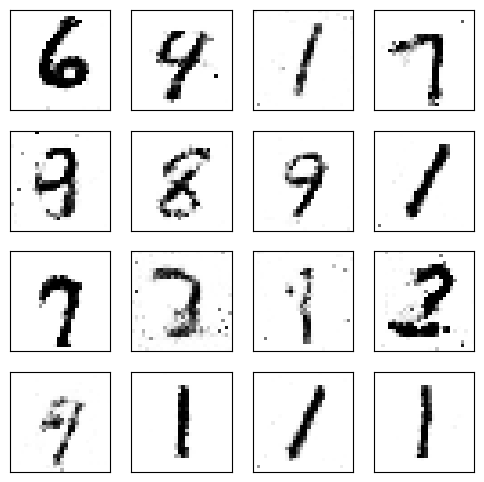

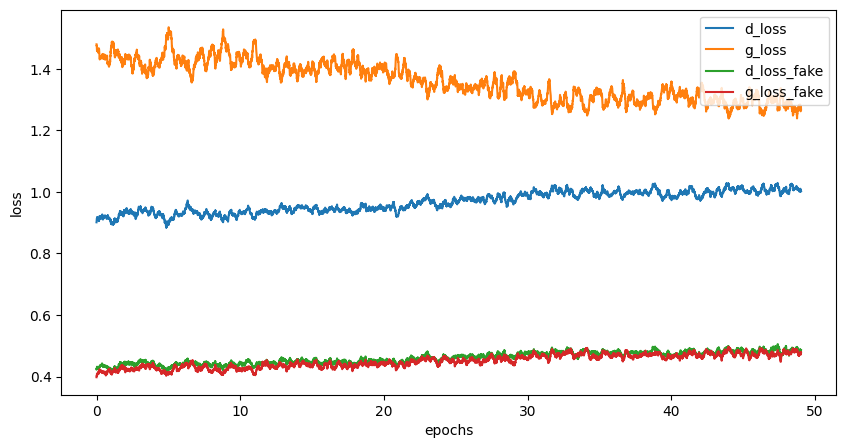

Epoch [50/160], Step[100/469], d_loss: 1.1190, d_loss_fake: 0.5517, g_loss: 1.3420, g_loss_fake: 0.4174, D(x): 0.65, D(G(z)): 0.36
Epoch [50/160], Step[200/469], d_loss: 0.9255, d_loss_fake: 0.4306, g_loss: 1.2611, g_loss_fake: 0.5252, D(x): 0.68, D(G(z)): 0.32
Epoch [50/160], Step[300/469], d_loss: 1.0022, d_loss_fake: 0.5219, g_loss: 1.1507, g_loss_fake: 0.5596, D(x): 0.69, D(G(z)): 0.37
Epoch [50/160], Step[400/469], d_loss: 1.0203, d_loss_fake: 0.5058, g_loss: 1.1825, g_loss_fake: 0.5468, D(x): 0.67, D(G(z)): 0.35


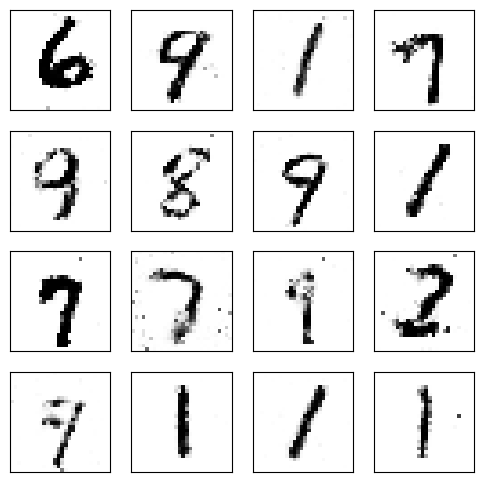

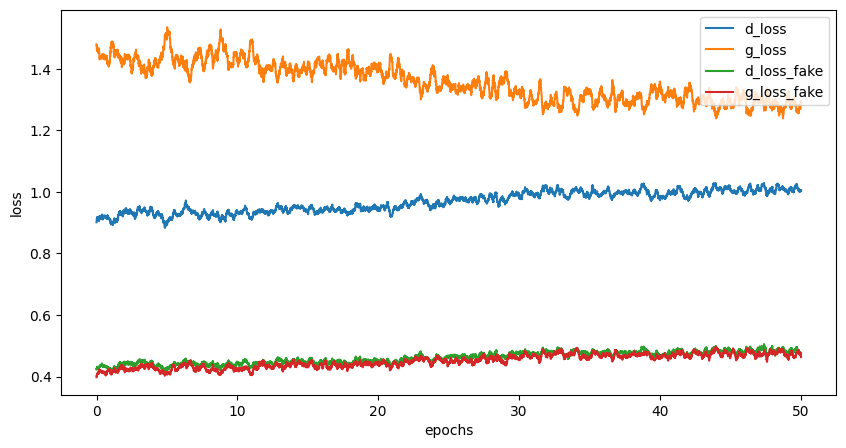

Epoch [51/160], Step[100/469], d_loss: 1.0672, d_loss_fake: 0.4892, g_loss: 1.1228, g_loss_fake: 0.6060, D(x): 0.63, D(G(z)): 0.35
Epoch [51/160], Step[200/469], d_loss: 0.9987, d_loss_fake: 0.4846, g_loss: 1.3331, g_loss_fake: 0.4313, D(x): 0.68, D(G(z)): 0.34
Epoch [51/160], Step[300/469], d_loss: 1.0569, d_loss_fake: 0.5518, g_loss: 1.1959, g_loss_fake: 0.4952, D(x): 0.67, D(G(z)): 0.37
Epoch [51/160], Step[400/469], d_loss: 0.9797, d_loss_fake: 0.4761, g_loss: 1.2150, g_loss_fake: 0.5694, D(x): 0.67, D(G(z)): 0.34


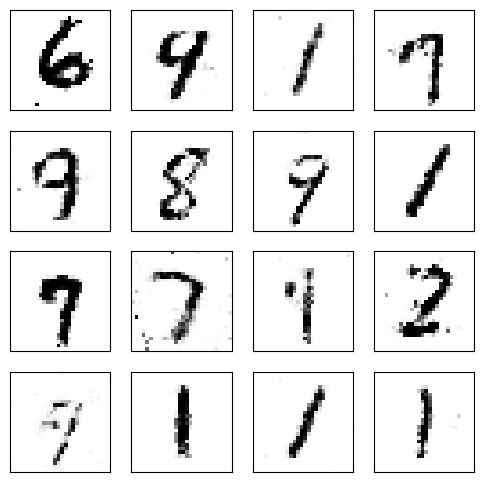

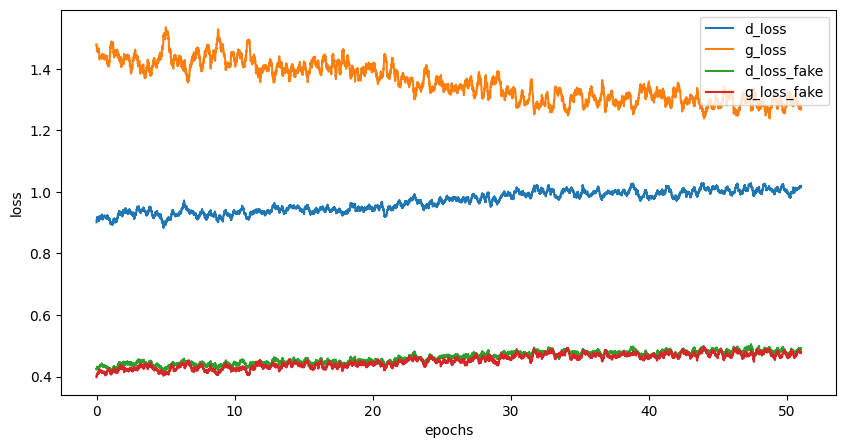

Epoch [52/160], Step[100/469], d_loss: 0.9176, d_loss_fake: 0.4189, g_loss: 1.2538, g_loss_fake: 0.4736, D(x): 0.67, D(G(z)): 0.30
Epoch [52/160], Step[200/469], d_loss: 1.0435, d_loss_fake: 0.5195, g_loss: 1.2943, g_loss_fake: 0.4468, D(x): 0.66, D(G(z)): 0.35
Epoch [52/160], Step[300/469], d_loss: 1.1019, d_loss_fake: 0.5058, g_loss: 1.1947, g_loss_fake: 0.5505, D(x): 0.63, D(G(z)): 0.34
Epoch [52/160], Step[400/469], d_loss: 0.9470, d_loss_fake: 0.4560, g_loss: 1.1911, g_loss_fake: 0.4964, D(x): 0.67, D(G(z)): 0.32


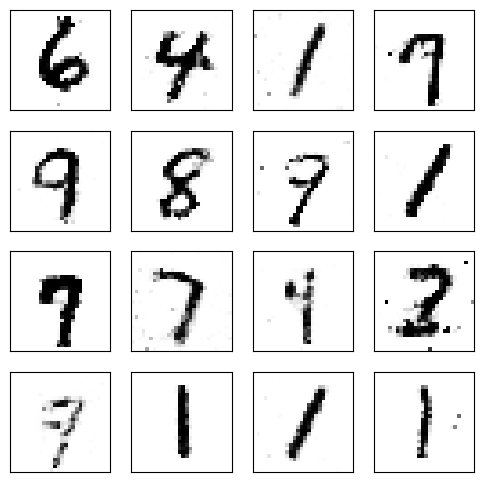

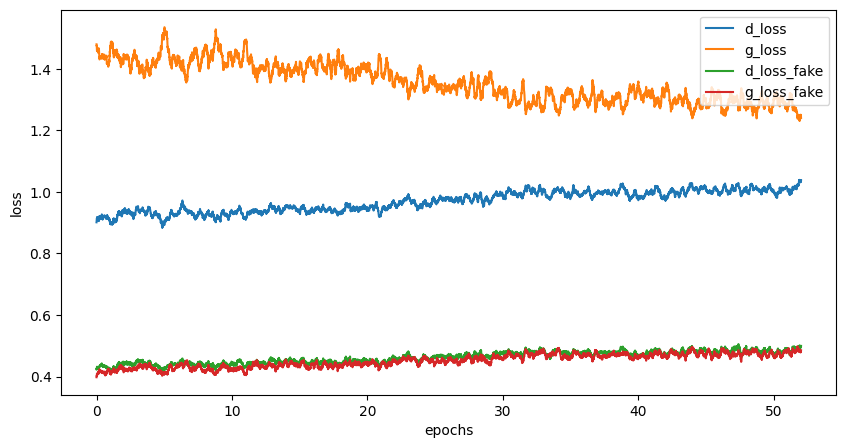

Epoch [53/160], Step[100/469], d_loss: 1.0662, d_loss_fake: 0.4990, g_loss: 1.4168, g_loss_fake: 0.4026, D(x): 0.64, D(G(z)): 0.36
Epoch [53/160], Step[200/469], d_loss: 1.0175, d_loss_fake: 0.4588, g_loss: 1.3715, g_loss_fake: 0.4333, D(x): 0.65, D(G(z)): 0.33
Epoch [53/160], Step[300/469], d_loss: 0.9554, d_loss_fake: 0.5161, g_loss: 1.2278, g_loss_fake: 0.5060, D(x): 0.70, D(G(z)): 0.37
Epoch [53/160], Step[400/469], d_loss: 0.9701, d_loss_fake: 0.4533, g_loss: 1.2869, g_loss_fake: 0.4463, D(x): 0.67, D(G(z)): 0.33


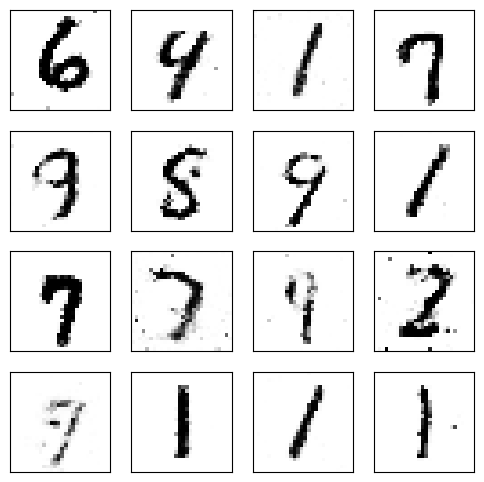

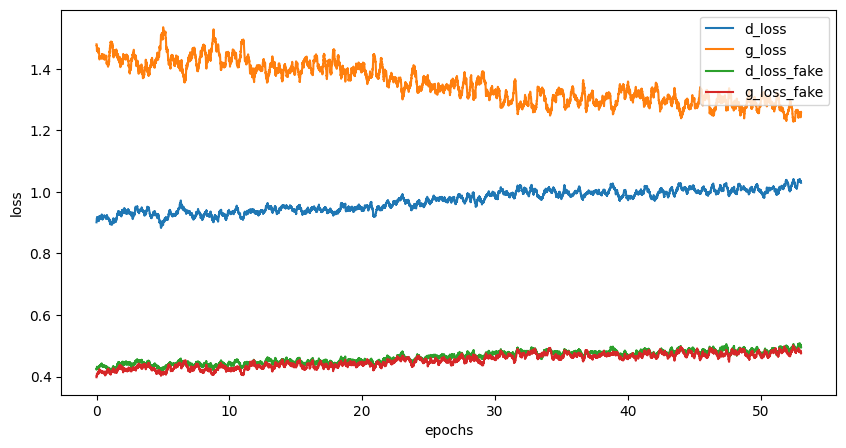

Epoch [54/160], Step[100/469], d_loss: 0.9420, d_loss_fake: 0.5007, g_loss: 1.1731, g_loss_fake: 0.6007, D(x): 0.70, D(G(z)): 0.35
Epoch [54/160], Step[200/469], d_loss: 1.0414, d_loss_fake: 0.5321, g_loss: 1.2315, g_loss_fake: 0.5851, D(x): 0.67, D(G(z)): 0.37
Epoch [54/160], Step[300/469], d_loss: 1.0564, d_loss_fake: 0.5290, g_loss: 1.2793, g_loss_fake: 0.4780, D(x): 0.65, D(G(z)): 0.36
Epoch [54/160], Step[400/469], d_loss: 0.9548, d_loss_fake: 0.5086, g_loss: 1.3277, g_loss_fake: 0.4704, D(x): 0.70, D(G(z)): 0.35


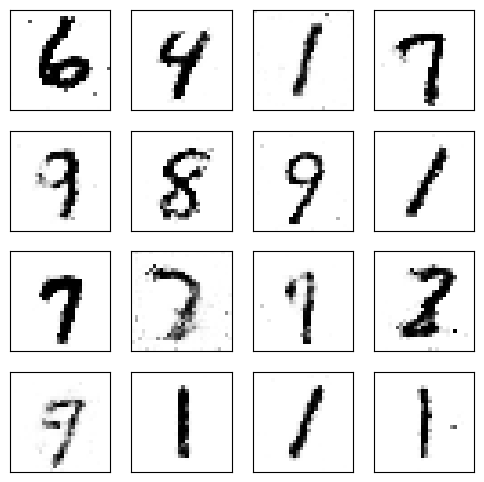

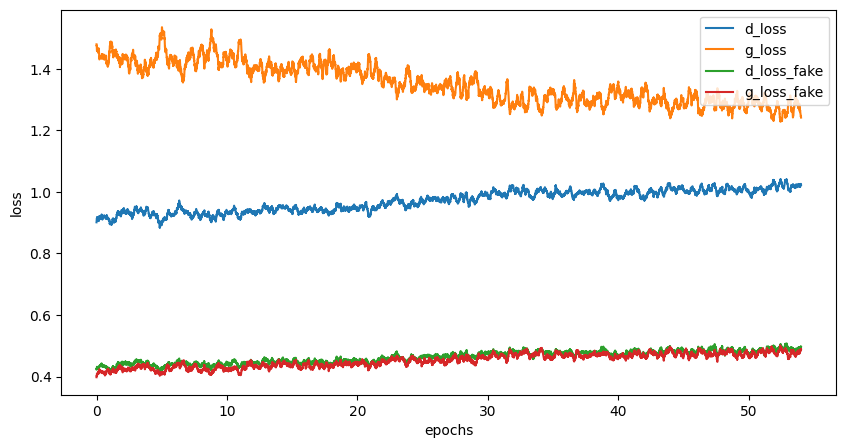

Epoch [55/160], Step[100/469], d_loss: 1.0112, d_loss_fake: 0.5240, g_loss: 1.2056, g_loss_fake: 0.5035, D(x): 0.69, D(G(z)): 0.36
Epoch [55/160], Step[200/469], d_loss: 1.0259, d_loss_fake: 0.5286, g_loss: 1.3161, g_loss_fake: 0.5217, D(x): 0.67, D(G(z)): 0.35
Epoch [55/160], Step[300/469], d_loss: 0.9549, d_loss_fake: 0.4480, g_loss: 1.3733, g_loss_fake: 0.4397, D(x): 0.67, D(G(z)): 0.32
Epoch [55/160], Step[400/469], d_loss: 0.9896, d_loss_fake: 0.4905, g_loss: 1.3140, g_loss_fake: 0.4627, D(x): 0.66, D(G(z)): 0.33


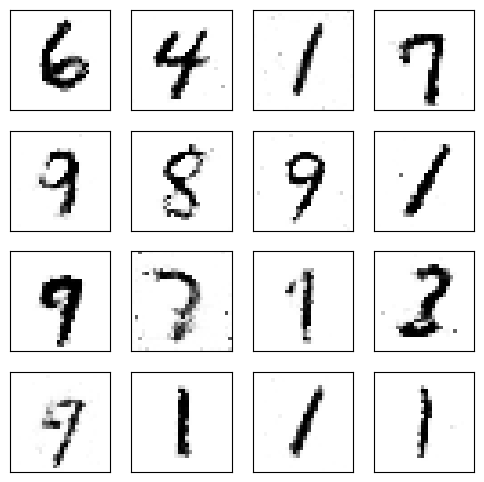

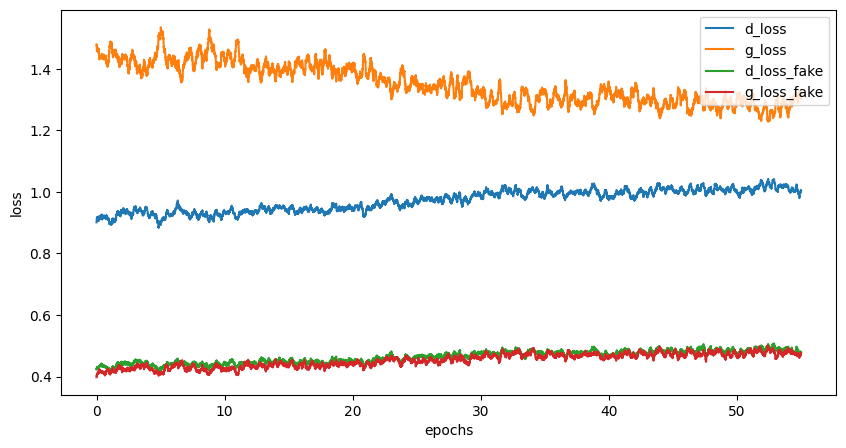

Epoch [56/160], Step[100/469], d_loss: 1.0249, d_loss_fake: 0.5157, g_loss: 1.2859, g_loss_fake: 0.4977, D(x): 0.68, D(G(z)): 0.36
Epoch [56/160], Step[200/469], d_loss: 0.9729, d_loss_fake: 0.4442, g_loss: 1.4628, g_loss_fake: 0.3897, D(x): 0.66, D(G(z)): 0.32
Epoch [56/160], Step[300/469], d_loss: 1.0207, d_loss_fake: 0.4268, g_loss: 1.2345, g_loss_fake: 0.5221, D(x): 0.63, D(G(z)): 0.31
Epoch [56/160], Step[400/469], d_loss: 1.1181, d_loss_fake: 0.5887, g_loss: 1.0861, g_loss_fake: 0.6004, D(x): 0.66, D(G(z)): 0.38


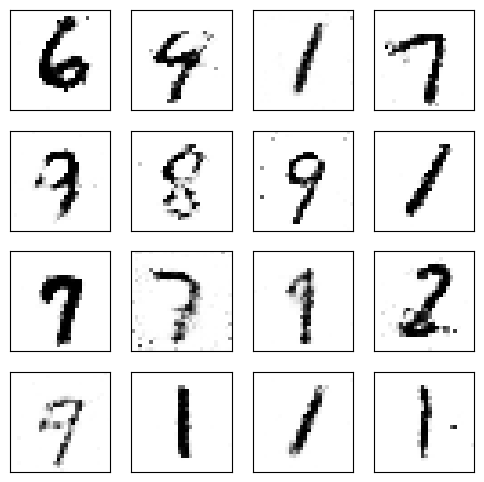

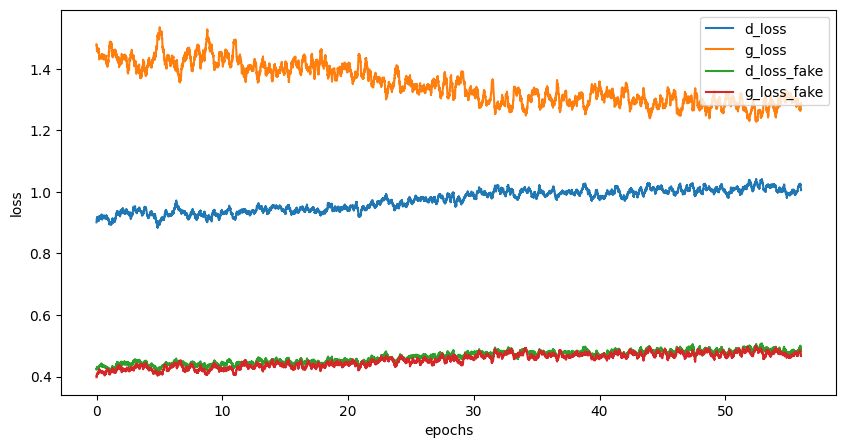

Epoch [57/160], Step[100/469], d_loss: 0.9579, d_loss_fake: 0.5294, g_loss: 1.2254, g_loss_fake: 0.4969, D(x): 0.72, D(G(z)): 0.37
Epoch [57/160], Step[200/469], d_loss: 1.1171, d_loss_fake: 0.5435, g_loss: 1.2284, g_loss_fake: 0.5011, D(x): 0.65, D(G(z)): 0.37
Epoch [57/160], Step[300/469], d_loss: 0.9395, d_loss_fake: 0.4806, g_loss: 1.4055, g_loss_fake: 0.4690, D(x): 0.70, D(G(z)): 0.33
Epoch [57/160], Step[400/469], d_loss: 1.0106, d_loss_fake: 0.4866, g_loss: 1.2261, g_loss_fake: 0.4804, D(x): 0.66, D(G(z)): 0.34


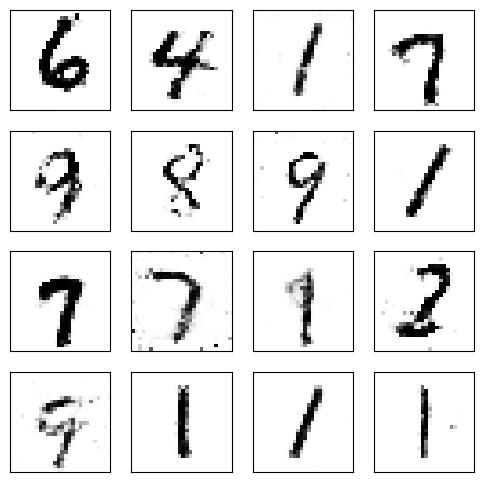

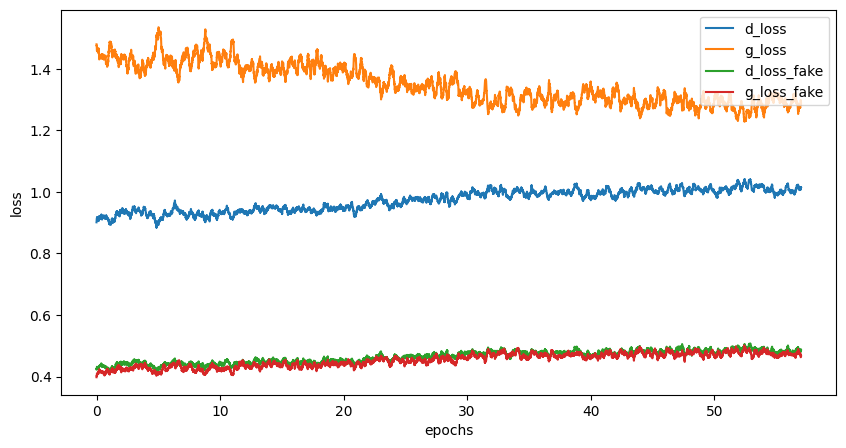

Epoch [58/160], Step[100/469], d_loss: 1.0104, d_loss_fake: 0.4845, g_loss: 1.3794, g_loss_fake: 0.4156, D(x): 0.66, D(G(z)): 0.33
Epoch [58/160], Step[200/469], d_loss: 0.9804, d_loss_fake: 0.3900, g_loss: 1.3483, g_loss_fake: 0.4592, D(x): 0.65, D(G(z)): 0.29
Epoch [58/160], Step[300/469], d_loss: 0.9949, d_loss_fake: 0.4985, g_loss: 1.3924, g_loss_fake: 0.4572, D(x): 0.69, D(G(z)): 0.34
Epoch [58/160], Step[400/469], d_loss: 1.0194, d_loss_fake: 0.5042, g_loss: 1.3684, g_loss_fake: 0.4356, D(x): 0.67, D(G(z)): 0.34


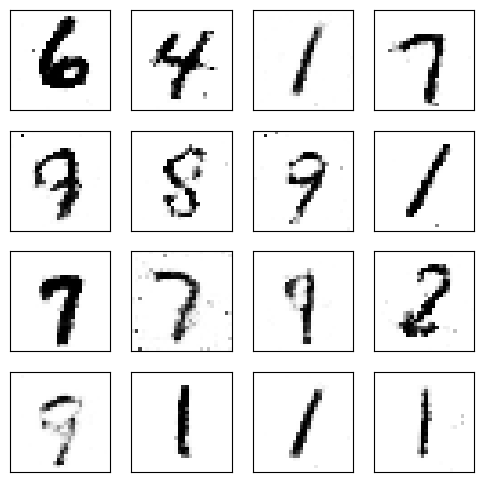

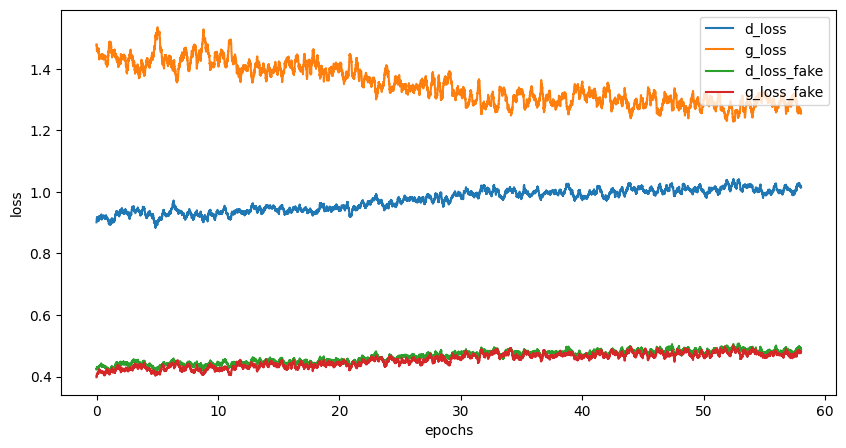

Epoch [59/160], Step[100/469], d_loss: 0.9384, d_loss_fake: 0.4662, g_loss: 1.2838, g_loss_fake: 0.4234, D(x): 0.69, D(G(z)): 0.33
Epoch [59/160], Step[200/469], d_loss: 1.0018, d_loss_fake: 0.5067, g_loss: 1.2136, g_loss_fake: 0.5384, D(x): 0.68, D(G(z)): 0.35
Epoch [59/160], Step[300/469], d_loss: 0.9575, d_loss_fake: 0.5681, g_loss: 1.0382, g_loss_fake: 0.5911, D(x): 0.72, D(G(z)): 0.38
Epoch [59/160], Step[400/469], d_loss: 1.1141, d_loss_fake: 0.5593, g_loss: 1.1574, g_loss_fake: 0.5153, D(x): 0.65, D(G(z)): 0.38


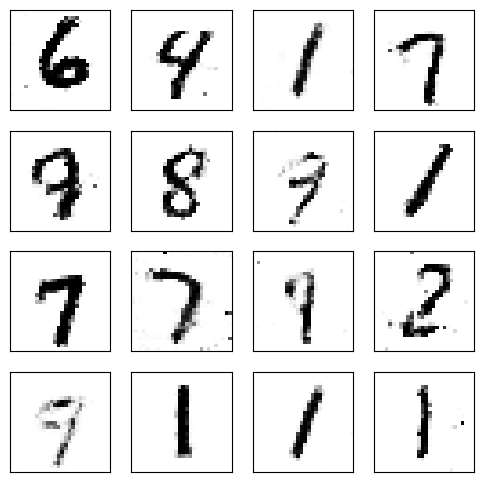

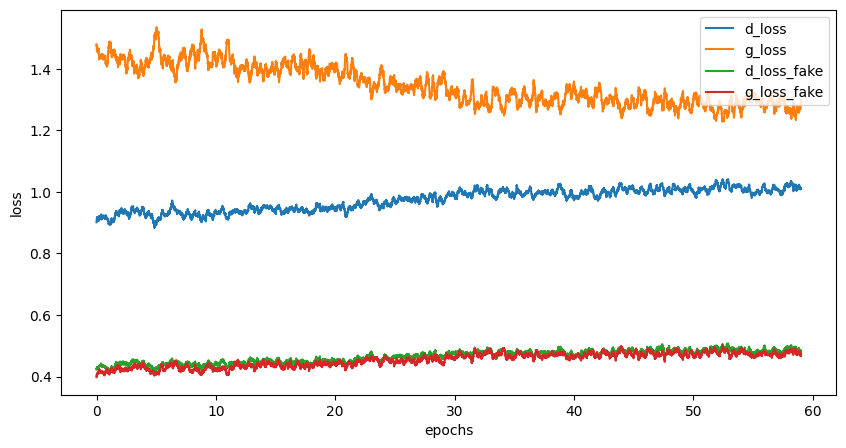

Epoch [60/160], Step[100/469], d_loss: 0.9984, d_loss_fake: 0.4944, g_loss: 1.2572, g_loss_fake: 0.5160, D(x): 0.69, D(G(z)): 0.33
Epoch [60/160], Step[200/469], d_loss: 0.9130, d_loss_fake: 0.4880, g_loss: 1.2166, g_loss_fake: 0.4563, D(x): 0.71, D(G(z)): 0.35
Epoch [60/160], Step[300/469], d_loss: 1.0196, d_loss_fake: 0.5413, g_loss: 1.2250, g_loss_fake: 0.4665, D(x): 0.68, D(G(z)): 0.37
Epoch [60/160], Step[400/469], d_loss: 1.0189, d_loss_fake: 0.5544, g_loss: 1.1313, g_loss_fake: 0.5356, D(x): 0.69, D(G(z)): 0.37


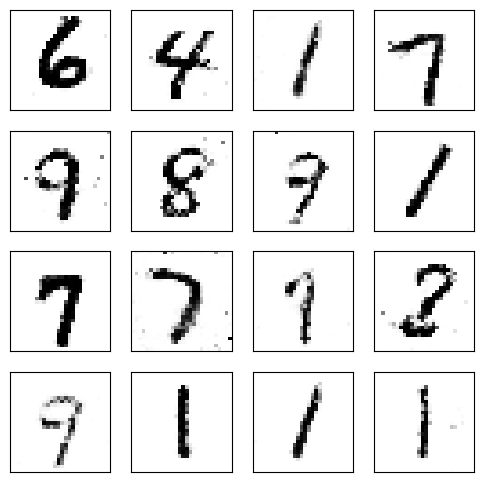

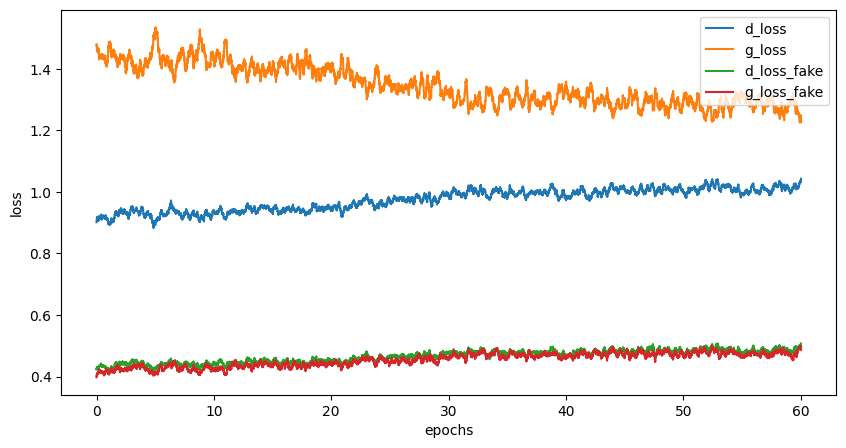

Epoch [61/160], Step[100/469], d_loss: 1.0098, d_loss_fake: 0.4733, g_loss: 1.2707, g_loss_fake: 0.4634, D(x): 0.65, D(G(z)): 0.33
Epoch [61/160], Step[200/469], d_loss: 1.0476, d_loss_fake: 0.4896, g_loss: 1.1987, g_loss_fake: 0.4742, D(x): 0.64, D(G(z)): 0.34
Epoch [61/160], Step[300/469], d_loss: 0.8727, d_loss_fake: 0.3937, g_loss: 1.1780, g_loss_fake: 0.5172, D(x): 0.68, D(G(z)): 0.30
Epoch [61/160], Step[400/469], d_loss: 1.0428, d_loss_fake: 0.4809, g_loss: 1.2077, g_loss_fake: 0.4937, D(x): 0.67, D(G(z)): 0.33


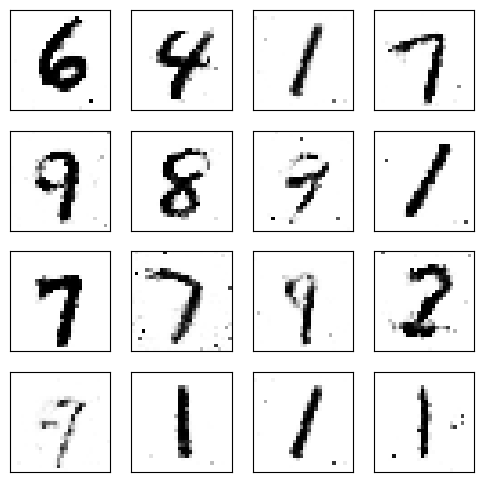

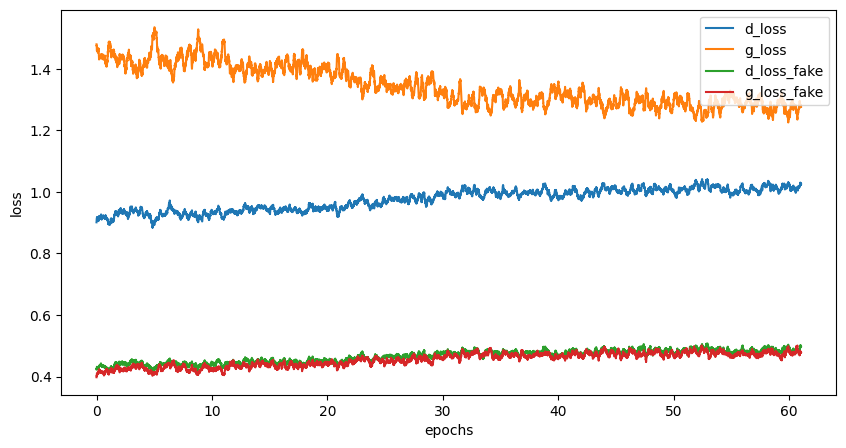

Epoch [62/160], Step[100/469], d_loss: 0.9344, d_loss_fake: 0.4315, g_loss: 1.3060, g_loss_fake: 0.4788, D(x): 0.69, D(G(z)): 0.32
Epoch [62/160], Step[200/469], d_loss: 0.9448, d_loss_fake: 0.5082, g_loss: 1.3348, g_loss_fake: 0.4568, D(x): 0.71, D(G(z)): 0.34
Epoch [62/160], Step[300/469], d_loss: 0.8982, d_loss_fake: 0.4659, g_loss: 1.2077, g_loss_fake: 0.4818, D(x): 0.71, D(G(z)): 0.34
Epoch [62/160], Step[400/469], d_loss: 1.0497, d_loss_fake: 0.5399, g_loss: 1.3106, g_loss_fake: 0.4676, D(x): 0.68, D(G(z)): 0.36


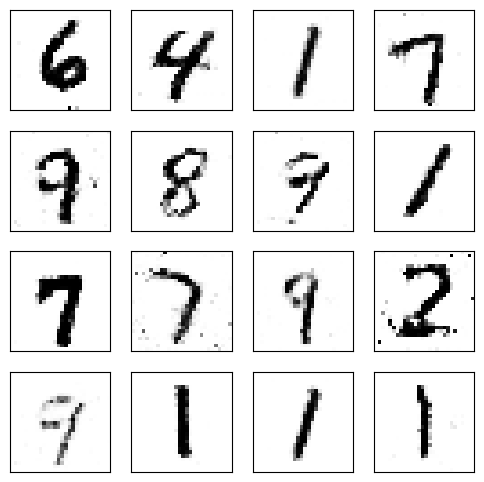

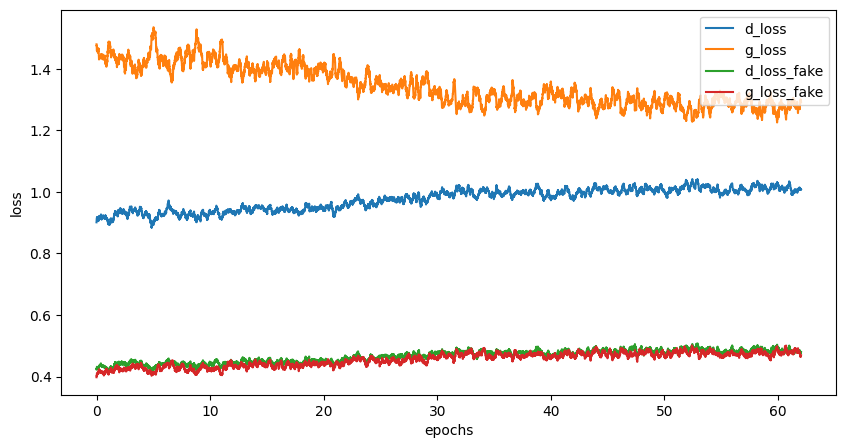

Epoch [63/160], Step[100/469], d_loss: 1.0677, d_loss_fake: 0.5388, g_loss: 1.3079, g_loss_fake: 0.4086, D(x): 0.66, D(G(z)): 0.36
Epoch [63/160], Step[200/469], d_loss: 0.9846, d_loss_fake: 0.4425, g_loss: 1.3527, g_loss_fake: 0.4259, D(x): 0.65, D(G(z)): 0.32
Epoch [63/160], Step[300/469], d_loss: 1.1034, d_loss_fake: 0.5434, g_loss: 1.3635, g_loss_fake: 0.4377, D(x): 0.63, D(G(z)): 0.37
Epoch [63/160], Step[400/469], d_loss: 0.9255, d_loss_fake: 0.3907, g_loss: 1.3579, g_loss_fake: 0.5110, D(x): 0.66, D(G(z)): 0.29


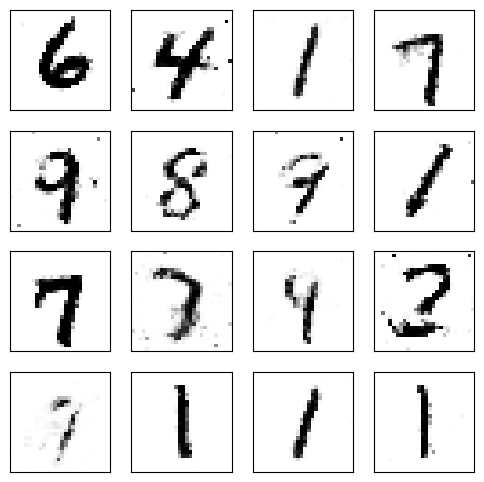

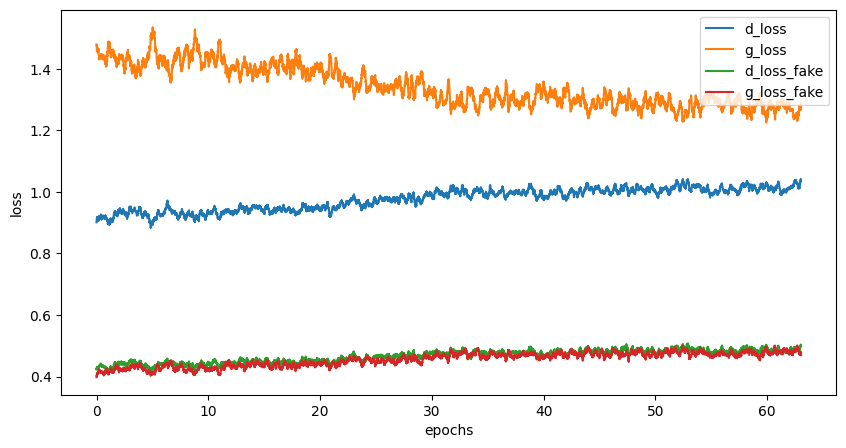

Epoch [64/160], Step[100/469], d_loss: 1.0484, d_loss_fake: 0.4898, g_loss: 1.5660, g_loss_fake: 0.3644, D(x): 0.66, D(G(z)): 0.33
Epoch [64/160], Step[200/469], d_loss: 1.0181, d_loss_fake: 0.4865, g_loss: 1.2509, g_loss_fake: 0.4315, D(x): 0.67, D(G(z)): 0.34
Epoch [64/160], Step[300/469], d_loss: 0.9364, d_loss_fake: 0.4947, g_loss: 1.2034, g_loss_fake: 0.5043, D(x): 0.70, D(G(z)): 0.34
Epoch [64/160], Step[400/469], d_loss: 1.0065, d_loss_fake: 0.4712, g_loss: 1.1409, g_loss_fake: 0.5162, D(x): 0.65, D(G(z)): 0.34


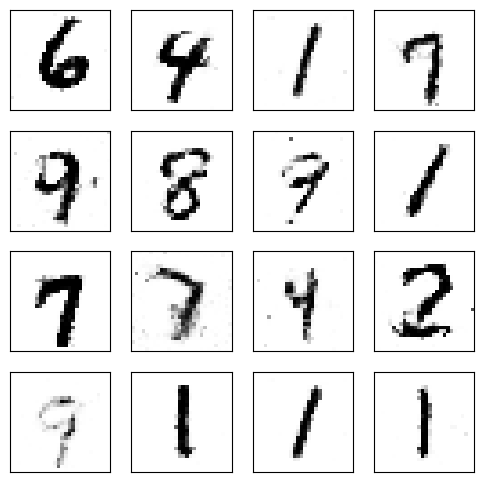

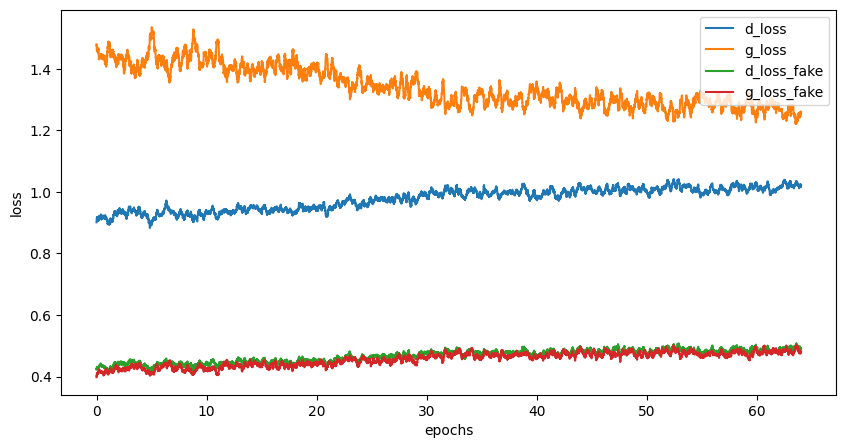

Epoch [65/160], Step[100/469], d_loss: 0.9239, d_loss_fake: 0.4666, g_loss: 1.2041, g_loss_fake: 0.4948, D(x): 0.71, D(G(z)): 0.34
Epoch [65/160], Step[200/469], d_loss: 1.1119, d_loss_fake: 0.5817, g_loss: 1.2009, g_loss_fake: 0.5089, D(x): 0.65, D(G(z)): 0.38
Epoch [65/160], Step[300/469], d_loss: 1.0324, d_loss_fake: 0.5107, g_loss: 1.2389, g_loss_fake: 0.4995, D(x): 0.66, D(G(z)): 0.35
Epoch [65/160], Step[400/469], d_loss: 0.9906, d_loss_fake: 0.4453, g_loss: 1.3505, g_loss_fake: 0.5071, D(x): 0.65, D(G(z)): 0.32


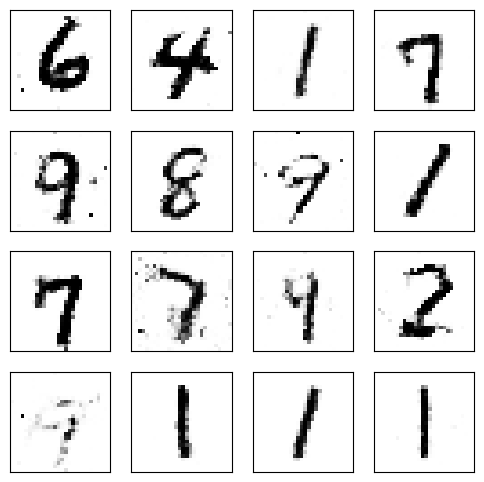

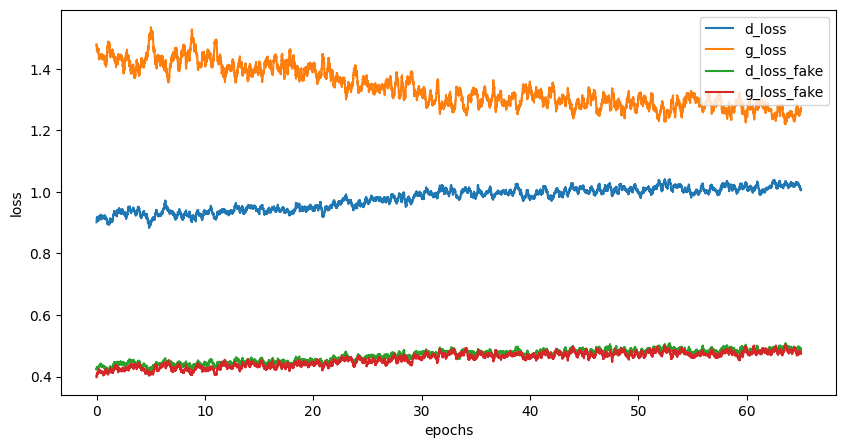

Epoch [66/160], Step[100/469], d_loss: 0.9611, d_loss_fake: 0.4227, g_loss: 1.4100, g_loss_fake: 0.4146, D(x): 0.66, D(G(z)): 0.32
Epoch [66/160], Step[200/469], d_loss: 1.0955, d_loss_fake: 0.4718, g_loss: 1.3141, g_loss_fake: 0.4276, D(x): 0.61, D(G(z)): 0.34
Epoch [66/160], Step[300/469], d_loss: 0.8563, d_loss_fake: 0.4086, g_loss: 1.2274, g_loss_fake: 0.4944, D(x): 0.70, D(G(z)): 0.30
Epoch [66/160], Step[400/469], d_loss: 1.0432, d_loss_fake: 0.5268, g_loss: 1.3622, g_loss_fake: 0.4610, D(x): 0.66, D(G(z)): 0.35


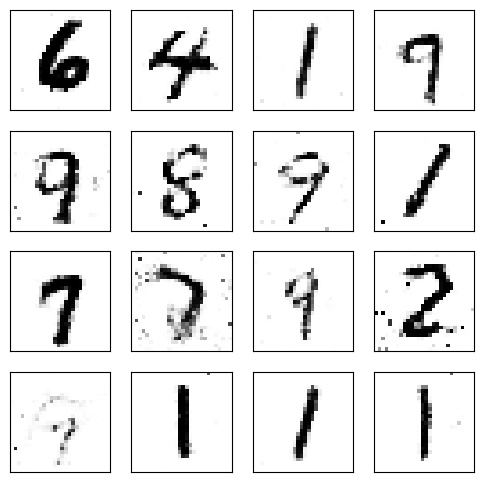

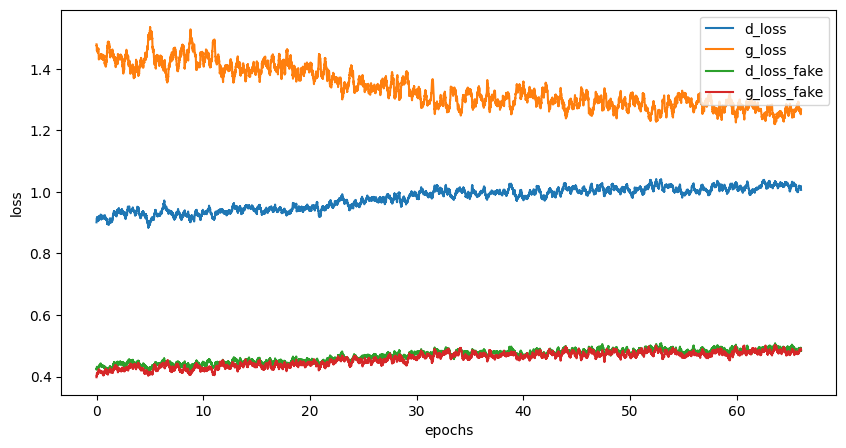

Epoch [67/160], Step[100/469], d_loss: 1.0486, d_loss_fake: 0.5742, g_loss: 1.2009, g_loss_fake: 0.5439, D(x): 0.69, D(G(z)): 0.38
Epoch [67/160], Step[200/469], d_loss: 0.9869, d_loss_fake: 0.4853, g_loss: 1.3314, g_loss_fake: 0.4701, D(x): 0.68, D(G(z)): 0.35
Epoch [67/160], Step[300/469], d_loss: 1.0906, d_loss_fake: 0.4068, g_loss: 1.5614, g_loss_fake: 0.3752, D(x): 0.58, D(G(z)): 0.29
Epoch [67/160], Step[400/469], d_loss: 0.9673, d_loss_fake: 0.4627, g_loss: 1.1159, g_loss_fake: 0.5747, D(x): 0.67, D(G(z)): 0.33


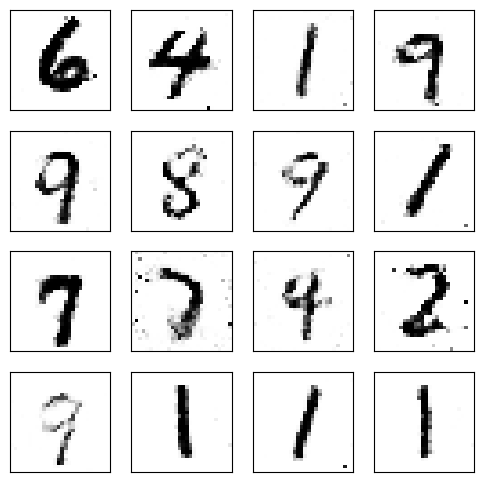

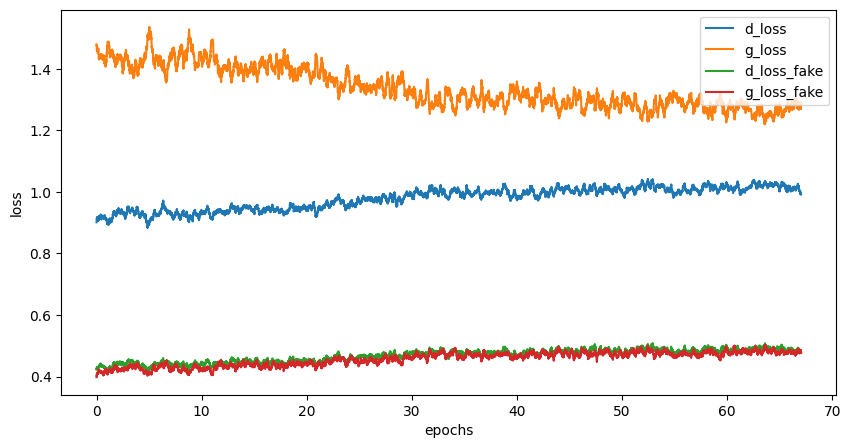

Epoch [68/160], Step[100/469], d_loss: 0.9135, d_loss_fake: 0.4180, g_loss: 1.2913, g_loss_fake: 0.4702, D(x): 0.67, D(G(z)): 0.31
Epoch [68/160], Step[200/469], d_loss: 1.1718, d_loss_fake: 0.5984, g_loss: 1.2779, g_loss_fake: 0.4292, D(x): 0.65, D(G(z)): 0.40
Epoch [68/160], Step[300/469], d_loss: 0.9810, d_loss_fake: 0.4166, g_loss: 1.3354, g_loss_fake: 0.4540, D(x): 0.64, D(G(z)): 0.31
Epoch [68/160], Step[400/469], d_loss: 0.9515, d_loss_fake: 0.4840, g_loss: 1.1818, g_loss_fake: 0.5555, D(x): 0.68, D(G(z)): 0.35


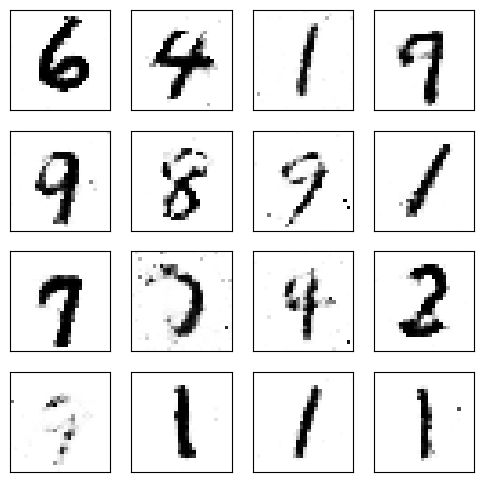

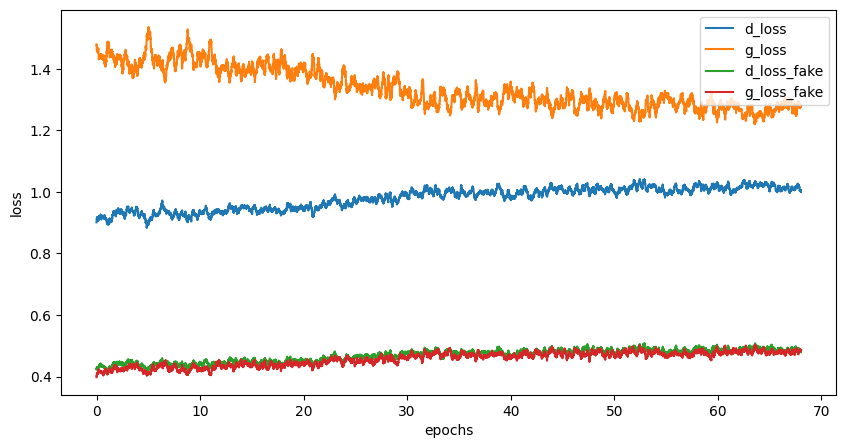

Epoch [69/160], Step[100/469], d_loss: 0.8952, d_loss_fake: 0.4661, g_loss: 1.3729, g_loss_fake: 0.4000, D(x): 0.72, D(G(z)): 0.33
Epoch [69/160], Step[200/469], d_loss: 1.0446, d_loss_fake: 0.5725, g_loss: 1.2431, g_loss_fake: 0.4844, D(x): 0.68, D(G(z)): 0.39
Epoch [69/160], Step[300/469], d_loss: 1.0676, d_loss_fake: 0.5292, g_loss: 1.3107, g_loss_fake: 0.4403, D(x): 0.66, D(G(z)): 0.36
Epoch [69/160], Step[400/469], d_loss: 0.9628, d_loss_fake: 0.4382, g_loss: 1.2635, g_loss_fake: 0.4013, D(x): 0.66, D(G(z)): 0.32


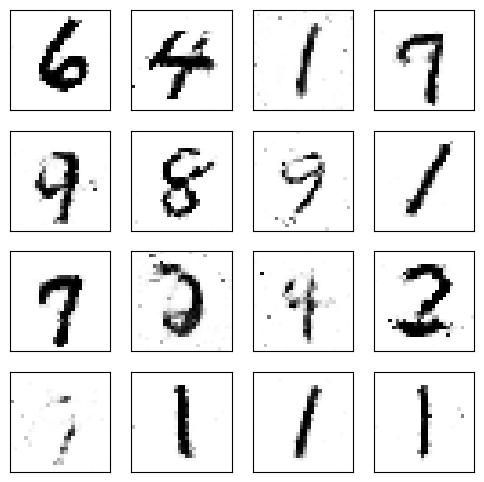

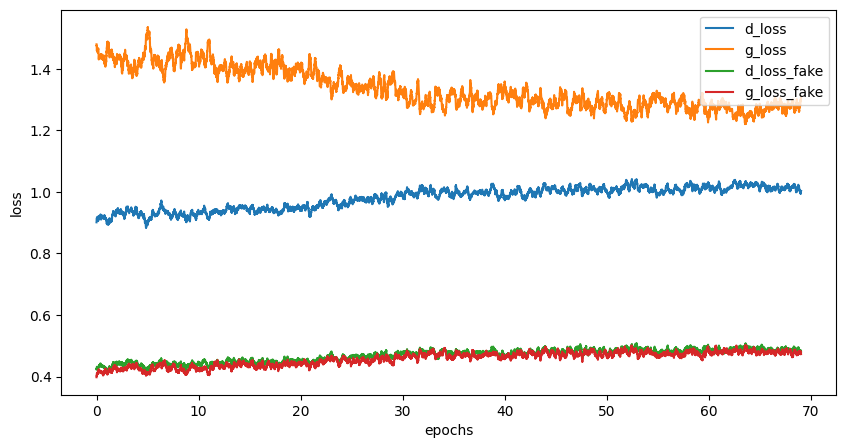

Epoch [70/160], Step[100/469], d_loss: 1.0576, d_loss_fake: 0.4497, g_loss: 1.2662, g_loss_fake: 0.4518, D(x): 0.63, D(G(z)): 0.31
Epoch [70/160], Step[200/469], d_loss: 1.0301, d_loss_fake: 0.4984, g_loss: 1.3495, g_loss_fake: 0.4492, D(x): 0.66, D(G(z)): 0.35
Epoch [70/160], Step[300/469], d_loss: 1.1456, d_loss_fake: 0.5806, g_loss: 1.0907, g_loss_fake: 0.6077, D(x): 0.65, D(G(z)): 0.38
Epoch [70/160], Step[400/469], d_loss: 1.0160, d_loss_fake: 0.4495, g_loss: 1.2835, g_loss_fake: 0.4955, D(x): 0.64, D(G(z)): 0.33


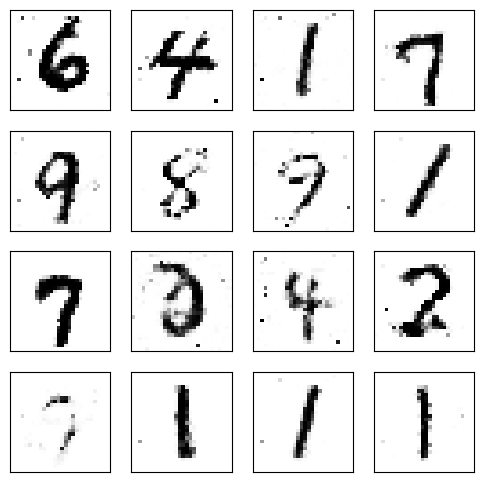

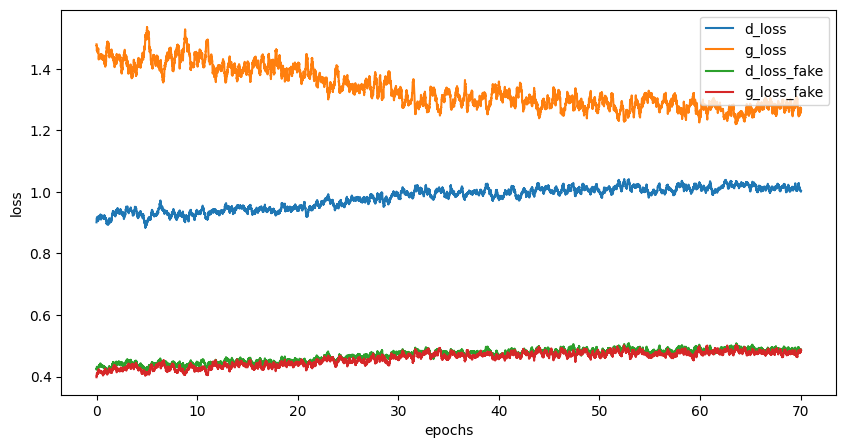

Epoch [71/160], Step[100/469], d_loss: 1.0157, d_loss_fake: 0.5634, g_loss: 1.1863, g_loss_fake: 0.5297, D(x): 0.69, D(G(z)): 0.38
Epoch [71/160], Step[200/469], d_loss: 0.9760, d_loss_fake: 0.4566, g_loss: 1.3305, g_loss_fake: 0.4399, D(x): 0.67, D(G(z)): 0.32
Epoch [71/160], Step[300/469], d_loss: 0.9786, d_loss_fake: 0.5042, g_loss: 1.1577, g_loss_fake: 0.5401, D(x): 0.69, D(G(z)): 0.35
Epoch [71/160], Step[400/469], d_loss: 1.0158, d_loss_fake: 0.4701, g_loss: 1.3550, g_loss_fake: 0.3941, D(x): 0.65, D(G(z)): 0.34


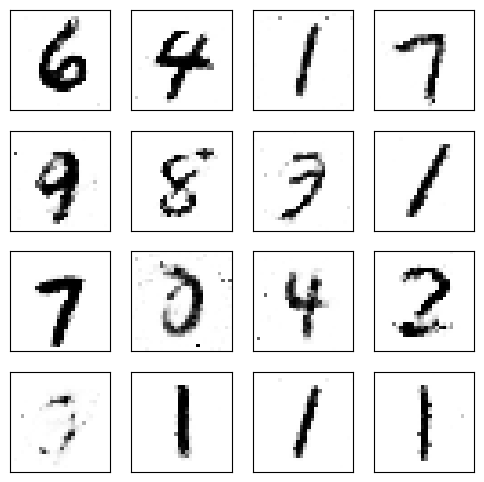

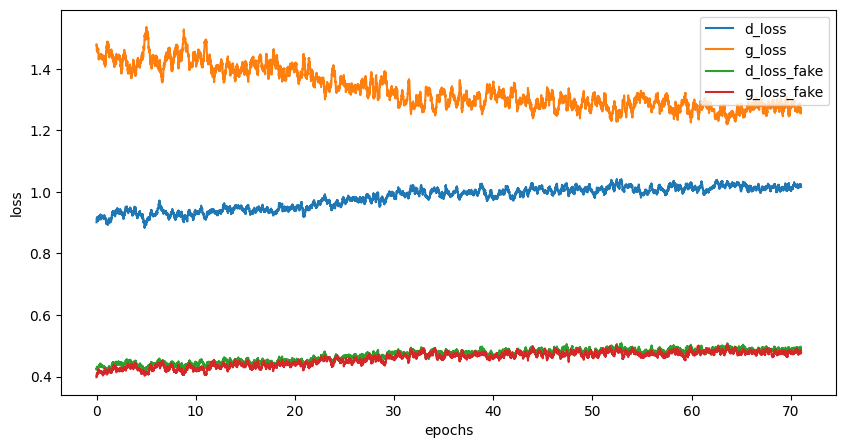

Epoch [72/160], Step[100/469], d_loss: 1.0187, d_loss_fake: 0.4516, g_loss: 1.1405, g_loss_fake: 0.5021, D(x): 0.63, D(G(z)): 0.34
Epoch [72/160], Step[200/469], d_loss: 1.1138, d_loss_fake: 0.5362, g_loss: 1.2356, g_loss_fake: 0.5318, D(x): 0.64, D(G(z)): 0.37
Epoch [72/160], Step[300/469], d_loss: 1.0847, d_loss_fake: 0.6364, g_loss: 1.1674, g_loss_fake: 0.5547, D(x): 0.70, D(G(z)): 0.42
Epoch [72/160], Step[400/469], d_loss: 1.0188, d_loss_fake: 0.4911, g_loss: 1.2207, g_loss_fake: 0.4754, D(x): 0.65, D(G(z)): 0.35


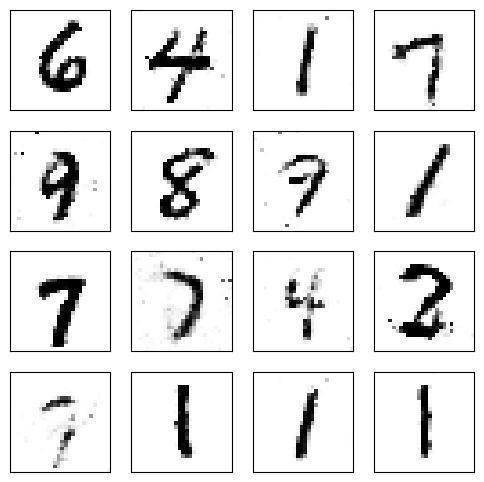

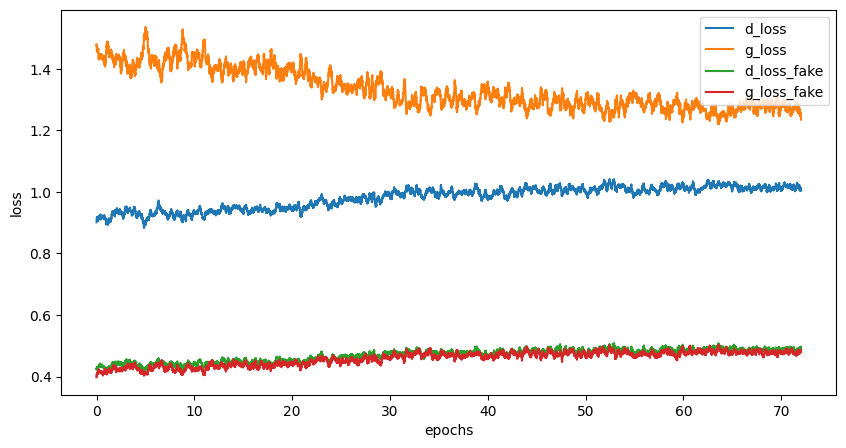

Epoch [73/160], Step[100/469], d_loss: 1.0842, d_loss_fake: 0.5582, g_loss: 1.1026, g_loss_fake: 0.5588, D(x): 0.66, D(G(z)): 0.36
Epoch [73/160], Step[200/469], d_loss: 0.9591, d_loss_fake: 0.4475, g_loss: 1.3044, g_loss_fake: 0.4573, D(x): 0.66, D(G(z)): 0.32
Epoch [73/160], Step[300/469], d_loss: 0.9888, d_loss_fake: 0.5052, g_loss: 1.2865, g_loss_fake: 0.4870, D(x): 0.68, D(G(z)): 0.35
Epoch [73/160], Step[400/469], d_loss: 1.0475, d_loss_fake: 0.4976, g_loss: 1.2920, g_loss_fake: 0.4618, D(x): 0.64, D(G(z)): 0.34


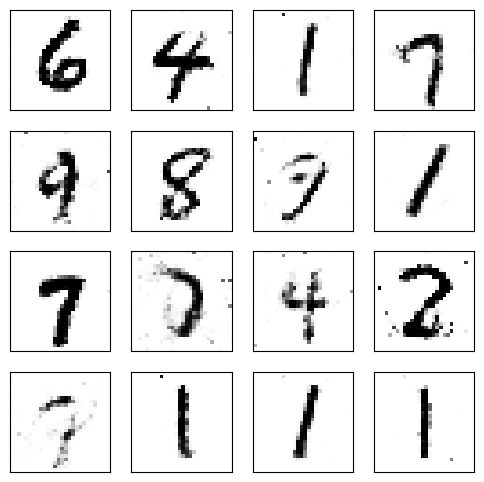

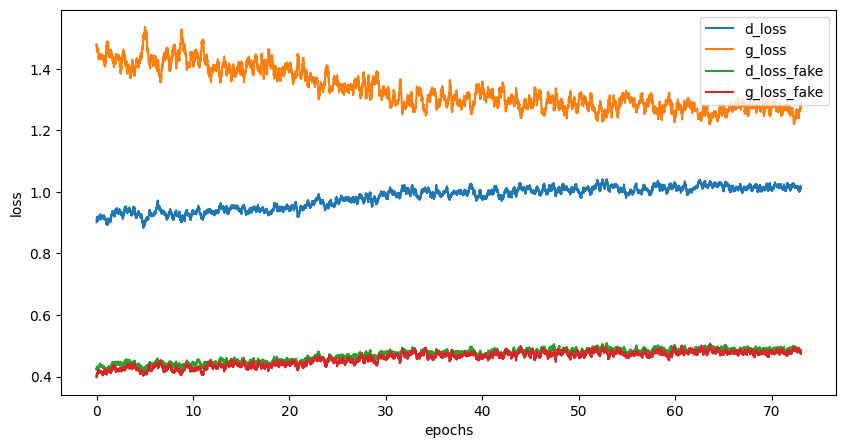

Epoch [74/160], Step[100/469], d_loss: 0.9534, d_loss_fake: 0.5305, g_loss: 1.2697, g_loss_fake: 0.5062, D(x): 0.71, D(G(z)): 0.37
Epoch [74/160], Step[200/469], d_loss: 0.9180, d_loss_fake: 0.4672, g_loss: 1.1544, g_loss_fake: 0.5431, D(x): 0.70, D(G(z)): 0.34
Epoch [74/160], Step[300/469], d_loss: 1.0212, d_loss_fake: 0.5232, g_loss: 1.1740, g_loss_fake: 0.5308, D(x): 0.67, D(G(z)): 0.35
Epoch [74/160], Step[400/469], d_loss: 1.0897, d_loss_fake: 0.5003, g_loss: 1.2958, g_loss_fake: 0.5536, D(x): 0.63, D(G(z)): 0.35


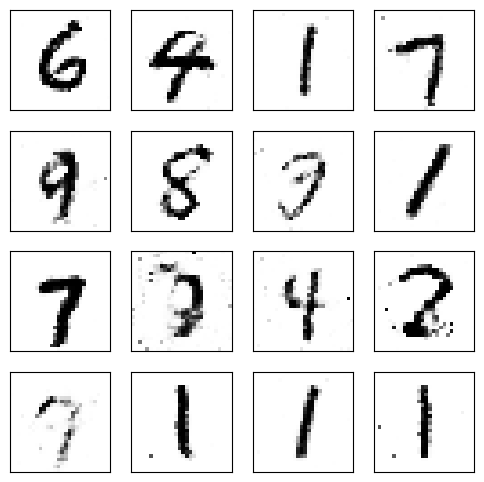

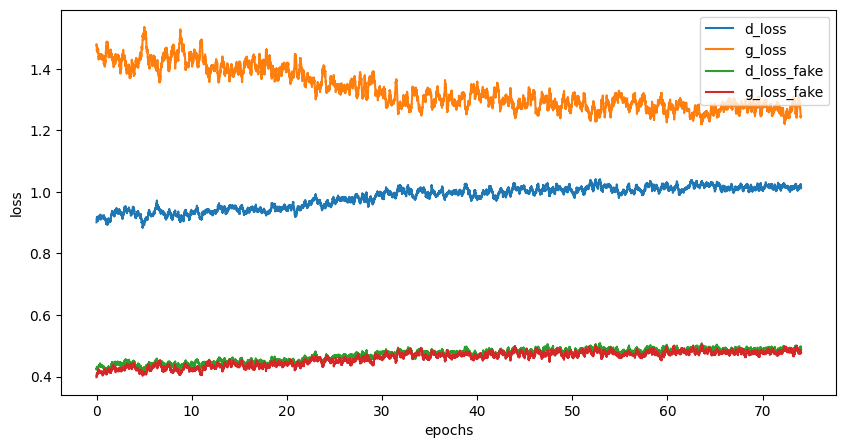

Epoch [75/160], Step[100/469], d_loss: 0.9962, d_loss_fake: 0.4483, g_loss: 1.4123, g_loss_fake: 0.3699, D(x): 0.64, D(G(z)): 0.33
Epoch [75/160], Step[200/469], d_loss: 0.9446, d_loss_fake: 0.4511, g_loss: 1.3257, g_loss_fake: 0.4498, D(x): 0.68, D(G(z)): 0.33
Epoch [75/160], Step[300/469], d_loss: 1.0839, d_loss_fake: 0.5102, g_loss: 1.3469, g_loss_fake: 0.4551, D(x): 0.63, D(G(z)): 0.37
Epoch [75/160], Step[400/469], d_loss: 1.0462, d_loss_fake: 0.5319, g_loss: 1.1554, g_loss_fake: 0.4972, D(x): 0.67, D(G(z)): 0.36


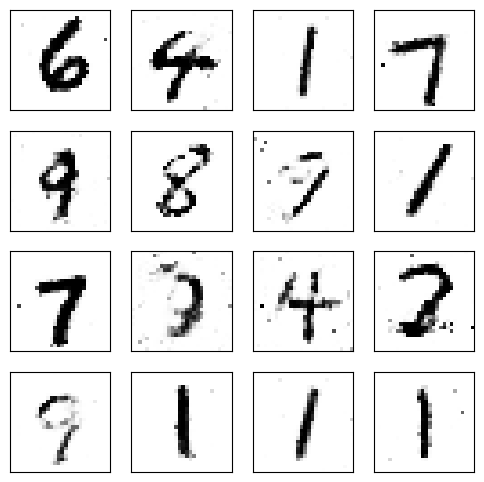

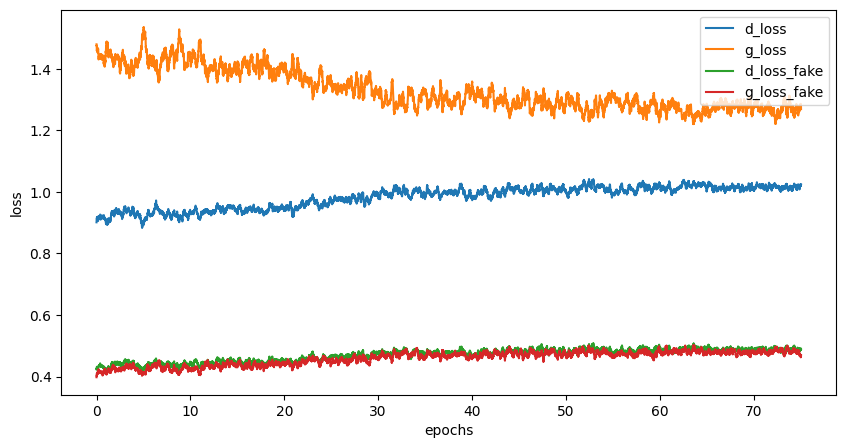

Epoch [76/160], Step[100/469], d_loss: 0.9693, d_loss_fake: 0.4567, g_loss: 1.2732, g_loss_fake: 0.4463, D(x): 0.66, D(G(z)): 0.34
Epoch [76/160], Step[200/469], d_loss: 1.0432, d_loss_fake: 0.5389, g_loss: 1.0982, g_loss_fake: 0.6167, D(x): 0.67, D(G(z)): 0.37
Epoch [76/160], Step[300/469], d_loss: 1.1470, d_loss_fake: 0.3874, g_loss: 1.3757, g_loss_fake: 0.4001, D(x): 0.56, D(G(z)): 0.29
Epoch [76/160], Step[400/469], d_loss: 0.9169, d_loss_fake: 0.4507, g_loss: 1.3605, g_loss_fake: 0.4006, D(x): 0.68, D(G(z)): 0.33


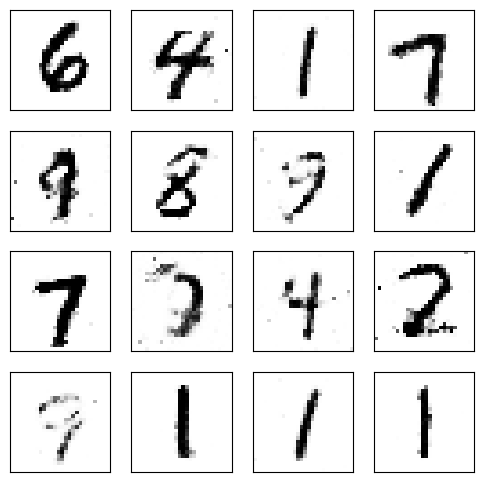

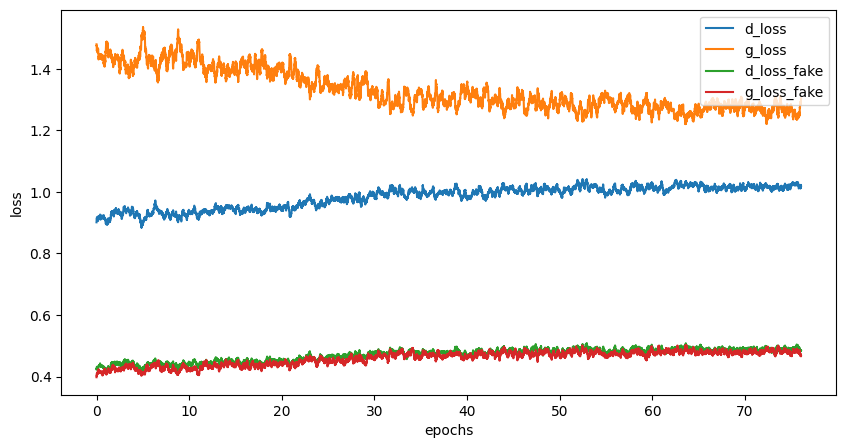

Epoch [77/160], Step[100/469], d_loss: 0.9683, d_loss_fake: 0.4387, g_loss: 1.2097, g_loss_fake: 0.4843, D(x): 0.67, D(G(z)): 0.33
Epoch [77/160], Step[200/469], d_loss: 1.0582, d_loss_fake: 0.5266, g_loss: 1.2278, g_loss_fake: 0.5053, D(x): 0.66, D(G(z)): 0.35
Epoch [77/160], Step[300/469], d_loss: 0.8429, d_loss_fake: 0.3318, g_loss: 1.3564, g_loss_fake: 0.4315, D(x): 0.65, D(G(z)): 0.27
Epoch [77/160], Step[400/469], d_loss: 0.9740, d_loss_fake: 0.4534, g_loss: 1.3457, g_loss_fake: 0.4248, D(x): 0.68, D(G(z)): 0.32


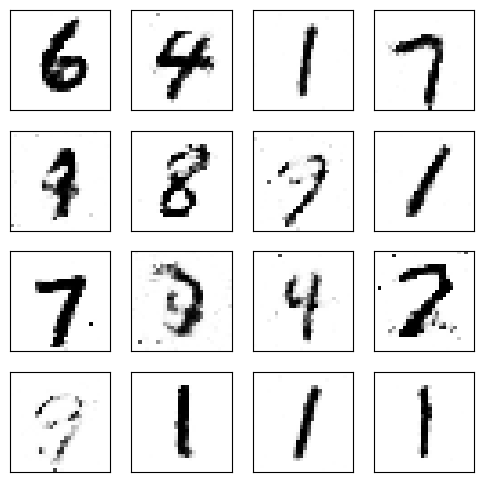

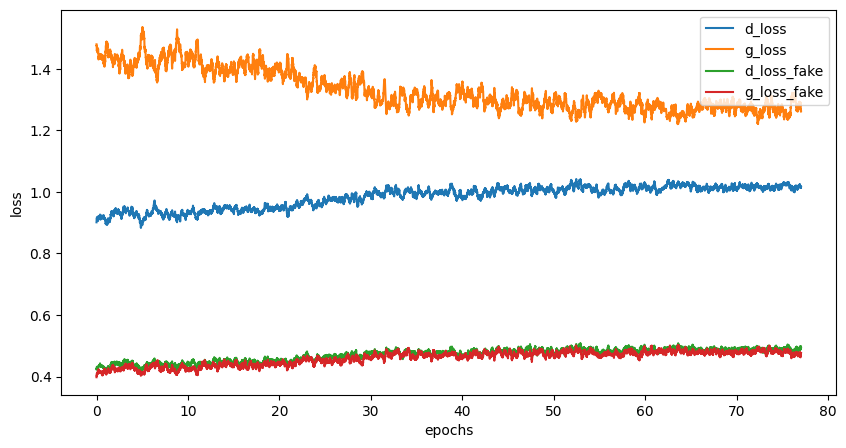

Epoch [78/160], Step[100/469], d_loss: 1.0080, d_loss_fake: 0.4837, g_loss: 1.1598, g_loss_fake: 0.4755, D(x): 0.66, D(G(z)): 0.35
Epoch [78/160], Step[200/469], d_loss: 0.9645, d_loss_fake: 0.4656, g_loss: 1.2529, g_loss_fake: 0.4775, D(x): 0.67, D(G(z)): 0.34
Epoch [78/160], Step[300/469], d_loss: 1.0197, d_loss_fake: 0.4872, g_loss: 1.2577, g_loss_fake: 0.5255, D(x): 0.65, D(G(z)): 0.35
Epoch [78/160], Step[400/469], d_loss: 1.0566, d_loss_fake: 0.4419, g_loss: 1.4729, g_loss_fake: 0.3345, D(x): 0.62, D(G(z)): 0.32


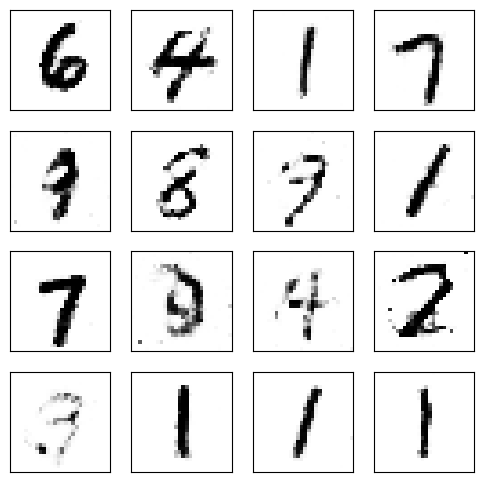

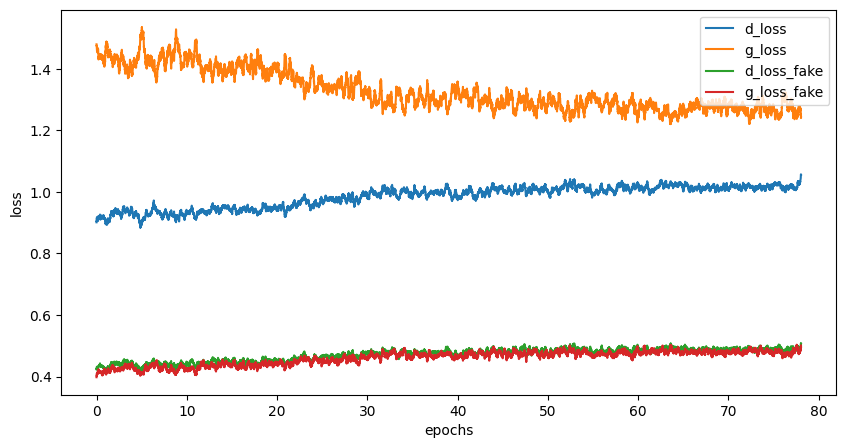

Epoch [79/160], Step[100/469], d_loss: 1.0323, d_loss_fake: 0.4116, g_loss: 1.2768, g_loss_fake: 0.4410, D(x): 0.63, D(G(z)): 0.31
Epoch [79/160], Step[200/469], d_loss: 0.9962, d_loss_fake: 0.5755, g_loss: 1.1863, g_loss_fake: 0.4908, D(x): 0.71, D(G(z)): 0.38
Epoch [79/160], Step[300/469], d_loss: 1.0106, d_loss_fake: 0.5296, g_loss: 1.3847, g_loss_fake: 0.4246, D(x): 0.69, D(G(z)): 0.35
Epoch [79/160], Step[400/469], d_loss: 0.9876, d_loss_fake: 0.4292, g_loss: 1.2744, g_loss_fake: 0.4789, D(x): 0.65, D(G(z)): 0.32


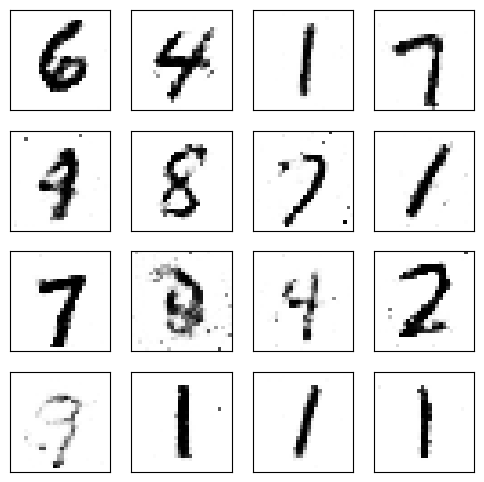

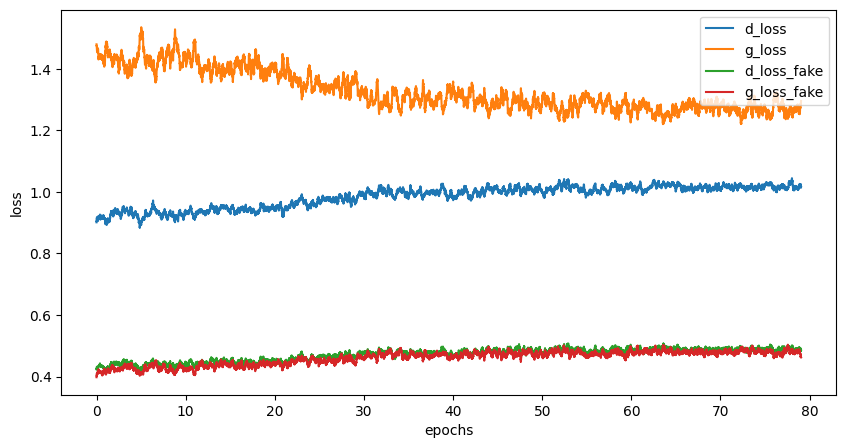

Epoch [80/160], Step[100/469], d_loss: 1.0339, d_loss_fake: 0.4943, g_loss: 1.2461, g_loss_fake: 0.5712, D(x): 0.68, D(G(z)): 0.34
Epoch [80/160], Step[200/469], d_loss: 0.9136, d_loss_fake: 0.5197, g_loss: 1.1752, g_loss_fake: 0.5617, D(x): 0.73, D(G(z)): 0.35
Epoch [80/160], Step[300/469], d_loss: 0.9154, d_loss_fake: 0.4967, g_loss: 1.1553, g_loss_fake: 0.5459, D(x): 0.71, D(G(z)): 0.36
Epoch [80/160], Step[400/469], d_loss: 0.8972, d_loss_fake: 0.4117, g_loss: 1.2526, g_loss_fake: 0.4433, D(x): 0.68, D(G(z)): 0.32


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

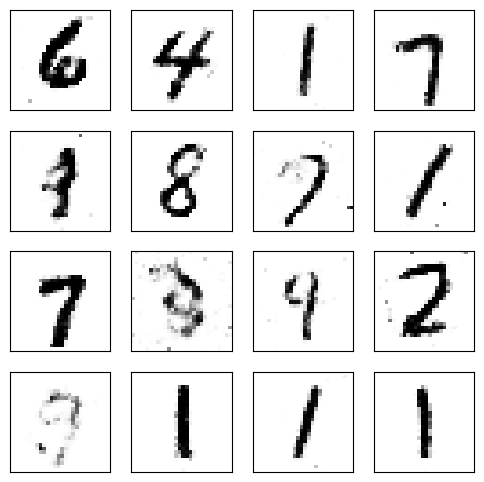

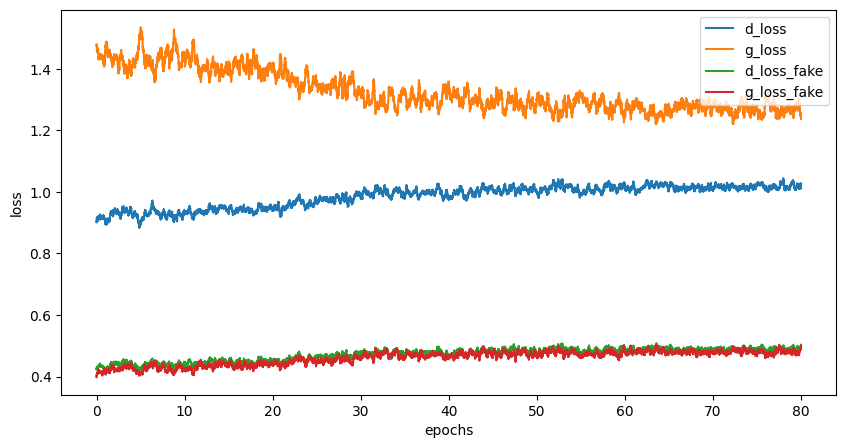

Epoch [81/160], Step[100/469], d_loss: 0.9395, d_loss_fake: 0.5097, g_loss: 1.0210, g_loss_fake: 0.6039, D(x): 0.71, D(G(z)): 0.35
Epoch [81/160], Step[200/469], d_loss: 0.9454, d_loss_fake: 0.5168, g_loss: 1.2546, g_loss_fake: 0.5293, D(x): 0.70, D(G(z)): 0.36
Epoch [81/160], Step[300/469], d_loss: 0.9514, d_loss_fake: 0.5271, g_loss: 1.2586, g_loss_fake: 0.4445, D(x): 0.71, D(G(z)): 0.37
Epoch [81/160], Step[400/469], d_loss: 0.9822, d_loss_fake: 0.4960, g_loss: 1.1937, g_loss_fake: 0.4728, D(x): 0.67, D(G(z)): 0.34


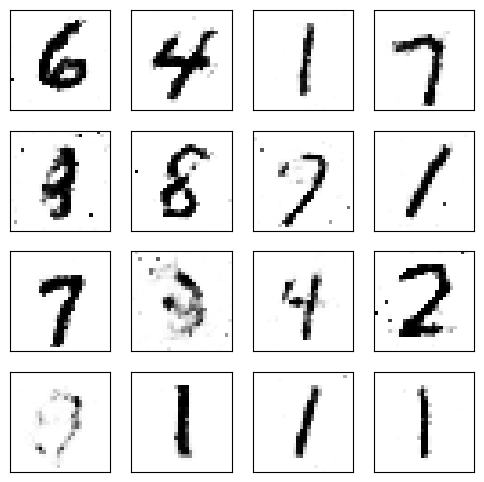

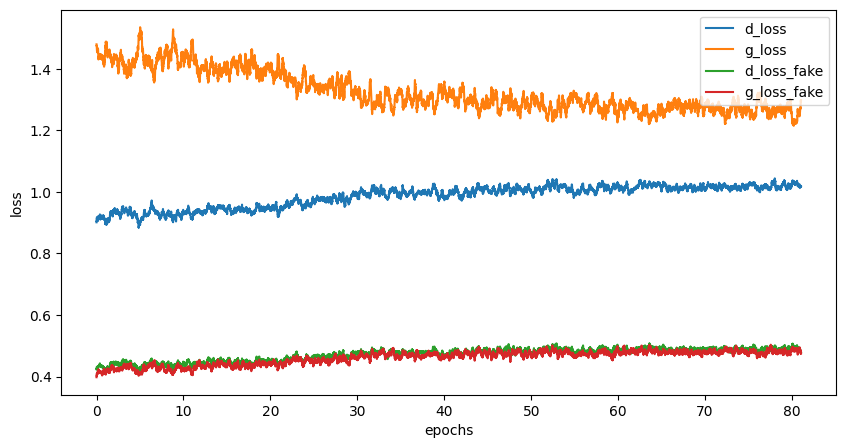

Epoch [82/160], Step[100/469], d_loss: 1.0118, d_loss_fake: 0.4930, g_loss: 1.2820, g_loss_fake: 0.5048, D(x): 0.66, D(G(z)): 0.35
Epoch [82/160], Step[200/469], d_loss: 1.0808, d_loss_fake: 0.5911, g_loss: 1.1780, g_loss_fake: 0.5733, D(x): 0.67, D(G(z)): 0.39
Epoch [82/160], Step[300/469], d_loss: 1.0280, d_loss_fake: 0.3767, g_loss: 1.5673, g_loss_fake: 0.4040, D(x): 0.60, D(G(z)): 0.28
Epoch [82/160], Step[400/469], d_loss: 1.1688, d_loss_fake: 0.5739, g_loss: 1.1288, g_loss_fake: 0.5106, D(x): 0.61, D(G(z)): 0.39


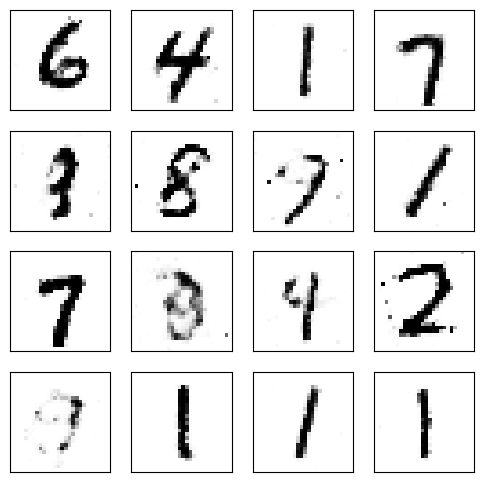

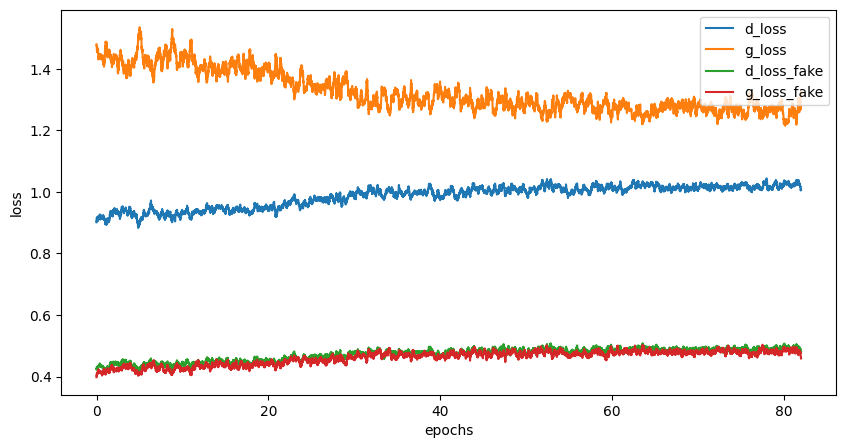

Epoch [83/160], Step[100/469], d_loss: 0.9858, d_loss_fake: 0.4723, g_loss: 1.2630, g_loss_fake: 0.4761, D(x): 0.67, D(G(z)): 0.34
Epoch [83/160], Step[200/469], d_loss: 0.9855, d_loss_fake: 0.4551, g_loss: 1.3586, g_loss_fake: 0.4280, D(x): 0.66, D(G(z)): 0.33
Epoch [83/160], Step[300/469], d_loss: 1.1031, d_loss_fake: 0.4659, g_loss: 1.4069, g_loss_fake: 0.4289, D(x): 0.61, D(G(z)): 0.32
Epoch [83/160], Step[400/469], d_loss: 1.0540, d_loss_fake: 0.4848, g_loss: 1.3212, g_loss_fake: 0.4264, D(x): 0.65, D(G(z)): 0.34


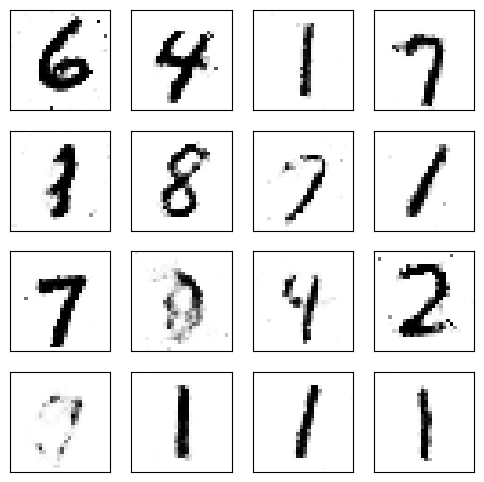

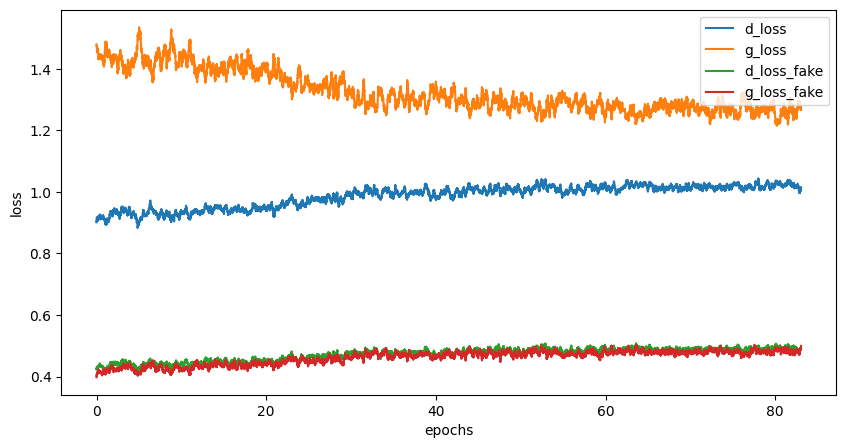

Epoch [84/160], Step[100/469], d_loss: 0.9989, d_loss_fake: 0.4991, g_loss: 1.1781, g_loss_fake: 0.5626, D(x): 0.68, D(G(z)): 0.36
Epoch [84/160], Step[200/469], d_loss: 1.0257, d_loss_fake: 0.4275, g_loss: 1.2945, g_loss_fake: 0.4547, D(x): 0.61, D(G(z)): 0.32
Epoch [84/160], Step[300/469], d_loss: 1.0262, d_loss_fake: 0.4107, g_loss: 1.4245, g_loss_fake: 0.3644, D(x): 0.61, D(G(z)): 0.30
Epoch [84/160], Step[400/469], d_loss: 1.0020, d_loss_fake: 0.5103, g_loss: 1.1484, g_loss_fake: 0.5493, D(x): 0.68, D(G(z)): 0.36


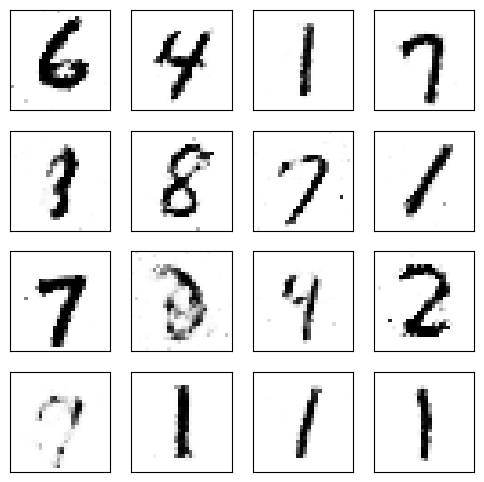

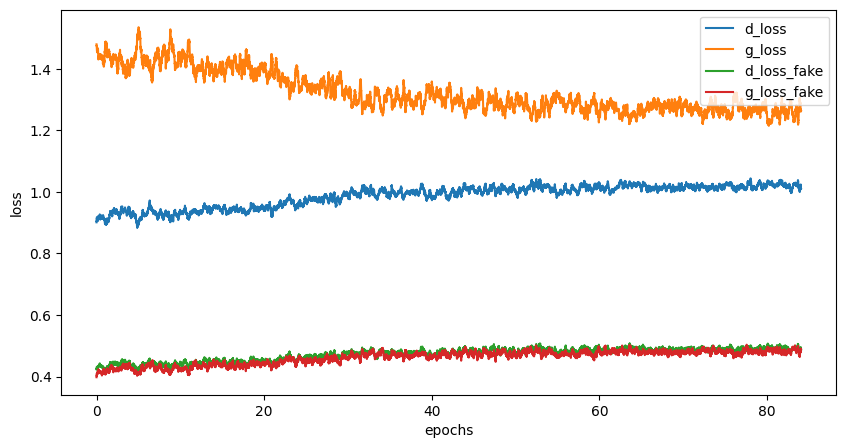

Epoch [85/160], Step[100/469], d_loss: 0.9969, d_loss_fake: 0.5296, g_loss: 1.1539, g_loss_fake: 0.5617, D(x): 0.69, D(G(z)): 0.37
Epoch [85/160], Step[200/469], d_loss: 1.0054, d_loss_fake: 0.5070, g_loss: 1.3658, g_loss_fake: 0.4369, D(x): 0.68, D(G(z)): 0.34
Epoch [85/160], Step[300/469], d_loss: 1.0146, d_loss_fake: 0.3923, g_loss: 1.1615, g_loss_fake: 0.5219, D(x): 0.62, D(G(z)): 0.30
Epoch [85/160], Step[400/469], d_loss: 0.9693, d_loss_fake: 0.5281, g_loss: 1.1227, g_loss_fake: 0.5569, D(x): 0.70, D(G(z)): 0.37


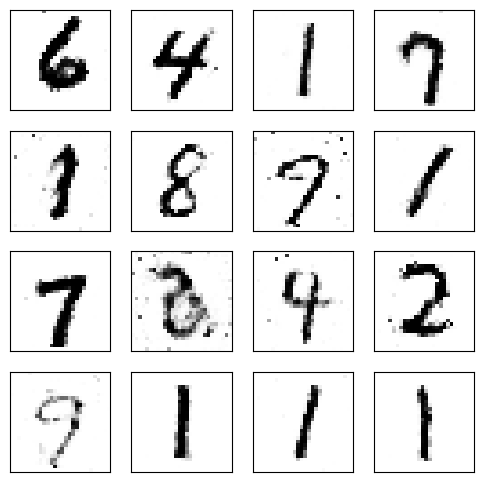

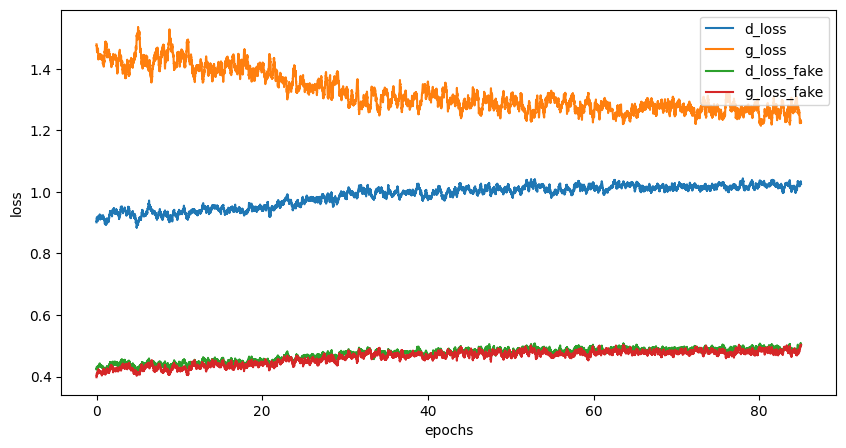

Epoch [86/160], Step[100/469], d_loss: 0.9909, d_loss_fake: 0.4629, g_loss: 1.3083, g_loss_fake: 0.4960, D(x): 0.65, D(G(z)): 0.33
Epoch [86/160], Step[200/469], d_loss: 1.0208, d_loss_fake: 0.4673, g_loss: 1.2723, g_loss_fake: 0.4948, D(x): 0.64, D(G(z)): 0.35
Epoch [86/160], Step[300/469], d_loss: 1.0555, d_loss_fake: 0.4882, g_loss: 1.2783, g_loss_fake: 0.5367, D(x): 0.63, D(G(z)): 0.34
Epoch [86/160], Step[400/469], d_loss: 1.0553, d_loss_fake: 0.4912, g_loss: 1.2110, g_loss_fake: 0.5028, D(x): 0.64, D(G(z)): 0.33


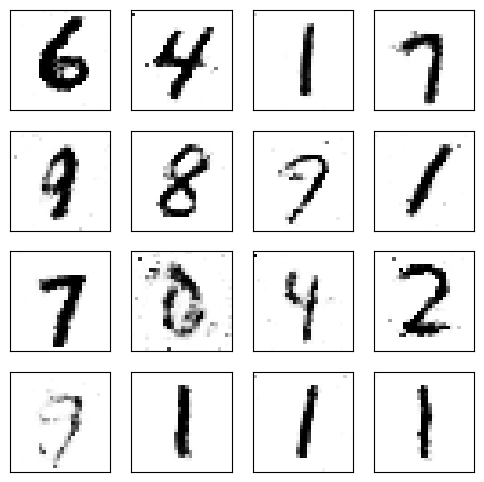

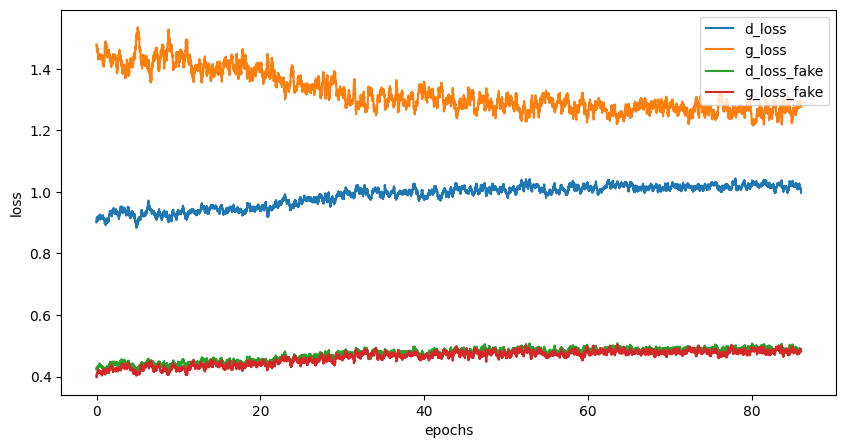

Epoch [87/160], Step[100/469], d_loss: 1.0558, d_loss_fake: 0.5489, g_loss: 1.3176, g_loss_fake: 0.4857, D(x): 0.67, D(G(z)): 0.35
Epoch [87/160], Step[200/469], d_loss: 0.9268, d_loss_fake: 0.3494, g_loss: 1.4174, g_loss_fake: 0.3939, D(x): 0.62, D(G(z)): 0.27
Epoch [87/160], Step[300/469], d_loss: 0.9855, d_loss_fake: 0.4775, g_loss: 1.3971, g_loss_fake: 0.3558, D(x): 0.67, D(G(z)): 0.33
Epoch [87/160], Step[400/469], d_loss: 0.9874, d_loss_fake: 0.4074, g_loss: 1.2446, g_loss_fake: 0.5100, D(x): 0.65, D(G(z)): 0.30


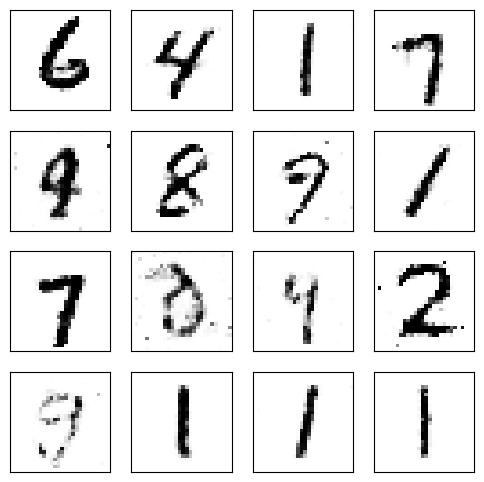

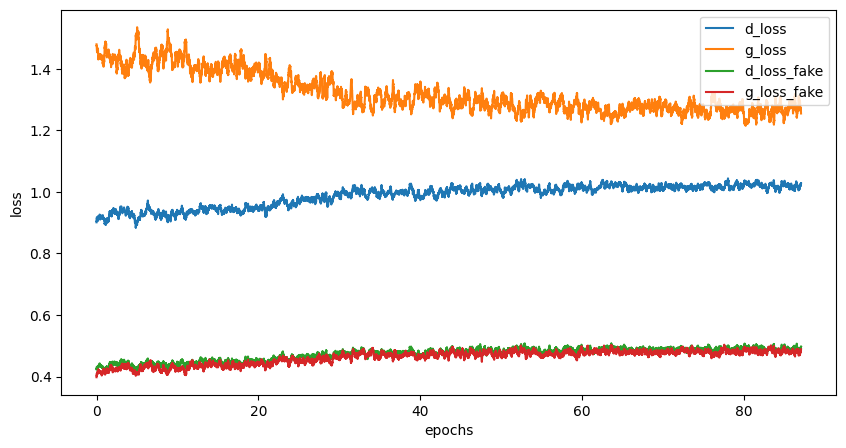

Epoch [88/160], Step[100/469], d_loss: 1.0983, d_loss_fake: 0.5567, g_loss: 1.3249, g_loss_fake: 0.4133, D(x): 0.64, D(G(z)): 0.36
Epoch [88/160], Step[200/469], d_loss: 1.0099, d_loss_fake: 0.4528, g_loss: 1.1695, g_loss_fake: 0.4796, D(x): 0.65, D(G(z)): 0.33
Epoch [88/160], Step[300/469], d_loss: 1.0677, d_loss_fake: 0.6129, g_loss: 1.1575, g_loss_fake: 0.5193, D(x): 0.70, D(G(z)): 0.38
Epoch [88/160], Step[400/469], d_loss: 1.0464, d_loss_fake: 0.4454, g_loss: 1.3689, g_loss_fake: 0.5194, D(x): 0.63, D(G(z)): 0.32


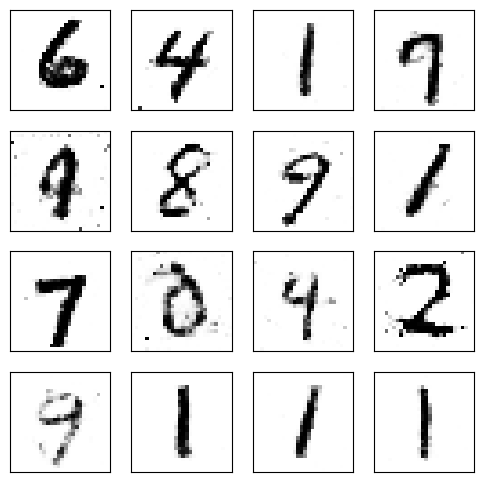

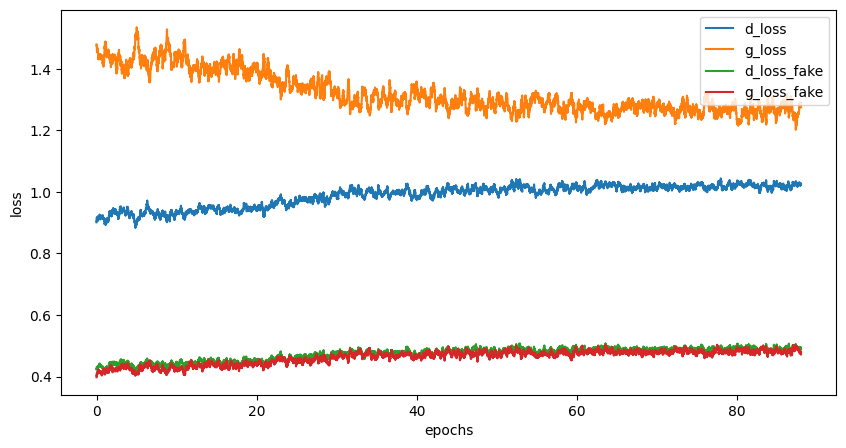

Epoch [89/160], Step[100/469], d_loss: 1.1410, d_loss_fake: 0.5344, g_loss: 1.3360, g_loss_fake: 0.4176, D(x): 0.62, D(G(z)): 0.35
Epoch [89/160], Step[200/469], d_loss: 0.9813, d_loss_fake: 0.5361, g_loss: 1.2112, g_loss_fake: 0.4910, D(x): 0.70, D(G(z)): 0.37
Epoch [89/160], Step[300/469], d_loss: 0.9510, d_loss_fake: 0.5108, g_loss: 1.1753, g_loss_fake: 0.5235, D(x): 0.72, D(G(z)): 0.35
Epoch [89/160], Step[400/469], d_loss: 1.1441, d_loss_fake: 0.6590, g_loss: 1.1218, g_loss_fake: 0.4886, D(x): 0.68, D(G(z)): 0.41


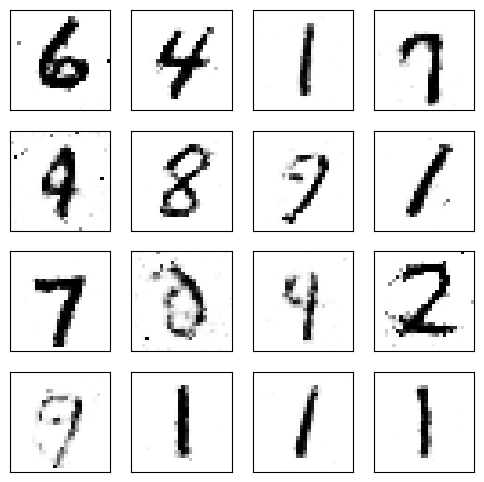

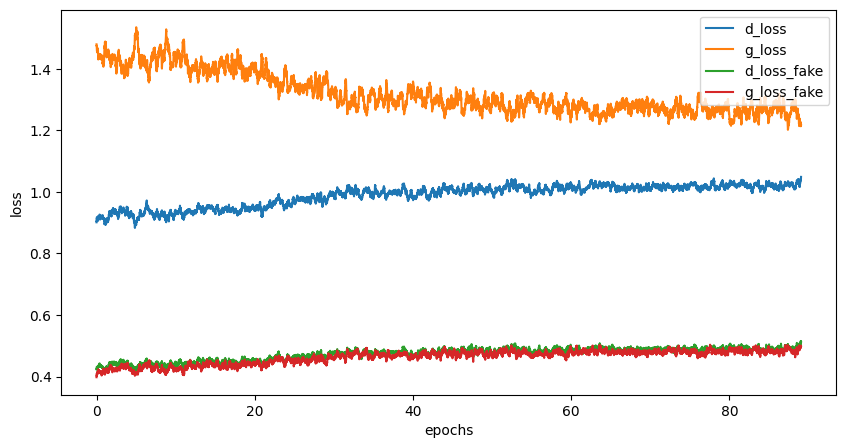

Epoch [90/160], Step[100/469], d_loss: 0.9908, d_loss_fake: 0.3939, g_loss: 1.2683, g_loss_fake: 0.4963, D(x): 0.63, D(G(z)): 0.29
Epoch [90/160], Step[200/469], d_loss: 0.9772, d_loss_fake: 0.4541, g_loss: 1.2047, g_loss_fake: 0.4758, D(x): 0.66, D(G(z)): 0.33
Epoch [90/160], Step[300/469], d_loss: 1.1283, d_loss_fake: 0.5870, g_loss: 1.1235, g_loss_fake: 0.6218, D(x): 0.64, D(G(z)): 0.40
Epoch [90/160], Step[400/469], d_loss: 0.9740, d_loss_fake: 0.4844, g_loss: 1.2244, g_loss_fake: 0.5105, D(x): 0.68, D(G(z)): 0.33


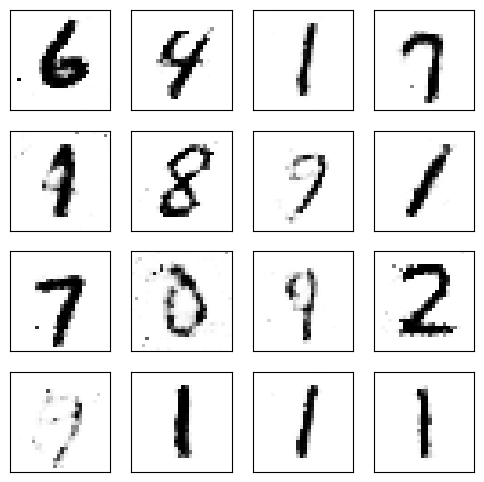

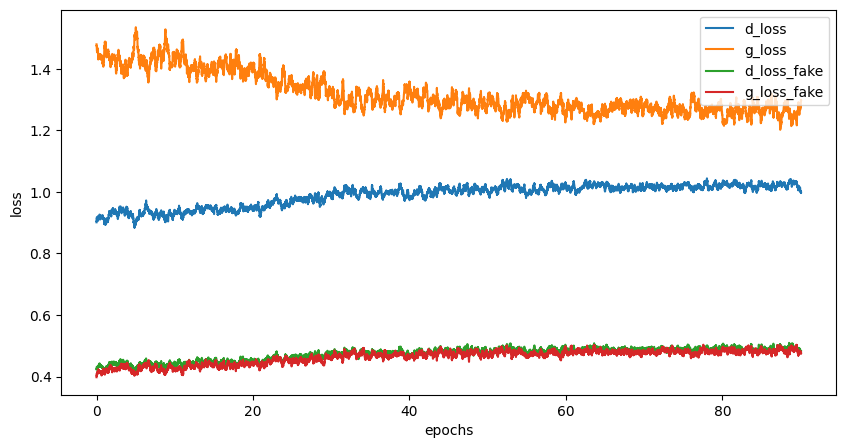

Epoch [91/160], Step[100/469], d_loss: 1.0179, d_loss_fake: 0.5107, g_loss: 1.2000, g_loss_fake: 0.5255, D(x): 0.66, D(G(z)): 0.36
Epoch [91/160], Step[200/469], d_loss: 0.9819, d_loss_fake: 0.4542, g_loss: 1.3537, g_loss_fake: 0.4194, D(x): 0.67, D(G(z)): 0.32
Epoch [91/160], Step[300/469], d_loss: 1.0028, d_loss_fake: 0.5677, g_loss: 1.2336, g_loss_fake: 0.4832, D(x): 0.71, D(G(z)): 0.38
Epoch [91/160], Step[400/469], d_loss: 1.0953, d_loss_fake: 0.5087, g_loss: 1.3793, g_loss_fake: 0.4154, D(x): 0.62, D(G(z)): 0.35


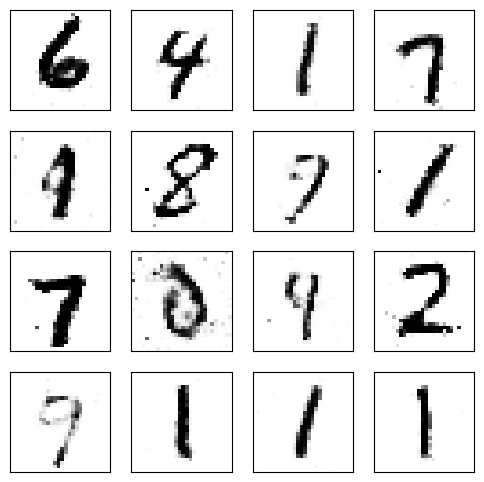

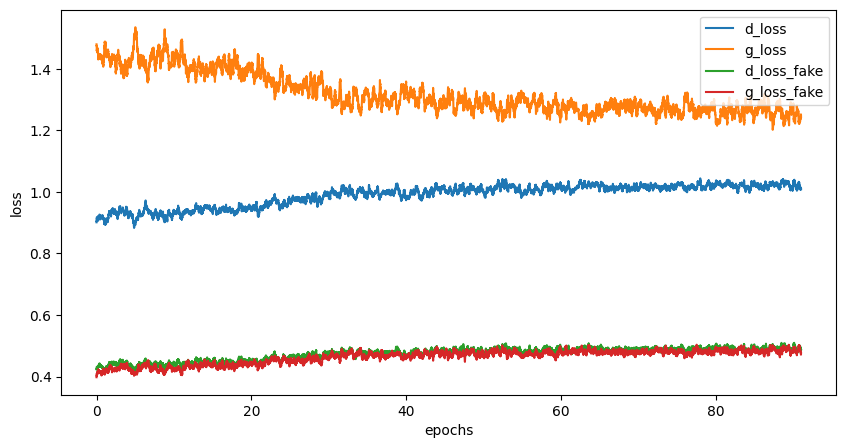

Epoch [92/160], Step[100/469], d_loss: 0.9292, d_loss_fake: 0.4398, g_loss: 1.1729, g_loss_fake: 0.5021, D(x): 0.69, D(G(z)): 0.32
Epoch [92/160], Step[200/469], d_loss: 0.9858, d_loss_fake: 0.4398, g_loss: 1.4528, g_loss_fake: 0.3939, D(x): 0.65, D(G(z)): 0.31
Epoch [92/160], Step[300/469], d_loss: 0.9264, d_loss_fake: 0.4156, g_loss: 1.2698, g_loss_fake: 0.4730, D(x): 0.65, D(G(z)): 0.32
Epoch [92/160], Step[400/469], d_loss: 1.1155, d_loss_fake: 0.4869, g_loss: 1.3075, g_loss_fake: 0.4487, D(x): 0.61, D(G(z)): 0.35


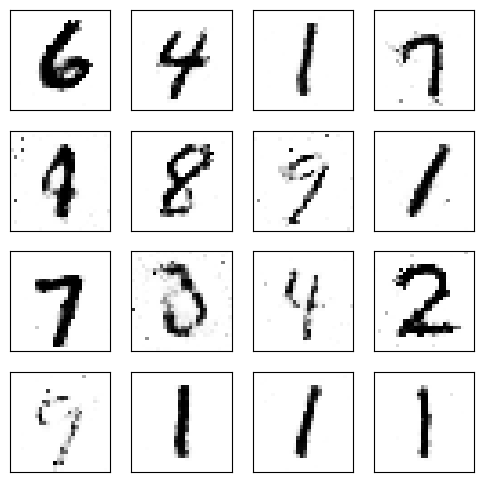

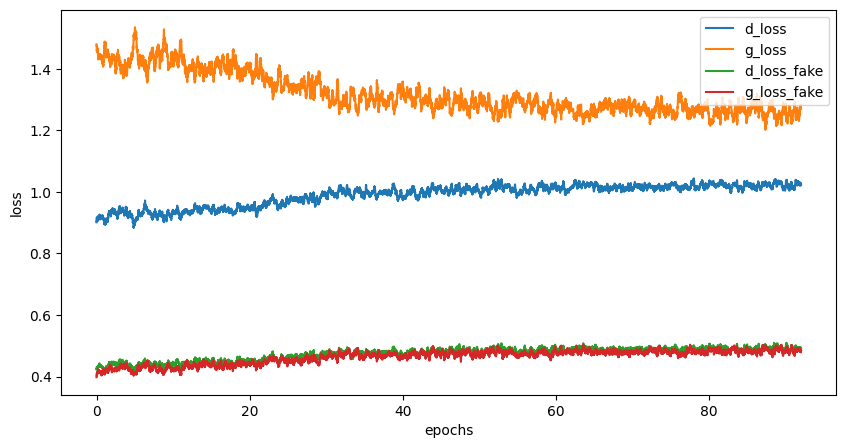

Epoch [93/160], Step[100/469], d_loss: 0.9424, d_loss_fake: 0.4661, g_loss: 1.4035, g_loss_fake: 0.5260, D(x): 0.69, D(G(z)): 0.32
Epoch [93/160], Step[200/469], d_loss: 1.1902, d_loss_fake: 0.5422, g_loss: 1.2440, g_loss_fake: 0.5321, D(x): 0.59, D(G(z)): 0.35
Epoch [93/160], Step[300/469], d_loss: 1.1228, d_loss_fake: 0.5419, g_loss: 1.0999, g_loss_fake: 0.5552, D(x): 0.62, D(G(z)): 0.38
Epoch [93/160], Step[400/469], d_loss: 0.9571, d_loss_fake: 0.3967, g_loss: 1.2605, g_loss_fake: 0.4866, D(x): 0.65, D(G(z)): 0.30


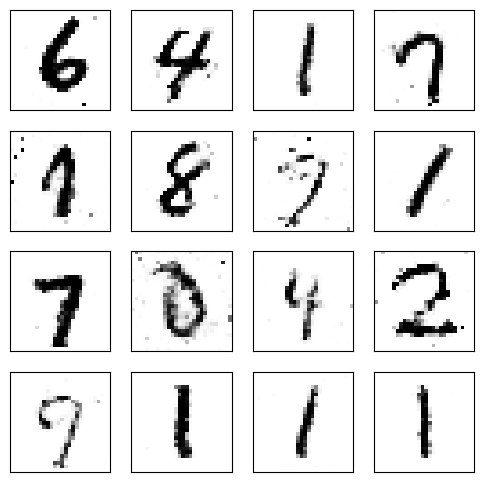

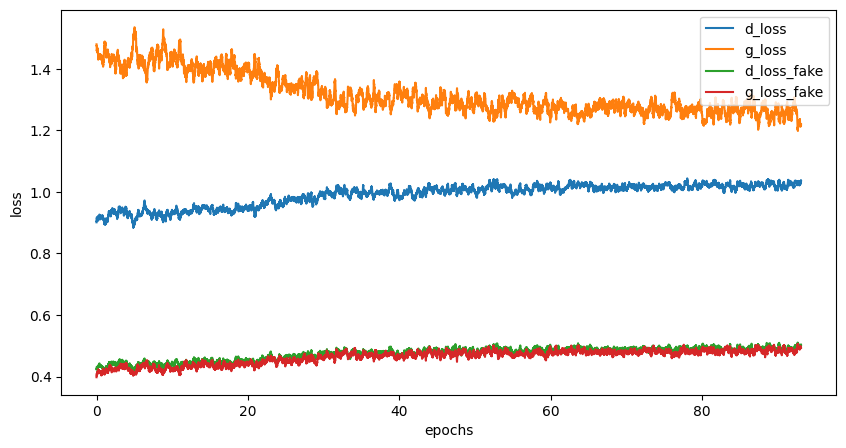

Epoch [94/160], Step[100/469], d_loss: 1.0731, d_loss_fake: 0.5485, g_loss: 1.2305, g_loss_fake: 0.5064, D(x): 0.66, D(G(z)): 0.38
Epoch [94/160], Step[200/469], d_loss: 0.9852, d_loss_fake: 0.4952, g_loss: 1.4574, g_loss_fake: 0.3509, D(x): 0.67, D(G(z)): 0.34
Epoch [94/160], Step[300/469], d_loss: 1.0152, d_loss_fake: 0.4706, g_loss: 1.3093, g_loss_fake: 0.4607, D(x): 0.64, D(G(z)): 0.34
Epoch [94/160], Step[400/469], d_loss: 1.0228, d_loss_fake: 0.5135, g_loss: 1.3249, g_loss_fake: 0.4656, D(x): 0.67, D(G(z)): 0.35


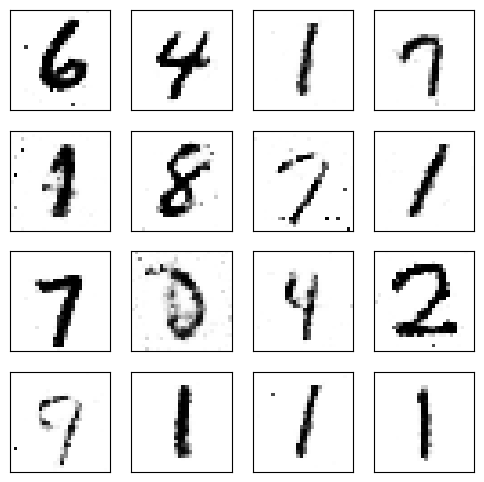

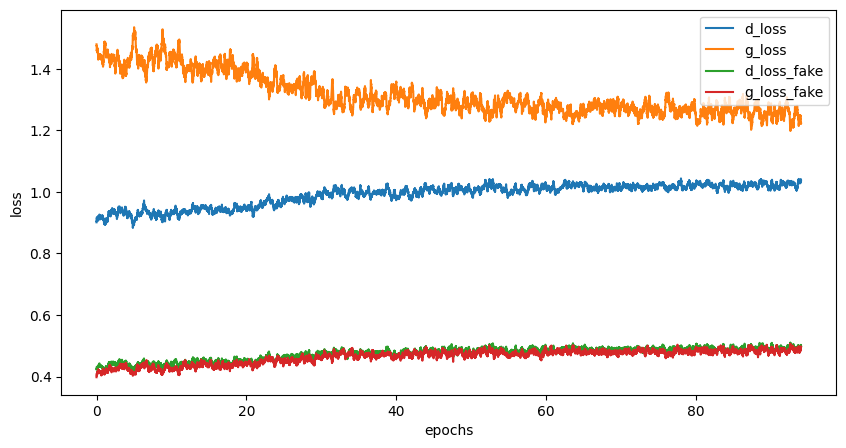

Epoch [95/160], Step[100/469], d_loss: 0.9651, d_loss_fake: 0.4320, g_loss: 1.2651, g_loss_fake: 0.4334, D(x): 0.65, D(G(z)): 0.32
Epoch [95/160], Step[200/469], d_loss: 0.9703, d_loss_fake: 0.4457, g_loss: 1.3077, g_loss_fake: 0.4509, D(x): 0.66, D(G(z)): 0.31
Epoch [95/160], Step[300/469], d_loss: 1.0293, d_loss_fake: 0.5652, g_loss: 1.1509, g_loss_fake: 0.5651, D(x): 0.69, D(G(z)): 0.39
Epoch [95/160], Step[400/469], d_loss: 0.9839, d_loss_fake: 0.4271, g_loss: 1.3270, g_loss_fake: 0.4125, D(x): 0.64, D(G(z)): 0.32


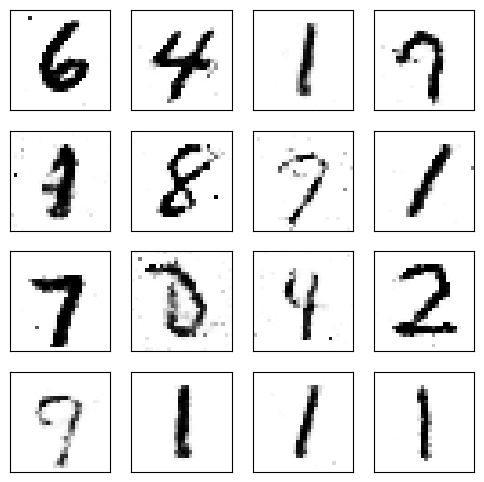

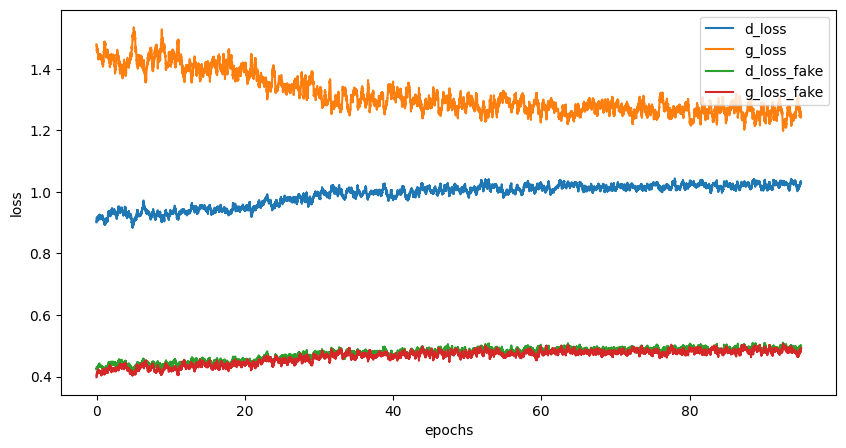

Epoch [96/160], Step[100/469], d_loss: 1.1019, d_loss_fake: 0.5219, g_loss: 1.2058, g_loss_fake: 0.4914, D(x): 0.62, D(G(z)): 0.35
Epoch [96/160], Step[200/469], d_loss: 1.0920, d_loss_fake: 0.4527, g_loss: 1.3551, g_loss_fake: 0.4296, D(x): 0.59, D(G(z)): 0.33
Epoch [96/160], Step[300/469], d_loss: 0.9696, d_loss_fake: 0.4498, g_loss: 1.2534, g_loss_fake: 0.4552, D(x): 0.66, D(G(z)): 0.32
Epoch [96/160], Step[400/469], d_loss: 1.0029, d_loss_fake: 0.4581, g_loss: 1.1838, g_loss_fake: 0.5500, D(x): 0.65, D(G(z)): 0.34


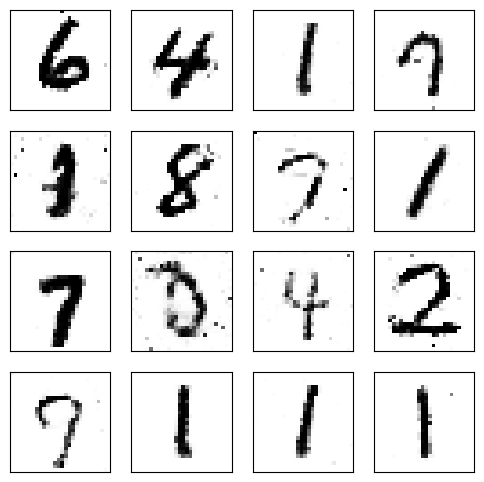

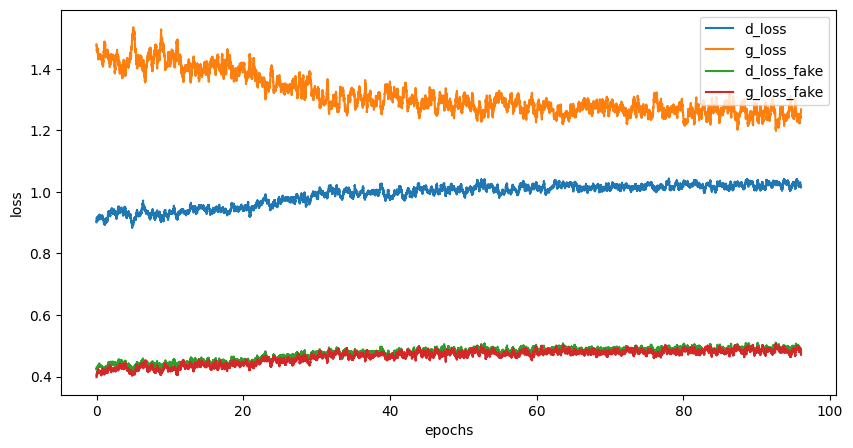

Epoch [97/160], Step[100/469], d_loss: 1.0663, d_loss_fake: 0.5098, g_loss: 1.2290, g_loss_fake: 0.5021, D(x): 0.65, D(G(z)): 0.35
Epoch [97/160], Step[200/469], d_loss: 1.0534, d_loss_fake: 0.3991, g_loss: 1.3164, g_loss_fake: 0.4833, D(x): 0.59, D(G(z)): 0.30
Epoch [97/160], Step[300/469], d_loss: 1.0660, d_loss_fake: 0.6665, g_loss: 1.1905, g_loss_fake: 0.4905, D(x): 0.72, D(G(z)): 0.42
Epoch [97/160], Step[400/469], d_loss: 1.0206, d_loss_fake: 0.4236, g_loss: 1.3598, g_loss_fake: 0.4767, D(x): 0.63, D(G(z)): 0.31


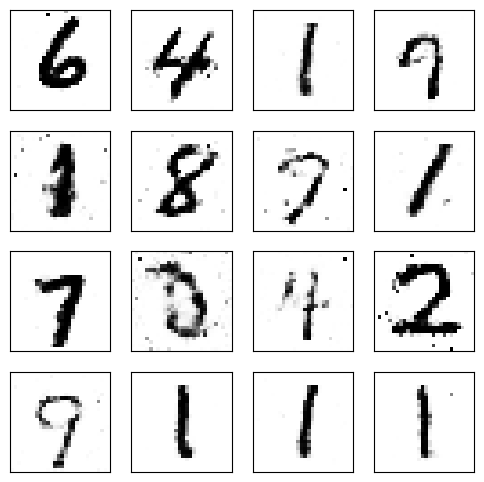

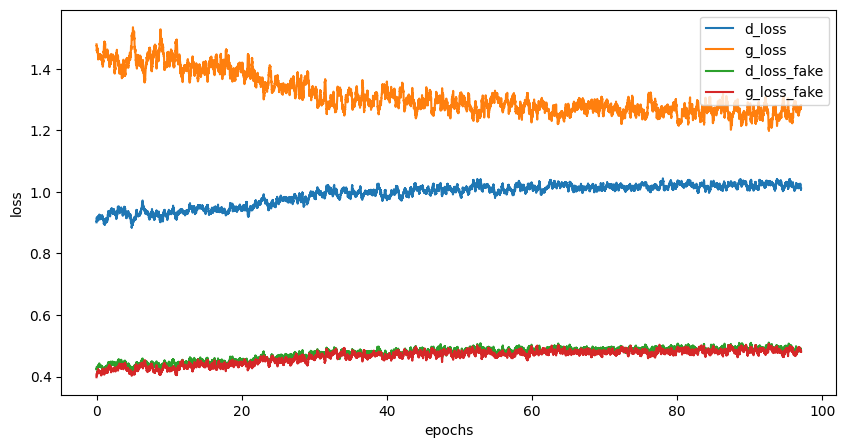

Epoch [98/160], Step[100/469], d_loss: 0.9905, d_loss_fake: 0.5581, g_loss: 1.0989, g_loss_fake: 0.5621, D(x): 0.70, D(G(z)): 0.38
Epoch [98/160], Step[200/469], d_loss: 0.9867, d_loss_fake: 0.4725, g_loss: 1.2122, g_loss_fake: 0.4825, D(x): 0.65, D(G(z)): 0.34
Epoch [98/160], Step[300/469], d_loss: 1.0824, d_loss_fake: 0.5465, g_loss: 1.1571, g_loss_fake: 0.5036, D(x): 0.67, D(G(z)): 0.38
Epoch [98/160], Step[400/469], d_loss: 0.9300, d_loss_fake: 0.4718, g_loss: 1.2409, g_loss_fake: 0.5149, D(x): 0.69, D(G(z)): 0.33


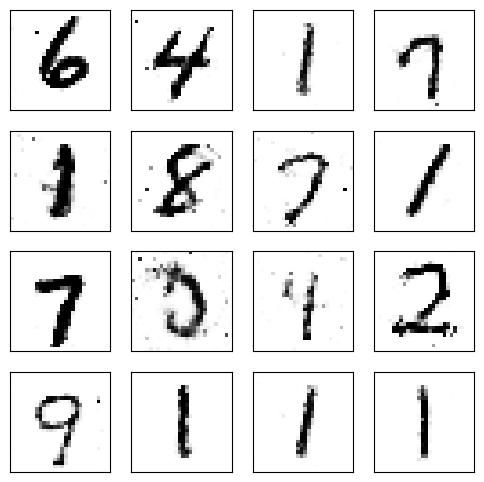

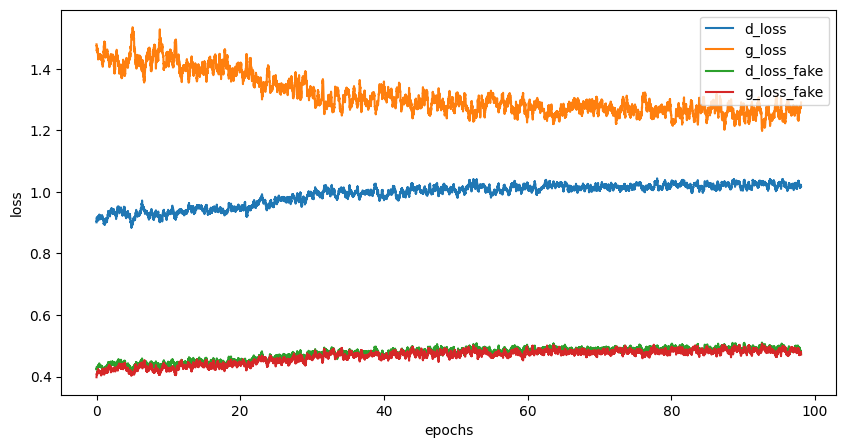

Epoch [99/160], Step[100/469], d_loss: 1.0749, d_loss_fake: 0.5901, g_loss: 1.1840, g_loss_fake: 0.5025, D(x): 0.68, D(G(z)): 0.37
Epoch [99/160], Step[200/469], d_loss: 1.0062, d_loss_fake: 0.5339, g_loss: 1.3948, g_loss_fake: 0.4389, D(x): 0.69, D(G(z)): 0.36
Epoch [99/160], Step[300/469], d_loss: 1.1121, d_loss_fake: 0.5178, g_loss: 1.3040, g_loss_fake: 0.4929, D(x): 0.62, D(G(z)): 0.36
Epoch [99/160], Step[400/469], d_loss: 1.0186, d_loss_fake: 0.4612, g_loss: 1.5058, g_loss_fake: 0.3595, D(x): 0.66, D(G(z)): 0.34


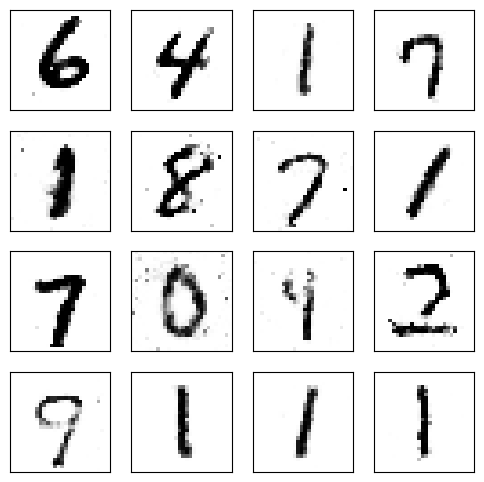

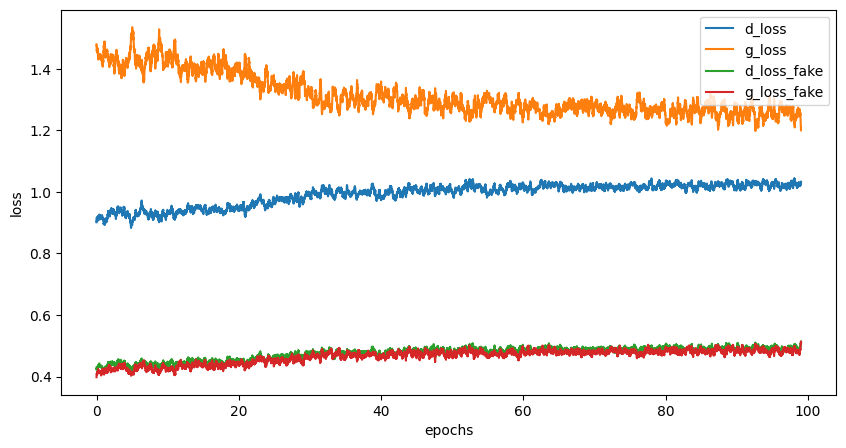

Epoch [100/160], Step[100/469], d_loss: 1.0874, d_loss_fake: 0.5566, g_loss: 1.1837, g_loss_fake: 0.4876, D(x): 0.66, D(G(z)): 0.36
Epoch [100/160], Step[200/469], d_loss: 0.9503, d_loss_fake: 0.4075, g_loss: 1.1540, g_loss_fake: 0.5920, D(x): 0.64, D(G(z)): 0.30
Epoch [100/160], Step[300/469], d_loss: 1.0074, d_loss_fake: 0.4690, g_loss: 1.2520, g_loss_fake: 0.5056, D(x): 0.65, D(G(z)): 0.33
Epoch [100/160], Step[400/469], d_loss: 0.9117, d_loss_fake: 0.4637, g_loss: 1.2786, g_loss_fake: 0.4956, D(x): 0.70, D(G(z)): 0.33


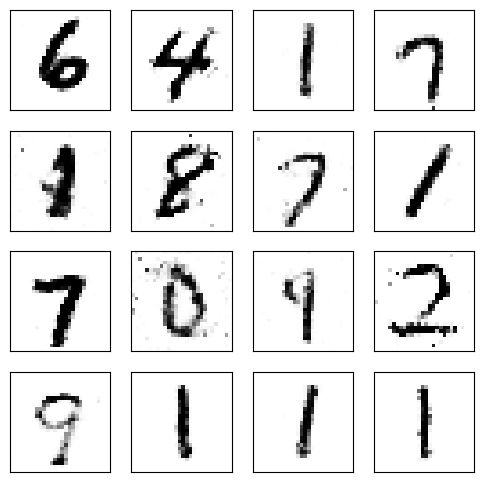

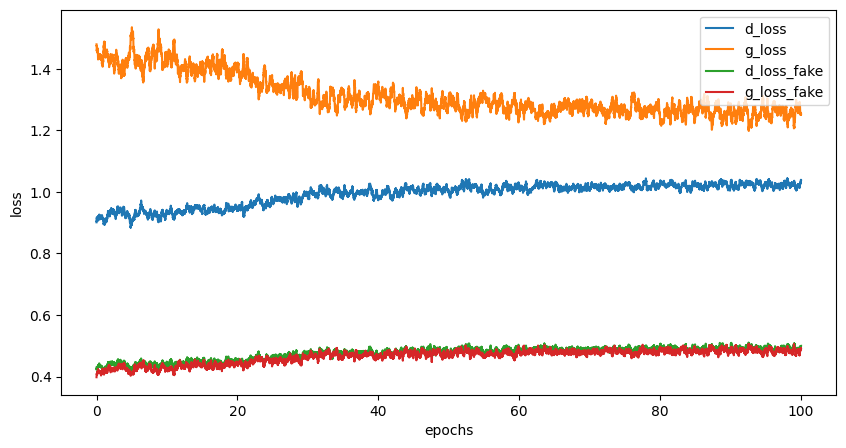

Epoch [101/160], Step[100/469], d_loss: 0.9338, d_loss_fake: 0.4790, g_loss: 1.2380, g_loss_fake: 0.4949, D(x): 0.69, D(G(z)): 0.34
Epoch [101/160], Step[200/469], d_loss: 1.0762, d_loss_fake: 0.6175, g_loss: 1.1609, g_loss_fake: 0.5183, D(x): 0.69, D(G(z)): 0.40
Epoch [101/160], Step[300/469], d_loss: 1.1136, d_loss_fake: 0.6120, g_loss: 1.1497, g_loss_fake: 0.5553, D(x): 0.68, D(G(z)): 0.39
Epoch [101/160], Step[400/469], d_loss: 1.0033, d_loss_fake: 0.5003, g_loss: 1.1683, g_loss_fake: 0.5742, D(x): 0.67, D(G(z)): 0.35


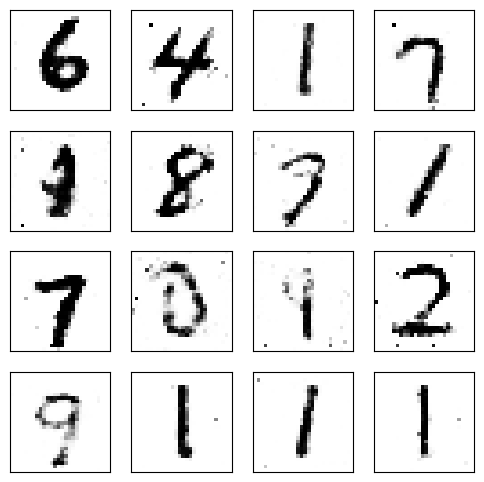

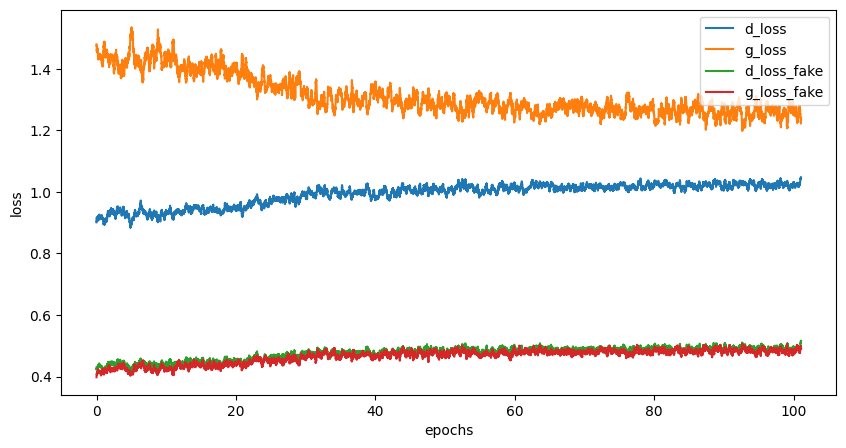

Epoch [102/160], Step[100/469], d_loss: 0.9812, d_loss_fake: 0.4225, g_loss: 1.2549, g_loss_fake: 0.5467, D(x): 0.64, D(G(z)): 0.30
Epoch [102/160], Step[200/469], d_loss: 1.0492, d_loss_fake: 0.4358, g_loss: 1.3495, g_loss_fake: 0.4399, D(x): 0.63, D(G(z)): 0.33
Epoch [102/160], Step[300/469], d_loss: 0.9125, d_loss_fake: 0.5046, g_loss: 1.1184, g_loss_fake: 0.5594, D(x): 0.73, D(G(z)): 0.35
Epoch [102/160], Step[400/469], d_loss: 0.9300, d_loss_fake: 0.4673, g_loss: 1.2432, g_loss_fake: 0.4656, D(x): 0.68, D(G(z)): 0.33


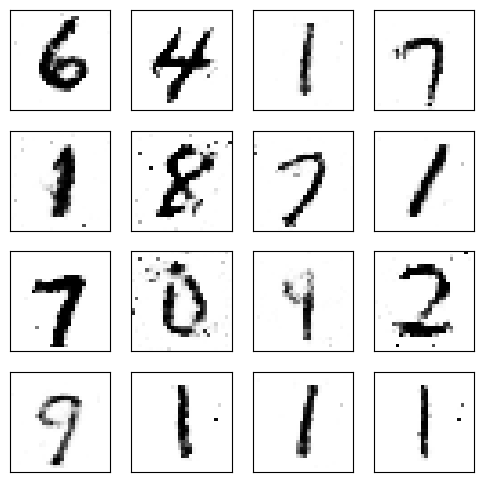

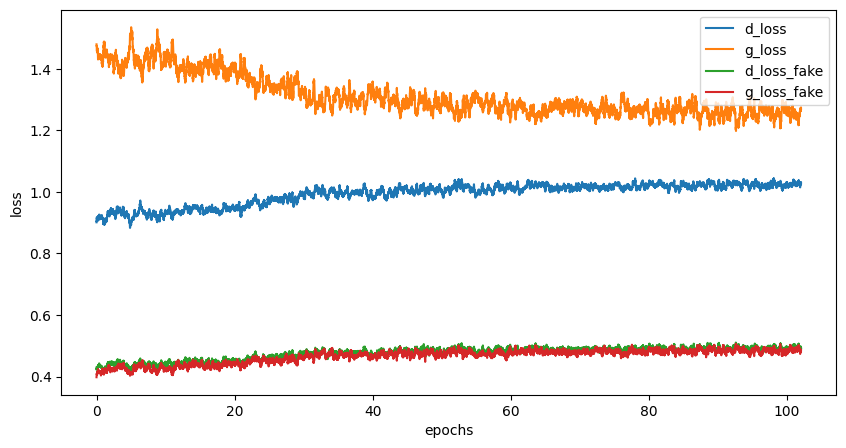

Epoch [103/160], Step[100/469], d_loss: 1.0475, d_loss_fake: 0.3733, g_loss: 1.4604, g_loss_fake: 0.3538, D(x): 0.59, D(G(z)): 0.28
Epoch [103/160], Step[200/469], d_loss: 0.9237, d_loss_fake: 0.4866, g_loss: 1.2731, g_loss_fake: 0.4403, D(x): 0.70, D(G(z)): 0.34
Epoch [103/160], Step[300/469], d_loss: 1.0775, d_loss_fake: 0.5581, g_loss: 1.2340, g_loss_fake: 0.4555, D(x): 0.67, D(G(z)): 0.37
Epoch [103/160], Step[400/469], d_loss: 1.0055, d_loss_fake: 0.4538, g_loss: 1.2109, g_loss_fake: 0.5150, D(x): 0.64, D(G(z)): 0.34


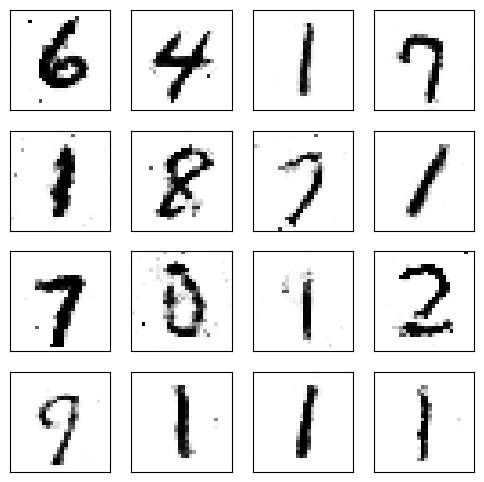

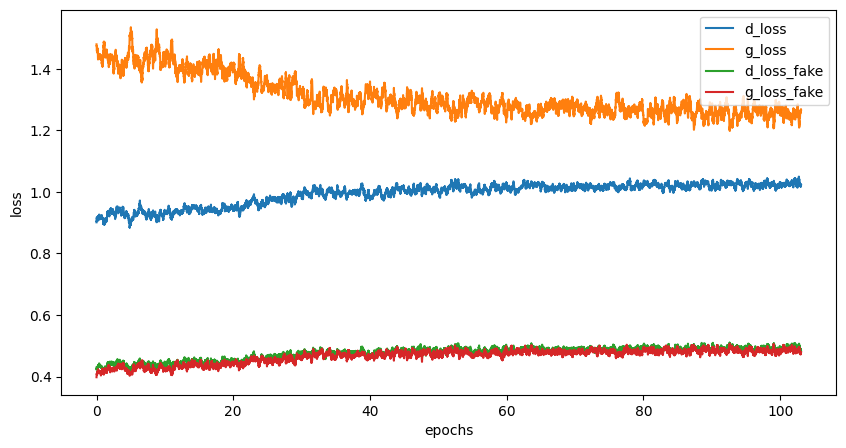

Epoch [104/160], Step[100/469], d_loss: 0.9474, d_loss_fake: 0.4354, g_loss: 1.2840, g_loss_fake: 0.5283, D(x): 0.67, D(G(z)): 0.30
Epoch [104/160], Step[200/469], d_loss: 1.0057, d_loss_fake: 0.4855, g_loss: 1.2290, g_loss_fake: 0.5123, D(x): 0.66, D(G(z)): 0.34
Epoch [104/160], Step[300/469], d_loss: 0.9419, d_loss_fake: 0.3718, g_loss: 1.3653, g_loss_fake: 0.4371, D(x): 0.64, D(G(z)): 0.28
Epoch [104/160], Step[400/469], d_loss: 0.9874, d_loss_fake: 0.5221, g_loss: 1.2029, g_loss_fake: 0.5238, D(x): 0.69, D(G(z)): 0.36


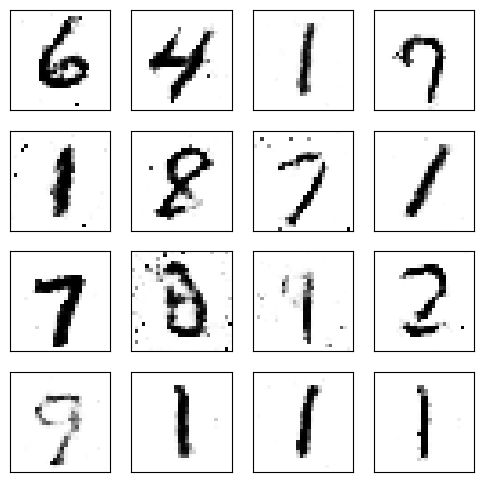

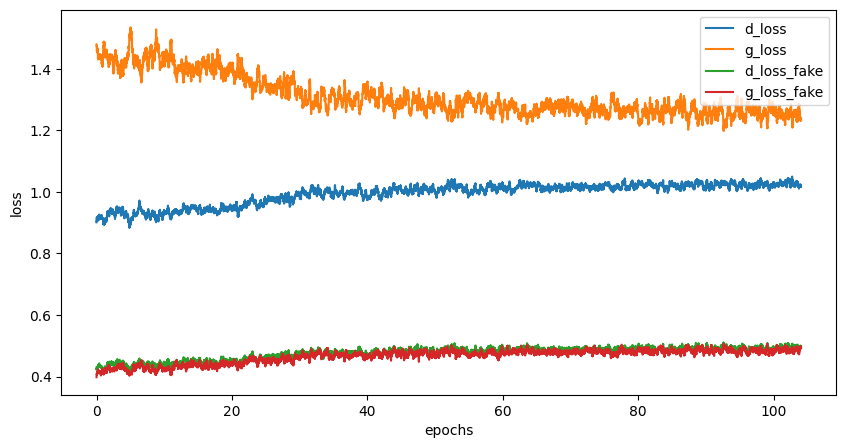

Epoch [105/160], Step[100/469], d_loss: 1.0013, d_loss_fake: 0.4239, g_loss: 1.2548, g_loss_fake: 0.5154, D(x): 0.63, D(G(z)): 0.31
Epoch [105/160], Step[200/469], d_loss: 0.9632, d_loss_fake: 0.4942, g_loss: 1.0906, g_loss_fake: 0.6543, D(x): 0.69, D(G(z)): 0.34
Epoch [105/160], Step[300/469], d_loss: 1.0819, d_loss_fake: 0.4200, g_loss: 1.3336, g_loss_fake: 0.4814, D(x): 0.59, D(G(z)): 0.31
Epoch [105/160], Step[400/469], d_loss: 0.9839, d_loss_fake: 0.5540, g_loss: 1.1404, g_loss_fake: 0.5094, D(x): 0.70, D(G(z)): 0.38


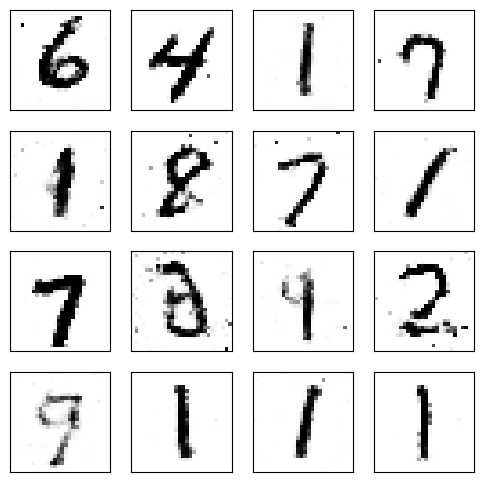

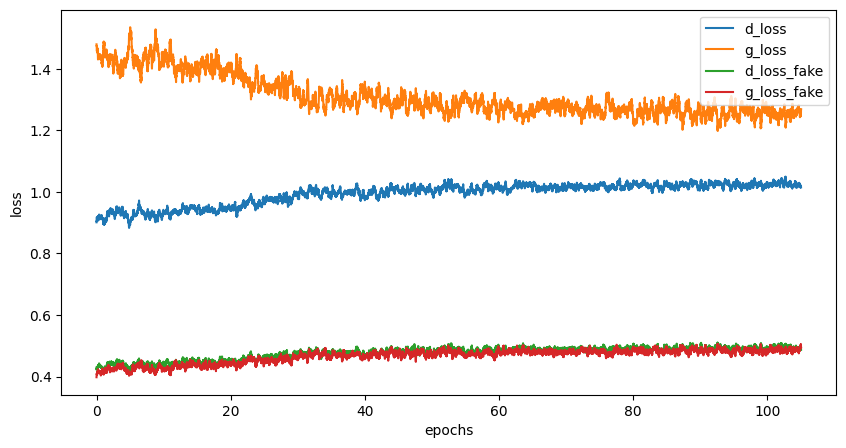

Epoch [106/160], Step[100/469], d_loss: 1.0429, d_loss_fake: 0.5172, g_loss: 1.1353, g_loss_fake: 0.5119, D(x): 0.66, D(G(z)): 0.36
Epoch [106/160], Step[200/469], d_loss: 0.9466, d_loss_fake: 0.4901, g_loss: 1.2132, g_loss_fake: 0.4504, D(x): 0.70, D(G(z)): 0.34
Epoch [106/160], Step[300/469], d_loss: 1.1301, d_loss_fake: 0.5588, g_loss: 1.3851, g_loss_fake: 0.4289, D(x): 0.65, D(G(z)): 0.37
Epoch [106/160], Step[400/469], d_loss: 0.9558, d_loss_fake: 0.4717, g_loss: 1.2557, g_loss_fake: 0.4847, D(x): 0.68, D(G(z)): 0.34


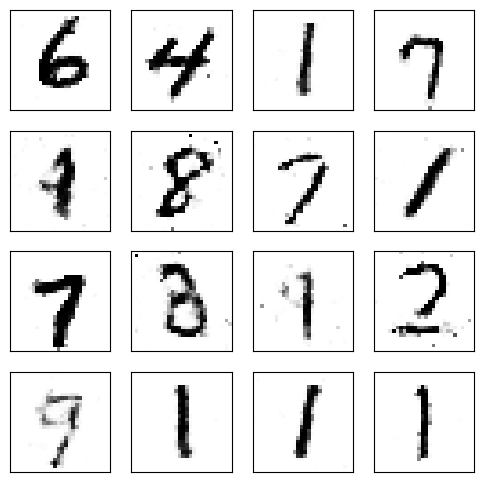

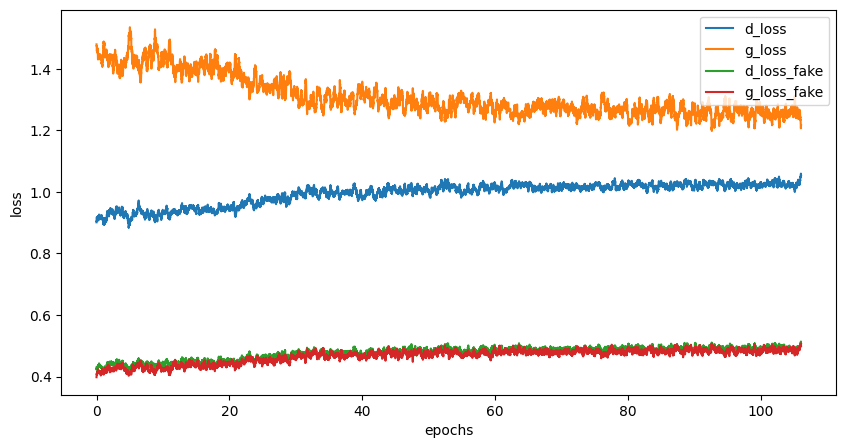

Epoch [107/160], Step[100/469], d_loss: 1.0249, d_loss_fake: 0.5509, g_loss: 1.2693, g_loss_fake: 0.4992, D(x): 0.68, D(G(z)): 0.38
Epoch [107/160], Step[200/469], d_loss: 1.0190, d_loss_fake: 0.5501, g_loss: 1.1397, g_loss_fake: 0.5700, D(x): 0.69, D(G(z)): 0.37
Epoch [107/160], Step[300/469], d_loss: 0.9546, d_loss_fake: 0.5056, g_loss: 1.1252, g_loss_fake: 0.5935, D(x): 0.69, D(G(z)): 0.35
Epoch [107/160], Step[400/469], d_loss: 1.0292, d_loss_fake: 0.5748, g_loss: 1.2853, g_loss_fake: 0.4686, D(x): 0.70, D(G(z)): 0.38


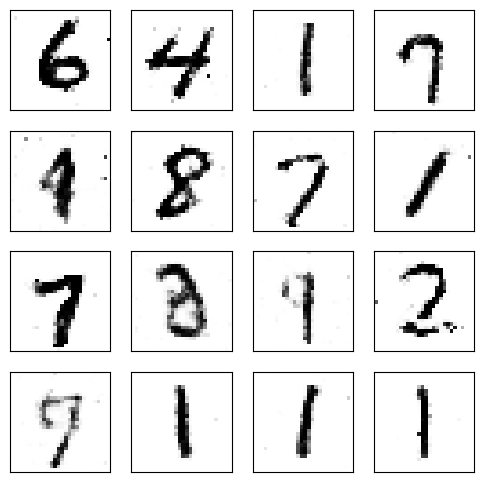

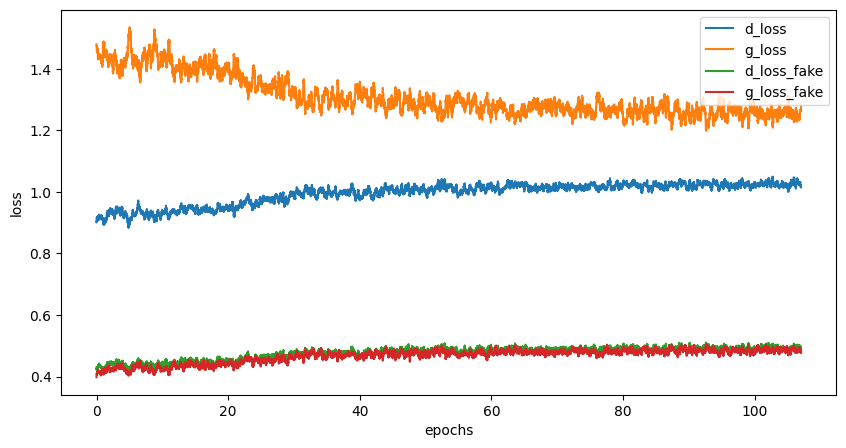

Epoch [108/160], Step[100/469], d_loss: 1.0438, d_loss_fake: 0.4805, g_loss: 1.3486, g_loss_fake: 0.4268, D(x): 0.64, D(G(z)): 0.33
Epoch [108/160], Step[200/469], d_loss: 0.9591, d_loss_fake: 0.4715, g_loss: 1.2661, g_loss_fake: 0.4598, D(x): 0.68, D(G(z)): 0.34
Epoch [108/160], Step[300/469], d_loss: 0.9299, d_loss_fake: 0.4661, g_loss: 1.2358, g_loss_fake: 0.4832, D(x): 0.69, D(G(z)): 0.35
Epoch [108/160], Step[400/469], d_loss: 0.9759, d_loss_fake: 0.4694, g_loss: 1.2886, g_loss_fake: 0.4402, D(x): 0.67, D(G(z)): 0.34


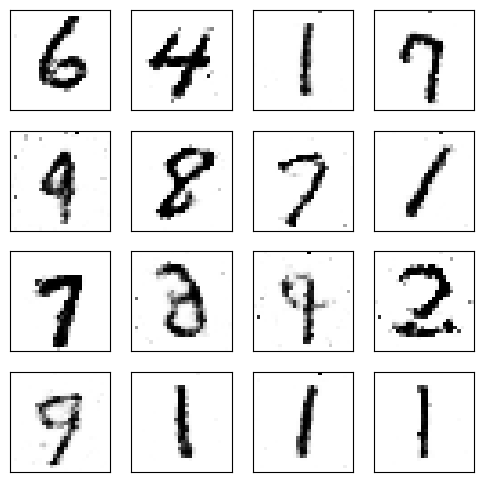

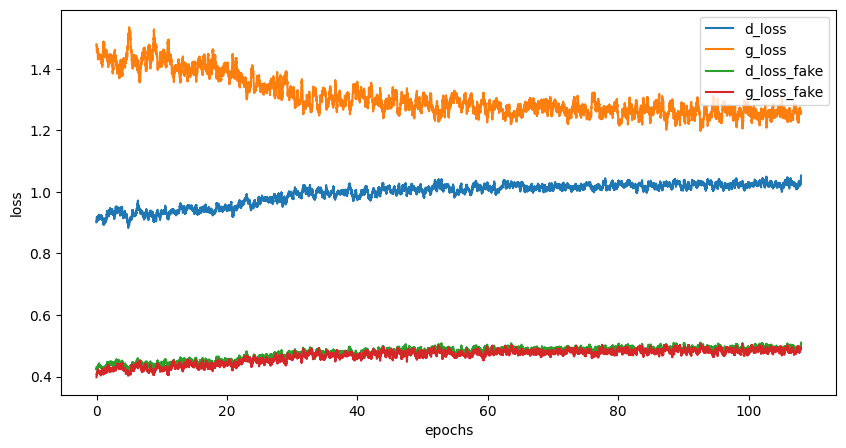

Epoch [109/160], Step[100/469], d_loss: 1.1536, d_loss_fake: 0.6015, g_loss: 1.1940, g_loss_fake: 0.5516, D(x): 0.66, D(G(z)): 0.39
Epoch [109/160], Step[200/469], d_loss: 0.9866, d_loss_fake: 0.4558, g_loss: 1.3136, g_loss_fake: 0.4462, D(x): 0.65, D(G(z)): 0.33
Epoch [109/160], Step[300/469], d_loss: 1.0729, d_loss_fake: 0.5557, g_loss: 1.0405, g_loss_fake: 0.6006, D(x): 0.66, D(G(z)): 0.38
Epoch [109/160], Step[400/469], d_loss: 1.0416, d_loss_fake: 0.4827, g_loss: 1.2577, g_loss_fake: 0.4914, D(x): 0.63, D(G(z)): 0.34


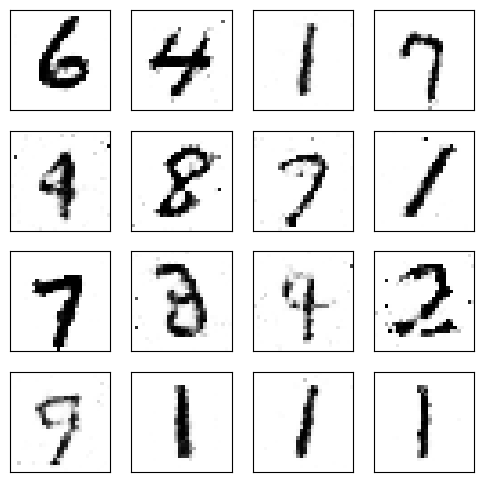

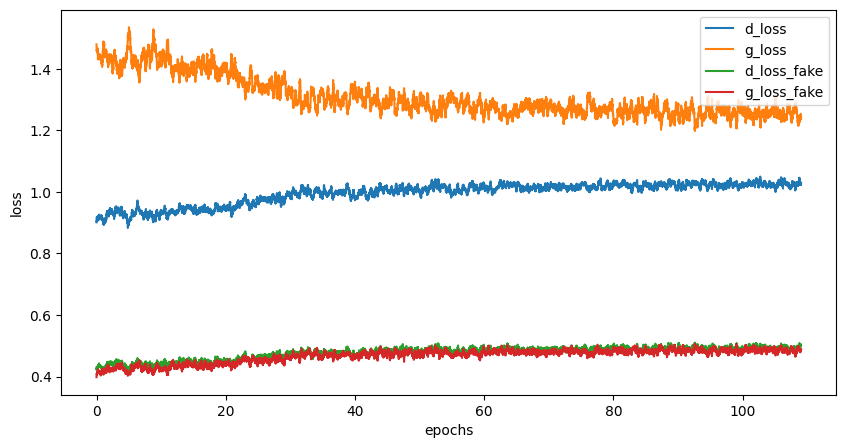

Epoch [110/160], Step[100/469], d_loss: 0.9379, d_loss_fake: 0.4900, g_loss: 1.3361, g_loss_fake: 0.4412, D(x): 0.69, D(G(z)): 0.34
Epoch [110/160], Step[200/469], d_loss: 1.0439, d_loss_fake: 0.4919, g_loss: 1.3105, g_loss_fake: 0.5141, D(x): 0.66, D(G(z)): 0.33
Epoch [110/160], Step[300/469], d_loss: 1.1111, d_loss_fake: 0.5083, g_loss: 1.2806, g_loss_fake: 0.4626, D(x): 0.61, D(G(z)): 0.34
Epoch [110/160], Step[400/469], d_loss: 0.9974, d_loss_fake: 0.4551, g_loss: 1.3274, g_loss_fake: 0.3996, D(x): 0.65, D(G(z)): 0.34


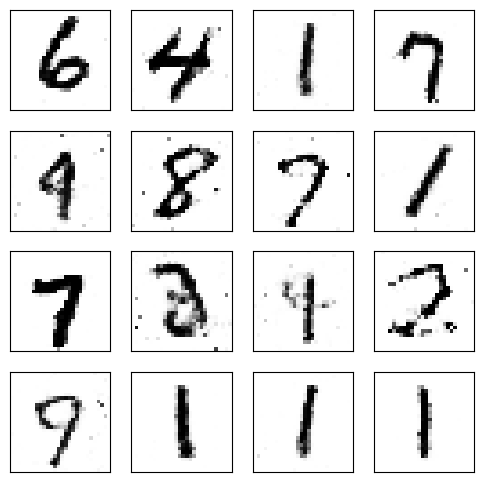

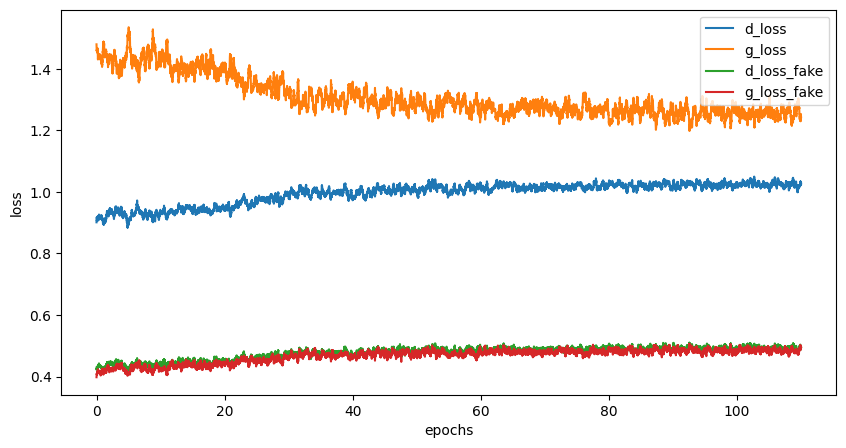

Epoch [111/160], Step[100/469], d_loss: 1.1340, d_loss_fake: 0.5284, g_loss: 1.2688, g_loss_fake: 0.4702, D(x): 0.60, D(G(z)): 0.36
Epoch [111/160], Step[200/469], d_loss: 1.0200, d_loss_fake: 0.5046, g_loss: 1.1723, g_loss_fake: 0.5153, D(x): 0.67, D(G(z)): 0.35
Epoch [111/160], Step[300/469], d_loss: 1.0292, d_loss_fake: 0.4068, g_loss: 1.4246, g_loss_fake: 0.4061, D(x): 0.63, D(G(z)): 0.30
Epoch [111/160], Step[400/469], d_loss: 0.8805, d_loss_fake: 0.3477, g_loss: 1.3018, g_loss_fake: 0.4583, D(x): 0.65, D(G(z)): 0.27


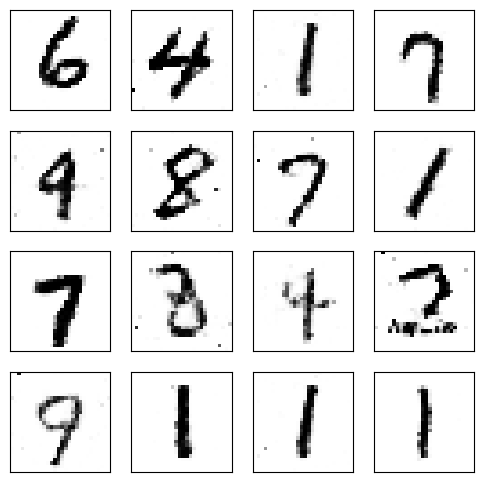

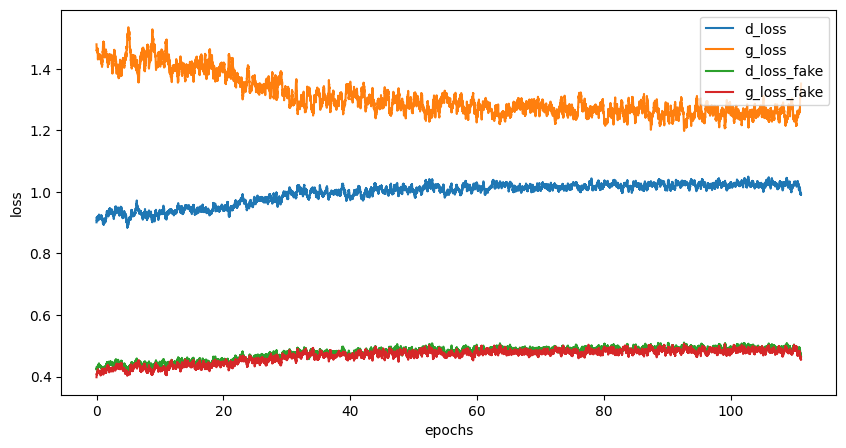

Epoch [112/160], Step[100/469], d_loss: 1.0646, d_loss_fake: 0.4189, g_loss: 1.3252, g_loss_fake: 0.4402, D(x): 0.60, D(G(z)): 0.30
Epoch [112/160], Step[200/469], d_loss: 1.0441, d_loss_fake: 0.4995, g_loss: 1.2178, g_loss_fake: 0.4939, D(x): 0.67, D(G(z)): 0.34
Epoch [112/160], Step[300/469], d_loss: 0.9538, d_loss_fake: 0.4137, g_loss: 1.3534, g_loss_fake: 0.4184, D(x): 0.66, D(G(z)): 0.31
Epoch [112/160], Step[400/469], d_loss: 1.1545, d_loss_fake: 0.5486, g_loss: 1.2960, g_loss_fake: 0.4379, D(x): 0.62, D(G(z)): 0.36


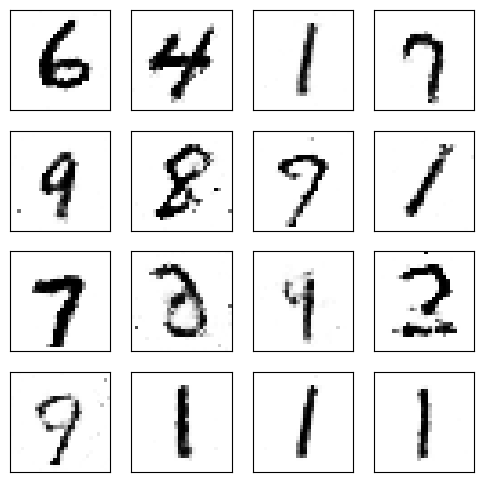

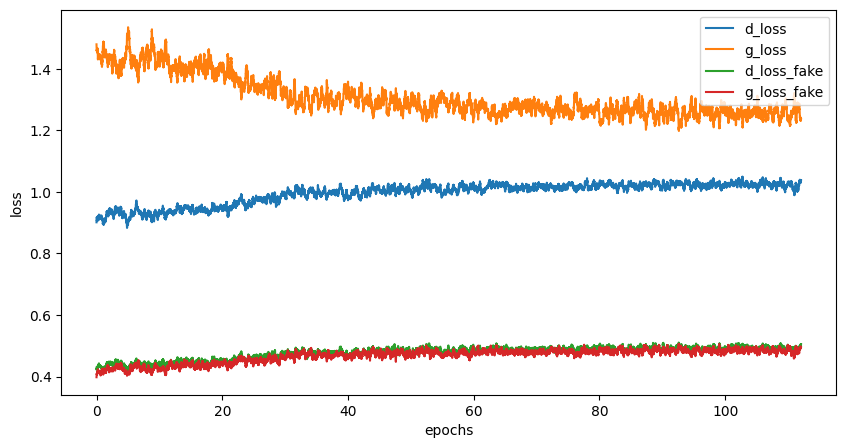

Epoch [113/160], Step[100/469], d_loss: 1.0947, d_loss_fake: 0.5244, g_loss: 1.3310, g_loss_fake: 0.5001, D(x): 0.64, D(G(z)): 0.36
Epoch [113/160], Step[200/469], d_loss: 0.9812, d_loss_fake: 0.4190, g_loss: 1.3912, g_loss_fake: 0.3936, D(x): 0.63, D(G(z)): 0.31
Epoch [113/160], Step[300/469], d_loss: 1.0359, d_loss_fake: 0.4352, g_loss: 1.2884, g_loss_fake: 0.4416, D(x): 0.63, D(G(z)): 0.33
Epoch [113/160], Step[400/469], d_loss: 0.9996, d_loss_fake: 0.4651, g_loss: 1.2542, g_loss_fake: 0.4757, D(x): 0.66, D(G(z)): 0.32


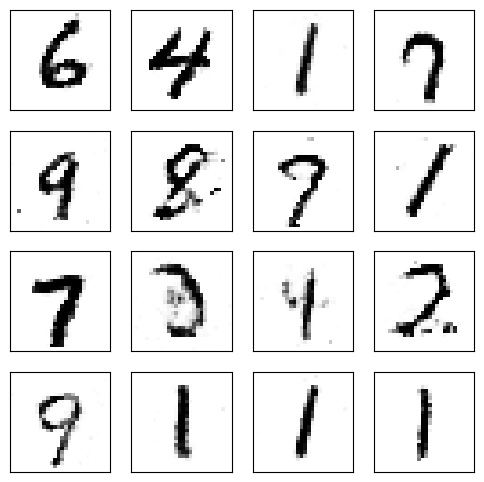

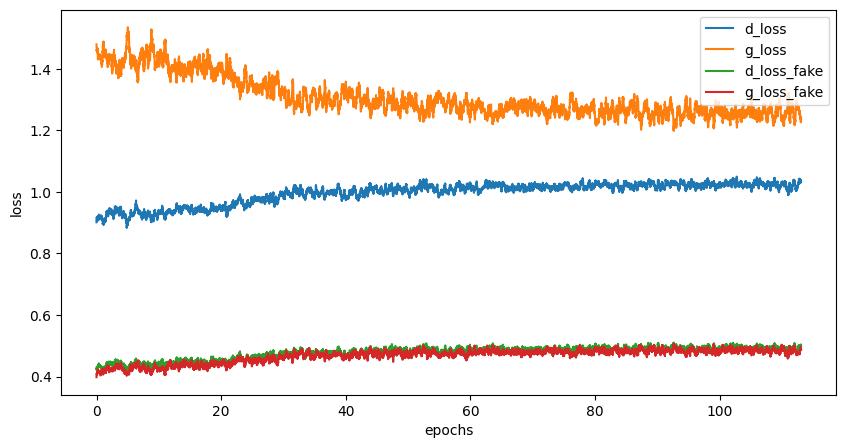

Epoch [114/160], Step[100/469], d_loss: 1.1170, d_loss_fake: 0.5238, g_loss: 1.2984, g_loss_fake: 0.5551, D(x): 0.61, D(G(z)): 0.35
Epoch [114/160], Step[200/469], d_loss: 0.9642, d_loss_fake: 0.4355, g_loss: 1.4392, g_loss_fake: 0.4422, D(x): 0.66, D(G(z)): 0.31
Epoch [114/160], Step[300/469], d_loss: 0.9700, d_loss_fake: 0.5086, g_loss: 1.2324, g_loss_fake: 0.5222, D(x): 0.69, D(G(z)): 0.35
Epoch [114/160], Step[400/469], d_loss: 1.2039, d_loss_fake: 0.6443, g_loss: 1.2036, g_loss_fake: 0.4918, D(x): 0.63, D(G(z)): 0.41


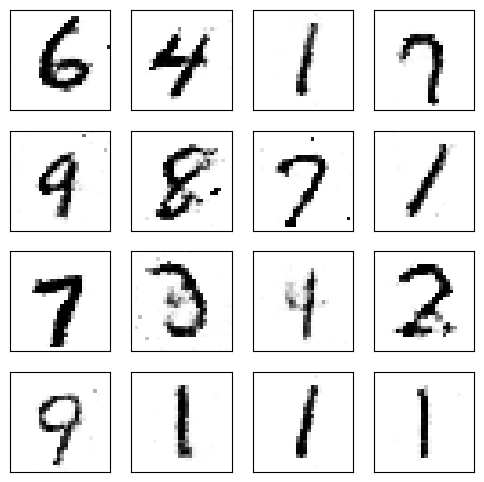

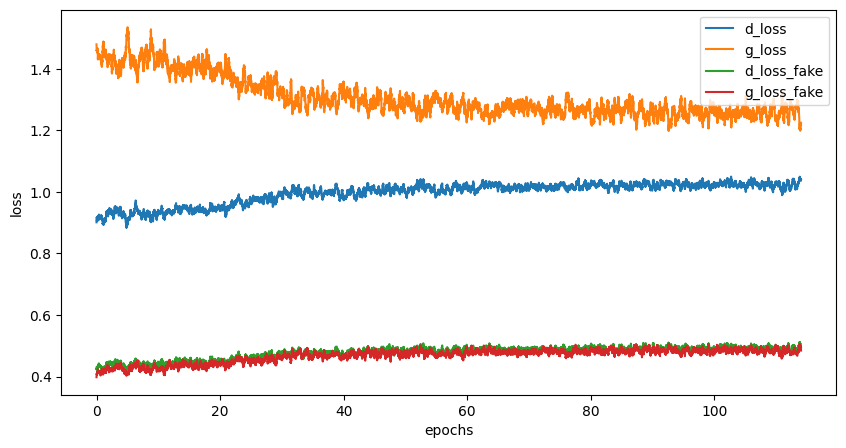

Epoch [115/160], Step[100/469], d_loss: 0.8936, d_loss_fake: 0.5009, g_loss: 1.2931, g_loss_fake: 0.4326, D(x): 0.72, D(G(z)): 0.35
Epoch [115/160], Step[200/469], d_loss: 1.0011, d_loss_fake: 0.5590, g_loss: 1.0885, g_loss_fake: 0.5191, D(x): 0.69, D(G(z)): 0.38
Epoch [115/160], Step[300/469], d_loss: 0.9954, d_loss_fake: 0.3701, g_loss: 1.1894, g_loss_fake: 0.5520, D(x): 0.62, D(G(z)): 0.29
Epoch [115/160], Step[400/469], d_loss: 1.0422, d_loss_fake: 0.4425, g_loss: 1.3162, g_loss_fake: 0.4796, D(x): 0.61, D(G(z)): 0.32


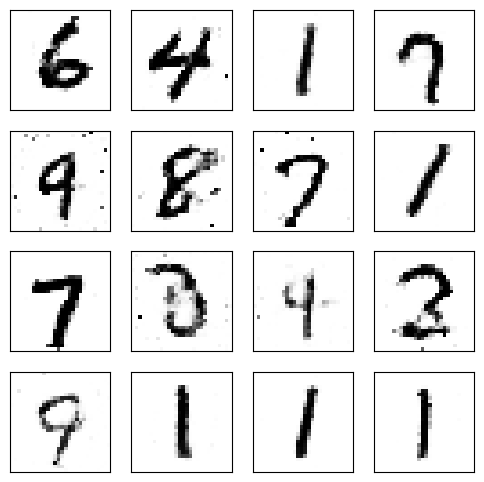

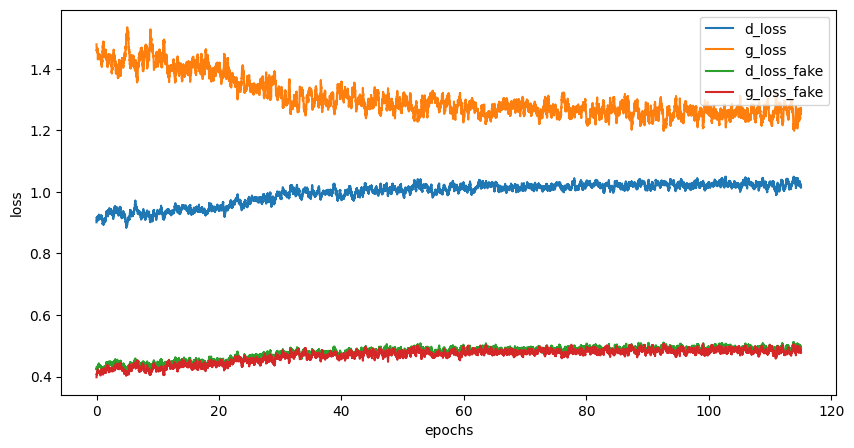

Epoch [116/160], Step[100/469], d_loss: 1.1550, d_loss_fake: 0.5065, g_loss: 1.2124, g_loss_fake: 0.4815, D(x): 0.60, D(G(z)): 0.35
Epoch [116/160], Step[200/469], d_loss: 0.9655, d_loss_fake: 0.4512, g_loss: 1.4451, g_loss_fake: 0.3864, D(x): 0.68, D(G(z)): 0.33
Epoch [116/160], Step[300/469], d_loss: 1.0256, d_loss_fake: 0.5252, g_loss: 1.1402, g_loss_fake: 0.5541, D(x): 0.66, D(G(z)): 0.37
Epoch [116/160], Step[400/469], d_loss: 1.0705, d_loss_fake: 0.5359, g_loss: 1.2506, g_loss_fake: 0.4624, D(x): 0.65, D(G(z)): 0.37


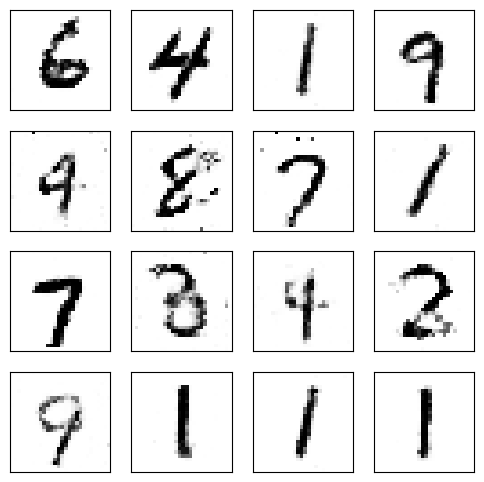

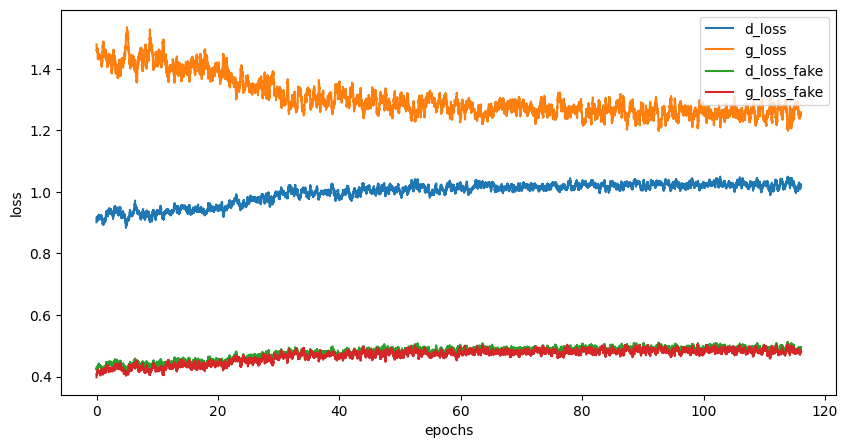

Epoch [117/160], Step[100/469], d_loss: 0.9981, d_loss_fake: 0.3766, g_loss: 1.4344, g_loss_fake: 0.4158, D(x): 0.62, D(G(z)): 0.28
Epoch [117/160], Step[200/469], d_loss: 1.0337, d_loss_fake: 0.4983, g_loss: 1.2744, g_loss_fake: 0.4658, D(x): 0.67, D(G(z)): 0.34
Epoch [117/160], Step[300/469], d_loss: 1.0807, d_loss_fake: 0.4867, g_loss: 1.3938, g_loss_fake: 0.3953, D(x): 0.62, D(G(z)): 0.34
Epoch [117/160], Step[400/469], d_loss: 1.0097, d_loss_fake: 0.5186, g_loss: 1.3485, g_loss_fake: 0.3986, D(x): 0.68, D(G(z)): 0.36


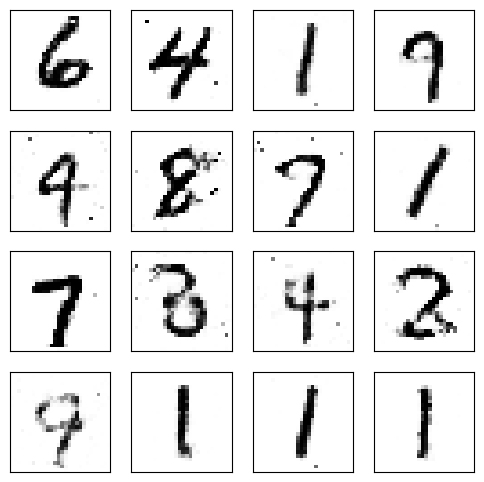

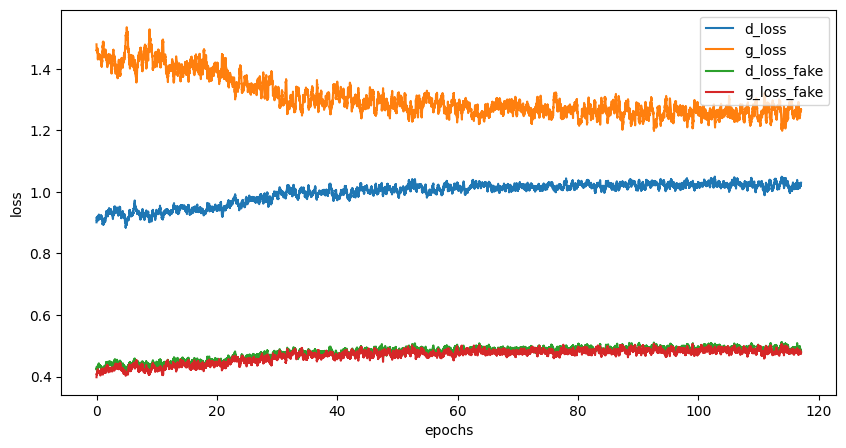

Epoch [118/160], Step[100/469], d_loss: 0.9232, d_loss_fake: 0.4604, g_loss: 1.1884, g_loss_fake: 0.5259, D(x): 0.70, D(G(z)): 0.33
Epoch [118/160], Step[200/469], d_loss: 0.9396, d_loss_fake: 0.4827, g_loss: 1.2493, g_loss_fake: 0.4826, D(x): 0.69, D(G(z)): 0.34
Epoch [118/160], Step[300/469], d_loss: 1.0457, d_loss_fake: 0.4990, g_loss: 1.3820, g_loss_fake: 0.4189, D(x): 0.66, D(G(z)): 0.35
Epoch [118/160], Step[400/469], d_loss: 1.0328, d_loss_fake: 0.4691, g_loss: 1.2795, g_loss_fake: 0.4675, D(x): 0.64, D(G(z)): 0.34


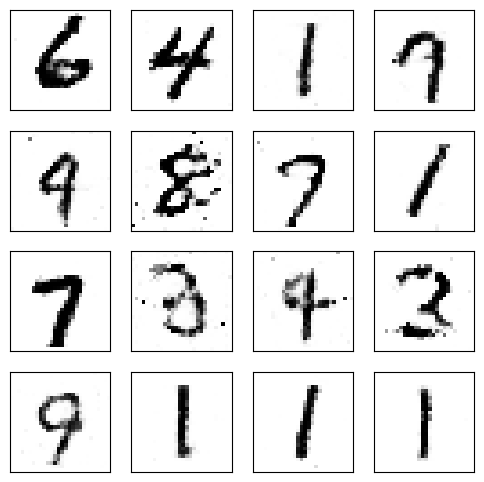

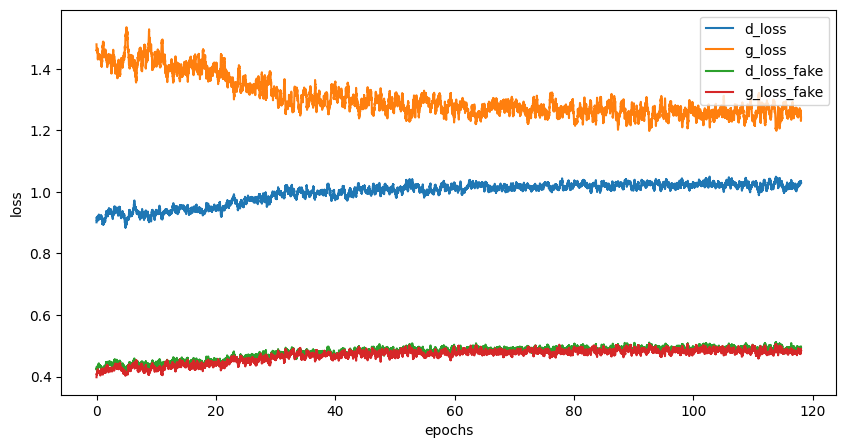

Epoch [119/160], Step[100/469], d_loss: 0.9956, d_loss_fake: 0.4663, g_loss: 1.3062, g_loss_fake: 0.4606, D(x): 0.65, D(G(z)): 0.34
Epoch [119/160], Step[200/469], d_loss: 1.0321, d_loss_fake: 0.5421, g_loss: 1.1816, g_loss_fake: 0.5085, D(x): 0.68, D(G(z)): 0.37
Epoch [119/160], Step[300/469], d_loss: 1.0534, d_loss_fake: 0.5104, g_loss: 1.2526, g_loss_fake: 0.4617, D(x): 0.65, D(G(z)): 0.36
Epoch [119/160], Step[400/469], d_loss: 1.0043, d_loss_fake: 0.5130, g_loss: 1.2608, g_loss_fake: 0.4633, D(x): 0.68, D(G(z)): 0.35


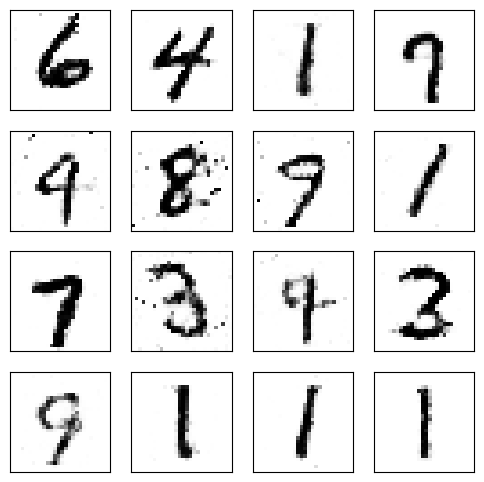

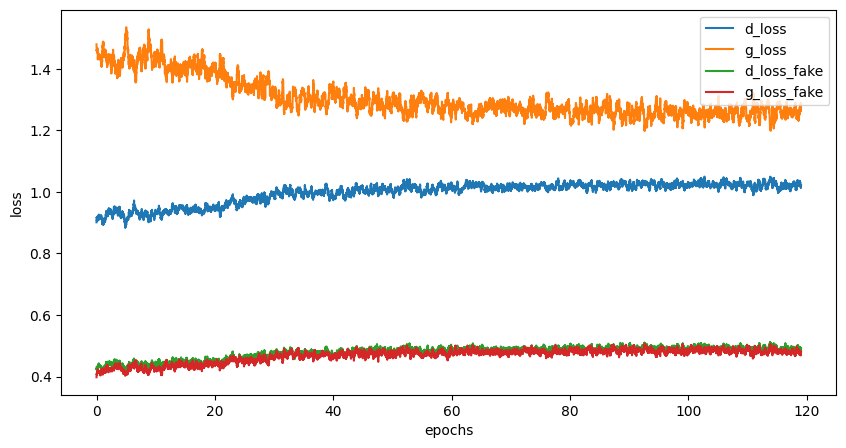

Epoch [120/160], Step[100/469], d_loss: 1.0744, d_loss_fake: 0.5568, g_loss: 1.1494, g_loss_fake: 0.5744, D(x): 0.67, D(G(z)): 0.37
Epoch [120/160], Step[200/469], d_loss: 1.0476, d_loss_fake: 0.4912, g_loss: 1.3288, g_loss_fake: 0.4785, D(x): 0.64, D(G(z)): 0.34
Epoch [120/160], Step[300/469], d_loss: 1.0126, d_loss_fake: 0.4868, g_loss: 1.3843, g_loss_fake: 0.4507, D(x): 0.66, D(G(z)): 0.34
Epoch [120/160], Step[400/469], d_loss: 0.9839, d_loss_fake: 0.4339, g_loss: 1.3866, g_loss_fake: 0.4361, D(x): 0.65, D(G(z)): 0.32


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

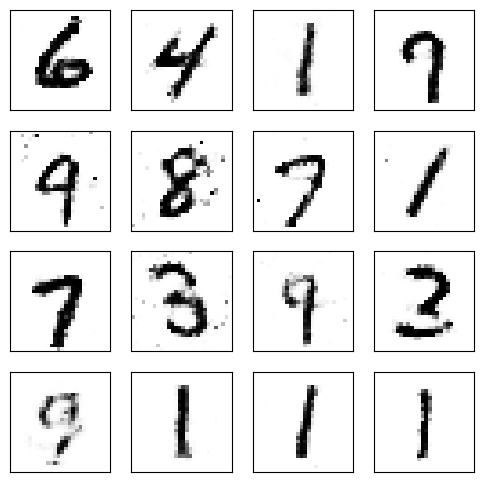

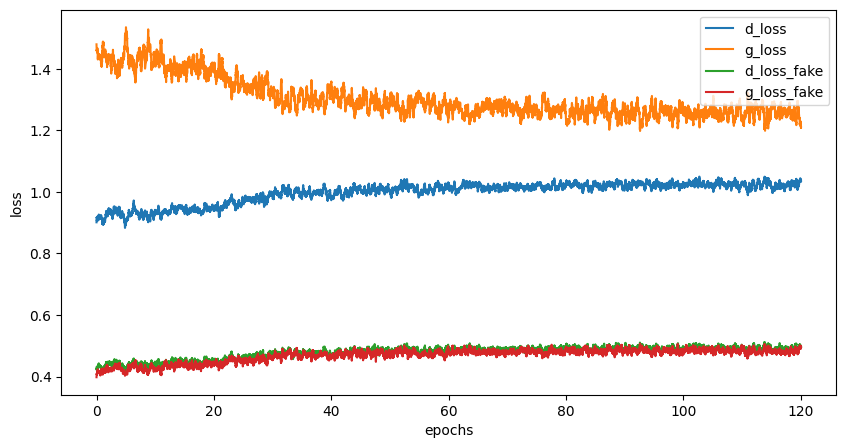

Epoch [121/160], Step[100/469], d_loss: 1.1326, d_loss_fake: 0.6356, g_loss: 1.2017, g_loss_fake: 0.4932, D(x): 0.67, D(G(z)): 0.40
Epoch [121/160], Step[200/469], d_loss: 1.0072, d_loss_fake: 0.5027, g_loss: 1.2189, g_loss_fake: 0.5247, D(x): 0.66, D(G(z)): 0.36
Epoch [121/160], Step[300/469], d_loss: 0.9136, d_loss_fake: 0.4903, g_loss: 1.1123, g_loss_fake: 0.5383, D(x): 0.72, D(G(z)): 0.36
Epoch [121/160], Step[400/469], d_loss: 1.1078, d_loss_fake: 0.5775, g_loss: 1.1143, g_loss_fake: 0.5282, D(x): 0.66, D(G(z)): 0.40


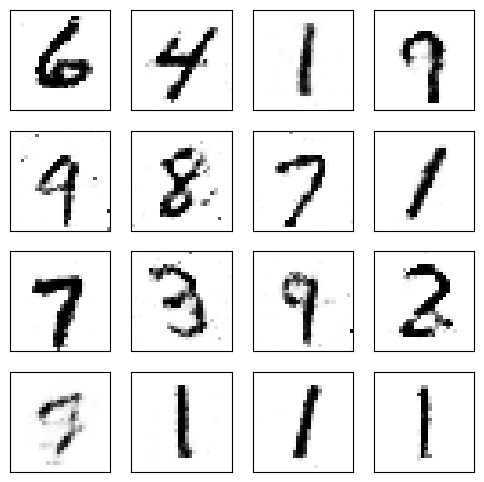

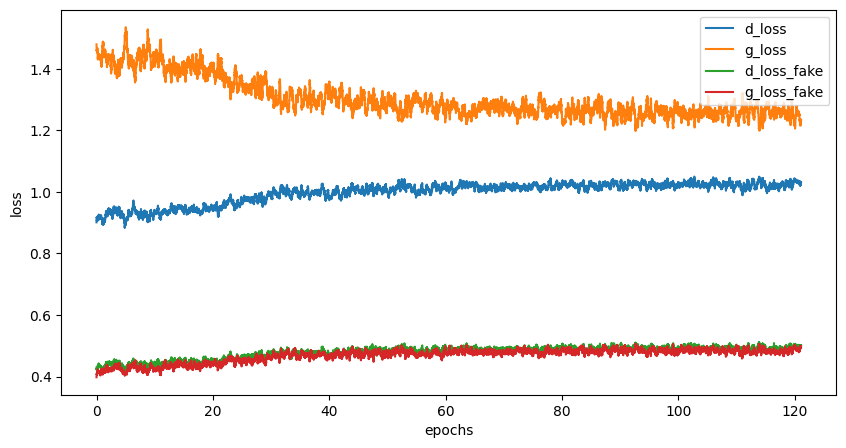

Epoch [122/160], Step[100/469], d_loss: 1.0094, d_loss_fake: 0.4655, g_loss: 1.4944, g_loss_fake: 0.3909, D(x): 0.66, D(G(z)): 0.33
Epoch [122/160], Step[200/469], d_loss: 1.1811, d_loss_fake: 0.5781, g_loss: 1.1936, g_loss_fake: 0.4993, D(x): 0.61, D(G(z)): 0.35
Epoch [122/160], Step[300/469], d_loss: 1.0066, d_loss_fake: 0.5575, g_loss: 1.1531, g_loss_fake: 0.4985, D(x): 0.69, D(G(z)): 0.39
Epoch [122/160], Step[400/469], d_loss: 0.9744, d_loss_fake: 0.4417, g_loss: 1.1986, g_loss_fake: 0.5553, D(x): 0.66, D(G(z)): 0.33


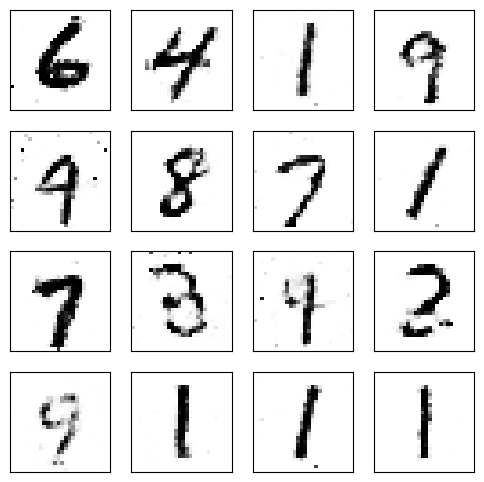

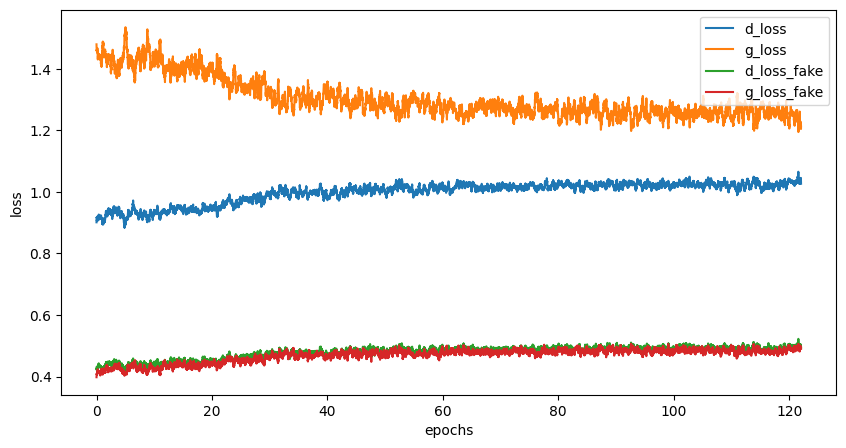

Epoch [123/160], Step[100/469], d_loss: 1.0133, d_loss_fake: 0.5074, g_loss: 1.1363, g_loss_fake: 0.5115, D(x): 0.67, D(G(z)): 0.35
Epoch [123/160], Step[200/469], d_loss: 1.0194, d_loss_fake: 0.4189, g_loss: 1.2994, g_loss_fake: 0.5000, D(x): 0.63, D(G(z)): 0.31
Epoch [123/160], Step[300/469], d_loss: 1.0829, d_loss_fake: 0.4420, g_loss: 1.3034, g_loss_fake: 0.4348, D(x): 0.62, D(G(z)): 0.32
Epoch [123/160], Step[400/469], d_loss: 1.0961, d_loss_fake: 0.4824, g_loss: 1.1734, g_loss_fake: 0.5239, D(x): 0.62, D(G(z)): 0.35


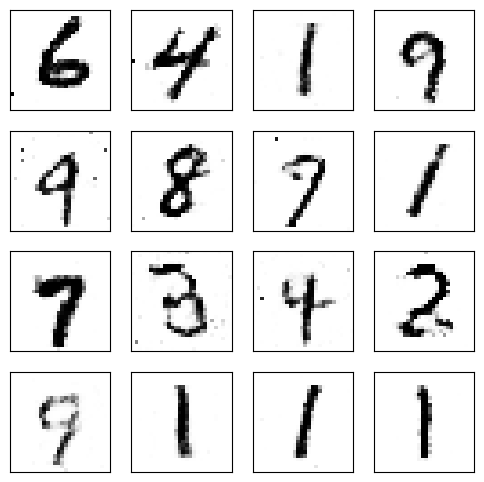

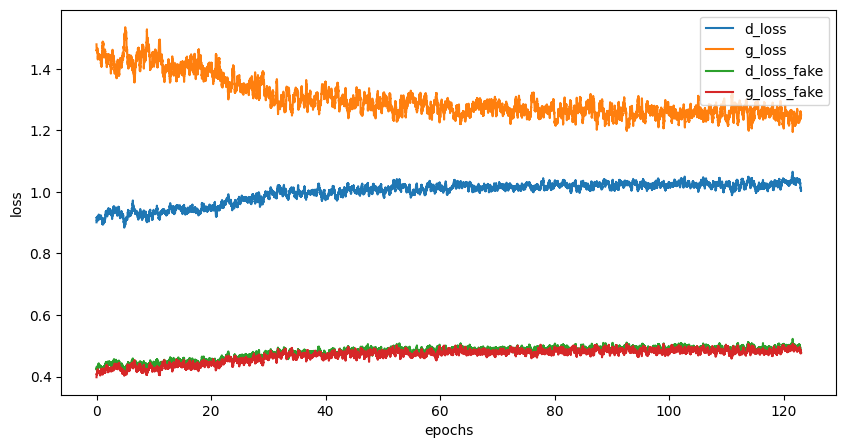

Epoch [124/160], Step[100/469], d_loss: 1.0000, d_loss_fake: 0.4737, g_loss: 1.3594, g_loss_fake: 0.4620, D(x): 0.66, D(G(z)): 0.33
Epoch [124/160], Step[200/469], d_loss: 1.1169, d_loss_fake: 0.5228, g_loss: 1.3105, g_loss_fake: 0.4435, D(x): 0.63, D(G(z)): 0.36
Epoch [124/160], Step[300/469], d_loss: 0.9796, d_loss_fake: 0.4553, g_loss: 1.2645, g_loss_fake: 0.4649, D(x): 0.66, D(G(z)): 0.32
Epoch [124/160], Step[400/469], d_loss: 0.9583, d_loss_fake: 0.5106, g_loss: 1.1376, g_loss_fake: 0.5332, D(x): 0.70, D(G(z)): 0.36


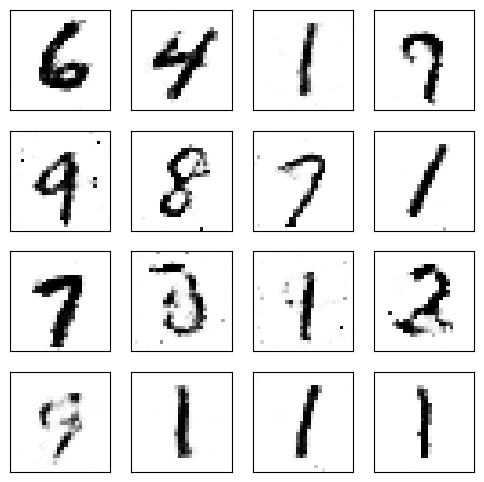

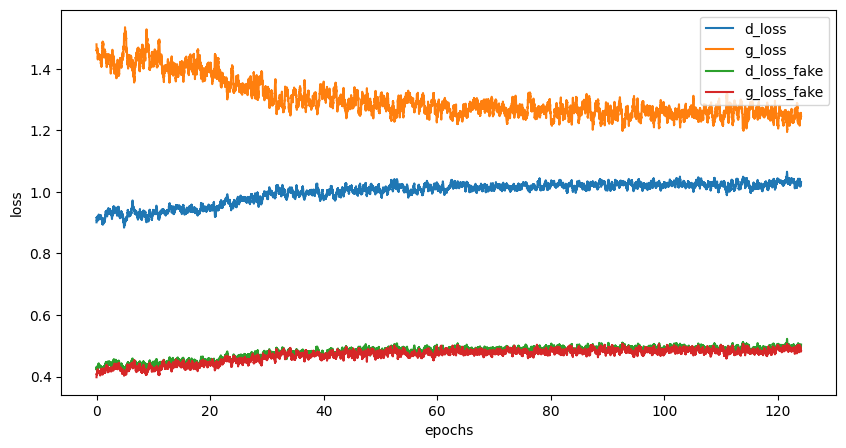

Epoch [125/160], Step[100/469], d_loss: 1.0669, d_loss_fake: 0.4329, g_loss: 1.3564, g_loss_fake: 0.4109, D(x): 0.61, D(G(z)): 0.32
Epoch [125/160], Step[200/469], d_loss: 1.1022, d_loss_fake: 0.6000, g_loss: 1.2619, g_loss_fake: 0.4720, D(x): 0.66, D(G(z)): 0.40
Epoch [125/160], Step[300/469], d_loss: 1.0202, d_loss_fake: 0.5129, g_loss: 1.2599, g_loss_fake: 0.4541, D(x): 0.66, D(G(z)): 0.35
Epoch [125/160], Step[400/469], d_loss: 1.0290, d_loss_fake: 0.6083, g_loss: 1.2357, g_loss_fake: 0.4947, D(x): 0.71, D(G(z)): 0.39


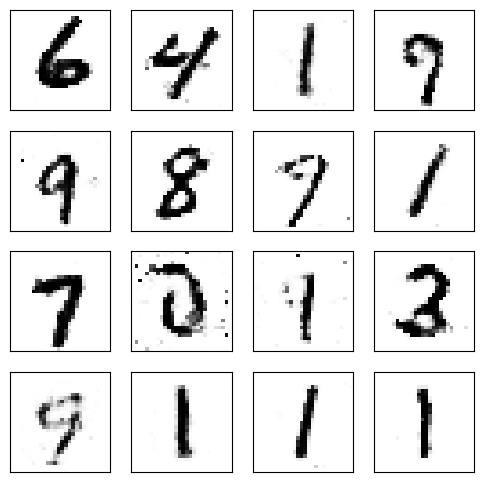

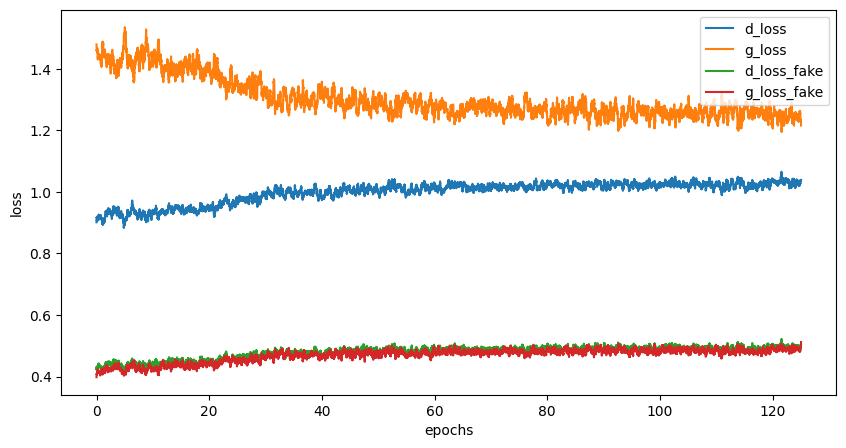

Epoch [126/160], Step[100/469], d_loss: 0.9783, d_loss_fake: 0.5073, g_loss: 1.0916, g_loss_fake: 0.5660, D(x): 0.68, D(G(z)): 0.37
Epoch [126/160], Step[200/469], d_loss: 1.0103, d_loss_fake: 0.4516, g_loss: 1.2393, g_loss_fake: 0.5502, D(x): 0.65, D(G(z)): 0.33
Epoch [126/160], Step[300/469], d_loss: 1.0924, d_loss_fake: 0.4889, g_loss: 1.2305, g_loss_fake: 0.5341, D(x): 0.62, D(G(z)): 0.34
Epoch [126/160], Step[400/469], d_loss: 1.0419, d_loss_fake: 0.5362, g_loss: 1.1997, g_loss_fake: 0.5168, D(x): 0.67, D(G(z)): 0.36


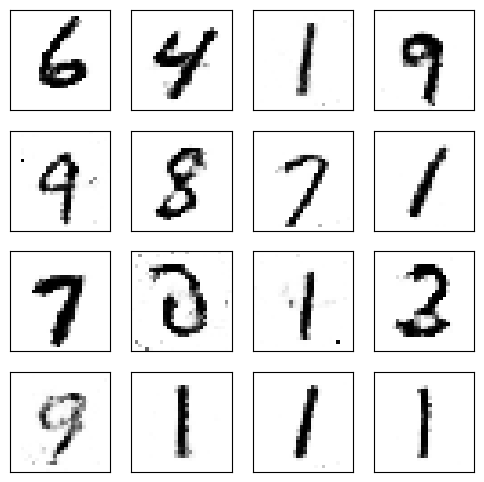

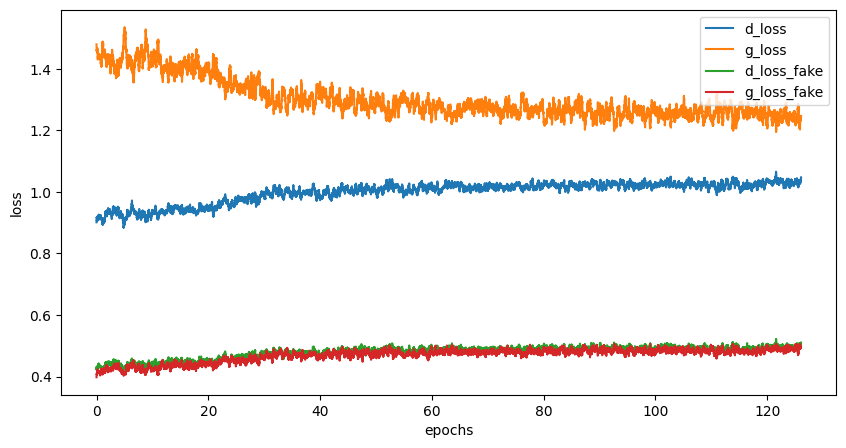

Epoch [127/160], Step[100/469], d_loss: 0.9795, d_loss_fake: 0.4779, g_loss: 1.1996, g_loss_fake: 0.4987, D(x): 0.66, D(G(z)): 0.34
Epoch [127/160], Step[200/469], d_loss: 1.0014, d_loss_fake: 0.4712, g_loss: 1.2655, g_loss_fake: 0.4467, D(x): 0.66, D(G(z)): 0.34
Epoch [127/160], Step[300/469], d_loss: 1.0622, d_loss_fake: 0.5025, g_loss: 1.3590, g_loss_fake: 0.4190, D(x): 0.63, D(G(z)): 0.34
Epoch [127/160], Step[400/469], d_loss: 0.9774, d_loss_fake: 0.4987, g_loss: 1.1708, g_loss_fake: 0.5158, D(x): 0.67, D(G(z)): 0.36


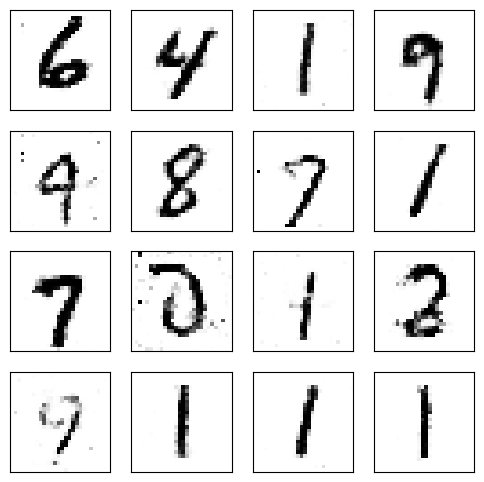

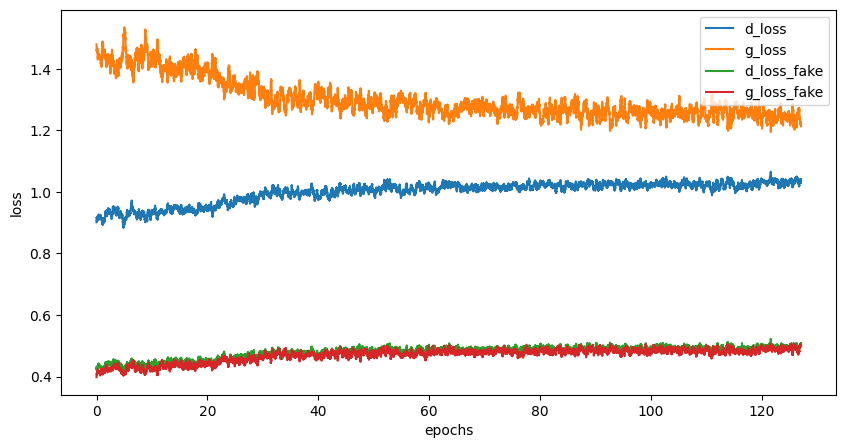

Epoch [128/160], Step[100/469], d_loss: 0.9980, d_loss_fake: 0.4717, g_loss: 1.3138, g_loss_fake: 0.4346, D(x): 0.65, D(G(z)): 0.32
Epoch [128/160], Step[200/469], d_loss: 0.9750, d_loss_fake: 0.4982, g_loss: 1.1998, g_loss_fake: 0.5058, D(x): 0.68, D(G(z)): 0.34
Epoch [128/160], Step[300/469], d_loss: 1.0477, d_loss_fake: 0.4174, g_loss: 1.3596, g_loss_fake: 0.4538, D(x): 0.61, D(G(z)): 0.30
Epoch [128/160], Step[400/469], d_loss: 0.9343, d_loss_fake: 0.4807, g_loss: 1.1474, g_loss_fake: 0.4923, D(x): 0.70, D(G(z)): 0.35


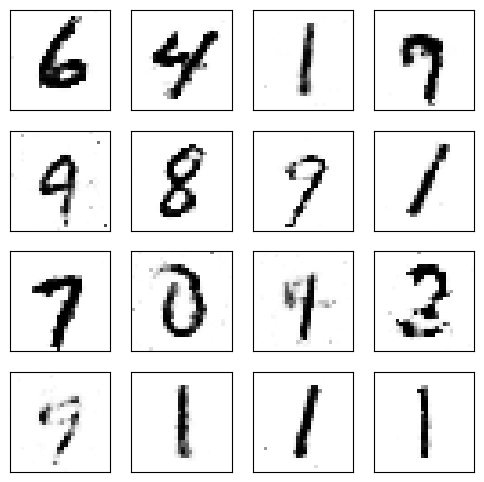

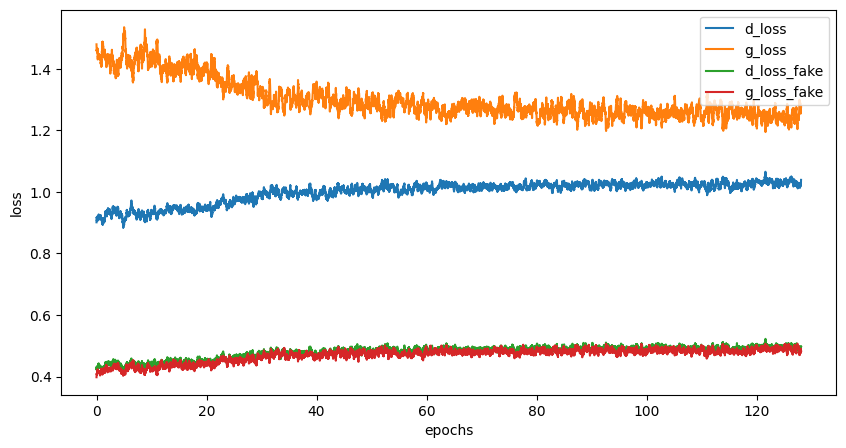

Epoch [129/160], Step[100/469], d_loss: 1.0303, d_loss_fake: 0.5456, g_loss: 1.1926, g_loss_fake: 0.4891, D(x): 0.68, D(G(z)): 0.36
Epoch [129/160], Step[200/469], d_loss: 1.0866, d_loss_fake: 0.3788, g_loss: 1.3378, g_loss_fake: 0.4503, D(x): 0.59, D(G(z)): 0.29
Epoch [129/160], Step[300/469], d_loss: 1.0017, d_loss_fake: 0.4735, g_loss: 1.3991, g_loss_fake: 0.4292, D(x): 0.66, D(G(z)): 0.35
Epoch [129/160], Step[400/469], d_loss: 0.9423, d_loss_fake: 0.3838, g_loss: 1.3694, g_loss_fake: 0.4686, D(x): 0.66, D(G(z)): 0.30


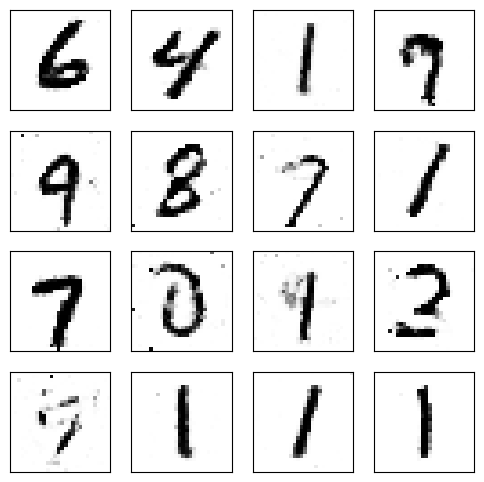

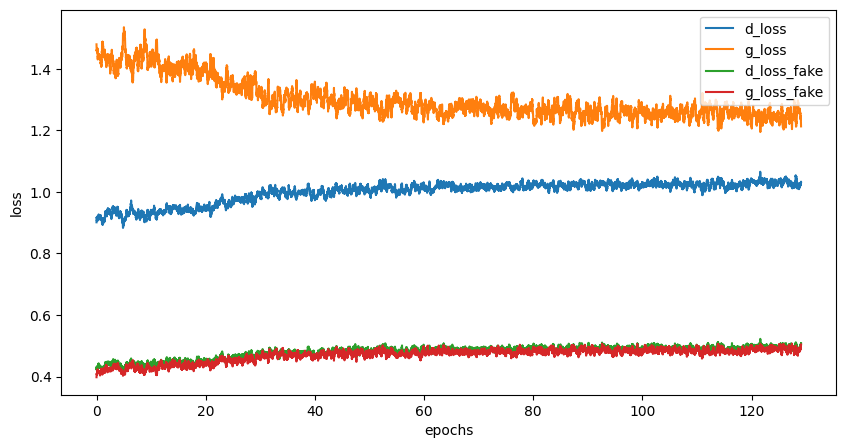

Epoch [130/160], Step[100/469], d_loss: 1.1173, d_loss_fake: 0.5224, g_loss: 1.2571, g_loss_fake: 0.4643, D(x): 0.62, D(G(z)): 0.35
Epoch [130/160], Step[200/469], d_loss: 0.9575, d_loss_fake: 0.4637, g_loss: 1.1439, g_loss_fake: 0.5741, D(x): 0.68, D(G(z)): 0.34
Epoch [130/160], Step[300/469], d_loss: 0.9998, d_loss_fake: 0.5042, g_loss: 1.3089, g_loss_fake: 0.4359, D(x): 0.67, D(G(z)): 0.35
Epoch [130/160], Step[400/469], d_loss: 1.1105, d_loss_fake: 0.5943, g_loss: 1.0849, g_loss_fake: 0.5970, D(x): 0.66, D(G(z)): 0.39


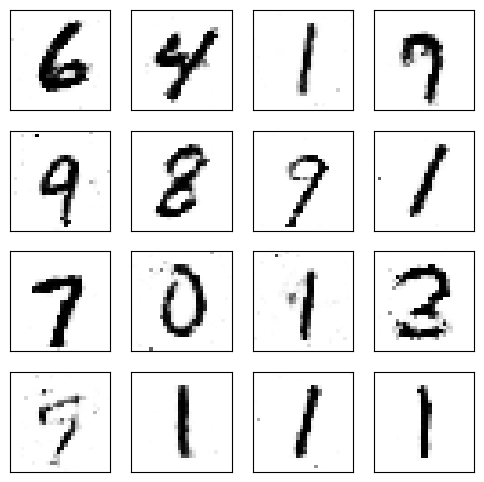

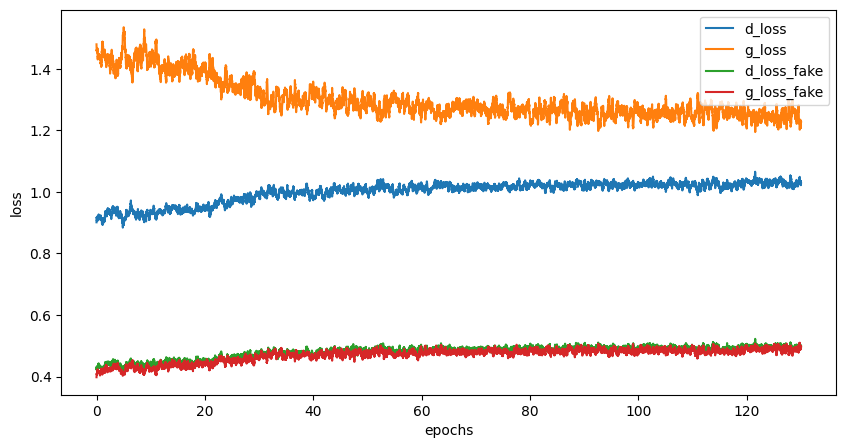

Epoch [131/160], Step[100/469], d_loss: 0.9764, d_loss_fake: 0.4376, g_loss: 1.2759, g_loss_fake: 0.4353, D(x): 0.65, D(G(z)): 0.33
Epoch [131/160], Step[200/469], d_loss: 0.9232, d_loss_fake: 0.4064, g_loss: 1.2468, g_loss_fake: 0.4748, D(x): 0.66, D(G(z)): 0.30
Epoch [131/160], Step[300/469], d_loss: 1.0202, d_loss_fake: 0.5266, g_loss: 1.2386, g_loss_fake: 0.5137, D(x): 0.67, D(G(z)): 0.35
Epoch [131/160], Step[400/469], d_loss: 0.9902, d_loss_fake: 0.4510, g_loss: 1.3185, g_loss_fake: 0.4208, D(x): 0.65, D(G(z)): 0.33


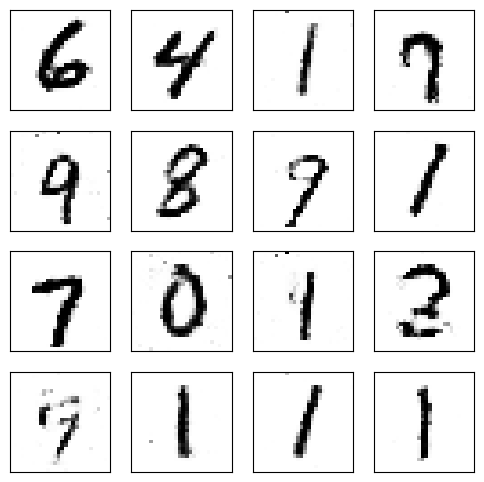

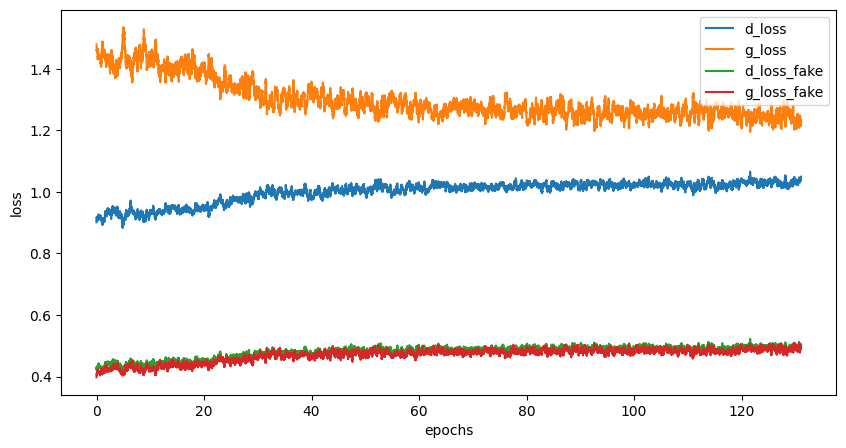

Epoch [132/160], Step[100/469], d_loss: 0.9323, d_loss_fake: 0.4414, g_loss: 1.2738, g_loss_fake: 0.5075, D(x): 0.68, D(G(z)): 0.32
Epoch [132/160], Step[200/469], d_loss: 1.1164, d_loss_fake: 0.5532, g_loss: 1.3252, g_loss_fake: 0.4724, D(x): 0.64, D(G(z)): 0.34
Epoch [132/160], Step[300/469], d_loss: 0.9934, d_loss_fake: 0.4506, g_loss: 1.3660, g_loss_fake: 0.3924, D(x): 0.64, D(G(z)): 0.32
Epoch [132/160], Step[400/469], d_loss: 1.1204, d_loss_fake: 0.5311, g_loss: 1.3583, g_loss_fake: 0.4235, D(x): 0.63, D(G(z)): 0.36


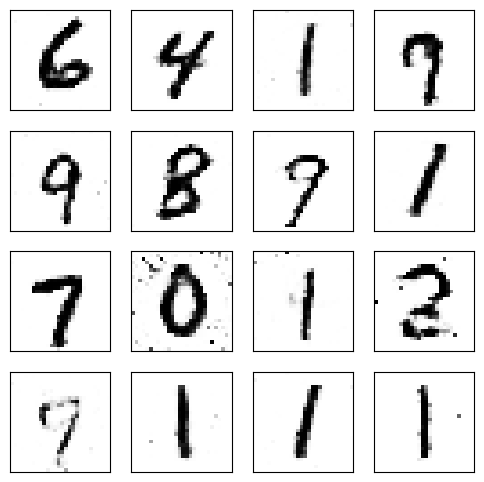

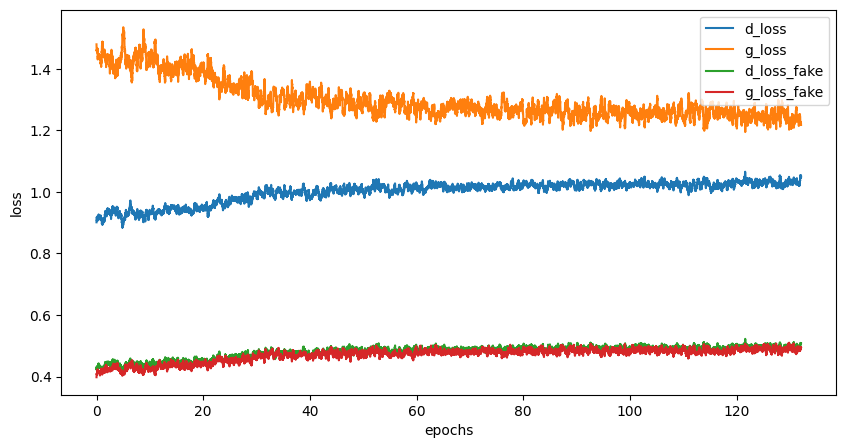

Epoch [133/160], Step[100/469], d_loss: 1.0019, d_loss_fake: 0.3970, g_loss: 1.3715, g_loss_fake: 0.4183, D(x): 0.62, D(G(z)): 0.30
Epoch [133/160], Step[200/469], d_loss: 1.0299, d_loss_fake: 0.4722, g_loss: 1.2393, g_loss_fake: 0.4432, D(x): 0.64, D(G(z)): 0.34
Epoch [133/160], Step[300/469], d_loss: 1.0314, d_loss_fake: 0.5098, g_loss: 1.1916, g_loss_fake: 0.5123, D(x): 0.66, D(G(z)): 0.36
Epoch [133/160], Step[400/469], d_loss: 1.1081, d_loss_fake: 0.5119, g_loss: 1.2787, g_loss_fake: 0.4593, D(x): 0.63, D(G(z)): 0.35


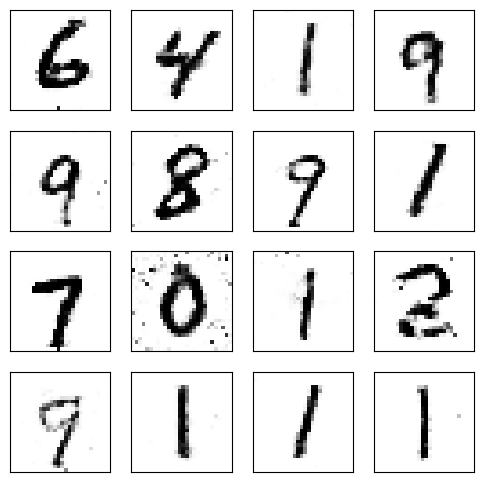

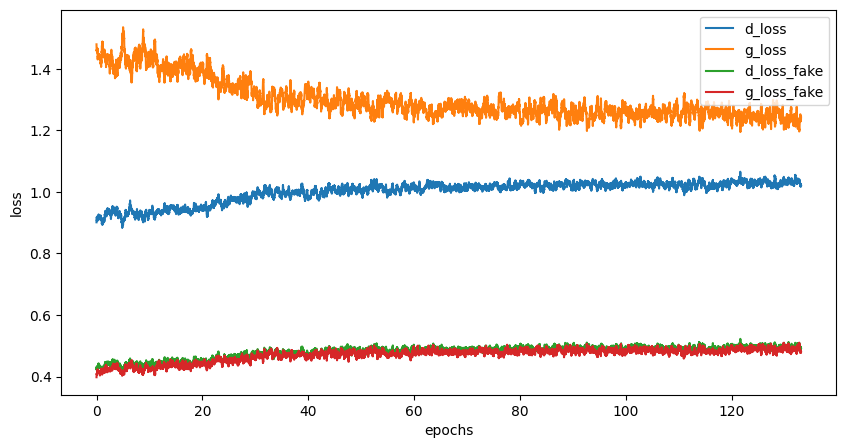

Epoch [134/160], Step[100/469], d_loss: 1.0282, d_loss_fake: 0.4168, g_loss: 1.3824, g_loss_fake: 0.3679, D(x): 0.62, D(G(z)): 0.30
Epoch [134/160], Step[200/469], d_loss: 1.0519, d_loss_fake: 0.4192, g_loss: 1.2261, g_loss_fake: 0.4664, D(x): 0.61, D(G(z)): 0.30
Epoch [134/160], Step[300/469], d_loss: 1.0076, d_loss_fake: 0.4892, g_loss: 1.1884, g_loss_fake: 0.4770, D(x): 0.66, D(G(z)): 0.35
Epoch [134/160], Step[400/469], d_loss: 1.0317, d_loss_fake: 0.4471, g_loss: 1.3187, g_loss_fake: 0.4216, D(x): 0.63, D(G(z)): 0.33


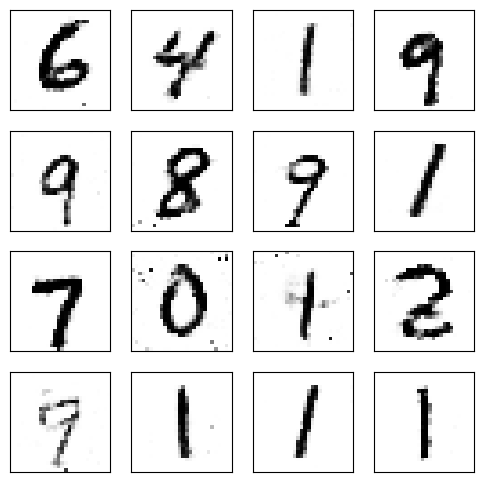

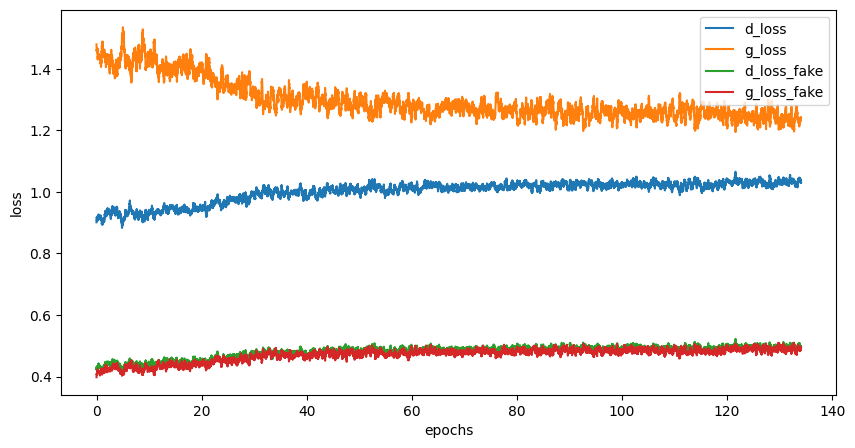

Epoch [135/160], Step[100/469], d_loss: 1.0448, d_loss_fake: 0.5871, g_loss: 1.3055, g_loss_fake: 0.4792, D(x): 0.69, D(G(z)): 0.37
Epoch [135/160], Step[200/469], d_loss: 1.0791, d_loss_fake: 0.4058, g_loss: 1.4444, g_loss_fake: 0.3824, D(x): 0.60, D(G(z)): 0.29
Epoch [135/160], Step[300/469], d_loss: 1.0154, d_loss_fake: 0.5138, g_loss: 1.1984, g_loss_fake: 0.4790, D(x): 0.67, D(G(z)): 0.36
Epoch [135/160], Step[400/469], d_loss: 1.0532, d_loss_fake: 0.5161, g_loss: 1.2720, g_loss_fake: 0.5029, D(x): 0.65, D(G(z)): 0.35


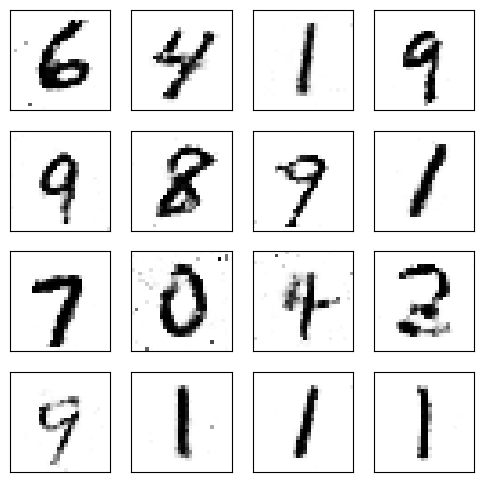

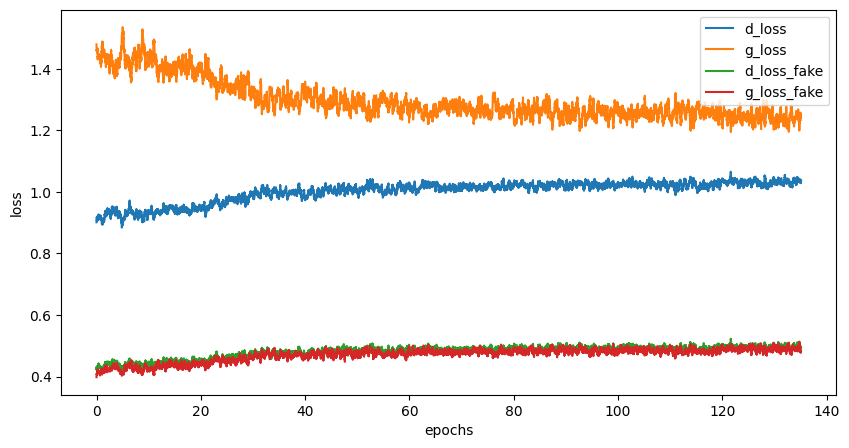

Epoch [136/160], Step[100/469], d_loss: 1.0266, d_loss_fake: 0.4696, g_loss: 1.2954, g_loss_fake: 0.4369, D(x): 0.65, D(G(z)): 0.33
Epoch [136/160], Step[200/469], d_loss: 1.1200, d_loss_fake: 0.5729, g_loss: 1.0514, g_loss_fake: 0.6130, D(x): 0.65, D(G(z)): 0.38
Epoch [136/160], Step[300/469], d_loss: 1.1047, d_loss_fake: 0.5456, g_loss: 1.2891, g_loss_fake: 0.4396, D(x): 0.63, D(G(z)): 0.38
Epoch [136/160], Step[400/469], d_loss: 1.0608, d_loss_fake: 0.5081, g_loss: 1.2314, g_loss_fake: 0.4629, D(x): 0.64, D(G(z)): 0.36


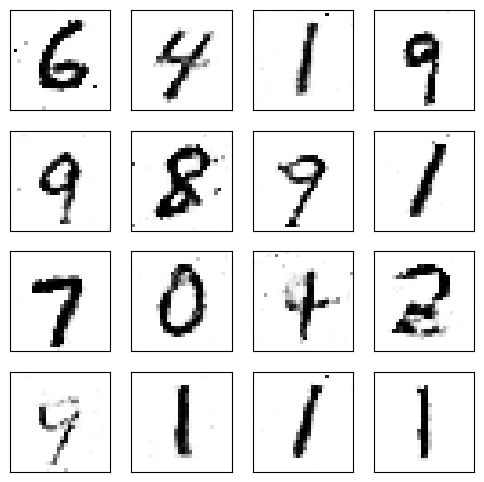

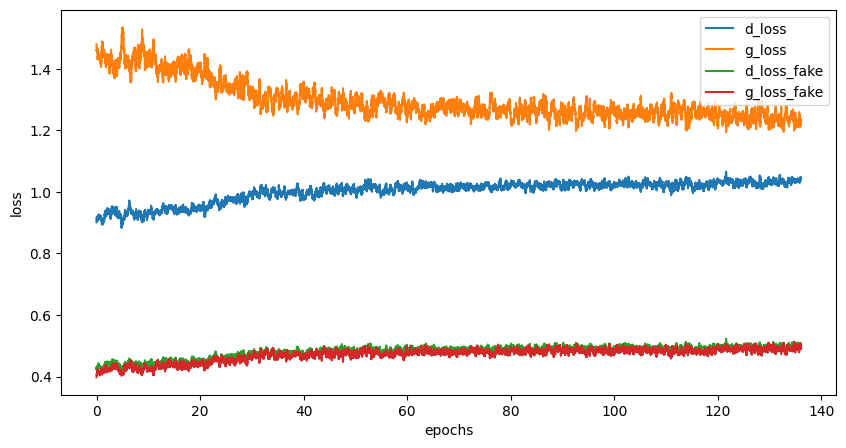

Epoch [137/160], Step[100/469], d_loss: 0.9438, d_loss_fake: 0.4203, g_loss: 1.5140, g_loss_fake: 0.3659, D(x): 0.66, D(G(z)): 0.31
Epoch [137/160], Step[200/469], d_loss: 1.0166, d_loss_fake: 0.4935, g_loss: 1.3612, g_loss_fake: 0.4800, D(x): 0.66, D(G(z)): 0.35
Epoch [137/160], Step[300/469], d_loss: 1.0999, d_loss_fake: 0.5427, g_loss: 1.2508, g_loss_fake: 0.4873, D(x): 0.65, D(G(z)): 0.36
Epoch [137/160], Step[400/469], d_loss: 1.0622, d_loss_fake: 0.5251, g_loss: 1.2194, g_loss_fake: 0.4919, D(x): 0.66, D(G(z)): 0.35


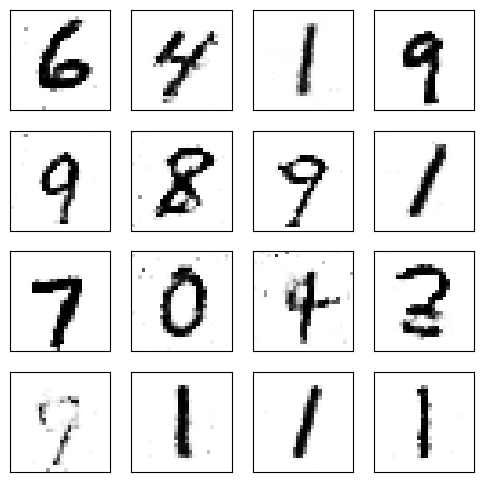

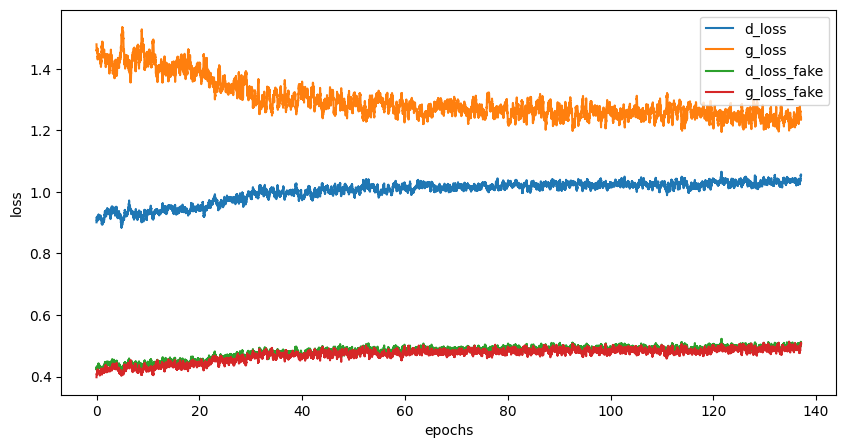

Epoch [138/160], Step[100/469], d_loss: 1.0622, d_loss_fake: 0.4484, g_loss: 1.1682, g_loss_fake: 0.5007, D(x): 0.61, D(G(z)): 0.32
Epoch [138/160], Step[200/469], d_loss: 1.0685, d_loss_fake: 0.5461, g_loss: 1.2399, g_loss_fake: 0.5041, D(x): 0.65, D(G(z)): 0.36
Epoch [138/160], Step[300/469], d_loss: 0.9661, d_loss_fake: 0.5019, g_loss: 1.2530, g_loss_fake: 0.4501, D(x): 0.68, D(G(z)): 0.36
Epoch [138/160], Step[400/469], d_loss: 1.0852, d_loss_fake: 0.5328, g_loss: 1.1413, g_loss_fake: 0.5607, D(x): 0.65, D(G(z)): 0.37


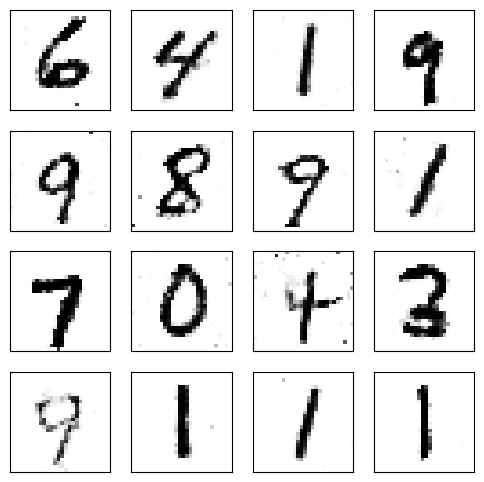

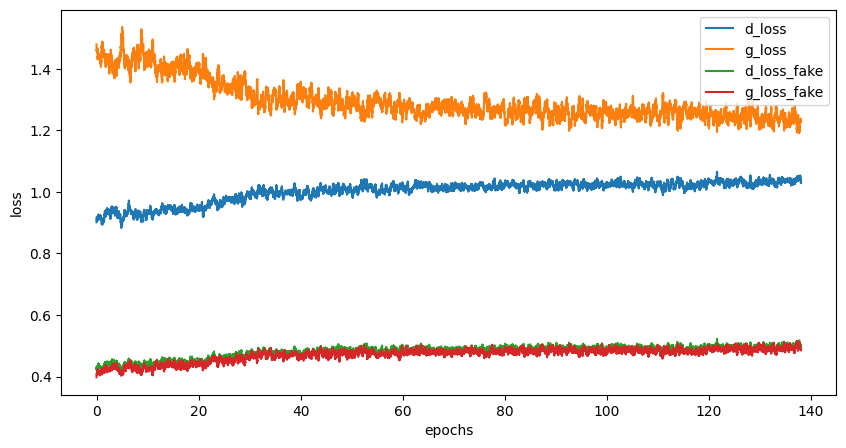

Epoch [139/160], Step[100/469], d_loss: 1.0753, d_loss_fake: 0.5042, g_loss: 1.1956, g_loss_fake: 0.5172, D(x): 0.63, D(G(z)): 0.36
Epoch [139/160], Step[200/469], d_loss: 0.8990, d_loss_fake: 0.3807, g_loss: 1.2727, g_loss_fake: 0.4663, D(x): 0.67, D(G(z)): 0.28
Epoch [139/160], Step[300/469], d_loss: 1.0837, d_loss_fake: 0.5598, g_loss: 1.2181, g_loss_fake: 0.5078, D(x): 0.66, D(G(z)): 0.37
Epoch [139/160], Step[400/469], d_loss: 1.0464, d_loss_fake: 0.4441, g_loss: 1.3130, g_loss_fake: 0.4682, D(x): 0.62, D(G(z)): 0.32


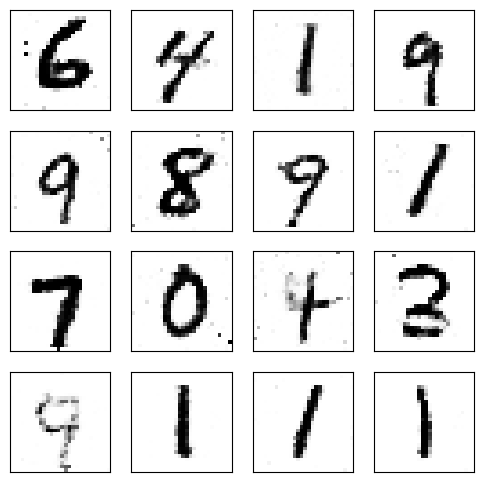

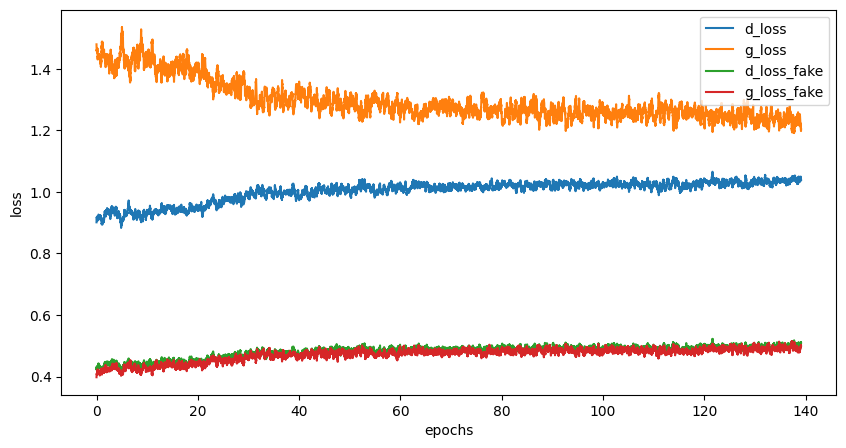

Epoch [140/160], Step[100/469], d_loss: 0.9432, d_loss_fake: 0.3796, g_loss: 1.4797, g_loss_fake: 0.3765, D(x): 0.64, D(G(z)): 0.28
Epoch [140/160], Step[200/469], d_loss: 1.0347, d_loss_fake: 0.4837, g_loss: 1.2977, g_loss_fake: 0.4851, D(x): 0.66, D(G(z)): 0.34
Epoch [140/160], Step[300/469], d_loss: 1.1047, d_loss_fake: 0.5626, g_loss: 1.2094, g_loss_fake: 0.4934, D(x): 0.66, D(G(z)): 0.38
Epoch [140/160], Step[400/469], d_loss: 1.0572, d_loss_fake: 0.5578, g_loss: 1.2430, g_loss_fake: 0.4950, D(x): 0.66, D(G(z)): 0.38


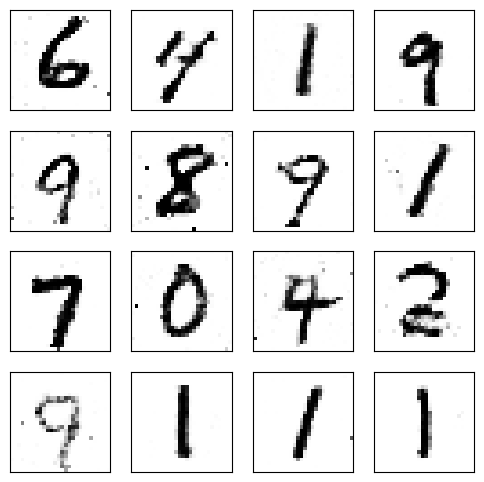

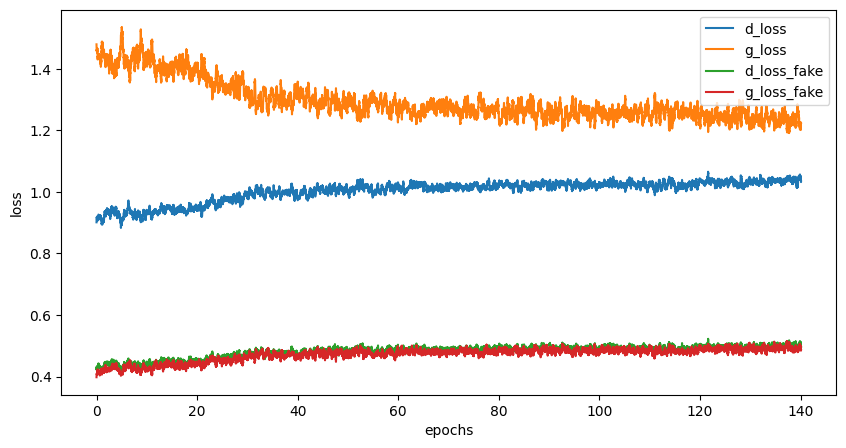

Epoch [141/160], Step[100/469], d_loss: 1.0193, d_loss_fake: 0.4481, g_loss: 1.4578, g_loss_fake: 0.3838, D(x): 0.63, D(G(z)): 0.32
Epoch [141/160], Step[200/469], d_loss: 1.0394, d_loss_fake: 0.4893, g_loss: 1.3706, g_loss_fake: 0.4457, D(x): 0.64, D(G(z)): 0.34
Epoch [141/160], Step[300/469], d_loss: 1.0406, d_loss_fake: 0.5421, g_loss: 1.3063, g_loss_fake: 0.4529, D(x): 0.68, D(G(z)): 0.36
Epoch [141/160], Step[400/469], d_loss: 1.1304, d_loss_fake: 0.6009, g_loss: 1.0630, g_loss_fake: 0.5779, D(x): 0.66, D(G(z)): 0.40


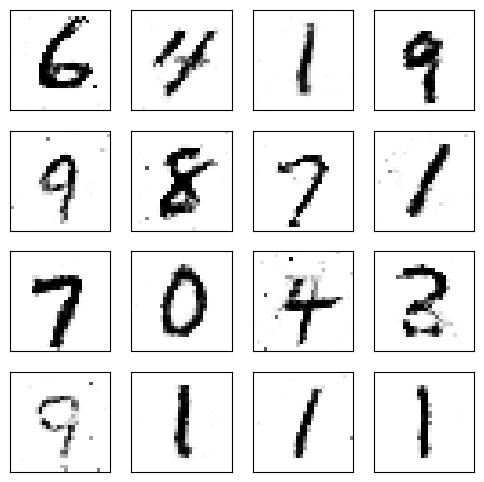

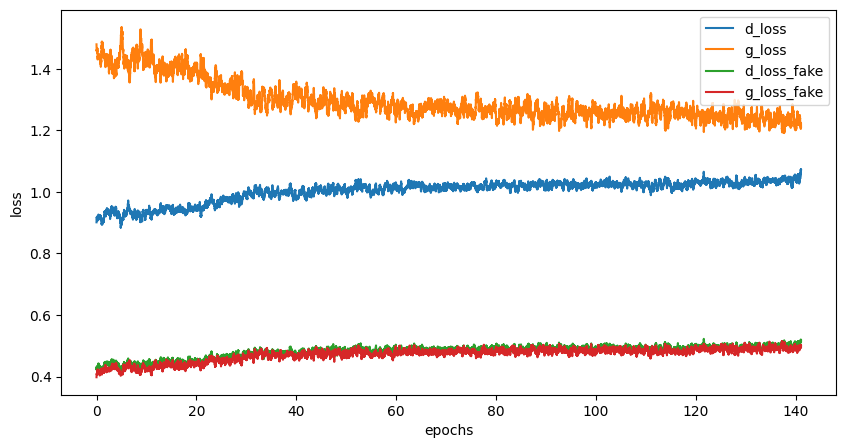

Epoch [142/160], Step[100/469], d_loss: 1.0615, d_loss_fake: 0.5604, g_loss: 1.3689, g_loss_fake: 0.4559, D(x): 0.67, D(G(z)): 0.36
Epoch [142/160], Step[200/469], d_loss: 1.1057, d_loss_fake: 0.5573, g_loss: 1.2137, g_loss_fake: 0.4941, D(x): 0.64, D(G(z)): 0.38
Epoch [142/160], Step[300/469], d_loss: 1.0628, d_loss_fake: 0.4275, g_loss: 1.2101, g_loss_fake: 0.5012, D(x): 0.60, D(G(z)): 0.32
Epoch [142/160], Step[400/469], d_loss: 1.0153, d_loss_fake: 0.4210, g_loss: 1.2445, g_loss_fake: 0.4313, D(x): 0.63, D(G(z)): 0.32


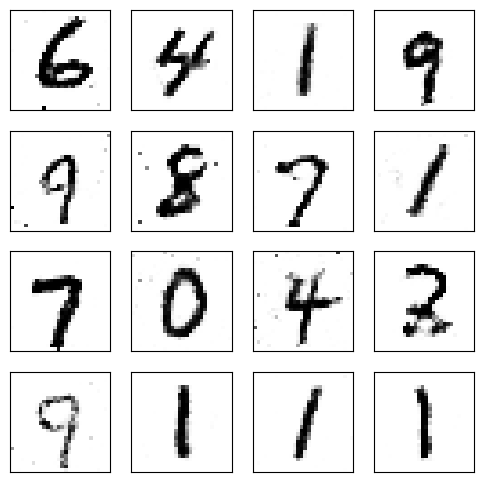

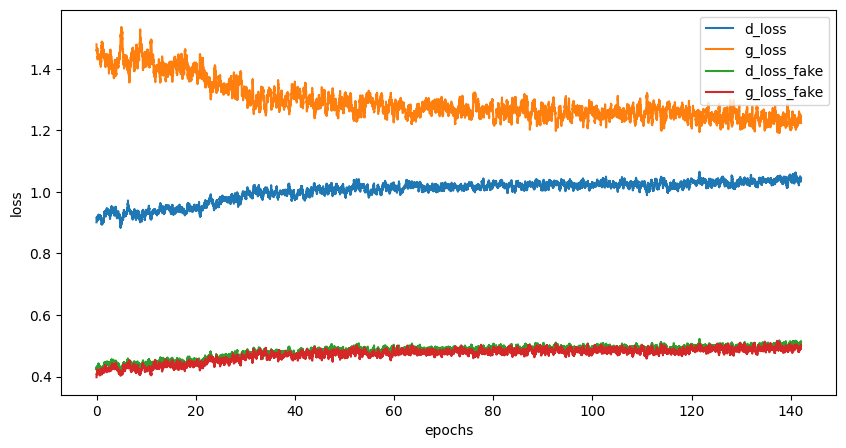

Epoch [143/160], Step[100/469], d_loss: 0.9409, d_loss_fake: 0.5106, g_loss: 1.1295, g_loss_fake: 0.5334, D(x): 0.71, D(G(z)): 0.35
Epoch [143/160], Step[200/469], d_loss: 1.0889, d_loss_fake: 0.5505, g_loss: 1.3505, g_loss_fake: 0.4020, D(x): 0.65, D(G(z)): 0.37
Epoch [143/160], Step[300/469], d_loss: 1.0604, d_loss_fake: 0.4982, g_loss: 1.3255, g_loss_fake: 0.4617, D(x): 0.64, D(G(z)): 0.33
Epoch [143/160], Step[400/469], d_loss: 1.0173, d_loss_fake: 0.4341, g_loss: 1.1536, g_loss_fake: 0.5141, D(x): 0.62, D(G(z)): 0.32


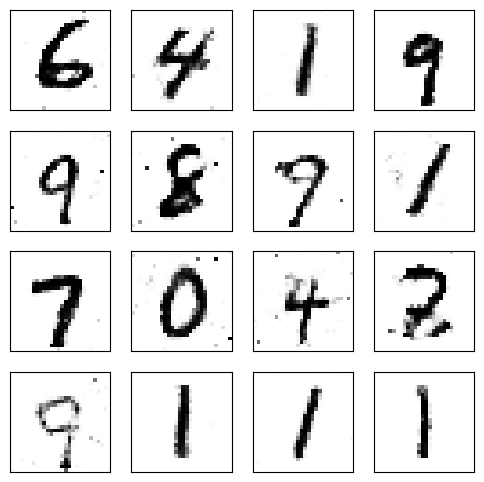

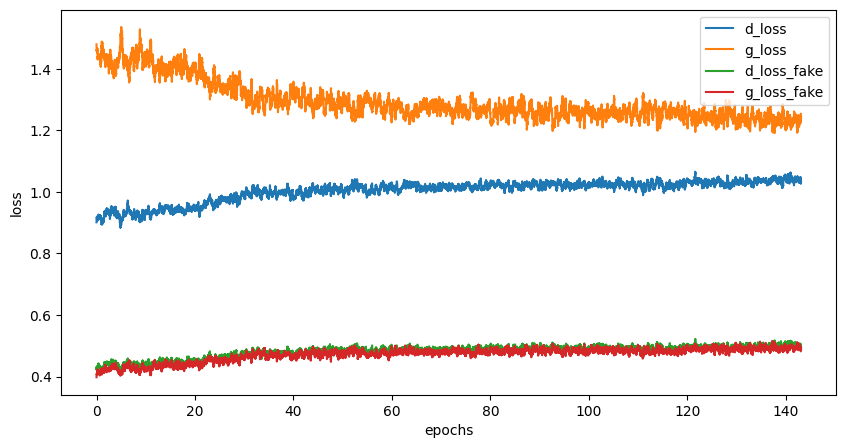

Epoch [144/160], Step[100/469], d_loss: 0.9791, d_loss_fake: 0.4319, g_loss: 1.2547, g_loss_fake: 0.4974, D(x): 0.64, D(G(z)): 0.31
Epoch [144/160], Step[200/469], d_loss: 1.0466, d_loss_fake: 0.4456, g_loss: 1.3177, g_loss_fake: 0.4250, D(x): 0.62, D(G(z)): 0.33
Epoch [144/160], Step[300/469], d_loss: 0.9629, d_loss_fake: 0.4582, g_loss: 1.2883, g_loss_fake: 0.4598, D(x): 0.67, D(G(z)): 0.33
Epoch [144/160], Step[400/469], d_loss: 1.0859, d_loss_fake: 0.5033, g_loss: 1.1351, g_loss_fake: 0.5393, D(x): 0.62, D(G(z)): 0.35


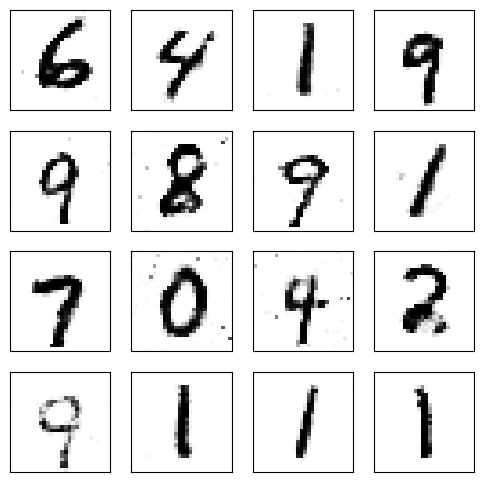

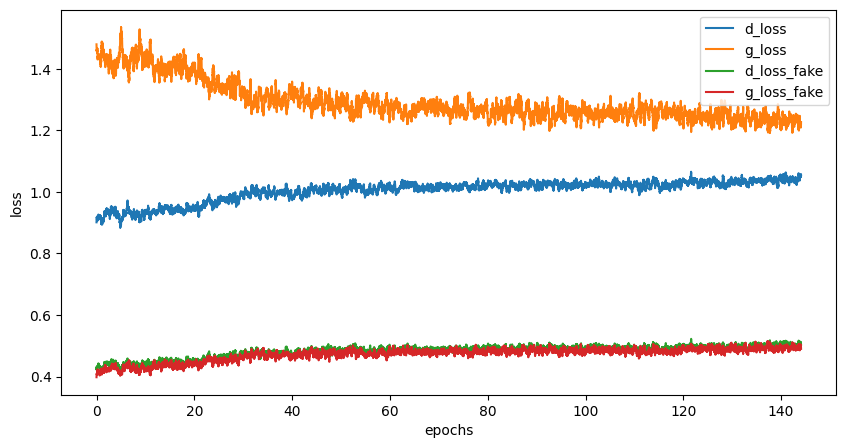

Epoch [145/160], Step[100/469], d_loss: 1.0107, d_loss_fake: 0.5479, g_loss: 1.2654, g_loss_fake: 0.5257, D(x): 0.68, D(G(z)): 0.36
Epoch [145/160], Step[200/469], d_loss: 0.9914, d_loss_fake: 0.5361, g_loss: 1.1703, g_loss_fake: 0.6023, D(x): 0.70, D(G(z)): 0.37
Epoch [145/160], Step[300/469], d_loss: 1.0518, d_loss_fake: 0.5234, g_loss: 1.2610, g_loss_fake: 0.4724, D(x): 0.64, D(G(z)): 0.36
Epoch [145/160], Step[400/469], d_loss: 0.9875, d_loss_fake: 0.5276, g_loss: 1.1504, g_loss_fake: 0.5259, D(x): 0.68, D(G(z)): 0.35


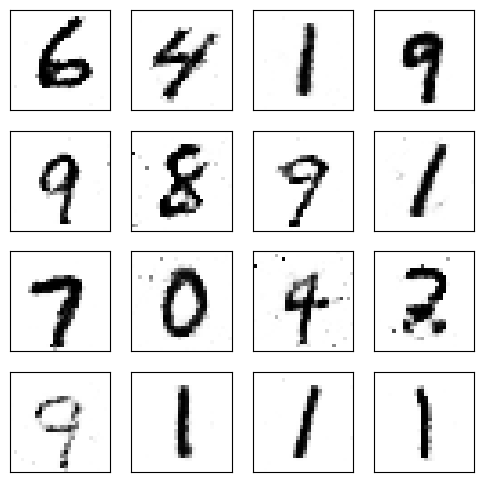

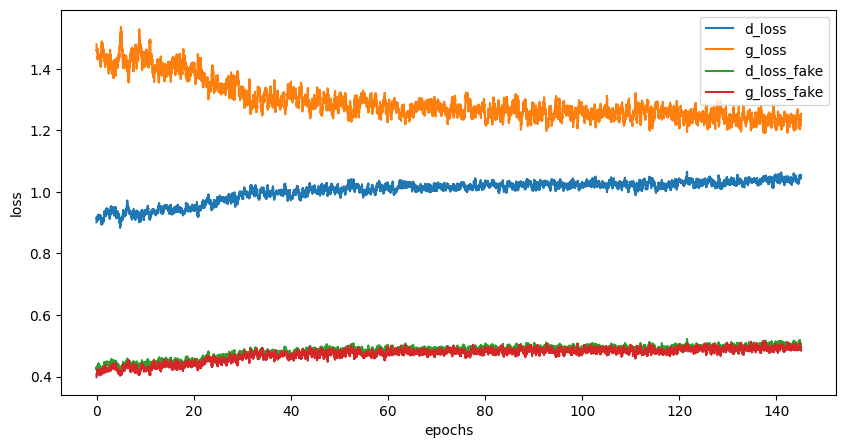

Epoch [146/160], Step[100/469], d_loss: 1.0734, d_loss_fake: 0.5080, g_loss: 1.1670, g_loss_fake: 0.5189, D(x): 0.63, D(G(z)): 0.36
Epoch [146/160], Step[200/469], d_loss: 1.1092, d_loss_fake: 0.5579, g_loss: 1.1418, g_loss_fake: 0.5103, D(x): 0.64, D(G(z)): 0.39
Epoch [146/160], Step[300/469], d_loss: 1.0474, d_loss_fake: 0.4777, g_loss: 1.2347, g_loss_fake: 0.4633, D(x): 0.63, D(G(z)): 0.34
Epoch [146/160], Step[400/469], d_loss: 0.9172, d_loss_fake: 0.4634, g_loss: 1.2884, g_loss_fake: 0.4488, D(x): 0.70, D(G(z)): 0.33


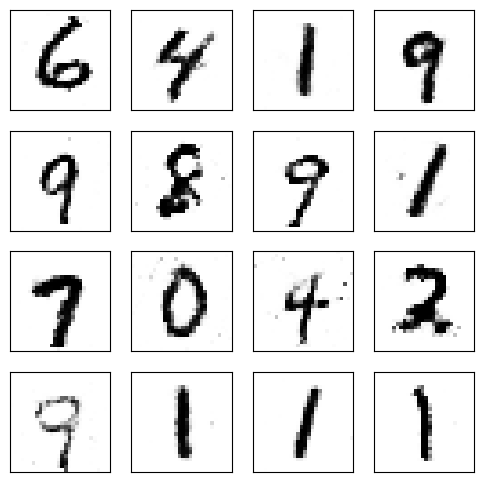

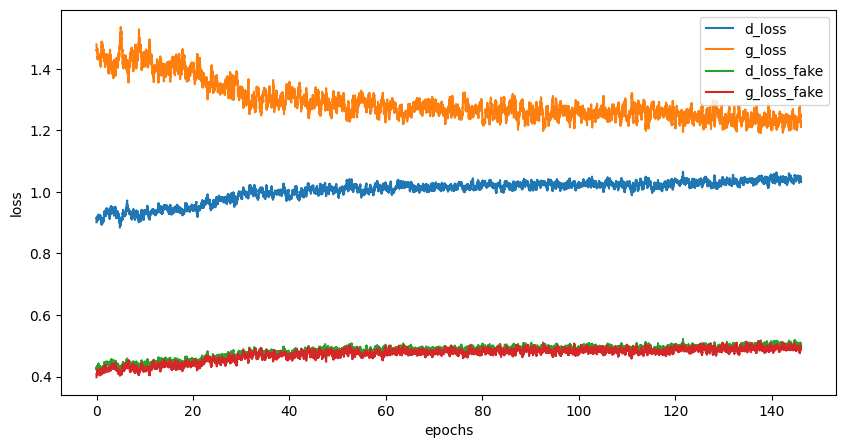

Epoch [147/160], Step[100/469], d_loss: 1.0360, d_loss_fake: 0.5179, g_loss: 1.2722, g_loss_fake: 0.4218, D(x): 0.66, D(G(z)): 0.36
Epoch [147/160], Step[200/469], d_loss: 1.0981, d_loss_fake: 0.4700, g_loss: 1.4925, g_loss_fake: 0.3509, D(x): 0.60, D(G(z)): 0.32
Epoch [147/160], Step[300/469], d_loss: 1.0512, d_loss_fake: 0.4401, g_loss: 1.2727, g_loss_fake: 0.4765, D(x): 0.63, D(G(z)): 0.31
Epoch [147/160], Step[400/469], d_loss: 1.0730, d_loss_fake: 0.6151, g_loss: 1.1004, g_loss_fake: 0.5508, D(x): 0.69, D(G(z)): 0.40


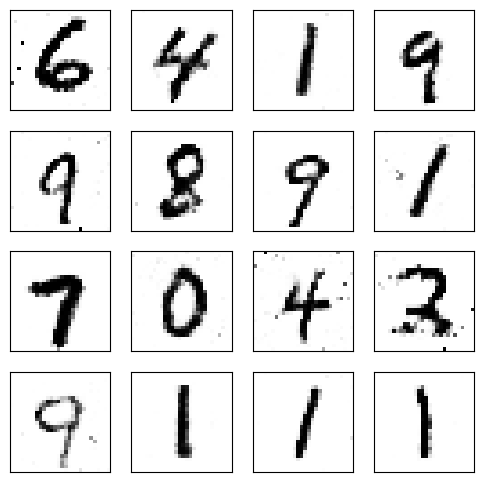

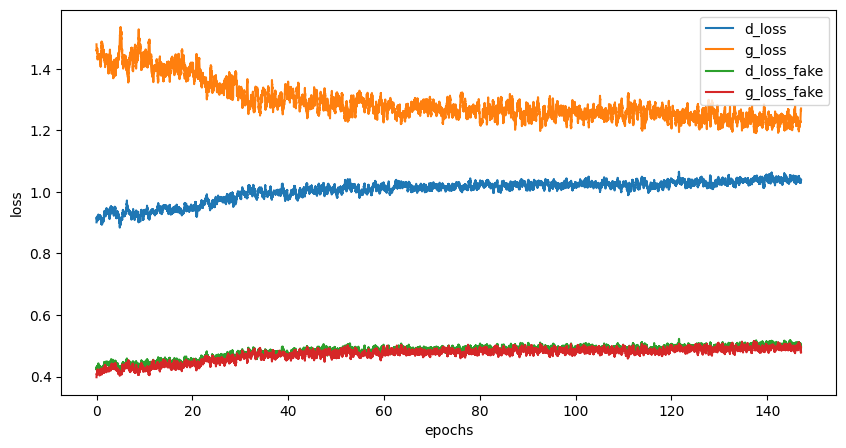

Epoch [148/160], Step[100/469], d_loss: 0.9826, d_loss_fake: 0.4742, g_loss: 1.1857, g_loss_fake: 0.5374, D(x): 0.67, D(G(z)): 0.34
Epoch [148/160], Step[200/469], d_loss: 0.9980, d_loss_fake: 0.5366, g_loss: 1.2700, g_loss_fake: 0.4670, D(x): 0.69, D(G(z)): 0.36
Epoch [148/160], Step[300/469], d_loss: 1.0807, d_loss_fake: 0.5315, g_loss: 1.2466, g_loss_fake: 0.5135, D(x): 0.64, D(G(z)): 0.37
Epoch [148/160], Step[400/469], d_loss: 1.0463, d_loss_fake: 0.5763, g_loss: 1.0534, g_loss_fake: 0.6123, D(x): 0.68, D(G(z)): 0.37


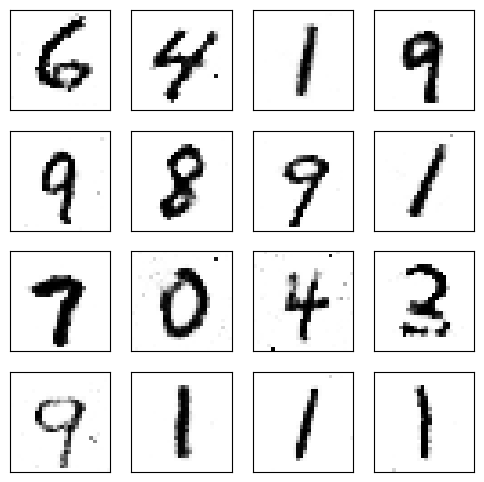

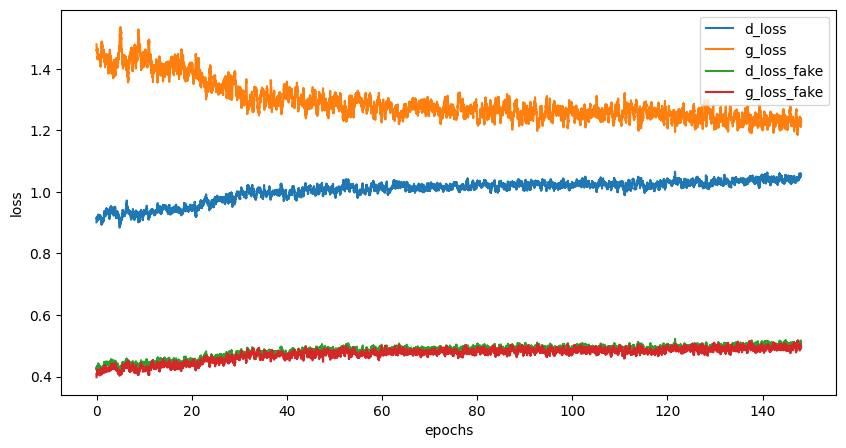

Epoch [149/160], Step[100/469], d_loss: 1.0535, d_loss_fake: 0.5145, g_loss: 1.2146, g_loss_fake: 0.4960, D(x): 0.66, D(G(z)): 0.36
Epoch [149/160], Step[200/469], d_loss: 1.0595, d_loss_fake: 0.4329, g_loss: 1.2209, g_loss_fake: 0.4679, D(x): 0.60, D(G(z)): 0.33
Epoch [149/160], Step[300/469], d_loss: 1.0231, d_loss_fake: 0.5384, g_loss: 1.0717, g_loss_fake: 0.6004, D(x): 0.67, D(G(z)): 0.38
Epoch [149/160], Step[400/469], d_loss: 1.1311, d_loss_fake: 0.5540, g_loss: 1.0780, g_loss_fake: 0.5915, D(x): 0.63, D(G(z)): 0.37


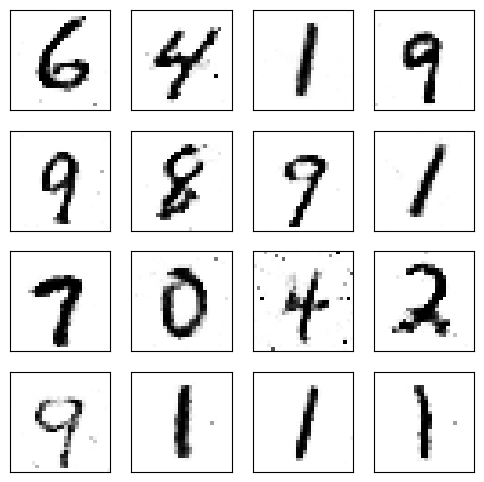

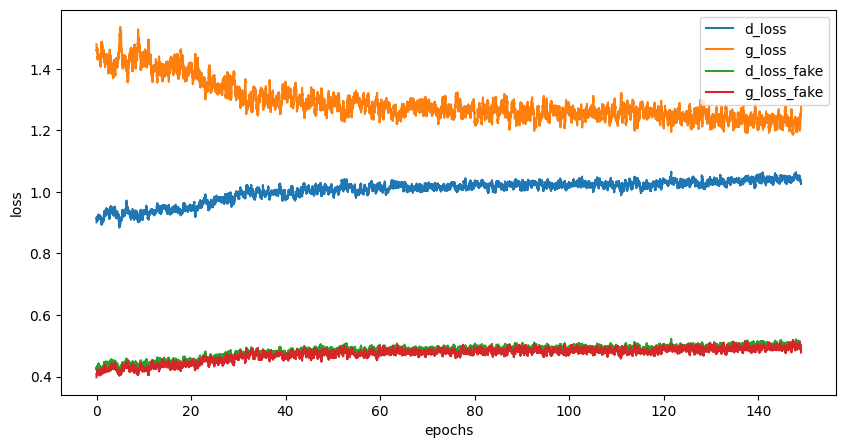

Epoch [150/160], Step[100/469], d_loss: 1.1187, d_loss_fake: 0.5339, g_loss: 1.2284, g_loss_fake: 0.4721, D(x): 0.63, D(G(z)): 0.35
Epoch [150/160], Step[200/469], d_loss: 1.0767, d_loss_fake: 0.6301, g_loss: 1.2306, g_loss_fake: 0.5253, D(x): 0.69, D(G(z)): 0.39
Epoch [150/160], Step[300/469], d_loss: 1.1554, d_loss_fake: 0.5334, g_loss: 1.2676, g_loss_fake: 0.5061, D(x): 0.60, D(G(z)): 0.36
Epoch [150/160], Step[400/469], d_loss: 0.9819, d_loss_fake: 0.5037, g_loss: 1.1747, g_loss_fake: 0.4715, D(x): 0.68, D(G(z)): 0.36


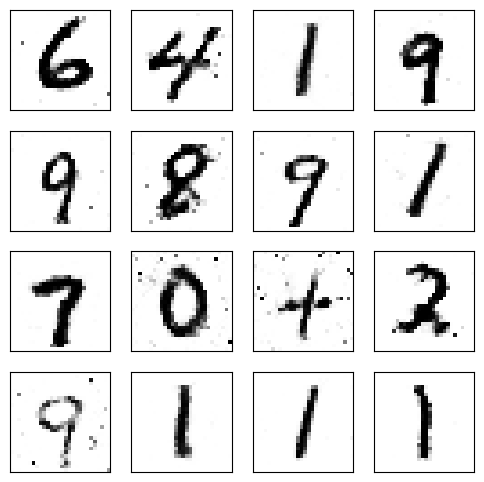

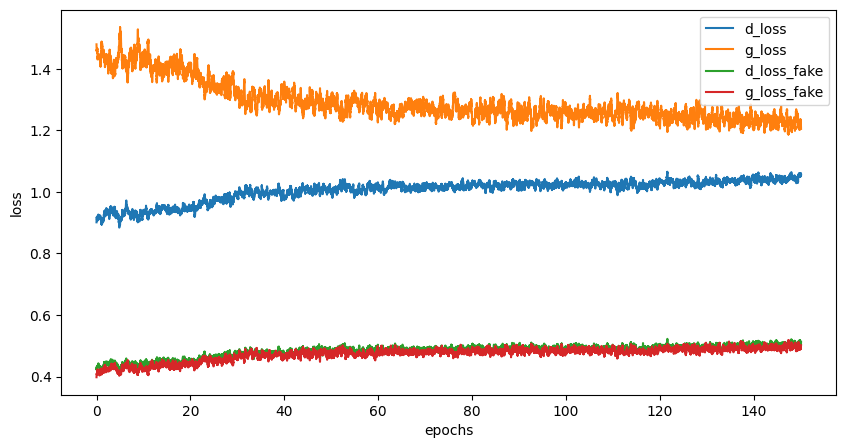

Epoch [151/160], Step[100/469], d_loss: 1.0312, d_loss_fake: 0.5762, g_loss: 1.1908, g_loss_fake: 0.5466, D(x): 0.70, D(G(z)): 0.38
Epoch [151/160], Step[200/469], d_loss: 1.0658, d_loss_fake: 0.5891, g_loss: 1.1047, g_loss_fake: 0.5866, D(x): 0.68, D(G(z)): 0.40
Epoch [151/160], Step[300/469], d_loss: 1.0712, d_loss_fake: 0.4690, g_loss: 1.1666, g_loss_fake: 0.5123, D(x): 0.62, D(G(z)): 0.33
Epoch [151/160], Step[400/469], d_loss: 1.0408, d_loss_fake: 0.5963, g_loss: 1.0512, g_loss_fake: 0.5895, D(x): 0.70, D(G(z)): 0.40


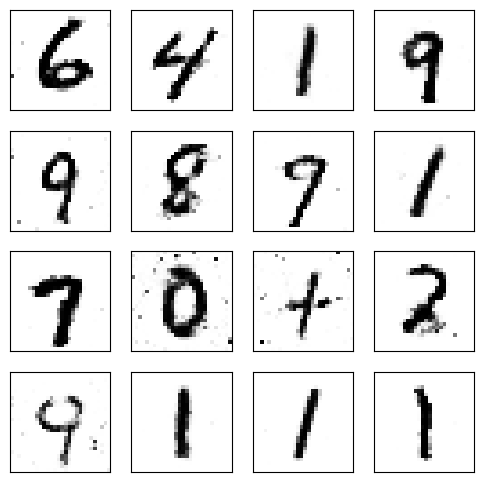

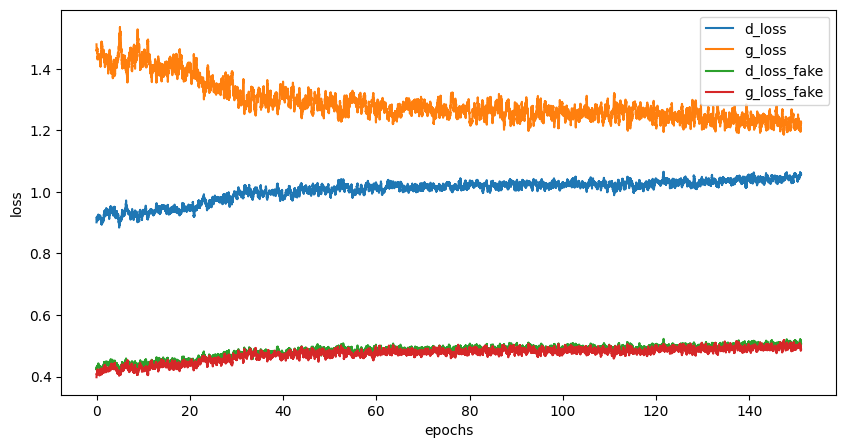

Epoch [152/160], Step[100/469], d_loss: 1.0746, d_loss_fake: 0.5574, g_loss: 1.3092, g_loss_fake: 0.4159, D(x): 0.67, D(G(z)): 0.37
Epoch [152/160], Step[200/469], d_loss: 1.0306, d_loss_fake: 0.4989, g_loss: 1.2849, g_loss_fake: 0.5039, D(x): 0.65, D(G(z)): 0.35
Epoch [152/160], Step[300/469], d_loss: 0.9749, d_loss_fake: 0.4845, g_loss: 1.3089, g_loss_fake: 0.4782, D(x): 0.68, D(G(z)): 0.35
Epoch [152/160], Step[400/469], d_loss: 1.0689, d_loss_fake: 0.5461, g_loss: 1.1703, g_loss_fake: 0.5010, D(x): 0.65, D(G(z)): 0.37


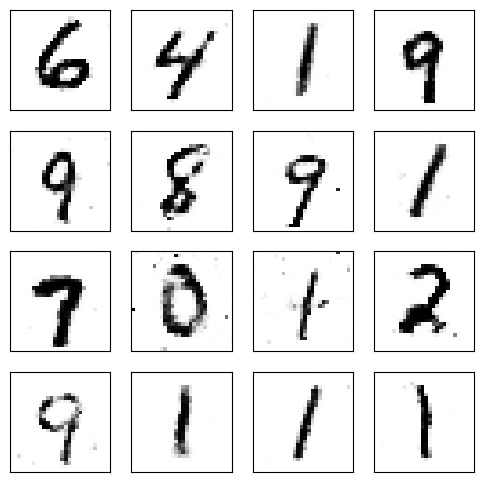

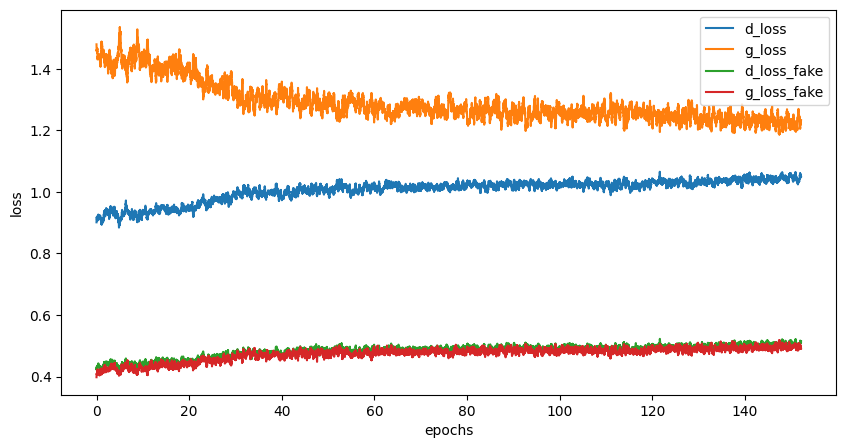

Epoch [153/160], Step[100/469], d_loss: 1.0589, d_loss_fake: 0.3754, g_loss: 1.4232, g_loss_fake: 0.3500, D(x): 0.58, D(G(z)): 0.29
Epoch [153/160], Step[200/469], d_loss: 0.9604, d_loss_fake: 0.5039, g_loss: 1.0830, g_loss_fake: 0.6605, D(x): 0.69, D(G(z)): 0.36
Epoch [153/160], Step[300/469], d_loss: 1.0760, d_loss_fake: 0.5184, g_loss: 1.1964, g_loss_fake: 0.5098, D(x): 0.63, D(G(z)): 0.35
Epoch [153/160], Step[400/469], d_loss: 1.0193, d_loss_fake: 0.4790, g_loss: 1.4365, g_loss_fake: 0.3758, D(x): 0.64, D(G(z)): 0.34


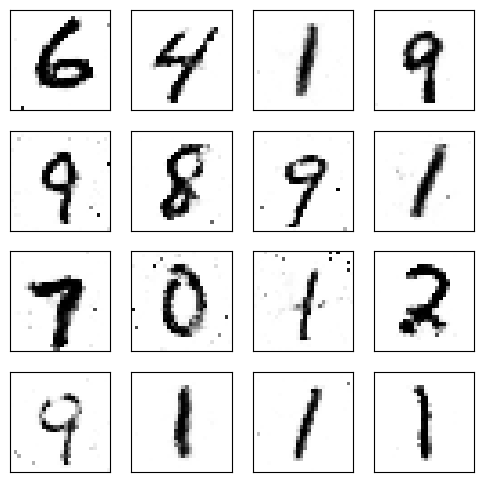

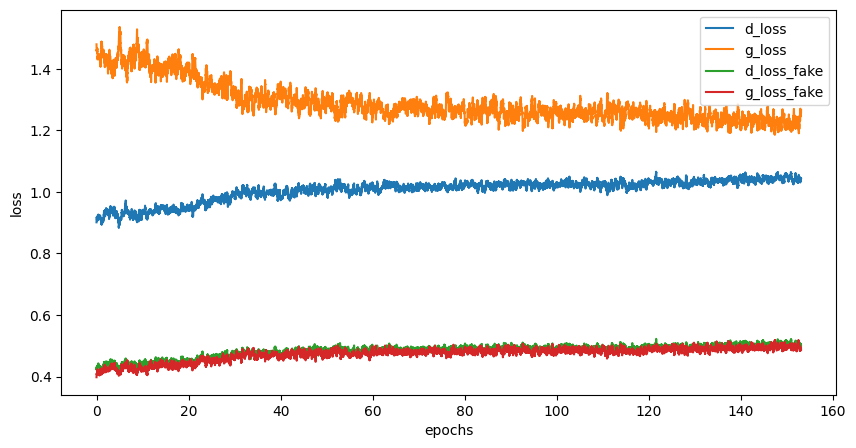

Epoch [154/160], Step[100/469], d_loss: 1.0813, d_loss_fake: 0.4676, g_loss: 1.2814, g_loss_fake: 0.4742, D(x): 0.61, D(G(z)): 0.34
Epoch [154/160], Step[200/469], d_loss: 1.2008, d_loss_fake: 0.4952, g_loss: 1.3243, g_loss_fake: 0.4316, D(x): 0.56, D(G(z)): 0.34
Epoch [154/160], Step[300/469], d_loss: 1.0271, d_loss_fake: 0.4961, g_loss: 1.1846, g_loss_fake: 0.5216, D(x): 0.64, D(G(z)): 0.36
Epoch [154/160], Step[400/469], d_loss: 0.9715, d_loss_fake: 0.4726, g_loss: 1.3437, g_loss_fake: 0.4566, D(x): 0.67, D(G(z)): 0.34


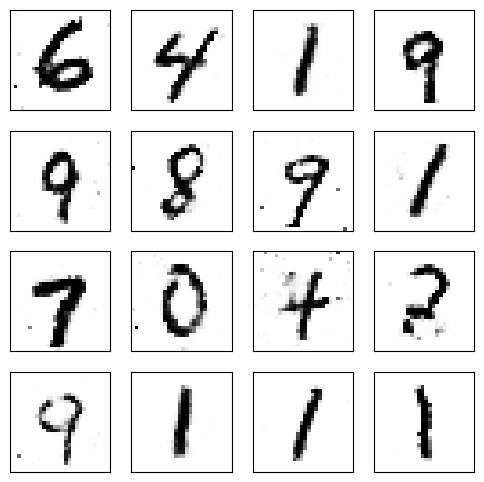

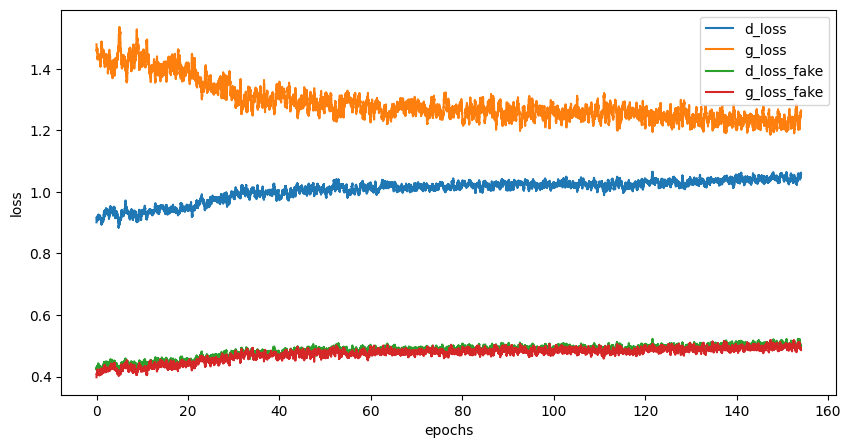

Epoch [155/160], Step[100/469], d_loss: 0.9873, d_loss_fake: 0.4576, g_loss: 1.2203, g_loss_fake: 0.4948, D(x): 0.65, D(G(z)): 0.32
Epoch [155/160], Step[200/469], d_loss: 1.2038, d_loss_fake: 0.6320, g_loss: 1.0834, g_loss_fake: 0.5598, D(x): 0.62, D(G(z)): 0.42
Epoch [155/160], Step[300/469], d_loss: 1.0168, d_loss_fake: 0.4558, g_loss: 1.2923, g_loss_fake: 0.4799, D(x): 0.63, D(G(z)): 0.33
Epoch [155/160], Step[400/469], d_loss: 1.0353, d_loss_fake: 0.5166, g_loss: 1.2864, g_loss_fake: 0.4323, D(x): 0.65, D(G(z)): 0.35


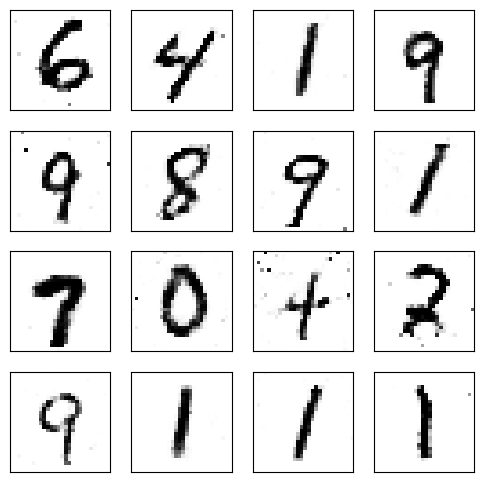

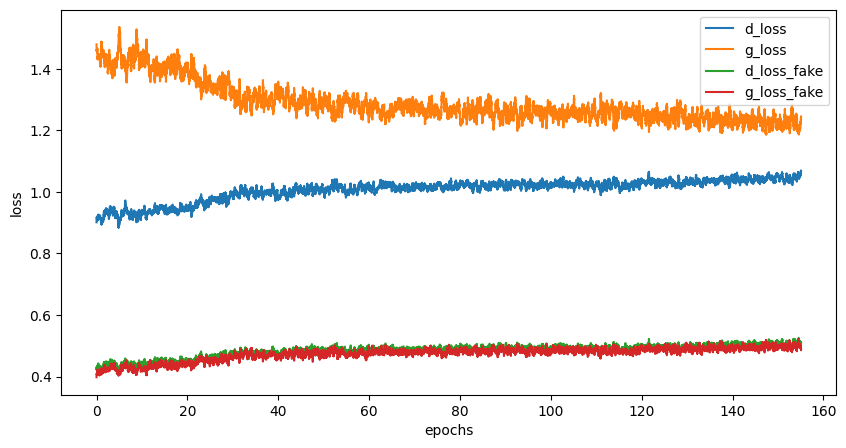

Epoch [156/160], Step[100/469], d_loss: 1.0725, d_loss_fake: 0.4601, g_loss: 1.2064, g_loss_fake: 0.5005, D(x): 0.62, D(G(z)): 0.32
Epoch [156/160], Step[200/469], d_loss: 1.1894, d_loss_fake: 0.6931, g_loss: 1.2307, g_loss_fake: 0.4652, D(x): 0.66, D(G(z)): 0.44
Epoch [156/160], Step[300/469], d_loss: 1.0535, d_loss_fake: 0.5152, g_loss: 1.1630, g_loss_fake: 0.5088, D(x): 0.65, D(G(z)): 0.36
Epoch [156/160], Step[400/469], d_loss: 1.0681, d_loss_fake: 0.6355, g_loss: 1.1145, g_loss_fake: 0.5394, D(x): 0.69, D(G(z)): 0.41


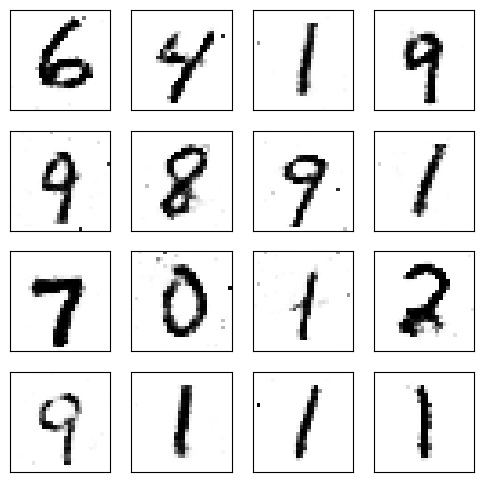

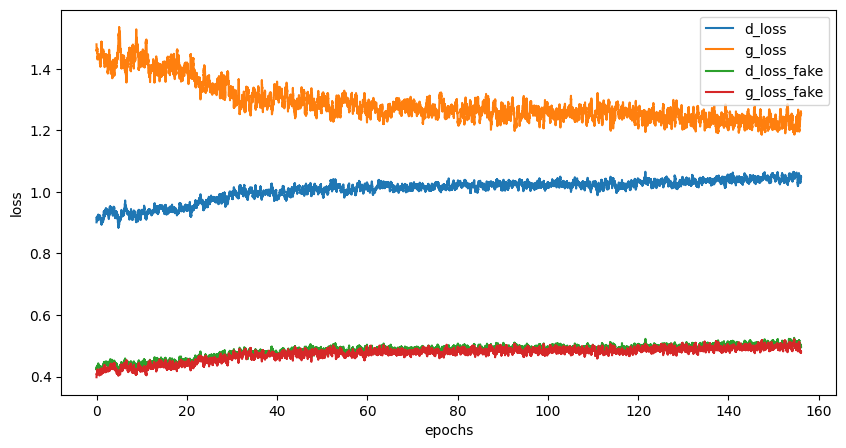

Epoch [157/160], Step[100/469], d_loss: 1.1330, d_loss_fake: 0.6617, g_loss: 1.1167, g_loss_fake: 0.5378, D(x): 0.68, D(G(z)): 0.42
Epoch [157/160], Step[200/469], d_loss: 1.0067, d_loss_fake: 0.5032, g_loss: 1.3507, g_loss_fake: 0.4563, D(x): 0.66, D(G(z)): 0.35
Epoch [157/160], Step[300/469], d_loss: 1.0360, d_loss_fake: 0.4682, g_loss: 1.2304, g_loss_fake: 0.5246, D(x): 0.63, D(G(z)): 0.34
Epoch [157/160], Step[400/469], d_loss: 1.1480, d_loss_fake: 0.5028, g_loss: 1.1863, g_loss_fake: 0.5100, D(x): 0.60, D(G(z)): 0.34


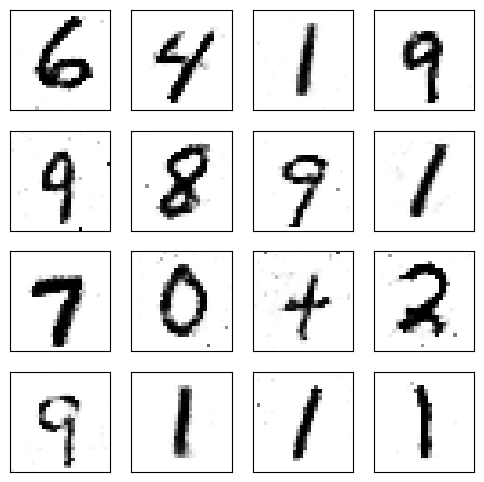

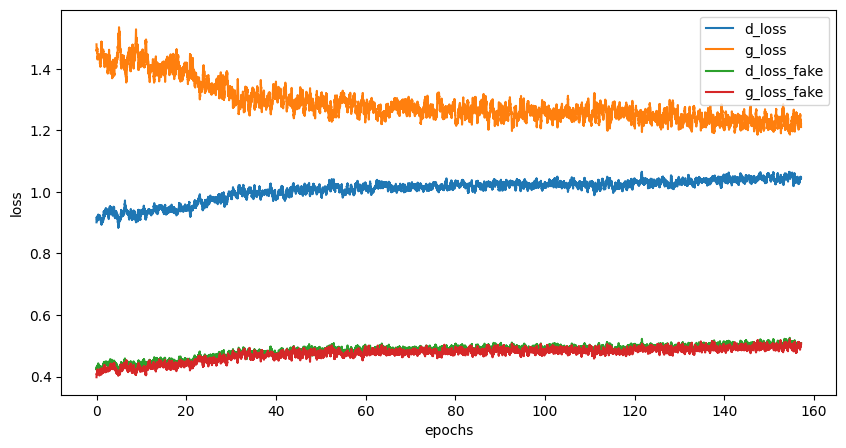

Epoch [158/160], Step[100/469], d_loss: 0.9639, d_loss_fake: 0.5074, g_loss: 1.0657, g_loss_fake: 0.6309, D(x): 0.69, D(G(z)): 0.36
Epoch [158/160], Step[200/469], d_loss: 1.0682, d_loss_fake: 0.4583, g_loss: 1.2294, g_loss_fake: 0.5475, D(x): 0.61, D(G(z)): 0.33
Epoch [158/160], Step[300/469], d_loss: 1.0678, d_loss_fake: 0.4708, g_loss: 1.3281, g_loss_fake: 0.4302, D(x): 0.62, D(G(z)): 0.33
Epoch [158/160], Step[400/469], d_loss: 1.1445, d_loss_fake: 0.5328, g_loss: 1.2148, g_loss_fake: 0.4930, D(x): 0.61, D(G(z)): 0.36


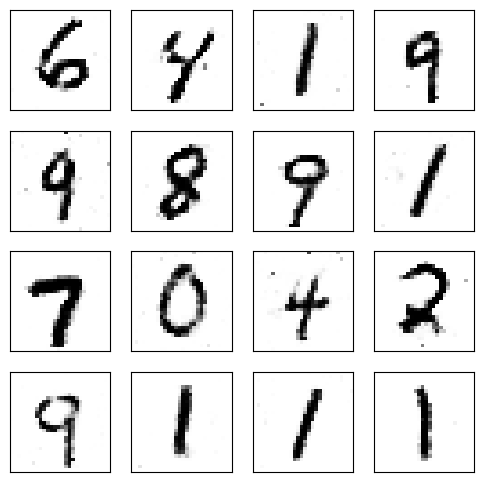

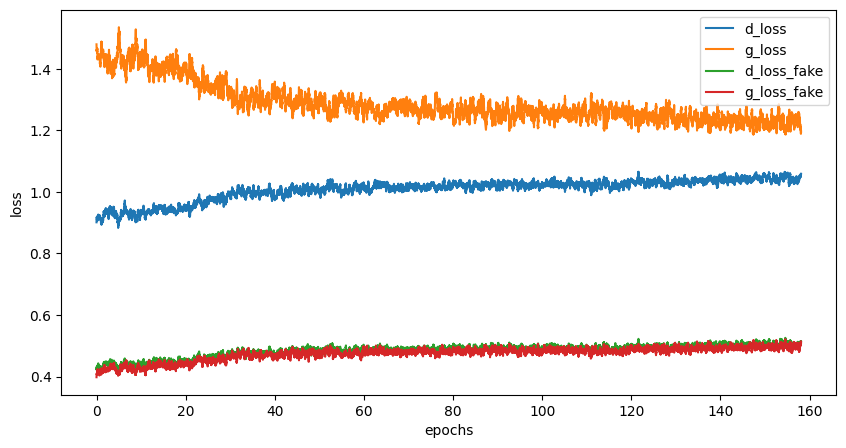

Epoch [159/160], Step[100/469], d_loss: 1.0665, d_loss_fake: 0.5220, g_loss: 1.2285, g_loss_fake: 0.4740, D(x): 0.64, D(G(z)): 0.36
Epoch [159/160], Step[200/469], d_loss: 0.9808, d_loss_fake: 0.4595, g_loss: 1.2397, g_loss_fake: 0.4446, D(x): 0.65, D(G(z)): 0.33
Epoch [159/160], Step[300/469], d_loss: 1.0066, d_loss_fake: 0.4614, g_loss: 1.5023, g_loss_fake: 0.3325, D(x): 0.65, D(G(z)): 0.33
Epoch [159/160], Step[400/469], d_loss: 0.9851, d_loss_fake: 0.4984, g_loss: 1.1850, g_loss_fake: 0.5037, D(x): 0.68, D(G(z)): 0.35


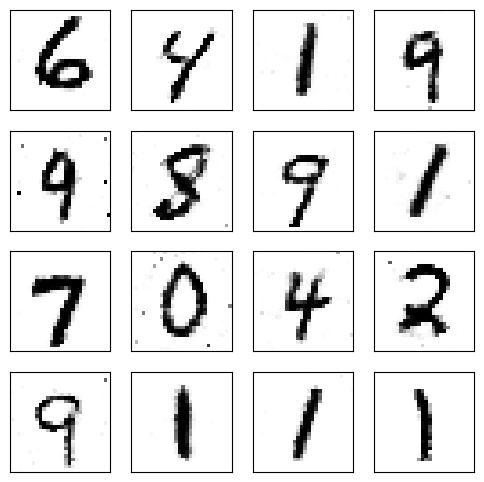

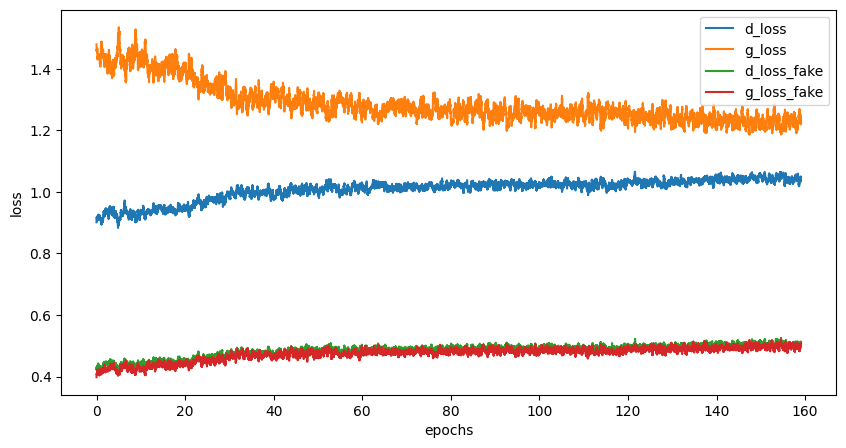

Epoch [160/160], Step[100/469], d_loss: 1.0402, d_loss_fake: 0.5599, g_loss: 1.1633, g_loss_fake: 0.5748, D(x): 0.68, D(G(z)): 0.38
Epoch [160/160], Step[200/469], d_loss: 0.9714, d_loss_fake: 0.5249, g_loss: 1.0886, g_loss_fake: 0.5754, D(x): 0.71, D(G(z)): 0.36
Epoch [160/160], Step[300/469], d_loss: 1.0811, d_loss_fake: 0.5434, g_loss: 1.3012, g_loss_fake: 0.4261, D(x): 0.64, D(G(z)): 0.37
Epoch [160/160], Step[400/469], d_loss: 0.9193, d_loss_fake: 0.4698, g_loss: 1.2880, g_loss_fake: 0.4295, D(x): 0.68, D(G(z)): 0.35


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

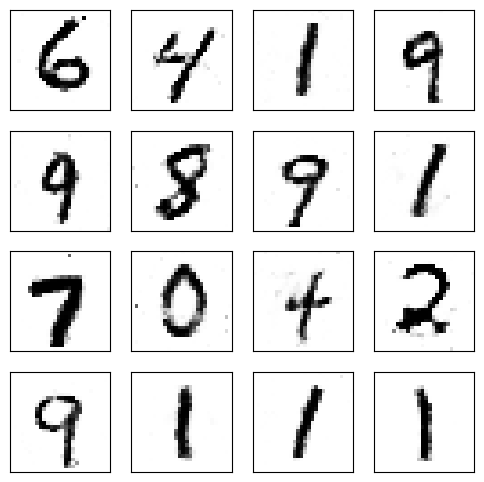

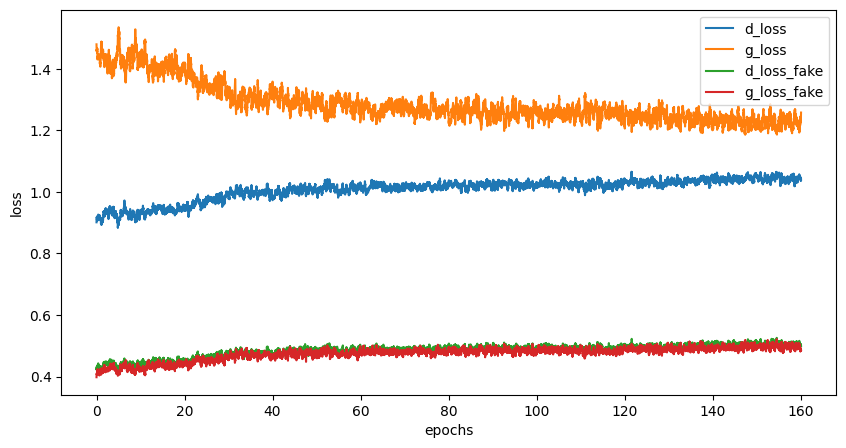

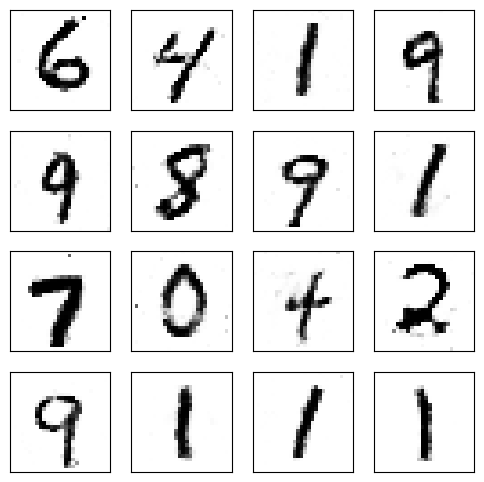

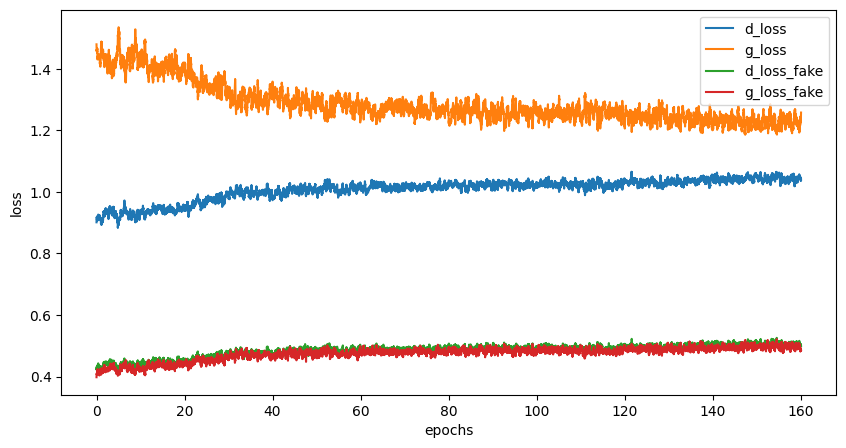

In [ ]:
# I have pretrained 60 epochs. So the epochs of the results below are epoch + 60
num_epochs = 160
d_losses, d_losses_fake, g_losses, g_losses_fake = train_main_loop(generator, discriminator, d_optimizer, g_optimizer, test_noise, num_epochs, d_freq, with_condition)
monitor_images(generator, test_noise, with_condition=with_condition)
monitor_losses(d_losses, d_losses_fake, g_losses, g_losses_fake)

# e. Ablation Study

In [ ]:
##################
### Problem 2: Ablation study 1, 2, and 3
##################


# **2. Conditional GAN**

In [ ]:
num_epochs = 500
dim_z = 100

num_test_samples = 16
test_noise = Variable(torch.randn(num_test_samples, dim_z).to(device))
d_freq = 1

with_condition = True

discriminator = Discriminator(with_condition=with_condition).to(device)
generator = Generator(with_condition=with_condition).to(device)

lr = 0.0002
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr)

d_losses, d_losses_fake, g_losses, g_losses_fake = train_main_loop(generator, discriminator, d_optimizer, g_optimizer, test_noise, num_epochs, d_freq, with_condition)
monitor_images(generator, test_noise, with_condition=with_condition)
monitor_losses(d_losses, d_losses_fake, g_losses, g_losses_fake)